In [2]:
import os
import sys
import math
import argparse
import numpy as np
from collections import Counter

# Keras imports
from tensorflow.keras.models import Model

# ML4CVD Imports
from ml4cvd.arguments import parse_args
from ml4cvd.hyperparameters import optimize_optimizer, optimize_conv_x, optimize_ecg_rest_architecture

%matplotlib inline
import matplotlib.pyplot as plt

# Paths
DATA_DIRECTORY = '/mnt/disks/ecg-rest-38k-tensors/2020-03-14/'

2020-06-09 09:45:49,877 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/hyperoptimize_conv_x_ecg_rest_rhythm_w_poor/log_2020-06-09_09-45_0.log.
2020-06-09 09:45:49,879 - arguments:402 - INFO - Command Line was: 
./scripts/tf.sh train --tensors /mnt/disks/ecg-rest-38k-tensors/2020-03-14/ --input_tensors ecg_rest --output_tensors ecg_rhythm_poor --batch_size 32 --epochs 24 --test_steps 96 --max_models 9 --id hyperoptimize_conv_x_ecg_rest_rhythm_w_poor

2020-06-09 09:45:49,880 - arguments:403 - INFO - Total TensorMaps: 6538 Arguments are Namespace(activation='relu', aligned_dimension=16, alpha=0.5, anneal_max=2.0, anneal_rate=0.0, anneal_shift=0.0, app_csv=None, b_slice_force=None, balance_csvs=[], batch_size=32, bigquery_credentials_file='/mnt/ml4cvd/projects/jamesp/bigquery/bigquery-viewer-credentials.json', bigquery_dataset='broad-ml4cvd.ukbb7089_r10data', block_size=3, bottleneck_type=<BottleneckType.FlattenRestructure: 1>, cache_si

input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 5000, 32)     2720        input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation (Activation)         (None, 5000, 32)     0           conv1d[0][0]                     
__________________________________________________________________________________________________
max_pooling1d (MaxPooling1D)    (None, 2500, 32)     0           activation[0][0]                 
__________________________________________________________________________________________________
conv1d_1 (Conv1D)               (None, 2500, 32)     7200        max_pooling1d[0][0]              
__________________________________________________________________________________________________
activation

__________________________________________________________________________________________________
  0%|          | 0/9 [00:00<?, ?it/s, best loss: ?]2020-06-09 09:46:03,437 - tensor_generators:653 - INFO - Found 26002 train, 7572 validation, and 3666 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 09:46:03,696 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 09:46:04,456 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps          
Epoch 1/24                                         
 1/72 [..............................]             
 - ETA: 10:44 - loss: 3.0902 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0

                                                   
13/72 [====>.........................]             
 - ETA: 44s - loss: 3.6727 - categorical_accuracy: 0.3245 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                   
14/72 [====>.........................]             
 - ETA: 40s - loss: 3.6019 - categorical_accuracy: 0.3170 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+0

                                                   
26/72 [=========>....................]             
 - ETA: 18s - loss: 3.7075 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                   
27/72 [==========>...................]             
 - ETA: 17s - loss: 3.6842 - categorical_accuracy: 0.3299 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+0

                                                   
39/72 [===============>..............]             
 - ETA: 9s - loss: 3.6768 - categorical_accuracy: 0.3373 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 
                                                  
40/72 [===============>..............]             
 - ETA: 9s - loss: 3.6675 - categorical_accuracy: 0.3367 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 

                                                  
52/72 [====================>.........]             
 - ETA: 4s - loss: 3.6603 - categorical_accuracy: 0.3353 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
53/72 [=====================>........]             
 - ETA: 4s - loss: 3.6391 - categorical_accuracy: 0.3384 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
65/72 [==========================>...]             
 - ETA: 1s - loss: 3.6531 - categorical_accuracy: 0.3375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
66/72 [==========================>...]             
 - ETA: 1s - loss: 3.6412 - categorical_accuracy: 0.3371 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

 4/72 [>.............................]             
 - ETA: 4s - loss: 3.2548 - categorical_accuracy: 0.3906 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 5/72 [=>............................]             
 - ETA: 4s - loss: 3.2363 - categorical_accuracy: 0.3938 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_r

                                                  
17/72 [======>.......................]             
 - ETA: 4s - loss: 3.5944 - categorical_accuracy: 0.3511 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
18/72 [======>.......................]             
 - ETA: 4s - loss: 3.5457 - categorical_accuracy: 0.3455 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
30/72 [===========>..................]             
 - ETA: 3s - loss: 3.4622 - categorical_accuracy: 0.3573 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0333 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0037 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
31/72 [===========>..................]             
 - ETA: 3s - loss: 3.4698 - categorical_accuracy: 0.3589 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0323 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
43/72 [================>.............]             
 - ETA: 2s - loss: 3.4417 - categorical_accuracy: 0.3641 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0581 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0068 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
44/72 [=================>............]             
 - ETA: 2s - loss: 3.4241 - categorical_accuracy: 0.3629 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0568 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
56/72 [======================>.......]             
 - ETA: 1s - loss: 3.3734 - categorical_accuracy: 0.3677 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1307 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0464 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
57/72 [======================>.......]             
 - ETA: 1s - loss: 3.3686 - categorical_accuracy: 0.3684 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1328 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
69/72 [===========================>..]             
 - ETA: 0s - loss: 3.4977 - categorical_accuracy: 0.3673 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1254 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0433 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
70/72 [============================>.]             
 - ETA: 0s - loss: 3.4853 - categorical_accuracy: 0.3665 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1236 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

 - ETA: 5s - loss: 3.9078 - categorical_accuracy: 0.3242 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 9/72 [==>...........................]             
 - ETA: 5s - loss: 4.3249 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_re

                                                  
21/72 [=======>......................]             
 - ETA: 4s - loss: 4.1950 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
22/72 [========>.....................]             
 - ETA: 4s - loss: 4.1776 - categorical_accuracy: 0.3139 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
34/72 [=============>................]             
 - ETA: 4s - loss: 3.8972 - categorical_accuracy: 0.3263 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
35/72 [=============>................]             
 - ETA: 4s - loss: 3.9167 - categorical_accuracy: 0.3277 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
47/72 [==================>...........]             
 - ETA: 2s - loss: 3.9134 - categorical_accuracy: 0.3344 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0284 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0052 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
48/72 [===================>..........]             
 - ETA: 2s - loss: 3.9420 - categorical_accuracy: 0.3320 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0278 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
60/72 [========================>.....]             
 - ETA: 1s - loss: 3.8453 - categorical_accuracy: 0.3292 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0222 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0041 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
61/72 [========================>.....]             
 - ETA: 1s - loss: 3.8277 - categorical_accuracy: 0.3304 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0219 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

Epoch 4/24                                         
 1/72 [..............................]             
 - ETA: 7s - loss: 3.9502 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 2/72 [..............................]             
 - ETA: 7s - loss: 3.6277 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 -

                                                  
14/72 [====>.........................]             
 - ETA: 5s - loss: 3.1851 - categorical_accuracy: 0.3795 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1429 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0104 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
15/72 [=====>........................]             
 - ETA: 5s - loss: 3.2326 - categorical_accuracy: 0.3667 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
27/72 [==========>...................]             
 - ETA: 5s - loss: 3.3516 - categorical_accuracy: 0.3449 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1111 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0116 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
28/72 [==========>...................]             
 - ETA: 5s - loss: 3.3692 - categorical_accuracy: 0.3471 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1071 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
40/72 [===============>..............]             
 - ETA: 3s - loss: 3.3446 - categorical_accuracy: 0.3508 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0750 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0078 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
41/72 [================>.............]             
 - ETA: 3s - loss: 3.4291 - categorical_accuracy: 0.3521 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0732 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
53/72 [=====================>........]             
 - ETA: 2s - loss: 3.5001 - categorical_accuracy: 0.3538 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0566 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0059 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
54/72 [=====================>........]             
 - ETA: 2s - loss: 3.4848 - categorical_accuracy: 0.3519 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0556 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
66/72 [==========================>...]             
 - ETA: 0s - loss: 3.4856 - categorical_accuracy: 0.3546 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0455 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0047 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
67/72 [==========================>...]             
 - ETA: 0s - loss: 3.4720 - categorical_accuracy: 0.3563 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0448 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
 6/72 [=>............................]             
 - ETA: 6s - loss: 3.8741 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4444 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0568 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 7/72 [=>............................]             
 - ETA: 5s - loss: 3.7946 - categorical_accuracy: 0.3616 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3810 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
19/72 [======>.......................]             
 - ETA: 4s - loss: 3.5902 - categorical_accuracy: 0.3520 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1404 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0179 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
20/72 [=======>......................]             
 - ETA: 4s - loss: 3.5139 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1333 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

 - ETA: 4s - loss: 3.6339 - categorical_accuracy: 0.3538 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1505 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0172 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
32/72 [============>.................]             
 - ETA: 4s - loss: 3.6552 - categorical_accuracy: 0.3486 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1458 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000

                                                  
44/72 [=================>............]             
 - ETA: 3s - loss: 3.6401 - categorical_accuracy: 0.3565 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1061 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0121 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
45/72 [=================>............]             
 - ETA: 2s - loss: 3.6135 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1037 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
57/72 [======================>.......]             
 - ETA: 1s - loss: 3.5887 - categorical_accuracy: 0.3547 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0819 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0093 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
58/72 [=======================>......]             
 - ETA: 1s - loss: 3.5773 - categorical_accuracy: 0.3540 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0977 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
70/72 [============================>.]             
 - ETA: 0s - loss: 3.6081 - categorical_accuracy: 0.3518 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0988 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0147 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
71/72 [============================>.]             
 - ETA: 0s - loss: 3.6061 - categorical_accuracy: 0.3526 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0974 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
10/72 [===>..........................]             
 - ETA: 5s - loss: 4.6609 - categorical_accuracy: 0.3344 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
11/72 [===>..........................]             
 - ETA: 5s - loss: 4.6968 - categorical_accuracy: 0.3523 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
23/72 [========>.....................]             
 - ETA: 4s - loss: 4.3136 - categorical_accuracy: 0.3342 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
24/72 [=========>....................]             
 - ETA: 4s - loss: 4.3533 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
36/72 [==============>...............]             
 - ETA: 3s - loss: 4.0231 - categorical_accuracy: 0.3455 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
37/72 [==============>...............]             
 - ETA: 3s - loss: 3.9917 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
49/72 [===================>..........]             
 - ETA: 2s - loss: 3.7715 - categorical_accuracy: 0.3489 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0374 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0058 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
50/72 [===================>..........]             
 - ETA: 2s - loss: 3.7400 - categorical_accuracy: 0.3506 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0367 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
62/72 [========================>.....]             
 - ETA: 1s - loss: 3.6996 - categorical_accuracy: 0.3548 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0296 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0046 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
63/72 [=========================>....]             
 - ETA: 1s - loss: 3.7185 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0291 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
 2/72 [..............................]             
 - ETA: 5s - loss: 3.0765 - categorical_accuracy: 0.2969 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 3/72 [>.............................]             
 - ETA: 6s - loss: 3.2657 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
15/72 [=====>........................]             
 - ETA: 5s - loss: 3.3723 - categorical_accuracy: 0.3354 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
16/72 [=====>........................]             
 - ETA: 5s - loss: 3.4682 - categorical_accuracy: 0.3379 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
28/72 [==========>...................]             
 - ETA: 4s - loss: 3.5359 - categorical_accuracy: 0.3471 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
29/72 [===========>..................]             
 - ETA: 4s - loss: 3.5012 - categorical_accuracy: 0.3459 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
41/72 [================>.............]             
 - ETA: 3s - loss: 3.6272 - categorical_accuracy: 0.3399 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
42/72 [================>.............]             
 - ETA: 3s - loss: 3.6018 - categorical_accuracy: 0.3393 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
54/72 [=====================>........]             
 - ETA: 2s - loss: 3.7363 - categorical_accuracy: 0.3345 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
55/72 [=====================>........]             
 - ETA: 1s - loss: 3.7453 - categorical_accuracy: 0.3341 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
67/72 [==========================>...]             
 - ETA: 0s - loss: 3.6951 - categorical_accuracy: 0.3335 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
68/72 [===========================>..]             
 - ETA: 0s - loss: 3.6850 - categorical_accuracy: 0.3336 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
 7/72 [=>............................]             
 - ETA: 6s - loss: 3.7652 - categorical_accuracy: 0.3661 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 8/72 [==>...........................]             
 - ETA: 6s - loss: 3.6542 - categorical_accuracy: 0.3672 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
20/72 [=======>......................]             
 - ETA: 4s - loss: 3.9104 - categorical_accuracy: 0.3422 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
21/72 [=======>......................]             
 - ETA: 4s - loss: 3.8994 - categorical_accuracy: 0.3378 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
33/72 [============>.................]             
 - ETA: 4s - loss: 3.6662 - categorical_accuracy: 0.3428 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
34/72 [=============>................]             
 - ETA: 4s - loss: 3.6400 - categorical_accuracy: 0.3419 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

 - ETA: 3s - loss: 3.7220 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0148 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0030 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
46/72 [==================>...........]             
 - ETA: 2s - loss: 3.6986 - categorical_accuracy: 0.3560 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0145 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000

                                                  
58/72 [=======================>......]             
 - ETA: 1s - loss: 3.5562 - categorical_accuracy: 0.3572 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0115 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0023 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
59/72 [=======================>......]             
 - ETA: 1s - loss: 3.5717 - categorical_accuracy: 0.3575 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0113 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
71/72 [============================>.]             
 - ETA: 0s - loss: 3.5739 - categorical_accuracy: 0.3644 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0235 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0056 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                   
Epoch 00008: val_loss did not improve from 3.44102
                                                  
72/72 [==============================]             
 - 9s 124ms/step - loss: 3.5947 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.02

                                                  
11/72 [===>..........................]             
 - ETA: 4s - loss: 3.4491 - categorical_accuracy: 0.2926 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
12/72 [====>.........................]             
 - ETA: 4s - loss: 3.4867 - categorical_accuracy: 0.2891 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
24/72 [=========>....................]             
 - ETA: 5s - loss: 3.5349 - categorical_accuracy: 0.3099 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
25/72 [=========>....................]             
 - ETA: 4s - loss: 3.5535 - categorical_accuracy: 0.3113 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
37/72 [==============>...............]             
 - ETA: 3s - loss: 3.5415 - categorical_accuracy: 0.3252 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
38/72 [==============>...............]             
 - ETA: 3s - loss: 3.5432 - categorical_accuracy: 0.3248 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
50/72 [===================>..........]             
 - ETA: 2s - loss: 3.4967 - categorical_accuracy: 0.3363 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
51/72 [====================>.........]             
 - ETA: 2s - loss: 3.5105 - categorical_accuracy: 0.3376 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
63/72 [=========================>....]             
 - ETA: 0s - loss: 3.4692 - categorical_accuracy: 0.3403 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
64/72 [=========================>....]             
 - ETA: 0s - loss: 3.4708 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

 - ETA: 6s - loss: 3.1510 - categorical_accuracy: 0.5000 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 2/72 [..............................]             
 - ETA: 6s - loss: 2.8566 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_re

                                                  
14/72 [====>.........................]             
 - ETA: 4s - loss: 3.4795 - categorical_accuracy: 0.3862 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
15/72 [=====>........................]             
 - ETA: 4s - loss: 3.6980 - categorical_accuracy: 0.3854 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
27/72 [==========>...................]             
 - ETA: 3s - loss: 3.7804 - categorical_accuracy: 0.3785 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
28/72 [==========>...................]             
 - ETA: 3s - loss: 3.7859 - categorical_accuracy: 0.3772 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
40/72 [===============>..............]             
 - ETA: 2s - loss: 3.6985 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0125 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0017 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                  
41/72 [================>.............]             
 - ETA: 2s - loss: 3.7177 - categorical_accuracy: 0.3758 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0122 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atri

                                                  
53/72 [=====================>........]             
 - ETA: 1s - loss: 3.7147 - categorical_accuracy: 0.3809 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0220 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0060 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
54/72 [=====================>........]             
 - ETA: 1s - loss: 3.6983 - categorical_accuracy: 0.3819 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0216 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
66/72 [==========================>...]             
 - ETA: 0s - loss: 3.6936 - categorical_accuracy: 0.3759 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0177 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0048 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
67/72 [==========================>...]             
 - ETA: 0s - loss: 3.7089 - categorical_accuracy: 0.3731 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0174 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

 - ETA: 6s - loss: 4.4201 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 6/72 [=>............................]             
 - ETA: 5s - loss: 4.5041 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_re

                                                  
18/72 [======>.......................]             
 - ETA: 4s - loss: 3.7571 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
19/72 [======>.......................]             
 - ETA: 4s - loss: 3.7100 - categorical_accuracy: 0.3553 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
31/72 [===========>..................]             
 - ETA: 3s - loss: 3.5636 - categorical_accuracy: 0.3478 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
32/72 [============>.................]             
 - ETA: 3s - loss: 3.5567 - categorical_accuracy: 0.3525 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
44/72 [=================>............]             
 - ETA: 2s - loss: 3.4713 - categorical_accuracy: 0.3558 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0114 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0021 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                  
45/72 [=================>............]             
 - ETA: 2s - loss: 3.4607 - categorical_accuracy: 0.3549 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0333 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atri

                                                  
57/72 [======================>.......]             
 - ETA: 1s - loss: 3.4536 - categorical_accuracy: 0.3564 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0263 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0033 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
58/72 [=======================>......]             
 - ETA: 1s - loss: 3.4337 - categorical_accuracy: 0.3588 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0259 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
70/72 [============================>.]             
 - ETA: 0s - loss: 3.4297 - categorical_accuracy: 0.3603 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0214 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0027 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
71/72 [============================>.]             
 - ETA: 0s - loss: 3.4209 - categorical_accuracy: 0.3596 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0211 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
10/72 [===>..........................]             
 - ETA: 5s - loss: 3.0957 - categorical_accuracy: 0.3531 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0222 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
11/72 [===>..........................]             
 - ETA: 5s - loss: 3.1927 - categorical_accuracy: 0.3523 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0909 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
23/72 [========>.....................]             
 - ETA: 3s - loss: 3.4721 - categorical_accuracy: 0.3655 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1667 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0434 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
24/72 [=========>....................]             
 - ETA: 3s - loss: 3.4882 - categorical_accuracy: 0.3672 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1806 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
35/72 [=============>................]             
 - ETA: 3s - loss: 3.5016 - categorical_accuracy: 0.3598 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1524 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0331 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
36/72 [==============>...............]             
 - ETA: 2s - loss: 3.4759 - categorical_accuracy: 0.3611 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1481 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
48/72 [===================>..........]             
 - ETA: 1s - loss: 3.5778 - categorical_accuracy: 0.3620 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1111 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0241 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
49/72 [===================>..........]             
 - ETA: 1s - loss: 3.5730 - categorical_accuracy: 0.3571 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1088 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
61/72 [========================>.....]             
 - ETA: 0s - loss: 3.5928 - categorical_accuracy: 0.3617 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0874 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0190 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
62/72 [========================>.....]             
 - ETA: 0s - loss: 3.6256 - categorical_accuracy: 0.3629 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0860 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

Epoch 13/24                                        
 1/72 [..............................]             
 - ETA: 5s - loss: 3.5370 - categorical_accuracy: 0.2500 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 2/72 [..............................]             
 - ETA: 4s - loss: 3.7976 - categorical_accuracy: 0.2500 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 -

                                                  
14/72 [====>.........................]             
 - ETA: 3s - loss: 3.0129 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
15/72 [=====>........................]             
 - ETA: 3s - loss: 3.0855 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - 

                                                  
27/72 [==========>...................]             
 - ETA: 2s - loss: 3.4912 - categorical_accuracy: 0.3380 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1111 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0123 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
28/72 [==========>...................]             
 - ETA: 2s - loss: 3.4701 - categorical_accuracy: 0.3371 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1071 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
40/72 [===============>..............]             
 - ETA: 1s - loss: 3.4758 - categorical_accuracy: 0.3492 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0095 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
41/72 [================>.............]             
 - ETA: 1s - loss: 3.5057 - categorical_accuracy: 0.3498 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1220 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
53/72 [=====================>........]             
 - ETA: 1s - loss: 3.4754 - categorical_accuracy: 0.3485 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0943 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0087 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
54/72 [=====================>........]             
 - ETA: 1s - loss: 3.4613 - categorical_accuracy: 0.3507 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0926 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
66/72 [==========================>...]             
 - ETA: 0s - loss: 3.4431 - categorical_accuracy: 0.3509 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0960 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0103 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
67/72 [==========================>...]             
 - ETA: 0s - loss: 3.4368 - categorical_accuracy: 0.3507 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1095 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
 6/72 [=>............................]             
 - ETA: 4s - loss: 3.4130 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6667 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0610 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 7/72 [=>............................]             
 - ETA: 4s - loss: 3.5019 - categorical_accuracy: 0.3527 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5714 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
19/72 [======>.......................]             
 - ETA: 3s - loss: 3.2435 - categorical_accuracy: 0.3421 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3158 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0295 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
20/72 [=======>......................]             
 - ETA: 3s - loss: 3.2214 - categorical_accuracy: 0.3469 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
32/72 [============>.................]             
 - ETA: 2s - loss: 3.0234 - categorical_accuracy: 0.3525 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2812 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0288 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
33/72 [============>.................]             
 - ETA: 2s - loss: 3.0001 - categorical_accuracy: 0.3532 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2727 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
45/72 [=================>............]             
 - ETA: 1s - loss: 3.1005 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3370 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0398 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
46/72 [==================>...........]             
 - ETA: 1s - loss: 3.1523 - categorical_accuracy: 0.3567 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3297 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
58/72 [=======================>......]             
 - ETA: 0s - loss: 3.2684 - categorical_accuracy: 0.3529 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3261 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0398 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
59/72 [=======================>......]             
 - ETA: 0s - loss: 3.2799 - categorical_accuracy: 0.3543 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3206 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
71/72 [============================>.]             
 - ETA: 0s - loss: 3.3307 - categorical_accuracy: 0.3539 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2946 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0353 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                   
Epoch 00014: val_loss did not improve from 3.20109
                                                  
72/72 [==============================]             
 - 5s 69ms/step - loss: 3.3144 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.290

                                                  
11/72 [===>..........................]             
 - ETA: 3s - loss: 3.0246 - categorical_accuracy: 0.3807 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4242 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0534 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
12/72 [====>.........................]             
 - ETA: 3s - loss: 3.2815 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4722 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
24/72 [=========>....................]             
 - ETA: 2s - loss: 3.4560 - categorical_accuracy: 0.3620 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4444 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0643 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
25/72 [=========>....................]             
 - ETA: 2s - loss: 3.4285 - categorical_accuracy: 0.3587 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4267 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
37/72 [==============>...............]             
 - ETA: 2s - loss: 3.4707 - categorical_accuracy: 0.3556 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3153 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0441 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
38/72 [==============>...............]             
 - ETA: 2s - loss: 3.4445 - categorical_accuracy: 0.3536 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3070 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
50/72 [===================>..........]             
 - ETA: 1s - loss: 3.3908 - categorical_accuracy: 0.3512 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2533 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0367 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
51/72 [====================>.........]             
 - ETA: 1s - loss: 3.3662 - categorical_accuracy: 0.3523 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2680 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
63/72 [=========================>....]             
 - ETA: 0s - loss: 3.3291 - categorical_accuracy: 0.3532 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3558 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0559 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
64/72 [=========================>....]             
 - ETA: 0s - loss: 3.3132 - categorical_accuracy: 0.3511 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3534 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
 3/72 [>.............................]             
 - ETA: 4s - loss: 4.0599 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6667 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0837 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 4/72 [>.............................]             
 - ETA: 4s - loss: 3.5450 - categorical_accuracy: 0.3906 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.7500 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
16/72 [=====>........................]             
 - ETA: 3s - loss: 3.7301 - categorical_accuracy: 0.3691 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0573 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
17/72 [======>.......................]             
 - ETA: 3s - loss: 3.6749 - categorical_accuracy: 0.3640 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4706 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
29/72 [===========>..................]             
 - ETA: 2s - loss: 3.5149 - categorical_accuracy: 0.3739 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6034 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0641 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
30/72 [===========>..................]             
 - ETA: 2s - loss: 3.5215 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5833 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
42/72 [================>.............]             
 - ETA: 1s - loss: 3.5748 - categorical_accuracy: 0.3638 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5992 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0829 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
43/72 [================>.............]             
 - ETA: 1s - loss: 3.5544 - categorical_accuracy: 0.3612 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5853 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

 - ETA: 1s - loss: 3.5798 - categorical_accuracy: 0.3628 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5448 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0806 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
55/72 [=====================>........]             
 - ETA: 1s - loss: 3.5800 - categorical_accuracy: 0.3631 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5530 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000

                                                  
67/72 [==========================>...]             
 - ETA: 0s - loss: 3.5696 - categorical_accuracy: 0.3601 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5883 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0946 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
68/72 [===========================>..]             
 - ETA: 0s - loss: 3.5749 - categorical_accuracy: 0.3598 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5870 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
 7/72 [=>............................]             
 - ETA: 4s - loss: 3.1732 - categorical_accuracy: 0.3884 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2857 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0254 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 8/72 [==>...........................]             
 - ETA: 4s - loss: 3.0796 - categorical_accuracy: 0.3945 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2500 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
20/72 [=======>......................]             
 - ETA: 3s - loss: 3.4389 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4833 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0605 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
21/72 [=======>......................]             
 - ETA: 3s - loss: 3.4029 - categorical_accuracy: 0.3601 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5079 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
34/72 [=============>................]             
 - ETA: 2s - loss: 3.2000 - categorical_accuracy: 0.3631 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5715 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1294 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
35/72 [=============>................]             
 - ETA: 2s - loss: 3.2117 - categorical_accuracy: 0.3616 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5837 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
47/72 [==================>...........]             
 - ETA: 1s - loss: 3.2384 - categorical_accuracy: 0.3677 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6244 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1478 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
48/72 [===================>..........]             
 - ETA: 1s - loss: 3.2210 - categorical_accuracy: 0.3691 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6270 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
60/72 [========================>.....]             
 - ETA: 0s - loss: 3.2039 - categorical_accuracy: 0.3812 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6127 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1389 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
61/72 [========================>.....]             
 - ETA: 0s - loss: 3.2120 - categorical_accuracy: 0.3822 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6027 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

 - 5s 69ms/step - loss: 3.3239 - categorical_accuracy: 0.3841 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6282 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1463 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.0463 - val_categorical_accuracy: 0.4340 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.8009 - val_Marked_sinus_bradycardia_precision: 0.0000e+00 - val_Other_sinus_rhythm_precision: 0.0000e+00 - val_Atrial_fibrillation_precision: 0.0000e+00 - val_Other_rhythm_precision: 0.0000e+00 - val_Normal_sinus_rhythm_recall: 0.0000e+00 - val_Sinus_bradycardia_recall: 0.1382 - val_Marked_sinus_bradycardi

                                                  
12/72 [====>.........................]             
 - ETA: 3s - loss: 3.6111 - categorical_accuracy: 0.4141 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6389 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1251 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
13/72 [====>.........................]             
 - ETA: 3s - loss: 3.5305 - categorical_accuracy: 0.4303 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5897 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
25/72 [=========>....................]             
 - ETA: 2s - loss: 3.4918 - categorical_accuracy: 0.4125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6167 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1140 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
26/72 [=========>....................]             
 - ETA: 2s - loss: 3.4648 - categorical_accuracy: 0.4099 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6314 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
38/72 [==============>...............]             
 - ETA: 1s - loss: 3.4085 - categorical_accuracy: 0.4145 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6709 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1444 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
39/72 [===============>..............]             
 - ETA: 1s - loss: 3.4154 - categorical_accuracy: 0.4151 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6708 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
51/72 [====================>.........]             
 - ETA: 1s - loss: 3.4847 - categorical_accuracy: 0.4069 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6914 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1570 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
52/72 [====================>.........]             
 - ETA: 1s - loss: 3.4930 - categorical_accuracy: 0.4044 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6973 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
64/72 [=========================>....]             
 - ETA: 0s - loss: 3.4684 - categorical_accuracy: 0.4038 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.7153 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1684 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
65/72 [==========================>...]             
 - ETA: 0s - loss: 3.4511 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.7197 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibri

                                                  
 3/72 [>.............................]             
 - ETA: 4s - loss: 3.9092 - categorical_accuracy: 0.4583 - Normal_sinus_rhythm_precision: 0.3333 - Sinus_bradycardia_precision: 0.6000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0278 - Sinus_bradycardia_recall: 0.2545 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                  
 4/72 [>.............................]             
 - ETA: 4s - loss: 3.7696 - categorical_accuracy: 0.4297 - Normal_sinus_rhythm_precision: 0.2500 - Sinus_bradycardia_precision: 0.7000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillat

                                                  
16/72 [=====>........................]             
 - ETA: 3s - loss: 3.7724 - categorical_accuracy: 0.4160 - Normal_sinus_rhythm_precision: 0.1875 - Sinus_bradycardia_precision: 0.8015 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0131 - Sinus_bradycardia_recall: 0.2327 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
17/72 [======>.......................]             
 - ETA: 3s - loss: 3.7791 - categorical_accuracy: 0.4191 - Normal_sinus_rhythm_precision: 0.1765 - Sinus_bradycardia_precision: 0.7936 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_prec

                                                  
29/72 [===========>..................]             
 - ETA: 2s - loss: 3.4661 - categorical_accuracy: 0.4709 - Normal_sinus_rhythm_precision: 0.2069 - Sinus_bradycardia_precision: 0.8675 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0142 - Sinus_bradycardia_recall: 0.2964 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
30/72 [===========>..................]             
 - ETA: 2s - loss: 3.4417 - categorical_accuracy: 0.4708 - Normal_sinus_rhythm_precision: 0.2000 - Sinus_bradycardia_precision: 0.8719 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_prec

                                                  
42/72 [================>.............]             
 - ETA: 1s - loss: 3.4110 - categorical_accuracy: 0.4814 - Normal_sinus_rhythm_precision: 0.2381 - Sinus_bradycardia_precision: 0.8694 - Marked_sinus_bradycardia_precision: 0.0238 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0167 - Sinus_bradycardia_recall: 0.3237 - Marked_sinus_bradycardia_recall: 0.0048 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                  
43/72 [================>.............]             
 - ETA: 1s - loss: 3.4255 - categorical_accuracy: 0.4869 - Normal_sinus_rhythm_precision: 0.2326 - Sinus_bradycardia_precision: 0.8724 - Marked_sinus_bradycardia_precision: 0.0233 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precisio

                                                  
55/72 [=====================>........]             
 - ETA: 0s - loss: 3.3086 - categorical_accuracy: 0.4926 - Normal_sinus_rhythm_precision: 0.2000 - Sinus_bradycardia_precision: 0.8719 - Marked_sinus_bradycardia_precision: 0.0364 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0140 - Sinus_bradycardia_recall: 0.3526 - Marked_sinus_bradycardia_recall: 0.0097 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
56/72 [======================>.......]             
 - ETA: 0s - loss: 3.2857 - categorical_accuracy: 0.4927 - Normal_sinus_rhythm_precision: 0.1964 - Sinus_bradycardia_precision: 0.8742 - Marked_sinus_bradycardia_precision: 0.0357 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
68/72 [===========================>..]             
 - ETA: 0s - loss: 3.2489 - categorical_accuracy: 0.5101 - Normal_sinus_rhythm_precision: 0.2206 - Sinus_bradycardia_precision: 0.8682 - Marked_sinus_bradycardia_precision: 0.0735 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0169 - Sinus_bradycardia_recall: 0.3717 - Marked_sinus_bradycardia_recall: 0.0176 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
69/72 [===========================>..]             
 - ETA: 0s - loss: 3.3085 - categorical_accuracy: 0.5113 - Normal_sinus_rhythm_precision: 0.2319 - Sinus_bradycardia_precision: 0.8701 - Marked_sinus_bradycardia_precision: 0.0725 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
 9/72 [==>...........................]             
 - ETA: 3s - loss: 2.8100 - categorical_accuracy: 0.5486 - Normal_sinus_rhythm_precision: 0.4074 - Sinus_bradycardia_precision: 0.9497 - Marked_sinus_bradycardia_precision: 0.4444 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0413 - Sinus_bradycardia_recall: 0.4329 - Marked_sinus_bradycardia_recall: 0.1667 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
10/72 [===>..........................]             
 - ETA: 3s - loss: 2.7287 - categorical_accuracy: 0.5562 - Normal_sinus_rhythm_precision: 0.4667 - Sinus_bradycardia_precision: 0.9548 - Marked_sinus_bradycardia_precision: 0.4000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
22/72 [========>.....................]             
 - ETA: 2s - loss: 3.0436 - categorical_accuracy: 0.5866 - Normal_sinus_rhythm_precision: 0.4394 - Sinus_bradycardia_precision: 0.9544 - Marked_sinus_bradycardia_precision: 0.4091 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0409 - Sinus_bradycardia_recall: 0.4927 - Marked_sinus_bradycardia_recall: 0.1318 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
23/72 [========>.....................]             
 - ETA: 2s - loss: 3.0297 - categorical_accuracy: 0.5829 - Normal_sinus_rhythm_precision: 0.4638 - Sinus_bradycardia_precision: 0.9564 - Marked_sinus_bradycardia_precision: 0.4348 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
36/72 [==============>...............]             
 - ETA: 2s - loss: 3.2124 - categorical_accuracy: 0.6207 - Normal_sinus_rhythm_precision: 0.5463 - Sinus_bradycardia_precision: 0.9513 - Marked_sinus_bradycardia_precision: 0.3472 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0510 - Sinus_bradycardia_recall: 0.4640 - Marked_sinus_bradycardia_recall: 0.1278 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
37/72 [==============>...............]             
 - ETA: 1s - loss: 3.2332 - categorical_accuracy: 0.6208 - Normal_sinus_rhythm_precision: 0.5586 - Sinus_bradycardia_precision: 0.9526 - Marked_sinus_bradycardia_precision: 0.3378 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
49/72 [===================>..........]             
 - ETA: 1s - loss: 3.1586 - categorical_accuracy: 0.6205 - Normal_sinus_rhythm_precision: 0.5034 - Sinus_bradycardia_precision: 0.9447 - Marked_sinus_bradycardia_precision: 0.2551 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0454 - Sinus_bradycardia_recall: 0.4519 - Marked_sinus_bradycardia_recall: 0.0939 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
50/72 [===================>..........]             
 - ETA: 1s - loss: 3.1555 - categorical_accuracy: 0.6206 - Normal_sinus_rhythm_precision: 0.5133 - Sinus_bradycardia_precision: 0.9418 - Marked_sinus_bradycardia_precision: 0.2500 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
62/72 [========================>.....]             
 - ETA: 0s - loss: 3.3295 - categorical_accuracy: 0.6265 - Normal_sinus_rhythm_precision: 0.4946 - Sinus_bradycardia_precision: 0.9257 - Marked_sinus_bradycardia_precision: 0.2339 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0443 - Sinus_bradycardia_recall: 0.4484 - Marked_sinus_bradycardia_recall: 0.0828 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
63/72 [=========================>....]             
 - ETA: 0s - loss: 3.3254 - categorical_accuracy: 0.6285 - Normal_sinus_rhythm_precision: 0.4868 - Sinus_bradycardia_precision: 0.9269 - Marked_sinus_bradycardia_precision: 0.2302 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
 3/72 [>.............................]             
 - ETA: 3s - loss: 2.7877 - categorical_accuracy: 0.6354 - Normal_sinus_rhythm_precision: 0.6667 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0667 - Sinus_bradycardia_recall: 0.4286 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                  
 4/72 [>.............................]             
 - ETA: 3s - loss: 2.6189 - categorical_accuracy: 0.6250 - Normal_sinus_rhythm_precision: 0.5000 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardia_precision: 0.2500 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_

                                                  
17/72 [======>.......................]             
 - ETA: 2s - loss: 2.7818 - categorical_accuracy: 0.6765 - Normal_sinus_rhythm_precision: 0.4706 - Sinus_bradycardia_precision: 0.9518 - Marked_sinus_bradycardia_precision: 0.2353 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0397 - Sinus_bradycardia_recall: 0.4481 - Marked_sinus_bradycardia_recall: 0.0608 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
18/72 [======>.......................]             
 - ETA: 2s - loss: 2.8137 - categorical_accuracy: 0.6788 - Normal_sinus_rhythm_precision: 0.5000 - Sinus_bradycardia_precision: 0.9545 - Marked_sinus_bradycardia_precision: 0.2222 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
30/72 [===========>..................]             
 - ETA: 2s - loss: 2.7893 - categorical_accuracy: 0.6958 - Normal_sinus_rhythm_precision: 0.5250 - Sinus_bradycardia_precision: 0.9354 - Marked_sinus_bradycardia_precision: 0.1667 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0659 - Sinus_bradycardia_recall: 0.5035 - Marked_sinus_bradycardia_recall: 0.0511 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
31/72 [===========>..................]             
 - ETA: 2s - loss: 2.7910 - categorical_accuracy: 0.6956 - Normal_sinus_rhythm_precision: 0.5403 - Sinus_bradycardia_precision: 0.9329 - Marked_sinus_bradycardia_precision: 0.1613 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
43/72 [================>.............]             
 - ETA: 1s - loss: 2.9663 - categorical_accuracy: 0.7020 - Normal_sinus_rhythm_precision: 0.5756 - Sinus_bradycardia_precision: 0.9321 - Marked_sinus_bradycardia_precision: 0.2093 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0800 - Sinus_bradycardia_recall: 0.5389 - Marked_sinus_bradycardia_recall: 0.0591 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
44/72 [=================>............]             
 - ETA: 1s - loss: 3.0358 - categorical_accuracy: 0.7010 - Normal_sinus_rhythm_precision: 0.5852 - Sinus_bradycardia_precision: 0.9245 - Marked_sinus_bradycardia_precision: 0.2273 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
56/72 [======================>.......]             
 - ETA: 0s - loss: 3.0261 - categorical_accuracy: 0.7037 - Normal_sinus_rhythm_precision: 0.5789 - Sinus_bradycardia_precision: 0.9257 - Marked_sinus_bradycardia_precision: 0.2679 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0179 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0756 - Sinus_bradycardia_recall: 0.5468 - Marked_sinus_bradycardia_recall: 0.0826 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0179 - Other_rhythm_recall: 0.0000e+00
                                                  
57/72 [======================>.......]             
 - ETA: 0s - loss: 3.0258 - categorical_accuracy: 0.7029 - Normal_sinus_rhythm_precision: 0.5863 - Sinus_bradycardia_precision: 0.9270 - Marked_sinus_bradycardia_precision: 0.2632 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0175 - Othe

                                                  
69/72 [===========================>..]             
 - ETA: 0s - loss: 2.9973 - categorical_accuracy: 0.7034 - Normal_sinus_rhythm_precision: 0.6147 - Sinus_bradycardia_precision: 0.9290 - Marked_sinus_bradycardia_precision: 0.2319 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0145 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0861 - Sinus_bradycardia_recall: 0.5716 - Marked_sinus_bradycardia_recall: 0.0743 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0145 - Other_rhythm_recall: 0.0000e+00
                                                  
70/72 [============================>.]             
 - ETA: 0s - loss: 3.0026 - categorical_accuracy: 0.7040 - Normal_sinus_rhythm_precision: 0.6060 - Sinus_bradycardia_precision: 0.9300 - Marked_sinus_bradycardia_precision: 0.2429 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0143 - Othe

                                                  
 9/72 [==>...........................]             
 - ETA: 3s - loss: 4.3051 - categorical_accuracy: 0.7118 - Normal_sinus_rhythm_precision: 0.7278 - Sinus_bradycardia_precision: 0.9000 - Marked_sinus_bradycardia_precision: 0.6667 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1875 - Sinus_bradycardia_recall: 0.7654 - Marked_sinus_bradycardia_recall: 0.2521 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
10/72 [===>..........................]             
 - ETA: 3s - loss: 4.0063 - categorical_accuracy: 0.7250 - Normal_sinus_rhythm_precision: 0.7550 - Sinus_bradycardia_precision: 0.9100 - Marked_sinus_bradycardia_precision: 0.6000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
22/72 [========>.....................]             
 - ETA: 2s - loss: 3.2405 - categorical_accuracy: 0.7202 - Normal_sinus_rhythm_precision: 0.7295 - Sinus_bradycardia_precision: 0.9499 - Marked_sinus_bradycardia_precision: 0.4773 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1183 - Sinus_bradycardia_recall: 0.6864 - Marked_sinus_bradycardia_recall: 0.1895 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
23/72 [========>.....................]             
 - ETA: 2s - loss: 3.2532 - categorical_accuracy: 0.7228 - Normal_sinus_rhythm_precision: 0.6978 - Sinus_bradycardia_precision: 0.9521 - Marked_sinus_bradycardia_precision: 0.4565 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
35/72 [=============>................]             
 - ETA: 2s - loss: 3.2740 - categorical_accuracy: 0.7357 - Normal_sinus_rhythm_precision: 0.7252 - Sinus_bradycardia_precision: 0.9649 - Marked_sinus_bradycardia_precision: 0.4143 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1147 - Sinus_bradycardia_recall: 0.6401 - Marked_sinus_bradycardia_recall: 0.1742 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
36/72 [==============>...............]             
 - ETA: 2s - loss: 3.2272 - categorical_accuracy: 0.7396 - Normal_sinus_rhythm_precision: 0.7051 - Sinus_bradycardia_precision: 0.9659 - Marked_sinus_bradycardia_precision: 0.4028 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
48/72 [===================>..........]             
 - ETA: 1s - loss: 3.1144 - categorical_accuracy: 0.7441 - Normal_sinus_rhythm_precision: 0.6955 - Sinus_bradycardia_precision: 0.9710 - Marked_sinus_bradycardia_precision: 0.4062 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0978 - Sinus_bradycardia_recall: 0.6228 - Marked_sinus_bradycardia_recall: 0.1895 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
49/72 [===================>..........]             
 - ETA: 1s - loss: 3.1019 - categorical_accuracy: 0.7468 - Normal_sinus_rhythm_precision: 0.7017 - Sinus_bradycardia_precision: 0.9716 - Marked_sinus_bradycardia_precision: 0.4184 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
61/72 [========================>.....]             
 - ETA: 0s - loss: 3.0427 - categorical_accuracy: 0.7505 - Normal_sinus_rhythm_precision: 0.7235 - Sinus_bradycardia_precision: 0.9598 - Marked_sinus_bradycardia_precision: 0.4016 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1089 - Sinus_bradycardia_recall: 0.6171 - Marked_sinus_bradycardia_recall: 0.1929 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
62/72 [========================>.....]             
 - ETA: 0s - loss: 3.0516 - categorical_accuracy: 0.7495 - Normal_sinus_rhythm_precision: 0.7118 - Sinus_bradycardia_precision: 0.9605 - Marked_sinus_bradycardia_precision: 0.4113 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

Epoch 23/24                                        
 1/72 [..............................]             
 - ETA: 4s - loss: 1.5969 - categorical_accuracy: 0.8750 - Normal_sinus_rhythm_precision: 1.0000 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardia_precision: 1.0000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0769 - Sinus_bradycardia_recall: 0.5000 - Marked_sinus_bradycardia_recall: 1.0000 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 3/72 [>.............................]             
 - ETA: 3s - loss: 2.0842 - categorical_accuracy: 0.7917 - Normal_sinus_rhythm_precision: 1.0000 - Sinus_bradycardia_precision: 0.9667 - Marked_sinus_bradycardia_precision: 0.6667 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.00

                                                  
15/72 [=====>........................]             
 - ETA: 3s - loss: 2.7041 - categorical_accuracy: 0.7750 - Normal_sinus_rhythm_precision: 0.8011 - Sinus_bradycardia_precision: 0.9517 - Marked_sinus_bradycardia_precision: 0.6000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1847 - Sinus_bradycardia_recall: 0.7231 - Marked_sinus_bradycardia_recall: 0.2967 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
16/72 [=====>........................]             
 - ETA: 3s - loss: 2.6737 - categorical_accuracy: 0.7812 - Normal_sinus_rhythm_precision: 0.8135 - Sinus_bradycardia_precision: 0.9547 - Marked_sinus_bradycardia_precision: 0.6250 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
28/72 [==========>...................]             
 - ETA: 2s - loss: 2.8887 - categorical_accuracy: 0.7511 - Normal_sinus_rhythm_precision: 0.8131 - Sinus_bradycardia_precision: 0.9185 - Marked_sinus_bradycardia_precision: 0.5893 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1592 - Sinus_bradycardia_recall: 0.7006 - Marked_sinus_bradycardia_recall: 0.2673 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
29/72 [===========>..................]             
 - ETA: 2s - loss: 2.8827 - categorical_accuracy: 0.7522 - Normal_sinus_rhythm_precision: 0.8080 - Sinus_bradycardia_precision: 0.9164 - Marked_sinus_bradycardia_precision: 0.5690 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
41/72 [================>.............]             
 - ETA: 1s - loss: 2.7645 - categorical_accuracy: 0.7485 - Normal_sinus_rhythm_precision: 0.8472 - Sinus_bradycardia_precision: 0.9331 - Marked_sinus_bradycardia_precision: 0.5244 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1620 - Sinus_bradycardia_recall: 0.7004 - Marked_sinus_bradycardia_recall: 0.2240 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
42/72 [================>.............]             
 - ETA: 1s - loss: 2.8085 - categorical_accuracy: 0.7470 - Normal_sinus_rhythm_precision: 0.8270 - Sinus_bradycardia_precision: 0.9347 - Marked_sinus_bradycardia_precision: 0.5119 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
55/72 [=====================>........]             
 - ETA: 0s - loss: 2.7041 - categorical_accuracy: 0.7619 - Normal_sinus_rhythm_precision: 0.8629 - Sinus_bradycardia_precision: 0.9397 - Marked_sinus_bradycardia_precision: 0.4939 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2044 - Sinus_bradycardia_recall: 0.7036 - Marked_sinus_bradycardia_recall: 0.2039 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
56/72 [======================>.......]             
 - ETA: 0s - loss: 2.6968 - categorical_accuracy: 0.7623 - Normal_sinus_rhythm_precision: 0.8654 - Sinus_bradycardia_precision: 0.9408 - Marked_sinus_bradycardia_precision: 0.4940 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
68/72 [===========================>..]             
 - ETA: 0s - loss: 2.7332 - categorical_accuracy: 0.7656 - Normal_sinus_rhythm_precision: 0.8751 - Sinus_bradycardia_precision: 0.9363 - Marked_sinus_bradycardia_precision: 0.4804 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0147 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2332 - Sinus_bradycardia_recall: 0.7150 - Marked_sinus_bradycardia_recall: 0.2152 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0147 - Other_rhythm_recall: 0.0000e+00
                                                  
69/72 [===========================>..]             
 - ETA: 0s - loss: 2.7496 - categorical_accuracy: 0.7654 - Normal_sinus_rhythm_precision: 0.8711 - Sinus_bradycardia_precision: 0.9343 - Marked_sinus_bradycardia_precision: 0.4879 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0145 - Othe

                                                  
 8/72 [==>...........................]             
 - ETA: 3s - loss: 2.7543 - categorical_accuracy: 0.8086 - Normal_sinus_rhythm_precision: 0.7937 - Sinus_bradycardia_precision: 0.9571 - Marked_sinus_bradycardia_precision: 0.5000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2465 - Sinus_bradycardia_recall: 0.7635 - Marked_sinus_bradycardia_recall: 0.2271 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
 9/72 [==>...........................]             
 - ETA: 3s - loss: 2.5550 - categorical_accuracy: 0.8229 - Normal_sinus_rhythm_precision: 0.8167 - Sinus_bradycardia_precision: 0.9619 - Marked_sinus_bradycardia_precision: 0.5556 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
21/72 [=======>......................]             
 - ETA: 2s - loss: 2.6816 - categorical_accuracy: 0.7812 - Normal_sinus_rhythm_precision: 0.8444 - Sinus_bradycardia_precision: 0.9464 - Marked_sinus_bradycardia_precision: 0.5714 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2252 - Sinus_bradycardia_recall: 0.7503 - Marked_sinus_bradycardia_recall: 0.2675 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
22/72 [========>.....................]             
 - ETA: 2s - loss: 2.6941 - categorical_accuracy: 0.7827 - Normal_sinus_rhythm_precision: 0.8515 - Sinus_bradycardia_precision: 0.9488 - Marked_sinus_bradycardia_precision: 0.5455 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
34/72 [=============>................]             
 - ETA: 2s - loss: 2.7491 - categorical_accuracy: 0.7868 - Normal_sinus_rhythm_precision: 0.8441 - Sinus_bradycardia_precision: 0.9508 - Marked_sinus_bradycardia_precision: 0.5294 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2550 - Sinus_bradycardia_recall: 0.7650 - Marked_sinus_bradycardia_recall: 0.2401 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
35/72 [=============>................]             
 - ETA: 2s - loss: 2.7127 - categorical_accuracy: 0.7893 - Normal_sinus_rhythm_precision: 0.8438 - Sinus_bradycardia_precision: 0.9522 - Marked_sinus_bradycardia_precision: 0.5429 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
47/72 [==================>...........]             
 - ETA: 1s - loss: 2.6083 - categorical_accuracy: 0.7959 - Normal_sinus_rhythm_precision: 0.8592 - Sinus_bradycardia_precision: 0.9631 - Marked_sinus_bradycardia_precision: 0.5319 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2724 - Sinus_bradycardia_recall: 0.7631 - Marked_sinus_bradycardia_recall: 0.2379 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
48/72 [===================>..........]             
 - ETA: 1s - loss: 2.5913 - categorical_accuracy: 0.7949 - Normal_sinus_rhythm_precision: 0.8621 - Sinus_bradycardia_precision: 0.9618 - Marked_sinus_bradycardia_precision: 0.5417 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
60/72 [========================>.....]             
 - ETA: 0s - loss: 2.5506 - categorical_accuracy: 0.7943 - Normal_sinus_rhythm_precision: 0.8822 - Sinus_bradycardia_precision: 0.9599 - Marked_sinus_bradycardia_precision: 0.5611 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2880 - Sinus_bradycardia_recall: 0.7646 - Marked_sinus_bradycardia_recall: 0.2546 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
61/72 [========================>.....]             
 - ETA: 0s - loss: 2.5336 - categorical_accuracy: 0.7961 - Normal_sinus_rhythm_precision: 0.8841 - Sinus_bradycardia_precision: 0.9606 - Marked_sinus_bradycardia_precision: 0.5683 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

  0%|          | 0/9 [02:47<?, ?it/s, best loss: ?]2020-06-09 09:48:48,699 - tensor_generators:238 - INFO - Stopped 8 workers. 
Categorical TensorMap: ecg_rhythm has 26004 total examples.
	Label Normal_sinus_rhythm 12018 examples, 46.22% of total.
	Label Sinus_bradycardia 9186 examples, 35.33% of total.
	Label Marked_sinus_bradycardia 2497 examples, 9.60% of total.
	Label Other_sinus_rhythm 1698 examples, 6.53% of total.
	Label Atrial_fibrillation 341 examples, 1.31% of total.
	Label Other_rhythm 264 examples, 1.02% of total.
2020-06-09 09:48:48,700 - tensor_generators:238 - INFO - Stopped 4 workers. 
Categorical TensorMap: ecg_rhythm has 7572 total examples.
	Label Normal_sinus_rhythm 3572 examples, 47.17% of total.
	Label Sinus_bradycardia 2589 examples, 34.19% of total.
	Label Marked_sinus_bradycardia 689 examples, 9.10% of total.
	Label Other_sinus_rhythm 520 examples, 6.87% of total.
	Label Atrial_fibrillation 130 examples, 1.72% of total.
	Label Other_rhythm 72 examples, 0.95% of

                                                  
1088/3072 [=========>....................]         
 - ETA: 2s - loss: 2.7205 - categorical_accuracy: 0.7996 - Normal_sinus_rhythm_precision: 0.8112 - Sinus_bradycardia_precision: 0.9376 - Marked_sinus_bradycardia_precision: 0.4412 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1656 - Sinus_bradycardia_recall: 0.6515 - Marked_sinus_bradycardia_recall: 0.1248 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
1184/3072 [==========>...................]         
 - ETA: 2s - loss: 2.6341 - categorical_accuracy: 0.8024 - Normal_sinus_rhythm_precision: 0.8175 - Sinus_bradycardia_precision: 0.9427 - Marked_sinus_bradycardia_precision: 0.4595 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

                                                  
2336/3072 [=====================>........]         
 - ETA: 0s - loss: 2.6822 - categorical_accuracy: 0.7885 - Normal_sinus_rhythm_precision: 0.8484 - Sinus_bradycardia_precision: 0.9488 - Marked_sinus_bradycardia_precision: 0.4110 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1679 - Sinus_bradycardia_recall: 0.6726 - Marked_sinus_bradycardia_recall: 0.1285 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                  
2432/3072 [======================>.......]         
 - ETA: 0s - loss: 2.6644 - categorical_accuracy: 0.7870 - Normal_sinus_rhythm_precision: 0.8502 - Sinus_bradycardia_precision: 0.9467 - Marked_sinus_bradycardia_precision: 0.3947 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.000

Model: "model_1"                                                             
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d_10 (Conv1D)              (None, 5000, 32)     15776       input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation_13 (Activation)      (None, 5000, 32)     0           conv1d_10[0][0]                  
__________________________________________________________________________________________________
max_pooling1d_4 (MaxPooling1D)  (None, 2500, 32)     0           activation_13[0][0]              
_______________________________

output_ecg_rhythm_categorical ( (None, 6)            390         activation_24[0][0]              
Total params: 673,422                                                        
Trainable params: 673,422                                                    
Non-trainable params: 0                                                      
__________________________________________________________________________________________________
 11%|█         | 1/9 [02:55<23:17, 174.71s/it, best loss: 2.7664523671070733]2020-06-09 09:48:58,084 - tensor_generators:653 - INFO - Found 25967 train, 7540 validation, and 3733 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 09:48:58,527 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 09:48:59,012 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps                                    
Epoch 1/24                  

                                                                             
11/72 [===>..........................]                                       
 - ETA: 41s - loss: 4.1349 - categorical_accuracy: 0.0881 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
12/72 [====>.........................]                                       
 - ETA: 37s - loss: 4.3145 - categorical_accuracy: 0.0911 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precisio

                                                                             
23/72 [========>.....................]                                       
 - ETA: 18s - loss: 3.9274 - categorical_accuracy: 0.1114 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
24/72 [=========>....................]                                       
 - ETA: 17s - loss: 3.9206 - categorical_accuracy: 0.1094 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precisio

                                                                             
35/72 [=============>................]                                       
 - ETA: 10s - loss: 3.8370 - categorical_accuracy: 0.1223 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
36/72 [==============>...............]                                       
 - ETA: 9s - loss: 3.8462 - categorical_accuracy: 0.1215 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision

                                                                            
47/72 [==================>...........]                                       
 - ETA: 5s - loss: 4.0588 - categorical_accuracy: 0.1602 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
48/72 [===================>..........]                                       
 - ETA: 5s - loss: 4.0349 - categorical_accuracy: 0.1673 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
59/72 [=======================>......]                                       
 - ETA: 2s - loss: 3.9759 - categorical_accuracy: 0.2018 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
60/72 [========================>.....]                                       
 - ETA: 2s - loss: 3.9745 - categorical_accuracy: 0.2042 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
71/72 [============================>.]                                       
 - ETA: 0s - loss: 3.8933 - categorical_accuracy: 0.2232 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
Epoch 00001: val_loss improved from inf to 3.64543, saving model to ./recipes_output/hyperoptimize_conv_x_ecg_rest_rhythm_w_poor/plots/architecture_2/architecture_2.h5
                                          

 - ETA: 6s - loss: 4.3819 - categorical_accuracy: 0.3333 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
10/72 [===>..........................]                                       
 - ETA: 6s - loss: 4.3482 - categorical_accuracy: 0.3406 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_r

                                                                            
21/72 [=======>......................]                                       
 - ETA: 5s - loss: 3.8327 - categorical_accuracy: 0.3586 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
22/72 [========>.....................]                                       
 - ETA: 5s - loss: 3.7737 - categorical_accuracy: 0.3580 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
33/72 [============>.................]                                       
 - ETA: 4s - loss: 3.4571 - categorical_accuracy: 0.3703 - Normal_sinus_rhythm_precision: 0.0152 - Sinus_bradycardia_precision: 0.0413 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0019 - Sinus_bradycardia_recall: 0.0226 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                                            
34/72 [=============>................]                                       
 - ETA: 4s - loss: 3.4335 - categorical_accuracy: 0.3741 - Normal_sinus_rhythm_precision: 0.0147 - Sinus_bradycardia_precision: 0.0401 - Mark

                                                                            
45/72 [=================>............]                                       
 - ETA: 2s - loss: 3.4951 - categorical_accuracy: 0.3819 - Normal_sinus_rhythm_precision: 0.0111 - Sinus_bradycardia_precision: 0.0303 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0014 - Sinus_bradycardia_recall: 0.0165 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
46/72 [==================>...........]                                       
 - ETA: 2s - loss: 3.5011 - categorical_accuracy: 0.3825 - Normal_sinus_rhythm_precision: 0.0109 - Sinus_bradycardia_precision: 0.0296 - Marked_sinus

                                                                            
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.5289 - categorical_accuracy: 0.3723 - Normal_sinus_rhythm_precision: 0.0088 - Sinus_bradycardia_precision: 0.0239 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0011 - Sinus_bradycardia_recall: 0.0131 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.5369 - categorical_accuracy: 0.3707 - Normal_sinus_rhythm_precision: 0.0086 - Sinus_bradycardia_precision: 0.0235 - Marked_sinus

                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.5818 - categorical_accuracy: 0.3587 - Normal_sinus_rhythm_precision: 0.0072 - Sinus_bradycardia_precision: 0.0197 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 9.0580e-04 - Sinus_bradycardia_recall: 0.0108 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
70/72 [============================>.]                                       
 - ETA: 0s - loss: 3.5707 - categorical_accuracy: 0.3585 - Normal_sinus_rhythm_precision: 0.0071 - Sinus_bradycardia_precision: 0.0195 - Marked_s

                                                                            
 8/72 [==>...........................]                                       
 - ETA: 6s - loss: 3.4462 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 9/72 [==>...........................]                                       
 - ETA: 6s - loss: 3.3990 - categorical_accuracy: 0.3299 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
20/72 [=======>......................]                                       
 - ETA: 6s - loss: 3.3299 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1417 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0227 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
21/72 [=======>......................]                                       
 - ETA: 5s - loss: 3.3081 - categorical_accuracy: 0.3289 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1825 - 

                                                                            
32/72 [============>.................]                                       
 - ETA: 4s - loss: 3.3712 - categorical_accuracy: 0.3271 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1823 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0272 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
33/72 [============>.................]                                       
 - ETA: 4s - loss: 3.3400 - categorical_accuracy: 0.3305 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1768 - 

                                                                            
44/72 [=================>............]                                       
 - ETA: 3s - loss: 3.3057 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1439 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0223 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
45/72 [=================>............]                                       
 - ETA: 2s - loss: 3.3164 - categorical_accuracy: 0.3458 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1519 - 

                                                                            
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.2646 - categorical_accuracy: 0.3510 - Normal_sinus_rhythm_precision: 0.0179 - Sinus_bradycardia_precision: 0.2158 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0013 - Sinus_bradycardia_recall: 0.0415 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.3089 - categorical_accuracy: 0.3498 - Normal_sinus_rhythm_precision: 0.0175 - Sinus_bradycardia_precision: 0.2120 - Marked_sinus

                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.4319 - categorical_accuracy: 0.3506 - Normal_sinus_rhythm_precision: 0.0147 - Sinus_bradycardia_precision: 0.1777 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0011 - Sinus_bradycardia_recall: 0.0342 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.4388 - categorical_accuracy: 0.3510 - Normal_sinus_rhythm_precision: 0.0145 - Sinus_bradycardia_precision: 0.1751 - Marked_sinus

                                                                            
 7/72 [=>............................]                                       
 - ETA: 6s - loss: 3.2753 - categorical_accuracy: 0.3705 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 8/72 [==>...........................]                                       
 - ETA: 6s - loss: 3.1817 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
19/72 [======>.......................]                                       
 - ETA: 5s - loss: 3.7097 - categorical_accuracy: 0.3553 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1579 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0181 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
20/72 [=======>......................]                                       
 - ETA: 5s - loss: 3.7151 - categorical_accuracy: 0.3625 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1500 - 

                                                                            
31/72 [===========>..................]                                       
 - ETA: 4s - loss: 3.4878 - categorical_accuracy: 0.3831 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0968 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0111 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
32/72 [============>.................]                                       
 - ETA: 4s - loss: 3.4655 - categorical_accuracy: 0.3848 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1094 - 

                                                                            
43/72 [================>.............]                                       
 - ETA: 3s - loss: 3.4051 - categorical_accuracy: 0.3837 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1699 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1103 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
44/72 [=================>............]                                       
 - ETA: 3s - loss: 3.4506 - categorical_accuracy: 0.3821 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1661 - 

                                                                            
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.5509 - categorical_accuracy: 0.3830 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1328 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0862 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.5537 - categorical_accuracy: 0.3828 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1305 - 

                                                                            
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.5566 - categorical_accuracy: 0.3820 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1091 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0708 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.5471 - categorical_accuracy: 0.3819 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1075 - 

                                                                            
 6/72 [=>............................]                                       
 - ETA: 6s - loss: 2.9149 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2333 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0556 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 7/72 [=>............................]                                       
 - ETA: 6s - loss: 2.8777 - categorical_accuracy: 0.3348 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2476 - 

                                                                            
18/72 [======>.......................]                                       
 - ETA: 5s - loss: 3.6995 - categorical_accuracy: 0.3247 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1981 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0598 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
19/72 [======>.......................]                                       
 - ETA: 5s - loss: 3.6740 - categorical_accuracy: 0.3289 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1877 - 

                                                                            
30/72 [===========>..................]                                       
 - ETA: 4s - loss: 3.6404 - categorical_accuracy: 0.3479 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1189 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0359 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
31/72 [===========>..................]                                       
 - ETA: 4s - loss: 3.6127 - categorical_accuracy: 0.3488 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1151 - 

                                                                            
42/72 [================>.............]                                       
 - ETA: 3s - loss: 3.6253 - categorical_accuracy: 0.3385 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0849 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0256 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
43/72 [================>.............]                                       
 - ETA: 3s - loss: 3.6028 - categorical_accuracy: 0.3343 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0829 - 

                                                                            
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.6616 - categorical_accuracy: 0.3293 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0660 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0199 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.6395 - categorical_accuracy: 0.3313 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0648 - 

                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.6300 - categorical_accuracy: 0.3272 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0540 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0163 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.6279 - categorical_accuracy: 0.3265 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0532 - 

                                                                            
 5/72 [=>............................]                                       
 - ETA: 6s - loss: 3.1501 - categorical_accuracy: 0.3250 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4943 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1437 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 6/72 [=>............................]                                       
 - ETA: 6s - loss: 3.0123 - categorical_accuracy: 0.3385 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4786 - 

                                                                            
17/72 [======>.......................]                                       
 - ETA: 6s - loss: 3.5202 - categorical_accuracy: 0.3456 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2620 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0719 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
18/72 [======>.......................]                                       
 - ETA: 5s - loss: 3.6341 - categorical_accuracy: 0.3455 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2475 - 

                                                                            
29/72 [===========>..................]                                       
 - ETA: 4s - loss: 3.5712 - categorical_accuracy: 0.3664 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1536 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0421 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
30/72 [===========>..................]                                       
 - ETA: 4s - loss: 3.5428 - categorical_accuracy: 0.3635 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1485 - 

                                                                            
41/72 [================>.............]                                       
 - ETA: 3s - loss: 3.4703 - categorical_accuracy: 0.3598 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1087 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0298 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
42/72 [================>.............]                                       
 - ETA: 3s - loss: 3.4436 - categorical_accuracy: 0.3601 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1061 - 

                                                                            
53/72 [=====================>........]                                       
 - ETA: 2s - loss: 3.4537 - categorical_accuracy: 0.3479 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0841 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0231 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.4381 - categorical_accuracy: 0.3484 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0825 - 

                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.4171 - categorical_accuracy: 0.3510 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0816 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0270 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.4352 - categorical_accuracy: 0.3532 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0854 - 

 - ETA: 6s - loss: 4.2817 - categorical_accuracy: 0.3854 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3333 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0499 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 4/72 [>.............................]                                       
 - ETA: 6s - loss: 3.8564 - categorical_accuracy: 0.3906 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3750 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precis

                                                                            
15/72 [=====>........................]                                       
 - ETA: 6s - loss: 3.4490 - categorical_accuracy: 0.3771 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3333 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0436 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
16/72 [=====>........................]                                       
 - ETA: 6s - loss: 3.5069 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3125 - 

                                                                            
27/72 [==========>...................]                                       
 - ETA: 5s - loss: 3.6526 - categorical_accuracy: 0.3588 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2469 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0329 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                       
 - ETA: 4s - loss: 3.6264 - categorical_accuracy: 0.3616 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2381 - 

                                                                            
39/72 [===============>..............]                                       
 - ETA: 3s - loss: 3.5351 - categorical_accuracy: 0.3550 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1709 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0228 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 3s - loss: 3.5522 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1667 - 

                                                                            
51/72 [====================>.........]                                       
 - ETA: 2s - loss: 3.4849 - categorical_accuracy: 0.3487 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1699 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0213 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 2s - loss: 3.5182 - categorical_accuracy: 0.3504 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1667 - 

                                                                            
63/72 [=========================>....]                                       
 - ETA: 1s - loss: 3.4252 - categorical_accuracy: 0.3601 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1860 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0296 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.4517 - categorical_accuracy: 0.3608 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1866 - 

                                                                            
 2/72 [..............................]                                       
 - ETA: 7s - loss: 2.3614 - categorical_accuracy: 0.2812 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 3/72 [>.............................]                                       
 - ETA: 6s - loss: 2.4065 - categorical_accuracy: 0.3021 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
14/72 [====>.........................]                                       
 - ETA: 6s - loss: 3.6221 - categorical_accuracy: 0.3147 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                       
 - ETA: 6s - loss: 3.5530 - categorical_accuracy: 0.3250 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
26/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.4811 - categorical_accuracy: 0.3173 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                       
 - ETA: 5s - loss: 3.5455 - categorical_accuracy: 0.3183 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
38/72 [==============>...............]                                       
 - ETA: 4s - loss: 3.5061 - categorical_accuracy: 0.3421 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0259 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0117 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
39/72 [===============>..............]                                       
 - ETA: 3s - loss: 3.5191 - categorical_accuracy: 0.3429 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0362 - 

 - ETA: 2s - loss: 3.6285 - categorical_accuracy: 0.3444 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0441 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0213 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.6327 - categorical_accuracy: 0.3450 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0432 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precis

                                                                            
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.6119 - categorical_accuracy: 0.3494 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0354 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0171 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.6253 - categorical_accuracy: 0.3478 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0349 - 

Epoch 9/24                                                                   
 1/72 [..............................]                                       
 - ETA: 8s - loss: 2.1037 - categorical_accuracy: 0.5000 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 8s - loss: 3.0640 - categorical_accuracy: 0.5312 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 

                                                                            
13/72 [====>.........................]                                       
 - ETA: 6s - loss: 4.3851 - categorical_accuracy: 0.3798 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0513 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0128 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 6s - loss: 4.2806 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0476 - 

                                                                            
25/72 [=========>....................]                                       
 - ETA: 4s - loss: 4.0107 - categorical_accuracy: 0.3600 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0267 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0067 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 4.0795 - categorical_accuracy: 0.3618 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0256 - 

                                                                            
37/72 [==============>...............]                                       
 - ETA: 3s - loss: 4.0020 - categorical_accuracy: 0.3615 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0180 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0045 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.9696 - categorical_accuracy: 0.3660 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0175 - 

                                                                            
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.8055 - categorical_accuracy: 0.3597 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0238 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0063 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.7758 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0300 - 

                                                                            
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.7688 - categorical_accuracy: 0.3535 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0492 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0117 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.7595 - categorical_accuracy: 0.3538 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0484 - 

Epoch 10/24                                                                  
 1/72 [..............................]                                       
 - ETA: 6s - loss: 4.0612 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 6s - loss: 3.7943 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 

                                                                            
13/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.7017 - categorical_accuracy: 0.3173 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.6314 - categorical_accuracy: 0.3259 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
25/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.6258 - categorical_accuracy: 0.3237 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.5654 - categorical_accuracy: 0.3245 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

 - ETA: 3s - loss: 3.5185 - categorical_accuracy: 0.3394 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
37/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.5048 - categorical_accuracy: 0.3404 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_r

                                                                            
48/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.4706 - categorical_accuracy: 0.3320 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.5132 - categorical_accuracy: 0.3323 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.4868 - categorical_accuracy: 0.3365 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.4982 - categorical_accuracy: 0.3366 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

 11%|█         | 1/9 [04:25<23:17, 174.71s/it, best loss: 2.7664523671070733]2020-06-09 09:50:26,776 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ validation_worker completed true epoch 1 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 7540 paths. Epoch: 1
	7544 tensors were presented.
	0 paths were skipped because they previously failed.
	No errors raised.
	
Categorical TensorMap: ecg_rhythm has 7540 total examples.
	Label Normal_sinus_rhythm 3503 examples, 46.46% of total.
	Label Sinus_bradycardia 2649 examples, 35.13% of total.
	Label Marked_sinus_bradycardia 717 examples, 9.51% of total.
	Label Other_sinus_rhythm 494 examples, 6.55% of total.
	Label Atrial_fibrillation 95 examples, 1.26% of total.
	Label Other_rhythm 82 examples, 1.09% of total.
                                                                             
Epoch 00010: val_loss did not improve from 3.10530
                                                                      

 9/72 [==>...........................]                                       
 - ETA: 5s - loss: 3.7307 - categorical_accuracy: 0.3854 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
10/72 [===>..........................]                                       
 - ETA: 5s - loss: 3.7884 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhyt

                                                                            
21/72 [=======>......................]                                       
 - ETA: 4s - loss: 3.7553 - categorical_accuracy: 0.3661 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
22/72 [========>.....................]                                       
 - ETA: 4s - loss: 3.7112 - categorical_accuracy: 0.3622 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
33/72 [============>.................]                                       
 - ETA: 3s - loss: 3.7801 - categorical_accuracy: 0.3636 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
34/72 [=============>................]                                       
 - ETA: 3s - loss: 3.8493 - categorical_accuracy: 0.3649 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
45/72 [=================>............]                                       
 - ETA: 2s - loss: 3.7807 - categorical_accuracy: 0.3743 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
46/72 [==================>...........]                                       
 - ETA: 2s - loss: 3.7762 - categorical_accuracy: 0.3764 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.7385 - categorical_accuracy: 0.3650 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.7232 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.6951 - categorical_accuracy: 0.3649 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.6922 - categorical_accuracy: 0.3628 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 7/72 [=>............................]                                       
 - ETA: 5s - loss: 4.0425 - categorical_accuracy: 0.4018 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 8/72 [==>...........................]                                       
 - ETA: 5s - loss: 4.0632 - categorical_accuracy: 0.3789 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
19/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.7088 - categorical_accuracy: 0.3520 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
20/72 [=======>......................]                                       
 - ETA: 4s - loss: 3.7869 - categorical_accuracy: 0.3469 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
31/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.6858 - categorical_accuracy: 0.3518 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
32/72 [============>.................]                                       
 - ETA: 3s - loss: 3.6424 - categorical_accuracy: 0.3486 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
43/72 [================>.............]                                       
 - ETA: 2s - loss: 3.5983 - categorical_accuracy: 0.3467 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
44/72 [=================>............]                                       
 - ETA: 2s - loss: 3.6587 - categorical_accuracy: 0.3452 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.6153 - categorical_accuracy: 0.3409 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.6189 - categorical_accuracy: 0.3432 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.6052 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.5886 - categorical_accuracy: 0.3460 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 6/72 [=>............................]                                       
 - ETA: 6s - loss: 3.0695 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 7/72 [=>............................]                                       
 - ETA: 5s - loss: 3.4708 - categorical_accuracy: 0.3616 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
18/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.5102 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
19/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.5140 - categorical_accuracy: 0.3536 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
30/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.4052 - categorical_accuracy: 0.3604 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
31/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.4224 - categorical_accuracy: 0.3629 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
42/72 [================>.............]                                       
 - ETA: 2s - loss: 3.4823 - categorical_accuracy: 0.3735 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
43/72 [================>.............]                                       
 - ETA: 2s - loss: 3.4509 - categorical_accuracy: 0.3757 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.4429 - categorical_accuracy: 0.3698 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.4336 - categorical_accuracy: 0.3688 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.4881 - categorical_accuracy: 0.3651 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.4811 - categorical_accuracy: 0.3643 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 5/72 [=>............................]                                       
 - ETA: 5s - loss: 3.9107 - categorical_accuracy: 0.3938 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 6/72 [=>............................]                                       
 - ETA: 5s - loss: 3.6597 - categorical_accuracy: 0.3958 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
17/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.2184 - categorical_accuracy: 0.3382 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0294 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0053 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
18/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.2857 - categorical_accuracy: 0.3385 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0278 - 

                                                                            
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.5309 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0287 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0058 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
30/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.5432 - categorical_accuracy: 0.3417 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0278 - 

                                                                            
41/72 [================>.............]                                       
 - ETA: 2s - loss: 3.5577 - categorical_accuracy: 0.3384 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0203 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0041 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
42/72 [================>.............]                                       
 - ETA: 2s - loss: 3.5746 - categorical_accuracy: 0.3400 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0198 - 

                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.6283 - categorical_accuracy: 0.3508 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0157 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0032 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.6323 - categorical_accuracy: 0.3501 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0154 - 

                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.5672 - categorical_accuracy: 0.3471 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0128 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0026 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.5585 - categorical_accuracy: 0.3471 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0126 - 

                                                                            
 4/72 [>.............................]                                       
 - ETA: 6s - loss: 4.0817 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2500 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0278 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 5/72 [=>............................]                                       
 - ETA: 6s - loss: 3.9854 - categorical_accuracy: 0.3187 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2000 - 

                                                                            
16/72 [=====>........................]                                       
 - ETA: 4s - loss: 3.5784 - categorical_accuracy: 0.3672 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0625 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0069 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
17/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.6369 - categorical_accuracy: 0.3640 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0588 - 

                                                                            
28/72 [==========>...................]                                       
 - ETA: 3s - loss: 3.7079 - categorical_accuracy: 0.3426 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0357 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0040 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.7146 - categorical_accuracy: 0.3405 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0345 - 

                                                                            
40/72 [===============>..............]                                       
 - ETA: 2s - loss: 3.6510 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0250 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0028 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
41/72 [================>.............]                                       
 - ETA: 2s - loss: 3.6843 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0244 - 

                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.6974 - categorical_accuracy: 0.3444 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0192 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0021 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.6934 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0189 - 

                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.6012 - categorical_accuracy: 0.3486 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0156 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0017 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.6026 - categorical_accuracy: 0.3495 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0154 - 

                                                                            
 3/72 [>.............................]                                       
 - ETA: 5s - loss: 3.8449 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 4/72 [>.............................]                                       
 - ETA: 5s - loss: 3.9005 - categorical_accuracy: 0.3203 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
15/72 [=====>........................]                                       
 - ETA: 4s - loss: 3.8003 - categorical_accuracy: 0.3396 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
16/72 [=====>........................]                                       
 - ETA: 4s - loss: 3.8783 - categorical_accuracy: 0.3398 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
27/72 [==========>...................]                                       
 - ETA: 3s - loss: 3.6531 - categorical_accuracy: 0.3519 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                       
 - ETA: 3s - loss: 3.6283 - categorical_accuracy: 0.3493 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
39/72 [===============>..............]                                       
 - ETA: 2s - loss: 3.5467 - categorical_accuracy: 0.3478 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 2s - loss: 3.5290 - categorical_accuracy: 0.3445 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.5530 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0196 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0034 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.5508 - categorical_accuracy: 0.3462 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0192 - 

                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.4900 - categorical_accuracy: 0.3497 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0159 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0028 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.4752 - categorical_accuracy: 0.3506 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0156 - 

                                                                            
 2/72 [..............................]                                       
 - ETA: 7s - loss: 3.4583 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 3/72 [>.............................]                                       
 - ETA: 6s - loss: 3.0129 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
14/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.4972 - categorical_accuracy: 0.3393 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                       
 - ETA: 4s - loss: 3.5265 - categorical_accuracy: 0.3417 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
26/72 [=========>....................]                                       
 - ETA: 3s - loss: 3.5007 - categorical_accuracy: 0.3401 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                       
 - ETA: 3s - loss: 3.5459 - categorical_accuracy: 0.3414 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
38/72 [==============>...............]                                       
 - ETA: 2s - loss: 3.5435 - categorical_accuracy: 0.3487 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
39/72 [===============>..............]                                       
 - ETA: 2s - loss: 3.5287 - categorical_accuracy: 0.3446 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.4908 - categorical_accuracy: 0.3444 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.4889 - categorical_accuracy: 0.3431 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.4999 - categorical_accuracy: 0.3332 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.4890 - categorical_accuracy: 0.3323 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

Epoch 18/24                                                                  
 1/72 [..............................]                                       
 - ETA: 7s - loss: 3.6709 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 6s - loss: 3.2807 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 

                                                                            
13/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.8523 - categorical_accuracy: 0.3798 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 4s - loss: 3.9447 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
25/72 [=========>....................]                                       
 - ETA: 3s - loss: 4.0050 - categorical_accuracy: 0.3663 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 3s - loss: 3.9756 - categorical_accuracy: 0.3654 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
37/72 [==============>...............]                                       
 - ETA: 2s - loss: 3.8978 - categorical_accuracy: 0.3598 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 2s - loss: 3.8518 - categorical_accuracy: 0.3643 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
49/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.7583 - categorical_accuracy: 0.3680 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.7393 - categorical_accuracy: 0.3675 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
61/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.6283 - categorical_accuracy: 0.3709 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0574 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0055 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.6493 - categorical_accuracy: 0.3695 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0565 - 

 - 7s 93ms/step - loss: 3.6252 - categorical_accuracy: 0.3637 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0486 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0046 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.3713 - val_categorical_accuracy: 0.3333 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0000e+00 - val_Marked_sinus_bradycardia_precision: 0.0000e+00 - val_Other_sinus_rhythm_precision: 0.0000e+00 - val_Atrial_fibrillation_precision: 0.0000e+00 - val_Other_rhythm_precision: 0.0000e+00 - val_Normal_sinus_rhythm_recall: 0.0000e+00 - val_Sinus_bradycardia_recall: 0.0000e+00 - val_Marked_sinus_br

                                                                            
11/72 [===>..........................]                                       
 - ETA: 5s - loss: 3.8181 - categorical_accuracy: 0.3494 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
12/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.7843 - categorical_accuracy: 0.3568 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
23/72 [========>.....................]                                       
 - ETA: 4s - loss: 3.5199 - categorical_accuracy: 0.3492 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
24/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.4862 - categorical_accuracy: 0.3529 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
35/72 [=============>................]                                       
 - ETA: 3s - loss: 3.3125 - categorical_accuracy: 0.3402 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
36/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.2800 - categorical_accuracy: 0.3403 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
47/72 [==================>...........]                                       
 - ETA: 2s - loss: 3.4745 - categorical_accuracy: 0.3331 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
48/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.4721 - categorical_accuracy: 0.3307 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.5236 - categorical_accuracy: 0.3347 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.5074 - categorical_accuracy: 0.3354 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
71/72 [============================>.]                                       
 - ETA: 0s - loss: 3.5800 - categorical_accuracy: 0.3358 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
 11%|█         | 1/9 [05:26<23:17, 174.71s/it, best loss: 2.7664523671070733]2020-06-09 09:51:27,819 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ validation_worker completed true epoch 2 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 7540 paths.

                                                                            
 9/72 [==>...........................]                                       
 - ETA: 5s - loss: 3.4695 - categorical_accuracy: 0.3229 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
10/72 [===>..........................]                                       
 - ETA: 5s - loss: 3.5018 - categorical_accuracy: 0.3313 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
21/72 [=======>......................]                                       
 - ETA: 4s - loss: 3.2690 - categorical_accuracy: 0.3497 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
22/72 [========>.....................]                                       
 - ETA: 4s - loss: 3.2303 - categorical_accuracy: 0.3537 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
33/72 [============>.................]                                       
 - ETA: 3s - loss: 3.3106 - categorical_accuracy: 0.3447 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
34/72 [=============>................]                                       
 - ETA: 3s - loss: 3.2816 - categorical_accuracy: 0.3465 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
45/72 [=================>............]                                       
 - ETA: 2s - loss: 3.3690 - categorical_accuracy: 0.3431 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
46/72 [==================>...........]                                       
 - ETA: 2s - loss: 3.3933 - categorical_accuracy: 0.3451 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.4034 - categorical_accuracy: 0.3503 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.3930 - categorical_accuracy: 0.3508 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.3752 - categorical_accuracy: 0.3496 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
70/72 [============================>.]                                       
 - ETA: 0s - loss: 3.3833 - categorical_accuracy: 0.3513 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 8/72 [==>...........................]                                       
 - ETA: 5s - loss: 3.2369 - categorical_accuracy: 0.3633 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 9/72 [==>...........................]                                       
 - ETA: 5s - loss: 3.3414 - categorical_accuracy: 0.3576 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
20/72 [=======>......................]                                       
 - ETA: 4s - loss: 3.5214 - categorical_accuracy: 0.3828 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
21/72 [=======>......................]                                       
 - ETA: 4s - loss: 3.5136 - categorical_accuracy: 0.3735 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
32/72 [============>.................]                                       
 - ETA: 3s - loss: 3.5677 - categorical_accuracy: 0.3662 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
33/72 [============>.................]                                       
 - ETA: 3s - loss: 3.5743 - categorical_accuracy: 0.3665 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
44/72 [=================>............]                                       
 - ETA: 2s - loss: 3.5601 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
45/72 [=================>............]                                       
 - ETA: 2s - loss: 3.5440 - categorical_accuracy: 0.3597 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.5645 - categorical_accuracy: 0.3605 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.5490 - categorical_accuracy: 0.3613 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.4861 - categorical_accuracy: 0.3658 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.4880 - categorical_accuracy: 0.3664 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 7/72 [=>............................]                                       
 - ETA: 5s - loss: 4.3134 - categorical_accuracy: 0.4152 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 8/72 [==>...........................]                                       
 - ETA: 5s - loss: 4.0519 - categorical_accuracy: 0.4180 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
19/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.9428 - categorical_accuracy: 0.3734 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
20/72 [=======>......................]                                       
 - ETA: 4s - loss: 3.8650 - categorical_accuracy: 0.3688 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
31/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.4645 - categorical_accuracy: 0.3730 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
32/72 [============>.................]                                       
 - ETA: 3s - loss: 3.5298 - categorical_accuracy: 0.3691 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
43/72 [================>.............]                                       
 - ETA: 2s - loss: 3.4183 - categorical_accuracy: 0.3641 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
44/72 [=================>............]                                       
 - ETA: 2s - loss: 3.4472 - categorical_accuracy: 0.3643 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.6025 - categorical_accuracy: 0.3653 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.5847 - categorical_accuracy: 0.3627 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.5848 - categorical_accuracy: 0.3661 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.5826 - categorical_accuracy: 0.3667 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 5/72 [=>............................]                                       
 - ETA: 5s - loss: 3.0339 - categorical_accuracy: 0.3063 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 6/72 [=>............................]                                       
 - ETA: 5s - loss: 3.2394 - categorical_accuracy: 0.3073 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
17/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.3999 - categorical_accuracy: 0.3290 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
18/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.3620 - categorical_accuracy: 0.3385 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.4732 - categorical_accuracy: 0.3362 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
30/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.5013 - categorical_accuracy: 0.3417 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
41/72 [================>.............]                                       
 - ETA: 2s - loss: 3.5899 - categorical_accuracy: 0.3392 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
42/72 [================>.............]                                       
 - ETA: 2s - loss: 3.5513 - categorical_accuracy: 0.3415 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.5189 - categorical_accuracy: 0.3496 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.5714 - categorical_accuracy: 0.3495 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.5726 - categorical_accuracy: 0.3447 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.5938 - categorical_accuracy: 0.3456 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 4/72 [>.............................]                                       
 - ETA: 5s - loss: 3.4843 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 5/72 [=>............................]                                       
 - ETA: 5s - loss: 3.3033 - categorical_accuracy: 0.3688 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
16/72 [=====>........................]                                       
 - ETA: 4s - loss: 3.6134 - categorical_accuracy: 0.3574 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
17/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.5770 - categorical_accuracy: 0.3566 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
28/72 [==========>...................]                                       
 - ETA: 3s - loss: 3.3679 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.3360 - categorical_accuracy: 0.3556 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
40/72 [===============>..............]                                       
 - ETA: 2s - loss: 3.3615 - categorical_accuracy: 0.3445 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
41/72 [================>.............]                                       
 - ETA: 2s - loss: 3.3500 - categorical_accuracy: 0.3415 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.3353 - categorical_accuracy: 0.3383 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.3152 - categorical_accuracy: 0.3379 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.2874 - categorical_accuracy: 0.3408 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.3132 - categorical_accuracy: 0.3413 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

2020-06-09 09:52:04,476 - plots:213 - INFO - Saved learning curves at:./recipes_output/hyperoptimize_conv_x_ecg_rest_rhythm_w_poor/plots/metric_history_architecture_2.png
  32/3072 [..............................]                                   
 - ETA: 1:29 - loss: 5.1490 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
  96/3072 [..............................]                                   
 - ETA: 30s - loss: 4.0133 - categori

                                                                            
 800/3072 [======>.......................]                                   
 - ETA: 4s - loss: 3.5598 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 864/3072 [=======>......................]                                   
 - ETA: 4s - loss: 3.5481 - categorical_accuracy: 0.3519 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
1568/3072 [==============>...............]                                   
 - ETA: 2s - loss: 3.4594 - categorical_accuracy: 0.3482 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
1632/3072 [==============>...............]                                   
 - ETA: 2s - loss: 3.4747 - categorical_accuracy: 0.3444 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
2336/3072 [=====================>........]                                   
 - ETA: 0s - loss: 3.5169 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
2400/3072 [======================>.......]                                   
 - ETA: 0s - loss: 3.5105 - categorical_accuracy: 0.3429 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
3072/3072 [==============================]                                   
 - 4s 1ms/sample - loss: 3.5047 - categorical_accuracy: 0.3467 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00

 11%|█         | 1/9 [06:08<23:17, 174.71s/it, best loss: 2.7664523671070733]2020-06-09 09:52:09,225 - hyperparameters:103 - INFO - Current architecture:
conv_x = 41.12385757382279
Current model size: 673422.
2020-06-09 09:52:09,226 - hyperparameters:104 - INFO - Iteration 2 out o

                                                                 activation_28[0][0]              
__________________________________________________________________________________________________
conv1d_23 (Conv1D)              (None, 2500, 32)     147488      concatenate_13[0][0]             
__________________________________________________________________________________________________
activation_29 (Activation)      (None, 2500, 32)     0           conv1d_23[0][0]                  
__________________________________________________________________________________________________
max_pooling1d_9 (MaxPooling1D)  (None, 1250, 32)     0           activation_29[0][0]              
__________________________________________________________________________________________________
conv1d_24 (Conv1D)              (None, 1250, 24)     36888       max_pooling1d_9[0][0]            
__________________________________________________________________________________________________
activation

                                                                            
 3/72 [>.............................]                                       
 - ETA: 2:57 - loss: 3.3026 - categorical_accuracy: 0.3021 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 4/72 [>.............................]                                       
 - ETA: 2:13 - loss: 3.7597 - categorical_accuracy: 0.2969 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precisio

                                                                             
15/72 [=====>........................]                                       
 - ETA: 34s - loss: 3.8990 - categorical_accuracy: 0.3042 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
16/72 [=====>........................]                                       
 - ETA: 32s - loss: 3.8932 - categorical_accuracy: 0.2969 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precisio

                                                                             
27/72 [==========>...................]                                       
 - ETA: 17s - loss: 3.8451 - categorical_accuracy: 0.3252 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
28/72 [==========>...................]                                       
 - ETA: 16s - loss: 3.8386 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precisio

                                                                             
39/72 [===============>..............]                                       
 - ETA: 9s - loss: 3.6213 - categorical_accuracy: 0.3405 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0154 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0051 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00         
                                                                            
40/72 [===============>..............]                                       
 - ETA: 9s - loss: 3.5953 - categorical_accuracy: 0.3414 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision:

                                                                            
51/72 [====================>.........]                                       
 - ETA: 5s - loss: 3.6248 - categorical_accuracy: 0.3499 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0477 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0131 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 4s - loss: 3.6266 - categorical_accuracy: 0.3522 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0468 - 

                                                                            
63/72 [=========================>....]                                       
 - ETA: 2s - loss: 3.6405 - categorical_accuracy: 0.3517 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0386 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0106 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
64/72 [=========================>....]                                       
 - ETA: 1s - loss: 3.6384 - categorical_accuracy: 0.3506 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0380 - 

                                                                            
 2/72 [..............................]                                       
 - ETA: 7s - loss: 4.8444 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 3/72 [>.............................]                                       
 - ETA: 7s - loss: 4.1381 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
14/72 [====>.........................]                                       
 - ETA: 7s - loss: 4.1086 - categorical_accuracy: 0.3884 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                       
 - ETA: 7s - loss: 4.0961 - categorical_accuracy: 0.3771 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
26/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.9796 - categorical_accuracy: 0.3738 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                       
 - ETA: 5s - loss: 3.9234 - categorical_accuracy: 0.3704 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
38/72 [==============>...............]                                       
 - ETA: 4s - loss: 3.6697 - categorical_accuracy: 0.3734 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0658 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0160 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
39/72 [===============>..............]                                       
 - ETA: 3s - loss: 3.6339 - categorical_accuracy: 0.3710 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0684 - 

                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.6209 - categorical_accuracy: 0.3700 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0862 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0339 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
51/72 [====================>.........]                                       
 - ETA: 2s - loss: 3.6185 - categorical_accuracy: 0.3701 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0845 - 

                                                                            
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.5916 - categorical_accuracy: 0.3770 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0695 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0273 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
63/72 [=========================>....]                                       
 - ETA: 1s - loss: 3.6026 - categorical_accuracy: 0.3775 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0684 - 

Epoch 3/24                                                                   
 1/72 [..............................]                                       
 - ETA: 7s - loss: 3.1562 - categorical_accuracy: 0.5312 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1176 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 7s - loss: 3.5644 - categorical_accuracy: 0.4375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3929 -

                                                                            
13/72 [====>.........................]                                       
 - ETA: 7s - loss: 3.1672 - categorical_accuracy: 0.3702 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3012 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1089 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 7s - loss: 3.1365 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2797 - 

                                                                            
25/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.4188 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1566 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0566 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.3876 - categorical_accuracy: 0.3510 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1506 - 

                                                                            
37/72 [==============>...............]                                       
 - ETA: 4s - loss: 3.5953 - categorical_accuracy: 0.3649 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1058 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0383 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 4s - loss: 3.5664 - categorical_accuracy: 0.3643 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1031 - 

                                                                            
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.7103 - categorical_accuracy: 0.3578 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0799 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0289 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.7153 - categorical_accuracy: 0.3556 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0783 - 

                                                                            
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.6720 - categorical_accuracy: 0.3525 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0724 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0246 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.6785 - categorical_accuracy: 0.3523 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0874 - 

Epoch 4/24                                                                   
 1/72 [..............................]                                       
 - ETA: 7s - loss: 1.6874 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.3333 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 7s - loss: 3.8829 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3667 -

                                                                            
13/72 [====>.........................]                                       
 - ETA: 7s - loss: 3.9019 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0949 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0791 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 6s - loss: 3.8324 - categorical_accuracy: 0.3170 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0881 - 

                                                                            
25/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.6693 - categorical_accuracy: 0.3212 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0493 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0411 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.6609 - categorical_accuracy: 0.3197 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0474 - 

                                                                            
37/72 [==============>...............]                                       
 - ETA: 4s - loss: 3.6423 - categorical_accuracy: 0.3285 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1413 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0944 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 4s - loss: 3.6168 - categorical_accuracy: 0.3306 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1376 - 

                                                                            
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.6847 - categorical_accuracy: 0.3406 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1067 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0713 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.6811 - categorical_accuracy: 0.3425 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1045 - 

                                                                            
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.5320 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1121 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0831 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.5747 - categorical_accuracy: 0.3427 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1164 - 

Epoch 5/24                                                                   
 1/72 [..............................]                                       
 - ETA: 7s - loss: 2.2323 - categorical_accuracy: 0.4375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 7s - loss: 3.3164 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 

                                                                            
13/72 [====>.........................]                                       
 - ETA: 6s - loss: 3.6803 - categorical_accuracy: 0.3678 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 6s - loss: 3.9147 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
25/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.6483 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.6829 - categorical_accuracy: 0.3726 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
37/72 [==============>...............]                                       
 - ETA: 4s - loss: 3.7880 - categorical_accuracy: 0.3691 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0676 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0082 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 4s - loss: 3.7502 - categorical_accuracy: 0.3692 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0658 - 

                                                                            
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.7019 - categorical_accuracy: 0.3718 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0905 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0292 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.7034 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0887 - 

                                                                            
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.6829 - categorical_accuracy: 0.3760 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0727 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0234 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.6753 - categorical_accuracy: 0.3760 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0715 - 

Epoch 6/24                                                                   
 1/72 [..............................]                                       
 - ETA: 8s - loss: 2.2608 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 7s - loss: 3.0320 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 

                                                                            
13/72 [====>.........................]                                       
 - ETA: 6s - loss: 3.7657 - categorical_accuracy: 0.3269 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0641 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0198 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 6s - loss: 3.6970 - categorical_accuracy: 0.3304 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0595 - 

                                                                            
25/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.7158 - categorical_accuracy: 0.3550 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0333 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0103 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.7996 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0321 - 

                                                                            
37/72 [==============>...............]                                       
 - ETA: 4s - loss: 3.7780 - categorical_accuracy: 0.3488 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0225 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0070 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.7518 - categorical_accuracy: 0.3544 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0219 - 

                                                                            
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.6563 - categorical_accuracy: 0.3425 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0850 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0234 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.6602 - categorical_accuracy: 0.3406 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0833 - 

                                                                            
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.6814 - categorical_accuracy: 0.3412 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0683 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0188 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.7192 - categorical_accuracy: 0.3412 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0672 - 

Epoch 7/24                                                                   
 1/72 [..............................]                                       
 - ETA: 8s - loss: 2.3834 - categorical_accuracy: 0.4375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 7s - loss: 3.7204 - categorical_accuracy: 0.2969 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 

                                                                            
13/72 [====>.........................]                                       
 - ETA: 7s - loss: 3.1059 - categorical_accuracy: 0.3606 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0513 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0147 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 7s - loss: 3.1798 - categorical_accuracy: 0.3527 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0619 - 

                                                                            
25/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.4327 - categorical_accuracy: 0.3500 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0547 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0184 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.4868 - categorical_accuracy: 0.3498 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0526 - 

                                                                            
37/72 [==============>...............]                                       
 - ETA: 4s - loss: 3.6304 - categorical_accuracy: 0.3547 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0369 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0124 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.6630 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0360 - 

                                                                            
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.7164 - categorical_accuracy: 0.3495 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0279 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0094 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.7249 - categorical_accuracy: 0.3469 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0273 - 

                                                                            
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.6836 - categorical_accuracy: 0.3432 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0224 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0075 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.6653 - categorical_accuracy: 0.3473 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0301 - 

Epoch 8/24                                                                   
 1/72 [..............................]                                       
 - ETA: 8s - loss: 2.7928 - categorical_accuracy: 0.4375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 7s - loss: 3.7839 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 

                                                                            
13/72 [====>.........................]                                       
 - ETA: 6s - loss: 3.9747 - categorical_accuracy: 0.3341 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 6s - loss: 3.9659 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
25/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.7109 - categorical_accuracy: 0.3187 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 5s - loss: 3.7336 - categorical_accuracy: 0.3209 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
37/72 [==============>...............]                                       
 - ETA: 4s - loss: 3.6274 - categorical_accuracy: 0.3252 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.6198 - categorical_accuracy: 0.3257 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.5226 - categorical_accuracy: 0.3367 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0537 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0123 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.5033 - categorical_accuracy: 0.3338 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0560 - 

                                                                            
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.4957 - categorical_accuracy: 0.3412 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0746 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0329 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.4851 - categorical_accuracy: 0.3432 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0734 - 

Epoch 9/24                                                                   
 1/72 [..............................]                                       
 - ETA: 7s - loss: 2.2714 - categorical_accuracy: 0.4375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 6s - loss: 2.8370 - categorical_accuracy: 0.4219 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 

                                                                            
13/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.7309 - categorical_accuracy: 0.3654 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.6398 - categorical_accuracy: 0.3705 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
25/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.5995 - categorical_accuracy: 0.3613 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0400 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0031 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.5494 - categorical_accuracy: 0.3630 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0385 - 

                                                                            
37/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.5388 - categorical_accuracy: 0.3758 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0473 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0066 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.5102 - categorical_accuracy: 0.3758 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0461 - 

                                                                            
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.4746 - categorical_accuracy: 0.3648 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0357 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0050 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.4556 - categorical_accuracy: 0.3644 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0350 - 

                                                                            
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.4465 - categorical_accuracy: 0.3653 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0287 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0040 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.4298 - categorical_accuracy: 0.3690 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0282 - 

 - 8s 108ms/step - loss: 3.3680 - categorical_accuracy: 0.3685 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0243 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0034 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 4.2102 - val_categorical_accuracy: 0.3490 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0000e+00 - val_Marked_sinus_bradycardia_precision: 0.0000e+00 - val_Other_sinus_rhythm_precision: 0.0000e+00 - val_Atrial_fibrillation_precision: 0.0000e+00 - val_Other_rhythm_precision: 0.0000e+00 - val_Normal_sinus_rhythm_recall: 0.0000e+00 - val_Sinus_bradycardia_recall: 0.0000e+00 - val_Marked_sinus_b

                                                                            
11/72 [===>..........................]                                       
 - ETA: 6s - loss: 3.7334 - categorical_accuracy: 0.3324 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
12/72 [====>.........................]                                       
 - ETA: 6s - loss: 3.7098 - categorical_accuracy: 0.3411 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
23/72 [========>.....................]                                       
 - ETA: 4s - loss: 3.4833 - categorical_accuracy: 0.3628 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
24/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.5101 - categorical_accuracy: 0.3607 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
35/72 [=============>................]                                       
 - ETA: 3s - loss: 3.4127 - categorical_accuracy: 0.3366 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
36/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.5086 - categorical_accuracy: 0.3377 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
47/72 [==================>...........]                                       
 - ETA: 2s - loss: 3.5790 - categorical_accuracy: 0.3418 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
48/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.5905 - categorical_accuracy: 0.3431 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.5079 - categorical_accuracy: 0.3406 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.5146 - categorical_accuracy: 0.3417 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
71/72 [============================>.]                                       
 - ETA: 0s - loss: 3.5586 - categorical_accuracy: 0.3385 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0352 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0036 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
 22%|██▏       | 2/9 [07:43<21:02, 180.43s/it, best loss: 2.7664523671070733]2020-06-09 09:53:45,306 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ validation_worker completed true epoch 1 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 7467 paths. Epoch: 

                                                                            
 9/72 [==>...........................]                                       
 - ETA: 6s - loss: 3.8379 - categorical_accuracy: 0.3403 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
10/72 [===>..........................]                                       
 - ETA: 5s - loss: 3.7319 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
21/72 [=======>......................]                                       
 - ETA: 4s - loss: 3.5542 - categorical_accuracy: 0.3571 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
22/72 [========>.....................]                                       
 - ETA: 4s - loss: 3.5127 - categorical_accuracy: 0.3580 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
33/72 [============>.................]                                       
 - ETA: 3s - loss: 3.6448 - categorical_accuracy: 0.3428 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
34/72 [=============>................]                                       
 - ETA: 3s - loss: 3.5967 - categorical_accuracy: 0.3447 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
45/72 [=================>............]                                       
 - ETA: 2s - loss: 3.6134 - categorical_accuracy: 0.3396 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
46/72 [==================>...........]                                       
 - ETA: 2s - loss: 3.5955 - categorical_accuracy: 0.3410 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.5288 - categorical_accuracy: 0.3394 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.5374 - categorical_accuracy: 0.3389 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.4364 - categorical_accuracy: 0.3332 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.4253 - categorical_accuracy: 0.3338 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 7/72 [=>............................]                                       
 - ETA: 6s - loss: 3.3814 - categorical_accuracy: 0.3661 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 8/72 [==>...........................]                                       
 - ETA: 6s - loss: 3.2035 - categorical_accuracy: 0.3633 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
19/72 [======>.......................]                                       
 - ETA: 5s - loss: 3.3510 - categorical_accuracy: 0.3536 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
20/72 [=======>......................]                                       
 - ETA: 5s - loss: 3.3689 - categorical_accuracy: 0.3469 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
31/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.6713 - categorical_accuracy: 0.3468 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
32/72 [============>.................]                                       
 - ETA: 3s - loss: 3.6328 - categorical_accuracy: 0.3477 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
43/72 [================>.............]                                       
 - ETA: 2s - loss: 3.7906 - categorical_accuracy: 0.3387 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
44/72 [=================>............]                                       
 - ETA: 2s - loss: 3.7522 - categorical_accuracy: 0.3374 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

 - ETA: 1s - loss: 3.8951 - categorical_accuracy: 0.3414 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.8749 - categorical_accuracy: 0.3420 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_r

                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.8390 - categorical_accuracy: 0.3461 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.8413 - categorical_accuracy: 0.3475 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 5/72 [=>............................]                                       
 - ETA: 6s - loss: 3.3385 - categorical_accuracy: 0.3250 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 6/72 [=>............................]                                       
 - ETA: 6s - loss: 3.2690 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
17/72 [======>.......................]                                       
 - ETA: 5s - loss: 3.3127 - categorical_accuracy: 0.3529 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
18/72 [======>.......................]                                       
 - ETA: 5s - loss: 3.2736 - categorical_accuracy: 0.3507 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
29/72 [===========>..................]                                       
 - ETA: 4s - loss: 3.3829 - categorical_accuracy: 0.3427 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
30/72 [===========>..................]                                       
 - ETA: 4s - loss: 3.4143 - categorical_accuracy: 0.3448 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
41/72 [================>.............]                                       
 - ETA: 3s - loss: 3.5464 - categorical_accuracy: 0.3453 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
42/72 [================>.............]                                       
 - ETA: 2s - loss: 3.5604 - categorical_accuracy: 0.3460 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.6475 - categorical_accuracy: 0.3567 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.6522 - categorical_accuracy: 0.3576 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.5428 - categorical_accuracy: 0.3567 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.5521 - categorical_accuracy: 0.3546 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

 - ETA: 6s - loss: 3.1339 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2576 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1651 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 4/72 [>.............................]                                       
 - ETA: 6s - loss: 3.0113 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2765 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precis

                                                                            
15/72 [=====>........................]                                       
 - ETA: 5s - loss: 3.5493 - categorical_accuracy: 0.3146 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2156 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0903 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
16/72 [=====>........................]                                       
 - ETA: 5s - loss: 3.4691 - categorical_accuracy: 0.3105 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2022 - 

                                                                            
27/72 [==========>...................]                                       
 - ETA: 4s - loss: 3.4536 - categorical_accuracy: 0.3310 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1198 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0502 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                       
 - ETA: 4s - loss: 3.4020 - categorical_accuracy: 0.3348 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1155 - 

                                                                            
39/72 [===============>..............]                                       
 - ETA: 3s - loss: 3.4578 - categorical_accuracy: 0.3397 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0829 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0347 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 3s - loss: 3.4705 - categorical_accuracy: 0.3414 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0809 - 

                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.4926 - categorical_accuracy: 0.3444 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0863 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0343 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.4694 - categorical_accuracy: 0.3431 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1039 - 

                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.5033 - categorical_accuracy: 0.3433 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1159 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0357 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.5029 - categorical_accuracy: 0.3442 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1141 - 

                                                                            
 2/72 [..............................]                                       
 - ETA: 7s - loss: 4.9224 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 3/72 [>.............................]                                       
 - ETA: 7s - loss: 4.3965 - categorical_accuracy: 0.3333 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
14/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.6954 - categorical_accuracy: 0.3527 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                       
 - ETA: 5s - loss: 3.5948 - categorical_accuracy: 0.3583 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.5607 - categorical_accuracy: 0.3377 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                       
 - ETA: 4s - loss: 3.5225 - categorical_accuracy: 0.3356 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
38/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.4869 - categorical_accuracy: 0.3265 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0570 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0090 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
39/72 [===============>..............]                                       
 - ETA: 3s - loss: 3.5403 - categorical_accuracy: 0.3261 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0726 - 

                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.5499 - categorical_accuracy: 0.3363 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1100 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0187 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
51/72 [====================>.........]                                       
 - ETA: 2s - loss: 3.5489 - categorical_accuracy: 0.3358 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1078 - 

                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.5562 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0887 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0151 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.5340 - categorical_accuracy: 0.3423 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0873 - 

Epoch 16/24                                                                  
 1/72 [..............................]                                       
 - ETA: 8s - loss: 2.1776 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 7s - loss: 2.3119 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 

 - ETA: 5s - loss: 3.3494 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
13/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.4114 - categorical_accuracy: 0.3510 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_r

                                                                            
24/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.2702 - categorical_accuracy: 0.3568 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
25/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.2873 - categorical_accuracy: 0.3575 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
36/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.3397 - categorical_accuracy: 0.3689 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0694 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0083 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
37/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.3093 - categorical_accuracy: 0.3708 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0676 - 

                                                                            
48/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.1984 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0729 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0080 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.1828 - categorical_accuracy: 0.3629 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0714 - 

                                                                            
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.2069 - categorical_accuracy: 0.3630 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0750 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0078 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.1895 - categorical_accuracy: 0.3632 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0738 - 

                                                                             
Epoch 00016: val_loss did not improve from 3.36759
                                                                            
72/72 [==============================]                                       
 - 8s 107ms/step - loss: 3.2379 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0625 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0065 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.6748 - val_categorical_accuracy: 0.3212 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0000e+00 - val_Marked_

                                                                            
11/72 [===>..........................]                                       
 - ETA: 6s - loss: 3.8111 - categorical_accuracy: 0.3324 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
12/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.7916 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
23/72 [========>.....................]                                       
 - ETA: 4s - loss: 3.8520 - categorical_accuracy: 0.3342 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
24/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.7877 - categorical_accuracy: 0.3320 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
35/72 [=============>................]                                       
 - ETA: 3s - loss: 3.7074 - categorical_accuracy: 0.3250 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
36/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.6746 - categorical_accuracy: 0.3247 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
47/72 [==================>...........]                                       
 - ETA: 2s - loss: 3.6702 - categorical_accuracy: 0.3298 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0426 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0044 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
48/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.6488 - categorical_accuracy: 0.3307 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0417 - 

                                                                            
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.6032 - categorical_accuracy: 0.3316 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0339 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0035 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.6528 - categorical_accuracy: 0.3323 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0417 - 

                                                                            
71/72 [============================>.]                                       
 - ETA: 0s - loss: 3.5995 - categorical_accuracy: 0.3380 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0352 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0041 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
Epoch 00017: val_loss did not improve from 3.36759
                                                                            
72/72 [==============================]                                       
 - 8s 106ms/

                                                                            
10/72 [===>..........................]                                       
 - ETA: 6s - loss: 3.3141 - categorical_accuracy: 0.2937 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4667 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0954 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
11/72 [===>..........................]                                       
 - ETA: 5s - loss: 3.4829 - categorical_accuracy: 0.2926 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4242 - 

                                                                            
22/72 [========>.....................]                                       
 - ETA: 4s - loss: 3.5758 - categorical_accuracy: 0.3224 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2121 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0434 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
23/72 [========>.....................]                                       
 - ETA: 4s - loss: 3.6011 - categorical_accuracy: 0.3220 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2029 - 

                                                                            
34/72 [=============>................]                                       
 - ETA: 3s - loss: 3.5469 - categorical_accuracy: 0.3327 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1373 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0281 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
35/72 [=============>................]                                       
 - ETA: 3s - loss: 3.5245 - categorical_accuracy: 0.3339 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1333 - 

                                                                            
46/72 [==================>...........]                                       
 - ETA: 2s - loss: 3.4802 - categorical_accuracy: 0.3363 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1087 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0226 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
47/72 [==================>...........]                                       
 - ETA: 2s - loss: 3.4911 - categorical_accuracy: 0.3364 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1064 - 

                                                                            
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.4559 - categorical_accuracy: 0.3384 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0862 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0179 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.4374 - categorical_accuracy: 0.3395 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0847 - 

                                                                            
70/72 [============================>.]                                       
 - ETA: 0s - loss: 3.4727 - categorical_accuracy: 0.3473 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1119 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0220 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
71/72 [============================>.]                                       
 - ETA: 0s - loss: 3.4755 - categorical_accuracy: 0.3468 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1103 - 

                                                                            
 9/72 [==>...........................]                                       
 - ETA: 6s - loss: 3.3291 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2778 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0368 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
10/72 [===>..........................]                                       
 - ETA: 6s - loss: 3.2073 - categorical_accuracy: 0.3781 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2500 - 

                                                                            
21/72 [=======>......................]                                       
 - ETA: 5s - loss: 3.2327 - categorical_accuracy: 0.3824 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2619 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0271 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
22/72 [========>.....................]                                       
 - ETA: 4s - loss: 3.2074 - categorical_accuracy: 0.3793 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2500 - 

                                                                            
33/72 [============>.................]                                       
 - ETA: 3s - loss: 3.2724 - categorical_accuracy: 0.3731 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3283 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0365 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
34/72 [=============>................]                                       
 - ETA: 3s - loss: 3.2889 - categorical_accuracy: 0.3732 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3186 - 

                                                                            
45/72 [=================>............]                                       
 - ETA: 2s - loss: 3.3949 - categorical_accuracy: 0.3715 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2630 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0285 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
46/72 [==================>...........]                                       
 - ETA: 2s - loss: 3.4076 - categorical_accuracy: 0.3723 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2572 - 

                                                                            
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.4309 - categorical_accuracy: 0.3734 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2076 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0225 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.4483 - categorical_accuracy: 0.3728 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2040 - 

                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.4624 - categorical_accuracy: 0.3673 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1715 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0186 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
70/72 [============================>.]                                       
 - ETA: 0s - loss: 3.4623 - categorical_accuracy: 0.3674 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1690 - 

                                                                            
 7/72 [=>............................]                                       
 - ETA: 6s - loss: 3.8652 - categorical_accuracy: 0.3884 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4286 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0347 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 8/72 [==>...........................]                                       
 - ETA: 6s - loss: 4.1796 - categorical_accuracy: 0.3711 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3750 - 

                                                                            
19/72 [======>.......................]                                       
 - ETA: 5s - loss: 3.5481 - categorical_accuracy: 0.3668 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2632 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0207 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
20/72 [=======>......................]                                       
 - ETA: 5s - loss: 3.5585 - categorical_accuracy: 0.3609 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2500 - 

                                                                            
31/72 [===========>..................]                                       
 - ETA: 4s - loss: 3.4953 - categorical_accuracy: 0.3639 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3375 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0763 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
32/72 [============>.................]                                       
 - ETA: 3s - loss: 3.5060 - categorical_accuracy: 0.3672 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3425 - 

                                                                            
43/72 [================>.............]                                       
 - ETA: 2s - loss: 3.4860 - categorical_accuracy: 0.3576 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3014 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0617 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
44/72 [=================>............]                                       
 - ETA: 2s - loss: 3.4715 - categorical_accuracy: 0.3565 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2946 - 

                                                                            
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.6067 - categorical_accuracy: 0.3574 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2902 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0537 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.5877 - categorical_accuracy: 0.3560 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3029 - 

                                                                            
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.6348 - categorical_accuracy: 0.3470 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2979 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0526 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.6531 - categorical_accuracy: 0.3447 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3083 - 

                                                                            
 6/72 [=>............................]                                       
 - ETA: 6s - loss: 3.1909 - categorical_accuracy: 0.4323 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5833 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1309 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 7/72 [=>............................]                                       
 - ETA: 6s - loss: 3.2567 - categorical_accuracy: 0.4286 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5000 - 

                                                                            
18/72 [======>.......................]                                       
 - ETA: 5s - loss: 3.3935 - categorical_accuracy: 0.3785 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5311 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.2323 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
19/72 [======>.......................]                                       
 - ETA: 5s - loss: 3.3487 - categorical_accuracy: 0.3734 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5295 - 

                                                                            
30/72 [===========>..................]                                       
 - ETA: 4s - loss: 3.3747 - categorical_accuracy: 0.3740 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5409 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1864 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
31/72 [===========>..................]                                       
 - ETA: 4s - loss: 3.3313 - categorical_accuracy: 0.3770 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5557 - 

                                                                            
42/72 [================>.............]                                       
 - ETA: 2s - loss: 3.3081 - categorical_accuracy: 0.3772 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5426 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.2219 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
43/72 [================>.............]                                       
 - ETA: 2s - loss: 3.2857 - categorical_accuracy: 0.3743 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5532 - 

                                                                            
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.2764 - categorical_accuracy: 0.3796 - Normal_sinus_rhythm_precision: 0.0185 - Sinus_bradycardia_precision: 0.5517 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0012 - Sinus_bradycardia_recall: 0.1896 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.2644 - categorical_accuracy: 0.3795 - Normal_sinus_rhythm_precision: 0.0182 - Sinus_bradycardia_precision: 0.5416 - Marked_sinus

                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.3824 - categorical_accuracy: 0.3830 - Normal_sinus_rhythm_precision: 0.0152 - Sinus_bradycardia_precision: 0.5271 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 9.4697e-04 - Sinus_bradycardia_recall: 0.1699 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.3742 - categorical_accuracy: 0.3843 - Normal_sinus_rhythm_precision: 0.0149 - Sinus_bradycardia_precision: 0.5192 - Marked_s

                                                                            
 5/72 [=>............................]                                       
 - ETA: 6s - loss: 4.1652 - categorical_accuracy: 0.4688 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.7600 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1751 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 6/72 [=>............................]                                       
 - ETA: 6s - loss: 3.9259 - categorical_accuracy: 0.4531 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.7444 - 

                                                                            
17/72 [======>.......................]                                       
 - ETA: 5s - loss: 3.2754 - categorical_accuracy: 0.4099 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.8324 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.2887 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
18/72 [======>.......................]                                       
 - ETA: 5s - loss: 3.2327 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.8258 - 

                                                                            
29/72 [===========>..................]                                       
 - ETA: 4s - loss: 3.1174 - categorical_accuracy: 0.4019 - Normal_sinus_rhythm_precision: 0.0345 - Sinus_bradycardia_precision: 0.7758 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0020 - Sinus_bradycardia_recall: 0.3567 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
30/72 [===========>..................]                                       
 - ETA: 4s - loss: 3.1327 - categorical_accuracy: 0.4010 - Normal_sinus_rhythm_precision: 0.0667 - Sinus_bradycardia_precision: 0.7699 - Marked_sinus

                                                                            
41/72 [================>.............]                                       
 - ETA: 2s - loss: 3.0281 - categorical_accuracy: 0.4451 - Normal_sinus_rhythm_precision: 0.2317 - Sinus_bradycardia_precision: 0.7691 - Marked_sinus_bradycardia_precision: 0.0488 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0410 - Sinus_bradycardia_recall: 0.3782 - Marked_sinus_bradycardia_recall: 0.0293 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
42/72 [================>.............]                                       
 - ETA: 2s - loss: 3.0002 - categorical_accuracy: 0.4509 - Normal_sinus_rhythm_precision: 0.2500 - Sinus_bradycardia_precision: 0.7717 - Marked_sinus_bradyca

                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.0083 - categorical_accuracy: 0.4735 - Normal_sinus_rhythm_precision: 0.3208 - Sinus_bradycardia_precision: 0.7866 - Marked_sinus_bradycardia_precision: 0.1509 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0482 - Sinus_bradycardia_recall: 0.4048 - Marked_sinus_bradycardia_recall: 0.0629 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 2.9939 - categorical_accuracy: 0.4728 - Normal_sinus_rhythm_precision: 0.3333 - Sinus_bradycardia_precision: 0.7813 - Marked_sinus_bradyca

                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 2.9319 - categorical_accuracy: 0.5144 - Normal_sinus_rhythm_precision: 0.4103 - Sinus_bradycardia_precision: 0.8010 - Marked_sinus_bradycardia_precision: 0.2538 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0783 - Sinus_bradycardia_recall: 0.4116 - Marked_sinus_bradycardia_recall: 0.1146 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 2.9580 - categorical_accuracy: 0.5161 - Normal_sinus_rhythm_precision: 0.4192 - Sinus_bradycardia_precision: 0.8021 - Marked_sinus_bradyca

                                                                            
 4/72 [>.............................]                                       
 - ETA: 6s - loss: 3.3812 - categorical_accuracy: 0.7578 - Normal_sinus_rhythm_precision: 0.7500 - Sinus_bradycardia_precision: 0.5000 - Marked_sinus_bradycardia_precision: 0.2500 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0823 - Sinus_bradycardia_recall: 0.2238 - Marked_sinus_bradycardia_recall: 0.1250 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 5/72 [=>............................]                                       
 - ETA: 6s - loss: 3.5255 - categorical_accuracy: 0.7312 - Normal_sinus_rhythm_precision: 0.6000 - Sinus_bradycardia_precision: 0.6000 - Marked_sinus_bradyca

                                                                            
15/72 [=====>........................]                                       
 - ETA: 5s - loss: 2.8366 - categorical_accuracy: 0.7229 - Normal_sinus_rhythm_precision: 0.7978 - Sinus_bradycardia_precision: 0.7971 - Marked_sinus_bradycardia_precision: 0.4667 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1536 - Sinus_bradycardia_recall: 0.2682 - Marked_sinus_bradycardia_recall: 0.2433 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
16/72 [=====>........................]                                       
 - ETA: 5s - loss: 2.9676 - categorical_accuracy: 0.7227 - Normal_sinus_rhythm_precision: 0.7926 - Sinus_bradycardia_precision: 0.8020 - Marked_sinus_bradyca

                                                                            
27/72 [==========>...................]                                       
 - ETA: 4s - loss: 3.1260 - categorical_accuracy: 0.7211 - Normal_sinus_rhythm_precision: 0.8030 - Sinus_bradycardia_precision: 0.8100 - Marked_sinus_bradycardia_precision: 0.3370 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1720 - Sinus_bradycardia_recall: 0.3484 - Marked_sinus_bradycardia_recall: 0.2185 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                       
 - ETA: 4s - loss: 3.1717 - categorical_accuracy: 0.7176 - Normal_sinus_rhythm_precision: 0.8100 - Sinus_bradycardia_precision: 0.8168 - Marked_sinus_bradyca

                                                                            
39/72 [===============>..............]                                       
 - ETA: 3s - loss: 3.1243 - categorical_accuracy: 0.7268 - Normal_sinus_rhythm_precision: 0.8166 - Sinus_bradycardia_precision: 0.8279 - Marked_sinus_bradycardia_precision: 0.2590 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1831 - Sinus_bradycardia_recall: 0.2854 - Marked_sinus_bradycardia_recall: 0.1769 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 3s - loss: 3.1273 - categorical_accuracy: 0.7219 - Normal_sinus_rhythm_precision: 0.8212 - Sinus_bradycardia_precision: 0.8322 - Marked_sinus_bradyca

                                                                            
51/72 [====================>.........]                                       
 - ETA: 2s - loss: 3.0689 - categorical_accuracy: 0.7071 - Normal_sinus_rhythm_precision: 0.8303 - Sinus_bradycardia_precision: 0.8422 - Marked_sinus_bradycardia_precision: 0.2961 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1770 - Sinus_bradycardia_recall: 0.3707 - Marked_sinus_bradycardia_recall: 0.1665 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.0667 - categorical_accuracy: 0.7067 - Normal_sinus_rhythm_precision: 0.8336 - Sinus_bradycardia_precision: 0.8410 - Marked_sinus_bradyca

                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.1318 - categorical_accuracy: 0.7158 - Normal_sinus_rhythm_precision: 0.8445 - Sinus_bradycardia_precision: 0.8628 - Marked_sinus_bradycardia_precision: 0.3534 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1841 - Sinus_bradycardia_recall: 0.3923 - Marked_sinus_bradycardia_recall: 0.1962 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.1134 - categorical_accuracy: 0.7168 - Normal_sinus_rhythm_precision: 0.8469 - Sinus_bradycardia_precision: 0.8649 - Marked_sinus_bradyca

                                                                            
 2/72 [..............................]                                       
 - ETA: 6s - loss: 2.0488 - categorical_accuracy: 0.7656 - Normal_sinus_rhythm_precision: 0.9444 - Sinus_bradycardia_precision: 0.9286 - Marked_sinus_bradycardia_precision: 1.0000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4265 - Sinus_bradycardia_recall: 0.6515 - Marked_sinus_bradycardia_recall: 0.7500 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 3/72 [>.............................]                                       
 - ETA: 6s - loss: 2.3561 - categorical_accuracy: 0.7708 - Normal_sinus_rhythm_precision: 0.9213 - Sinus_bradycardia_precision: 0.8274 - Marked_sinus_bradyca

                                                                            
14/72 [====>.........................]                                       
 - ETA: 5s - loss: 2.5450 - categorical_accuracy: 0.7902 - Normal_sinus_rhythm_precision: 0.8168 - Sinus_bradycardia_precision: 0.8933 - Marked_sinus_bradycardia_precision: 0.7500 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3828 - Sinus_bradycardia_recall: 0.6733 - Marked_sinus_bradycardia_recall: 0.5214 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                       
 - ETA: 5s - loss: 2.5427 - categorical_accuracy: 0.7875 - Normal_sinus_rhythm_precision: 0.8068 - Sinus_bradycardia_precision: 0.8883 - Marked_sinus_bradyca

                                                                            
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 2.4872 - categorical_accuracy: 0.7921 - Normal_sinus_rhythm_precision: 0.8313 - Sinus_bradycardia_precision: 0.8869 - Marked_sinus_bradycardia_precision: 0.7308 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3918 - Sinus_bradycardia_recall: 0.6321 - Marked_sinus_bradycardia_recall: 0.5308 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                       
 - ETA: 4s - loss: 2.5358 - categorical_accuracy: 0.7905 - Normal_sinus_rhythm_precision: 0.8375 - Sinus_bradycardia_precision: 0.8818 - Marked_sinus_bradyca

                                                                            
38/72 [==============>...............]                                       
 - ETA: 3s - loss: 2.5678 - categorical_accuracy: 0.7944 - Normal_sinus_rhythm_precision: 0.8609 - Sinus_bradycardia_precision: 0.8963 - Marked_sinus_bradycardia_precision: 0.7281 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4395 - Sinus_bradycardia_recall: 0.6013 - Marked_sinus_bradycardia_recall: 0.4943 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
39/72 [===============>..............]                                       
 - ETA: 3s - loss: 2.5765 - categorical_accuracy: 0.7933 - Normal_sinus_rhythm_precision: 0.8581 - Sinus_bradycardia_precision: 0.8989 - Marked_sinus_bradyca

                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 2.4409 - categorical_accuracy: 0.7944 - Normal_sinus_rhythm_precision: 0.8669 - Sinus_bradycardia_precision: 0.9105 - Marked_sinus_bradycardia_precision: 0.7427 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4445 - Sinus_bradycardia_recall: 0.6507 - Marked_sinus_bradycardia_recall: 0.5341 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 2.4370 - categorical_accuracy: 0.7929 - Normal_sinus_rhythm_precision: 0.8671 - Sinus_bradycardia_precision: 0.9123 - Marked_sinus_bradyca

                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 2.5830 - categorical_accuracy: 0.7868 - Normal_sinus_rhythm_precision: 0.8143 - Sinus_bradycardia_precision: 0.9191 - Marked_sinus_bradycardia_precision: 0.7454 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3966 - Sinus_bradycardia_recall: 0.6669 - Marked_sinus_bradycardia_recall: 0.5638 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 2.5665 - categorical_accuracy: 0.7847 - Normal_sinus_rhythm_precision: 0.8093 - Sinus_bradycardia_precision: 0.9204 - Marked_sinus_bradyca

 22%|██▏       | 2/9 [09:31<21:02, 180.43s/it, best loss: 2.7664523671070733]2020-06-09 09:55:32,670 - tensor_generators:238 - INFO - Stopped 8 workers. 
Categorical TensorMap: ecg_rhythm has 26150 total examples.
	Label Normal_sinus_rhythm 12198 examples, 46.65% of total.
	Label Sinus_bradycardia 9224 examples, 35.27% of total.
	Label Marked_sinus_bradycardia 2406 examples, 9.20% of total.
	Label Other_sinus_rhythm 1712 examples, 6.55% of total.
	Label Atrial_fibrillation 334 examples, 1.28% of total.
	Label Other_rhythm 276 examples, 1.06% of total.
2020-06-09 09:55:32,680 - tensor_generators:238 - INFO - Stopped 4 workers. 
Categorical TensorMap: ecg_rhythm has 7467 total examples.
	Label Normal_sinus_rhythm 3393 examples, 45.44% of total.
	Label Sinus_bradycardia 2592 examples, 34.71% of total.
	Label Marked_sinus_bradycardia 750 examples, 10.04% of total.
	Label Other_sinus_rhythm 529 examples, 7.08% of total.
	Label Atrial_fibrillation 123 examples, 1.65% of total.
	Label Other_r

                                                                            
 672/3072 [=====>........................]                                   
 - ETA: 5s - loss: 2.6461 - categorical_accuracy: 0.8110 - Normal_sinus_rhythm_precision: 0.9072 - Sinus_bradycardia_precision: 0.9352 - Marked_sinus_bradycardia_precision: 0.7103 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4011 - Sinus_bradycardia_recall: 0.6311 - Marked_sinus_bradycardia_recall: 0.5810 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 736/3072 [======>.......................]                                   
 - ETA: 5s - loss: 2.5869 - categorical_accuracy: 0.8111 - Normal_sinus_rhythm_precision: 0.9061 - Sinus_bradycardia_precision: 0.9408 - Marked_sinus_bradyca

                                                                            
1440/3072 [=============>................]                                   
 - ETA: 2s - loss: 2.4740 - categorical_accuracy: 0.8139 - Normal_sinus_rhythm_precision: 0.8971 - Sinus_bradycardia_precision: 0.9401 - Marked_sinus_bradycardia_precision: 0.7474 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4020 - Sinus_bradycardia_recall: 0.6639 - Marked_sinus_bradycardia_recall: 0.5513 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
1504/3072 [=============>................]                                   
 - ETA: 2s - loss: 2.4475 - categorical_accuracy: 0.8118 - Normal_sinus_rhythm_precision: 0.8917 - Sinus_bradycardia_precision: 0.9356 - Marked_sinus_bradyca

                                                                            
2208/3072 [====================>.........]                                   
 - ETA: 1s - loss: 2.5094 - categorical_accuracy: 0.8039 - Normal_sinus_rhythm_precision: 0.8880 - Sinus_bradycardia_precision: 0.9278 - Marked_sinus_bradycardia_precision: 0.7261 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3935 - Sinus_bradycardia_recall: 0.6756 - Marked_sinus_bradycardia_recall: 0.5214 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
2272/3072 [=====================>........]                                   
 - ETA: 1s - loss: 2.5144 - categorical_accuracy: 0.8024 - Normal_sinus_rhythm_precision: 0.8888 - Sinus_bradycardia_precision: 0.9278 - Marked_sinus_bradyca

                                                                            
2976/3072 [============================>.]                                   
 - ETA: 0s - loss: 2.5840 - categorical_accuracy: 0.7977 - Normal_sinus_rhythm_precision: 0.8813 - Sinus_bradycardia_precision: 0.9279 - Marked_sinus_bradycardia_precision: 0.7528 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4044 - Sinus_bradycardia_recall: 0.6669 - Marked_sinus_bradycardia_recall: 0.5543 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
3040/3072 [============================>.]                                   
 - ETA: 0s - loss: 2.5808 - categorical_accuracy: 0.7970 - Normal_sinus_rhythm_precision: 0.8838 - Sinus_bradycardia_precision: 0.9246 - Marked_sinus_bradyca

conv1d_31 (Conv1D)              (None, 2500, 32)     106528      max_pooling1d_12[0][0]           
__________________________________________________________________________________________________
activation_40 (Activation)      (None, 2500, 32)     0           conv1d_31[0][0]                  
__________________________________________________________________________________________________
concatenate_18 (Concatenate)    (None, 2500, 64)     0           max_pooling1d_12[0][0]           
                                                                 activation_40[0][0]              
__________________________________________________________________________________________________
conv1d_32 (Conv1D)              (None, 2500, 32)     213024      concatenate_18[0][0]             
__________________________________________________________________________________________________
activation_41 (Activation)      (None, 2500, 32)     0           conv1d_32[0][0]                  
__________

 1/72 [..............................]                                      
 - ETA: 8:16 - loss: 5.4572 - categorical_accuracy: 0.0625 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 2/72 [..............................]                                      
 - ETA: 4:09 - loss: 5.7736 - categorical_accuracy: 0.0469 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhy

                                                                            
13/72 [====>.........................]                                      
 - ETA: 39s - loss: 3.9717 - categorical_accuracy: 0.0841 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                      
 - ETA: 36s - loss: 3.8886 - categorical_accuracy: 0.0938 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
25/72 [=========>....................]                                      
 - ETA: 19s - loss: 3.9763 - categorical_accuracy: 0.1650 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                      
 - ETA: 18s - loss: 3.9403 - categorical_accuracy: 0.1719 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
37/72 [==============>...............]                                      
 - ETA: 11s - loss: 3.7979 - categorical_accuracy: 0.2289 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                      
 - ETA: 10s - loss: 3.8101 - categorical_accuracy: 0.2352 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
49/72 [===================>..........]                                      
 - ETA: 6s - loss: 3.7279 - categorical_accuracy: 0.2608 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
50/72 [===================>..........]                                      
 - ETA: 6s - loss: 3.7262 - categorical_accuracy: 0.2606 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
61/72 [========================>.....]                                      
 - ETA: 2s - loss: 3.7058 - categorical_accuracy: 0.2946 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 2s - loss: 3.6935 - categorical_accuracy: 0.2979 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

72/72 [==============================]                                      
 - 18s 255ms/step - loss: 3.7027 - categorical_accuracy: 0.3177 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.9489 - val_categorical_accuracy: 0.4462 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0000e+00 - val_Marked_sinus_bradycardia_precision: 0.0000e+00 - val_Other_sinus_rhythm_precision: 0.0000e+00 - val_Atrial_fibrillation_precision: 0.0000e+00 - val_Other_rhythm_precision: 0.0000e+00 - val_Normal_sinus_rhy

                                                                           
11/72 [===>..........................]                                      
 - ETA: 9s - loss: 3.6789 - categorical_accuracy: 0.4574 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
12/72 [====>.........................]                                      
 - ETA: 9s - loss: 3.5783 - categorical_accuracy: 0.4609 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
23/72 [========>.....................]                                      
 - ETA: 7s - loss: 3.2237 - categorical_accuracy: 0.4212 - Normal_sinus_rhythm_precision: 0.0435 - Sinus_bradycardia_precision: 0.1262 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0033 - Sinus_bradycardia_recall: 0.1140 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
24/72 [=========>....................]                                      
 - ETA: 7s - loss: 3.1833 - categorical_accuracy: 0.4219 - Normal_sinus_rhythm_precision: 0.0417 - Sinus_bradycardia_precision: 0.1338 - Marked_sinus_bra

                                                                           
35/72 [=============>................]                                      
 - ETA: 5s - loss: 3.3556 - categorical_accuracy: 0.4107 - Normal_sinus_rhythm_precision: 0.0286 - Sinus_bradycardia_precision: 0.1060 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0022 - Sinus_bradycardia_recall: 0.0952 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
36/72 [==============>...............]                                      
 - ETA: 5s - loss: 3.3462 - categorical_accuracy: 0.4132 - Normal_sinus_rhythm_precision: 0.0278 - Sinus_bradycardia_precision: 0.1031 - Marked_sinus_bra

                                                                           
47/72 [==================>...........]                                      
 - ETA: 3s - loss: 3.3639 - categorical_accuracy: 0.4289 - Normal_sinus_rhythm_precision: 0.0213 - Sinus_bradycardia_precision: 0.0790 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0016 - Sinus_bradycardia_recall: 0.0709 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
48/72 [===================>..........]                                      
 - ETA: 3s - loss: 3.3774 - categorical_accuracy: 0.4329 - Normal_sinus_rhythm_precision: 0.0208 - Sinus_bradycardia_precision: 0.0773 - Marked_sinus_bra

                                                                           
59/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.3414 - categorical_accuracy: 0.4253 - Normal_sinus_rhythm_precision: 0.0169 - Sinus_bradycardia_precision: 0.0798 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0013 - Sinus_bradycardia_recall: 0.0586 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
60/72 [========================>.....]                                      
 - ETA: 1s - loss: 3.3241 - categorical_accuracy: 0.4245 - Normal_sinus_rhythm_precision: 0.0167 - Sinus_bradycardia_precision: 0.0785 - Marked_sinus_bra

                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.3353 - categorical_accuracy: 0.4137 - Normal_sinus_rhythm_precision: 0.0141 - Sinus_bradycardia_precision: 0.0901 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0011 - Sinus_bradycardia_recall: 0.0604 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
Epoch 00002: val_loss improved from 3.94891 to 3.64437, saving model to ./recipes_output/hyperoptimize_conv_x_ecg_rest_rhythm_w_poor/plots/architecture_4/architecture_4.h5
                                                         

                                                                           
10/72 [===>..........................]                                      
 - ETA: 9s - loss: 3.6505 - categorical_accuracy: 0.3719 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
11/72 [===>..........................]                                      
 - ETA: 9s - loss: 3.5772 - categorical_accuracy: 0.3722 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
22/72 [========>.....................]                                      
 - ETA: 7s - loss: 3.4150 - categorical_accuracy: 0.3707 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0455 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0035 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                                           
23/72 [========>.....................]                                      
 - ETA: 7s - loss: 3.4575 - categorical_accuracy: 0.3641 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.049

                                                                           
34/72 [=============>................]                                      
 - ETA: 5s - loss: 3.7584 - categorical_accuracy: 0.3575 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0434 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0123 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
35/72 [=============>................]                                      
 - ETA: 5s - loss: 3.8035 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0422 - Mark

                                                                           
46/72 [==================>...........]                                      
 - ETA: 3s - loss: 3.7210 - categorical_accuracy: 0.3519 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0321 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0091 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
47/72 [==================>...........]                                      
 - ETA: 3s - loss: 3.7303 - categorical_accuracy: 0.3517 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0314 - Mark

                                                                           
58/72 [=======================>......]                                      
 - ETA: 2s - loss: 3.7836 - categorical_accuracy: 0.3556 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0255 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0072 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
59/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.7809 - categorical_accuracy: 0.3570 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0250 - Mark

                                                                           
70/72 [============================>.]                                      
 - ETA: 0s - loss: 3.8451 - categorical_accuracy: 0.3616 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0211 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0060 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.8491 - categorical_accuracy: 0.3618 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0208 - Mark

                                                                           
 9/72 [==>...........................]                                      
 - ETA: 9s - loss: 3.5501 - categorical_accuracy: 0.3299 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
10/72 [===>..........................]                                      
 - ETA: 9s - loss: 3.4698 - categorical_accuracy: 0.3313 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
21/72 [=======>......................]                                      
 - ETA: 7s - loss: 3.6939 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0516 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0163 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
22/72 [========>.....................]                                      
 - ETA: 7s - loss: 3.7512 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0492 - Mark

                                                                           
33/72 [============>.................]                                      
 - ETA: 5s - loss: 3.6007 - categorical_accuracy: 0.3665 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0328 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0104 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
34/72 [=============>................]                                      
 - ETA: 5s - loss: 3.6052 - categorical_accuracy: 0.3686 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0319 - Mark

                                                                           
45/72 [=================>............]                                      
 - ETA: 3s - loss: 3.6453 - categorical_accuracy: 0.3715 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0241 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0076 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
46/72 [==================>...........]                                      
 - ETA: 3s - loss: 3.6765 - categorical_accuracy: 0.3716 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0236 - Mark

                                                                           
57/72 [======================>.......]                                      
 - ETA: 2s - loss: 3.5993 - categorical_accuracy: 0.3651 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0365 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0082 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
58/72 [=======================>......]                                      
 - ETA: 2s - loss: 3.6096 - categorical_accuracy: 0.3664 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0359 - Mark

                                                                           
69/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.5692 - categorical_accuracy: 0.3596 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0374 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0078 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
70/72 [============================>.]                                      
 - ETA: 0s - loss: 3.5534 - categorical_accuracy: 0.3598 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0369 - Mark

                                                                            
 8/72 [==>...........................]                                      
 - ETA: 10s - loss: 3.5569 - categorical_accuracy: 0.3359 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 9/72 [==>...........................]                                      
 - ETA: 10s - loss: 3.7752 - categorical_accuracy: 0.3160 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
20/72 [=======>......................]                                      
 - ETA: 8s - loss: 3.8642 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
21/72 [=======>......................]                                      
 - ETA: 8s - loss: 3.8773 - categorical_accuracy: 0.3452 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
32/72 [============>.................]                                      
 - ETA: 6s - loss: 3.7718 - categorical_accuracy: 0.3398 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
33/72 [============>.................]                                      
 - ETA: 6s - loss: 3.7981 - categorical_accuracy: 0.3371 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
44/72 [=================>............]                                      
 - ETA: 4s - loss: 3.7118 - categorical_accuracy: 0.3338 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
45/72 [=================>............]                                      
 - ETA: 4s - loss: 3.6884 - categorical_accuracy: 0.3368 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
56/72 [======================>.......]                                      
 - ETA: 2s - loss: 3.8401 - categorical_accuracy: 0.3454 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
57/72 [======================>.......]                                      
 - ETA: 2s - loss: 3.8169 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
68/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.8018 - categorical_accuracy: 0.3479 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
69/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.8190 - categorical_accuracy: 0.3478 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                            
 7/72 [=>............................]                                      
 - ETA: 10s - loss: 4.1878 - categorical_accuracy: 0.3214 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 8/72 [==>...........................]                                      
 - ETA: 10s - loss: 3.9994 - categorical_accuracy: 0.3320 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
19/72 [======>.......................]                                      
 - ETA: 8s - loss: 3.7176 - categorical_accuracy: 0.3421 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0633 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0458 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
20/72 [=======>......................]                                      
 - ETA: 8s - loss: 3.6719 - categorical_accuracy: 0.3453 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0601 - Mark

                                                                           
31/72 [===========>..................]                                      
 - ETA: 6s - loss: 3.7599 - categorical_accuracy: 0.3377 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0388 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0281 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
32/72 [============>.................]                                      
 - ETA: 6s - loss: 3.7193 - categorical_accuracy: 0.3350 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0376 - Mark

                                                                           
43/72 [================>.............]                                      
 - ETA: 4s - loss: 3.6257 - categorical_accuracy: 0.3576 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0280 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0202 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
44/72 [=================>............]                                      
 - ETA: 4s - loss: 3.5895 - categorical_accuracy: 0.3601 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0273 - Mark

                                                                           
55/72 [=====================>........]                                      
 - ETA: 2s - loss: 3.5378 - categorical_accuracy: 0.3619 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0703 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0280 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
56/72 [======================>.......]                                      
 - ETA: 2s - loss: 3.5430 - categorical_accuracy: 0.3616 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0691 - Mark

                                                                           
67/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.6738 - categorical_accuracy: 0.3619 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0577 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0230 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
68/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.6835 - categorical_accuracy: 0.3626 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0569 - Mark

                                                                            
 6/72 [=>............................]                                      
 - ETA: 10s - loss: 3.7670 - categorical_accuracy: 0.3333 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 7/72 [=>............................]                                      
 - ETA: 9s - loss: 3.7807 - categorical_accuracy: 0.3571 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.

                                                                           
18/72 [======>.......................]                                      
 - ETA: 8s - loss: 3.7936 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0347 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0241 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
19/72 [======>.......................]                                      
 - ETA: 8s - loss: 3.7195 - categorical_accuracy: 0.3586 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0329 - Mark

                                                                           
30/72 [===========>..................]                                      
 - ETA: 6s - loss: 3.6836 - categorical_accuracy: 0.3458 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0208 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0144 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
31/72 [===========>..................]                                      
 - ETA: 6s - loss: 3.6987 - categorical_accuracy: 0.3478 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0202 - Mark

                                                                           
42/72 [================>.............]                                      
 - ETA: 4s - loss: 3.6428 - categorical_accuracy: 0.3571 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0268 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0123 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
43/72 [================>.............]                                      
 - ETA: 4s - loss: 3.6609 - categorical_accuracy: 0.3561 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0262 - Mark

                                                                           
54/72 [=====================>........]                                      
 - ETA: 2s - loss: 3.5956 - categorical_accuracy: 0.3536 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0208 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0096 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
55/72 [=====================>........]                                      
 - ETA: 2s - loss: 3.5985 - categorical_accuracy: 0.3534 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0205 - Mark

                                                                           
66/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.6901 - categorical_accuracy: 0.3527 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0170 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0078 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
67/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.6890 - categorical_accuracy: 0.3521 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0168 - Mark

                                                                            
 5/72 [=>............................]                                      
 - ETA: 9s - loss: 3.7923 - categorical_accuracy: 0.3688 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4133 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1131 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 
                                                                           
 6/72 [=>............................]                                      
 - ETA: 9s - loss: 3.7680 - categorical_accuracy: 0.3698 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3444 - Ma

                                                                           
17/72 [======>.......................]                                      
 - ETA: 8s - loss: 3.5953 - categorical_accuracy: 0.3640 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1804 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0372 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
18/72 [======>.......................]                                      
 - ETA: 8s - loss: 3.5570 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1704 - Mark

                                                                           
29/72 [===========>..................]                                      
 - ETA: 6s - loss: 3.7000 - categorical_accuracy: 0.3384 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1402 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0249 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
30/72 [===========>..................]                                      
 - ETA: 6s - loss: 3.6689 - categorical_accuracy: 0.3344 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1356 - Mark

                                                                           
41/72 [================>.............]                                      
 - ETA: 4s - loss: 3.6474 - categorical_accuracy: 0.3308 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1480 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0259 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
42/72 [================>.............]                                      
 - ETA: 4s - loss: 3.6543 - categorical_accuracy: 0.3326 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1444 - Mark

                                                                           
53/72 [=====================>........]                                      
 - ETA: 2s - loss: 3.6140 - categorical_accuracy: 0.3290 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1145 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0201 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
54/72 [=====================>........]                                      
 - ETA: 2s - loss: 3.6123 - categorical_accuracy: 0.3304 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1123 - Mark

                                                                           
65/72 [==========================>...]                                      
 - ETA: 1s - loss: 3.5744 - categorical_accuracy: 0.3389 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1280 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0366 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
66/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.5591 - categorical_accuracy: 0.3395 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1336 - Mark

                                                                            
 4/72 [>.............................]                                      
 - ETA: 9s - loss: 3.0802 - categorical_accuracy: 0.4297 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 
                                                                           
 5/72 [=>............................]                                      
 - ETA: 9s - loss: 3.1382 - categorical_accuracy: 0.4000 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2

                                                                           
16/72 [=====>........................]                                      
 - ETA: 7s - loss: 3.1381 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1857 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0884 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
17/72 [======>.......................]                                      
 - ETA: 7s - loss: 3.1140 - categorical_accuracy: 0.3474 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1748 - Mark

                                                                           
28/72 [==========>...................]                                      
 - ETA: 6s - loss: 3.3006 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1061 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0505 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
29/72 [===========>..................]                                      
 - ETA: 6s - loss: 3.2769 - categorical_accuracy: 0.3599 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1025 - Mark

                                                                           
40/72 [===============>..............]                                      
 - ETA: 4s - loss: 3.4785 - categorical_accuracy: 0.3508 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1076 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0401 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
41/72 [================>.............]                                      
 - ETA: 4s - loss: 3.4964 - categorical_accuracy: 0.3491 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1050 - Mark

                                                                           
52/72 [====================>.........]                                      
 - ETA: 2s - loss: 3.4718 - categorical_accuracy: 0.3407 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0828 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0309 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
53/72 [=====================>........]                                      
 - ETA: 2s - loss: 3.4524 - categorical_accuracy: 0.3414 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0812 - Mark

                                                                           
64/72 [=========================>....]                                      
 - ETA: 1s - loss: 3.4015 - categorical_accuracy: 0.3540 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0673 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0251 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
65/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.3829 - categorical_accuracy: 0.3572 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0662 - Mark

                                                                           
 3/72 [>.............................]                                      
 - ETA: 9s - loss: 4.2396 - categorical_accuracy: 0.4583 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 4/72 [>.............................]                                      
 - ETA: 9s - loss: 3.9796 - categorical_accuracy: 0.4766 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
15/72 [=====>........................]                                      
 - ETA: 8s - loss: 3.8403 - categorical_accuracy: 0.3938 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
16/72 [=====>........................]                                      
 - ETA: 7s - loss: 3.7589 - categorical_accuracy: 0.3867 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
27/72 [==========>...................]                                      
 - ETA: 6s - loss: 3.7212 - categorical_accuracy: 0.3831 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
28/72 [==========>...................]                                      
 - ETA: 6s - loss: 3.7849 - categorical_accuracy: 0.3839 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
39/72 [===============>..............]                                      
 - ETA: 4s - loss: 3.8767 - categorical_accuracy: 0.3838 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
40/72 [===============>..............]                                      
 - ETA: 4s - loss: 3.8709 - categorical_accuracy: 0.3859 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
51/72 [====================>.........]                                      
 - ETA: 2s - loss: 4.0277 - categorical_accuracy: 0.3762 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
52/72 [====================>.........]                                      
 - ETA: 2s - loss: 4.0667 - categorical_accuracy: 0.3774 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
63/72 [=========================>....]                                      
 - ETA: 1s - loss: 4.0438 - categorical_accuracy: 0.3725 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
64/72 [=========================>....]                                      
 - ETA: 1s - loss: 4.0218 - categorical_accuracy: 0.3740 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

Epoch 11/24                                                                 
 1/72 [..............................]                                      
 - ETA: 9s - loss: 5.3408 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 2/72 [..............................]                                      
 - ETA: 9s - loss: 4.0785 - categorical_accuracy: 0.2812 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.00

                                                                           
13/72 [====>.........................]                                      
 - ETA: 8s - loss: 3.4816 - categorical_accuracy: 0.3606 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
14/72 [====>.........................]                                      
 - ETA: 8s - loss: 3.4332 - categorical_accuracy: 0.3527 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
25/72 [=========>....................]                                      
 - ETA: 6s - loss: 3.4235 - categorical_accuracy: 0.3487 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0400 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0050 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
26/72 [=========>....................]                                      
 - ETA: 6s - loss: 3.3720 - categorical_accuracy: 0.3498 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0385 - Mark

                                                                           
37/72 [==============>...............]                                      
 - ETA: 4s - loss: 3.4262 - categorical_accuracy: 0.3606 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0608 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0080 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
38/72 [==============>...............]                                      
 - ETA: 4s - loss: 3.4086 - categorical_accuracy: 0.3627 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0636 - Mark

                                                                           
49/72 [===================>..........]                                      
 - ETA: 3s - loss: 3.4302 - categorical_accuracy: 0.3591 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0942 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0133 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
50/72 [===================>..........]                                      
 - ETA: 3s - loss: 3.4326 - categorical_accuracy: 0.3606 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0923 - Mark

                                                                           
60/72 [========================>.....]                                      
 - ETA: 1s - loss: 3.3894 - categorical_accuracy: 0.3599 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0769 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0109 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
61/72 [========================>.....]                                      
 - ETA: 1s - loss: 3.3876 - categorical_accuracy: 0.3607 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0757 - Mark

                                                                            
Epoch 00011: val_loss did not improve from 3.29405
                                                                           
72/72 [==============================]                                      
 - 11s 148ms/step - loss: 3.3924 - categorical_accuracy: 0.3576 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0641 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0090 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.5769 - val_categorical_accuracy: 0.3507 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0000e+00 - val_Marked_si

                                                                           
11/72 [===>..........................]                                      
 - ETA: 8s - loss: 3.2863 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
12/72 [====>.........................]                                      
 - ETA: 8s - loss: 3.2879 - categorical_accuracy: 0.3099 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
23/72 [========>.....................]                                      
 - ETA: 6s - loss: 3.2404 - categorical_accuracy: 0.3288 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
24/72 [=========>....................]                                      
 - ETA: 6s - loss: 3.3056 - categorical_accuracy: 0.3307 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
35/72 [=============>................]                                      
 - ETA: 5s - loss: 3.3240 - categorical_accuracy: 0.3420 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0510 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0149 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
36/72 [==============>...............]                                      
 - ETA: 5s - loss: 3.3068 - categorical_accuracy: 0.3429 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0614 - Mark

                                                                           
47/72 [==================>...........]                                      
 - ETA: 3s - loss: 3.5388 - categorical_accuracy: 0.3398 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0471 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0164 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
48/72 [===================>..........]                                      
 - ETA: 3s - loss: 3.5462 - categorical_accuracy: 0.3411 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0461 - Mark

                                                                           
59/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.5382 - categorical_accuracy: 0.3416 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0375 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0130 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
60/72 [========================>.....]                                      
 - ETA: 1s - loss: 3.5616 - categorical_accuracy: 0.3417 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0369 - Mark

                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.5400 - categorical_accuracy: 0.3442 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0471 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0276 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
Epoch 00012: val_loss did not improve from 3.29405
                                                                           
72/72 [==============================]                                      
 - 11s 148ms/step

                                                                           
10/72 [===>..........................]                                      
 - ETA: 8s - loss: 3.0267 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
11/72 [===>..........................]                                      
 - ETA: 8s - loss: 3.1010 - categorical_accuracy: 0.3409 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
22/72 [========>.....................]                                      
 - ETA: 6s - loss: 3.4386 - categorical_accuracy: 0.3224 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
23/72 [========>.....................]                                      
 - ETA: 6s - loss: 3.3973 - categorical_accuracy: 0.3234 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
34/72 [=============>................]                                      
 - ETA: 5s - loss: 3.4317 - categorical_accuracy: 0.3327 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
35/72 [=============>................]                                      
 - ETA: 5s - loss: 3.4770 - categorical_accuracy: 0.3330 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
46/72 [==================>...........]                                      
 - ETA: 3s - loss: 3.4221 - categorical_accuracy: 0.3356 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0290 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0053 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
47/72 [==================>...........]                                      
 - ETA: 3s - loss: 3.4549 - categorical_accuracy: 0.3371 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0284 - Mark

                                                                           
58/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.3474 - categorical_accuracy: 0.3389 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0230 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0042 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
59/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.3415 - categorical_accuracy: 0.3353 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0226 - Mark

                                                                           
70/72 [============================>.]                                      
 - ETA: 0s - loss: 3.3528 - categorical_accuracy: 0.3397 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0190 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0035 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.3591 - categorical_accuracy: 0.3385 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0188 - Mark

                                                                           
 9/72 [==>...........................]                                      
 - ETA: 8s - loss: 4.2121 - categorical_accuracy: 0.3021 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
10/72 [===>..........................]                                      
 - ETA: 8s - loss: 4.0723 - categorical_accuracy: 0.3000 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
21/72 [=======>......................]                                      
 - ETA: 7s - loss: 3.9318 - categorical_accuracy: 0.3080 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
22/72 [========>.....................]                                      
 - ETA: 6s - loss: 3.8822 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
33/72 [============>.................]                                      
 - ETA: 5s - loss: 3.7292 - categorical_accuracy: 0.3172 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
34/72 [=============>................]                                      
 - ETA: 5s - loss: 3.7318 - categorical_accuracy: 0.3189 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
45/72 [=================>............]                                      
 - ETA: 3s - loss: 3.6530 - categorical_accuracy: 0.3313 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0444 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0102 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
46/72 [==================>...........]                                      
 - ETA: 3s - loss: 3.6982 - categorical_accuracy: 0.3308 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0580 - Mark

                                                                           
57/72 [======================>.......]                                      
 - ETA: 2s - loss: 3.6145 - categorical_accuracy: 0.3361 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0836 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0236 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
58/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.6328 - categorical_accuracy: 0.3346 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0822 - Mark

                                                                           
69/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.6838 - categorical_accuracy: 0.3329 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0691 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0195 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
70/72 [============================>.]                                      
 - ETA: 0s - loss: 3.7085 - categorical_accuracy: 0.3321 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0681 - Mark

                                                                           
 8/72 [==>...........................]                                      
 - ETA: 8s - loss: 2.9457 - categorical_accuracy: 0.3867 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 9/72 [==>...........................]                                      
 - ETA: 8s - loss: 3.3463 - categorical_accuracy: 0.3715 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
20/72 [=======>......................]                                      
 - ETA: 7s - loss: 3.5691 - categorical_accuracy: 0.3406 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
21/72 [=======>......................]                                      
 - ETA: 7s - loss: 3.5279 - categorical_accuracy: 0.3393 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
32/72 [============>.................]                                      
 - ETA: 5s - loss: 3.3347 - categorical_accuracy: 0.3320 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
33/72 [============>.................]                                      
 - ETA: 5s - loss: 3.3614 - categorical_accuracy: 0.3286 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
44/72 [=================>............]                                      
 - ETA: 3s - loss: 3.3331 - categorical_accuracy: 0.3352 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0682 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0071 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
45/72 [=================>............]                                      
 - ETA: 3s - loss: 3.3563 - categorical_accuracy: 0.3375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0667 - Mark

                                                                           
56/72 [======================>.......]                                      
 - ETA: 2s - loss: 3.3804 - categorical_accuracy: 0.3477 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0893 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0085 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
57/72 [======================>.......]                                      
 - ETA: 2s - loss: 3.3824 - categorical_accuracy: 0.3470 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0877 - Mark

                                                                           
68/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.3627 - categorical_accuracy: 0.3529 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1213 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0299 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
69/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.3541 - categorical_accuracy: 0.3519 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1195 - Mark

                                                                           
 7/72 [=>............................]                                      
 - ETA: 9s - loss: 3.0056 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 8/72 [==>...........................]                                      
 - ETA: 8s - loss: 3.0495 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
19/72 [======>.......................]                                      
 - ETA: 7s - loss: 3.5283 - categorical_accuracy: 0.3766 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
20/72 [=======>......................]                                      
 - ETA: 7s - loss: 3.5504 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
31/72 [===========>..................]                                      
 - ETA: 5s - loss: 3.5360 - categorical_accuracy: 0.3821 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
32/72 [============>.................]                                      
 - ETA: 5s - loss: 3.5024 - categorical_accuracy: 0.3789 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
43/72 [================>.............]                                      
 - ETA: 4s - loss: 3.5407 - categorical_accuracy: 0.3786 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
44/72 [=================>............]                                      
 - ETA: 3s - loss: 3.5711 - categorical_accuracy: 0.3793 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
55/72 [=====================>........]                                      
 - ETA: 2s - loss: 3.7604 - categorical_accuracy: 0.3722 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
56/72 [======================>.......]                                      
 - ETA: 2s - loss: 3.7608 - categorical_accuracy: 0.3717 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
67/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.6806 - categorical_accuracy: 0.3652 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
68/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.6781 - categorical_accuracy: 0.3658 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
 6/72 [=>............................]                                      
 - ETA: 9s - loss: 3.6967 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 7/72 [=>............................]                                      
 - ETA: 9s - loss: 3.9005 - categorical_accuracy: 0.3973 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.095

                                                                           
18/72 [======>.......................]                                      
 - ETA: 7s - loss: 3.8749 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0370 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0101 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
19/72 [======>.......................]                                      
 - ETA: 7s - loss: 3.8869 - categorical_accuracy: 0.3520 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0351 - Mark

                                                                           
30/72 [===========>..................]                                      
 - ETA: 5s - loss: 3.6203 - categorical_accuracy: 0.3448 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0222 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0061 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
31/72 [===========>..................]                                      
 - ETA: 5s - loss: 3.5789 - categorical_accuracy: 0.3448 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0215 - Mark

                                                                           
42/72 [================>.............]                                      
 - ETA: 4s - loss: 3.5895 - categorical_accuracy: 0.3363 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0159 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0238 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0043 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0119 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
43/72 [================>.............]                                      
 - ETA: 4s - loss: 3.5687 - categorical_accuracy: 0.3365 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0155 - Marked_sinus

                                                                           
54/72 [=====================>........]                                      
 - ETA: 2s - loss: 3.6180 - categorical_accuracy: 0.3391 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0123 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0185 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0034 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0093 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
55/72 [=====================>........]                                      
 - ETA: 2s - loss: 3.6092 - categorical_accuracy: 0.3415 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0121 - Marked_sinus

                                                                           
66/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.5779 - categorical_accuracy: 0.3404 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0101 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0152 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0028 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0076 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
67/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.5666 - categorical_accuracy: 0.3433 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0100 - Marked_sinus

                                                                           
 5/72 [=>............................]                                      
 - ETA: 9s - loss: 2.8508 - categorical_accuracy: 0.3938 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 6/72 [=>............................]                                      
 - ETA: 9s - loss: 2.7580 - categorical_accuracy: 0.3958 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
17/72 [======>.......................]                                      
 - ETA: 7s - loss: 3.4373 - categorical_accuracy: 0.3529 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
18/72 [======>.......................]                                      
 - ETA: 7s - loss: 3.4252 - categorical_accuracy: 0.3507 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
29/72 [===========>..................]                                      
 - ETA: 6s - loss: 3.4651 - categorical_accuracy: 0.3297 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
30/72 [===========>..................]                                      
 - ETA: 5s - loss: 3.4319 - categorical_accuracy: 0.3333 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
41/72 [================>.............]                                      
 - ETA: 4s - loss: 3.6134 - categorical_accuracy: 0.3369 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
42/72 [================>.............]                                      
 - ETA: 4s - loss: 3.6205 - categorical_accuracy: 0.3341 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
53/72 [=====================>........]                                      
 - ETA: 2s - loss: 3.7089 - categorical_accuracy: 0.3302 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
54/72 [=====================>........]                                      
 - ETA: 2s - loss: 3.7522 - categorical_accuracy: 0.3299 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
65/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.7187 - categorical_accuracy: 0.3332 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
66/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.7172 - categorical_accuracy: 0.3348 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
 4/72 [>.............................]                                      
 - ETA: 9s - loss: 4.0159 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2500 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0179 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 5/72 [=>............................]                                      
 - ETA: 9s - loss: 3.7163 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2000 - Mark

                                                                           
16/72 [=====>........................]                                      
 - ETA: 7s - loss: 3.9545 - categorical_accuracy: 0.3477 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1562 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0162 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
17/72 [======>.......................]                                      
 - ETA: 7s - loss: 3.9633 - categorical_accuracy: 0.3474 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1471 - Mark

                                                                           
28/72 [==========>...................]                                      
 - ETA: 6s - loss: 3.6864 - categorical_accuracy: 0.3527 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0893 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0093 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
29/72 [===========>..................]                                      
 - ETA: 6s - loss: 3.7112 - categorical_accuracy: 0.3491 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0862 - Mark

                                                                           
40/72 [===============>..............]                                      
 - ETA: 4s - loss: 3.7062 - categorical_accuracy: 0.3555 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0875 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0090 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
41/72 [================>.............]                                      
 - ETA: 4s - loss: 3.6884 - categorical_accuracy: 0.3567 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0854 - Mark

                                                                           
52/72 [====================>.........]                                      
 - ETA: 2s - loss: 3.7507 - categorical_accuracy: 0.3624 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0673 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0069 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
53/72 [=====================>........]                                      
 - ETA: 2s - loss: 3.7504 - categorical_accuracy: 0.3644 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0660 - Mark

                                                                           
64/72 [=========================>....]                                      
 - ETA: 1s - loss: 3.7209 - categorical_accuracy: 0.3618 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0547 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0056 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
65/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.7247 - categorical_accuracy: 0.3611 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0538 - Mark

                                                                            
 2/72 [..............................]                                      
 - ETA: 9s - loss: 2.6026 - categorical_accuracy: 0.2656 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 
                                                                           
 3/72 [>.............................]                                      
 - ETA: 9s - loss: 3.0045 - categorical_accuracy: 0.2708 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0

                                                                           
14/72 [====>.........................]                                      
 - ETA: 8s - loss: 3.3169 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0857 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0335 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
15/72 [=====>........................]                                      
 - ETA: 8s - loss: 3.3765 - categorical_accuracy: 0.3625 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1133 - Mark

                                                                           
26/72 [=========>....................]                                      
 - ETA: 6s - loss: 3.2773 - categorical_accuracy: 0.3738 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2073 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0703 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
27/72 [==========>...................]                                      
 - ETA: 6s - loss: 3.2850 - categorical_accuracy: 0.3738 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1996 - Mark

                                                                           
38/72 [==============>...............]                                      
 - ETA: 4s - loss: 3.4250 - categorical_accuracy: 0.3660 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1419 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0481 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
39/72 [===============>..............]                                      
 - ETA: 4s - loss: 3.4110 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1382 - Mark

                                                                           
50/72 [===================>..........]                                      
 - ETA: 3s - loss: 3.3613 - categorical_accuracy: 0.3569 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1078 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0366 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
51/72 [====================>.........]                                      
 - ETA: 2s - loss: 3.3769 - categorical_accuracy: 0.3566 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1057 - Mark

                                                                           
62/72 [========================>.....]                                      
 - ETA: 1s - loss: 3.4414 - categorical_accuracy: 0.3609 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1031 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0306 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
63/72 [=========================>....]                                      
 - ETA: 1s - loss: 3.4298 - categorical_accuracy: 0.3626 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1014 - Mark

Epoch 21/24                                                                 
 1/72 [..............................]                                      
 - ETA: 10s - loss: 3.8679 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                      
 - ETA: 9s - loss: 3.2151 - categorical_accuracy: 0.4375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.

                                                                           
13/72 [====>.........................]                                      
 - ETA: 8s - loss: 3.8837 - categorical_accuracy: 0.3221 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
14/72 [====>.........................]                                      
 - ETA: 8s - loss: 3.8790 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
25/72 [=========>....................]                                      
 - ETA: 6s - loss: 3.6326 - categorical_accuracy: 0.3363 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
26/72 [=========>....................]                                      
 - ETA: 6s - loss: 3.6555 - categorical_accuracy: 0.3377 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
37/72 [==============>...............]                                      
 - ETA: 4s - loss: 3.7163 - categorical_accuracy: 0.3581 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0563 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0118 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
38/72 [==============>...............]                                      
 - ETA: 4s - loss: 3.6925 - categorical_accuracy: 0.3577 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0548 - Mark

                                                                           
49/72 [===================>..........]                                      
 - ETA: 3s - loss: 3.7618 - categorical_accuracy: 0.3622 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0629 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0121 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
50/72 [===================>..........]                                      
 - ETA: 3s - loss: 3.7523 - categorical_accuracy: 0.3625 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0617 - Mark

                                                                           
61/72 [========================>.....]                                      
 - ETA: 1s - loss: 3.6839 - categorical_accuracy: 0.3560 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0505 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0097 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 1s - loss: 3.6886 - categorical_accuracy: 0.3564 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0497 - Mark

 - 11s 150ms/step - loss: 3.6089 - categorical_accuracy: 0.3537 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0637 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0124 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.6907 - val_categorical_accuracy: 0.3941 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.4019 - val_Marked_sinus_bradycardia_precision: 0.0000e+00 - val_Other_sinus_rhythm_precision: 0.0000e+00 - val_Atrial_fibrillation_precision: 0.0000e+00 - val_Other_rhythm_precision: 0.0000e+00 - val_Normal_sinus_rhythm_recall: 0.0000e+00 - val_Sinus_bradycardia_recall: 0.0803 - val_Marked_sinus_bradycar

                                                                           
11/72 [===>..........................]                                      
 - ETA: 8s - loss: 3.0358 - categorical_accuracy: 0.3722 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2224 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0876 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
12/72 [====>.........................]                                      
 - ETA: 8s - loss: 2.9349 - categorical_accuracy: 0.3802 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2455 - Mark

                                                                           
23/72 [========>.....................]                                      
 - ETA: 6s - loss: 2.9898 - categorical_accuracy: 0.3668 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2151 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0640 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
24/72 [=========>....................]                                      
 - ETA: 6s - loss: 2.9558 - categorical_accuracy: 0.3737 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2061 - Mark

                                                                           
35/72 [=============>................]                                      
 - ETA: 5s - loss: 3.1961 - categorical_accuracy: 0.3616 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1699 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0446 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
36/72 [==============>...............]                                      
 - ETA: 5s - loss: 3.2571 - categorical_accuracy: 0.3637 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1652 - Mark

                                                                           
47/72 [==================>...........]                                      
 - ETA: 3s - loss: 3.3017 - categorical_accuracy: 0.3610 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1265 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0332 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
48/72 [===================>..........]                                      
 - ETA: 3s - loss: 3.3414 - categorical_accuracy: 0.3626 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1239 - Mark

                                                                           
59/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.3598 - categorical_accuracy: 0.3702 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1008 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0265 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
60/72 [========================>.....]                                      
 - ETA: 1s - loss: 3.3460 - categorical_accuracy: 0.3714 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0991 - Mark

                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.4122 - categorical_accuracy: 0.3680 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1119 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0254 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
Epoch 00022: val_loss did not improve from 3.23150
                                                                           
72/72 [==============================]                                      
 - 11s 150ms/step

                                                                           
 9/72 [==>...........................]                                      
 - ETA: 8s - loss: 3.7095 - categorical_accuracy: 0.4132 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
10/72 [===>..........................]                                      
 - ETA: 8s - loss: 3.6751 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
21/72 [=======>......................]                                      
 - ETA: 7s - loss: 3.6012 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
22/72 [========>.....................]                                      
 - ETA: 7s - loss: 3.6789 - categorical_accuracy: 0.3679 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
33/72 [============>.................]                                      
 - ETA: 5s - loss: 3.6991 - categorical_accuracy: 0.3693 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
34/72 [=============>................]                                      
 - ETA: 5s - loss: 3.7189 - categorical_accuracy: 0.3704 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
45/72 [=================>............]                                      
 - ETA: 3s - loss: 3.7197 - categorical_accuracy: 0.3569 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
46/72 [==================>...........]                                      
 - ETA: 3s - loss: 3.7222 - categorical_accuracy: 0.3573 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
57/72 [======================>.......]                                      
 - ETA: 2s - loss: 3.6359 - categorical_accuracy: 0.3503 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
58/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.6147 - categorical_accuracy: 0.3502 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
69/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.6050 - categorical_accuracy: 0.3560 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
70/72 [============================>.]                                      
 - ETA: 0s - loss: 3.6143 - categorical_accuracy: 0.3549 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
 8/72 [==>...........................]                                      
 - ETA: 9s - loss: 3.4877 - categorical_accuracy: 0.3945 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 9/72 [==>...........................]                                      
 - ETA: 9s - loss: 3.5257 - categorical_accuracy: 0.3785 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
20/72 [=======>......................]                                      
 - ETA: 7s - loss: 3.6023 - categorical_accuracy: 0.3766 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
21/72 [=======>......................]                                      
 - ETA: 7s - loss: 3.5619 - categorical_accuracy: 0.3720 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
32/72 [============>.................]                                      
 - ETA: 5s - loss: 3.6007 - categorical_accuracy: 0.3701 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
33/72 [============>.................]                                      
 - ETA: 5s - loss: 3.6181 - categorical_accuracy: 0.3693 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
44/72 [=================>............]                                      
 - ETA: 3s - loss: 3.5354 - categorical_accuracy: 0.3565 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
45/72 [=================>............]                                      
 - ETA: 3s - loss: 3.5993 - categorical_accuracy: 0.3528 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
56/72 [======================>.......]                                      
 - ETA: 2s - loss: 3.6843 - categorical_accuracy: 0.3622 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
57/72 [======================>.......]                                      
 - ETA: 2s - loss: 3.6972 - categorical_accuracy: 0.3629 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
68/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.6391 - categorical_accuracy: 0.3557 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
69/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.6626 - categorical_accuracy: 0.3555 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                            
 288/3072 [=>............................]                                  
 - ETA: 11s - loss: 3.7656 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 352/3072 [==>...........................]                                  
 - ETA: 10s - loss: 3.5098 - categorical_accuracy: 0.3636 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
1056/3072 [=========>....................]                                  
 - ETA: 3s - loss: 3.4550 - categorical_accuracy: 0.3466 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
1120/3072 [=========>....................]                                  
 - ETA: 3s - loss: 3.4173 - categorical_accuracy: 0.3446 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
1824/3072 [================>.............]                                  
 - ETA: 1s - loss: 3.4511 - categorical_accuracy: 0.3454 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
1888/3072 [=================>............]                                  
 - ETA: 1s - loss: 3.4289 - categorical_accuracy: 0.3469 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
2592/3072 [========================>.....]                                  
 - ETA: 0s - loss: 3.4570 - categorical_accuracy: 0.3449 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
2656/3072 [========================>.....]                                  
 - ETA: 0s - loss: 3.4706 - categorical_accuracy: 0.3456 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

 44%|████▍     | 4/9 [14:22<18:08, 217.63s/it, best loss: 2.580592683826884]2020-06-09 10:00:23,603 - hyperparameters:329 - INFO - Set arguments to: Namespace(activation='relu', aligned_dimension=16, alpha=0.5, anneal_max=2.0, anneal_rate=0.0, anneal_shift=0.0, app_csv=None, b_slice_force=None, balance_csvs=[], batch_size=32, bigquery_credentials_file='/mnt/ml4cvd/projects/jamesp/bigquery/bigquery-viewer-credentials.json', bigquery_dataset='broad-ml4cvd.ukbb7089_r10data', block_size=3, bottleneck_type=<BottleneckType.FlattenRestructure: 1>, cache_size=437500000.0, categorical_field_ids=[], continuous_field_ids=[], continuous_file=None, continuous_file_column=None, continuous_file_discretization_bounds=[], continuous_file_normalize=False, conv_dilate=False, conv_dropout=0.0, conv_layers=[32], conv_normalize=None, conv_regularize=None, conv_type='conv', conv_x=333, conv_y=3, conv_z=2, debug=False, dense_blocks=[32, 24, 16], dense_layers=[16, 64], dicom_series='cine_segmented_sax_b6', dic

activation_58 (Activation)      (None, 1250, 24)     0           conv1d_46[0][0]                  
__________________________________________________________________________________________________
max_pooling1d_18 (MaxPooling1D) (None, 625, 24)      0           activation_58[0][0]              
__________________________________________________________________________________________________
conv1d_47 (Conv1D)              (None, 625, 16)      127888      max_pooling1d_18[0][0]           
__________________________________________________________________________________________________
activation_59 (Activation)      (None, 625, 16)      0           conv1d_47[0][0]                  
__________________________________________________________________________________________________
concatenate_28 (Concatenate)    (None, 625, 40)      0           max_pooling1d_18[0][0]           
                                                                 activation_59[0][0]              
__________

                                                                           
 7/72 [=>............................]                                      
 - ETA: 2:19 - loss: 3.5334 - categorical_accuracy: 0.0893 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 8/72 [==>...........................]                                      
 - ETA: 2:06 - loss: 3.6364 - categorical_accuracy: 0.1055 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
19/72 [======>.......................]                                      
 - ETA: 1:09 - loss: 3.6364 - categorical_accuracy: 0.2681 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
20/72 [=======>......................]                                      
 - ETA: 1:06 - loss: 3.6472 - categorical_accuracy: 0.2734 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
31/72 [===========>..................]                                      
 - ETA: 47s - loss: 3.7018 - categorical_accuracy: 0.3024 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0376 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0142 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
32/72 [============>.................]                                      
 - ETA: 46s - loss: 3.7051 - categorical_accuracy: 0.3018 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0365 - 

                                                                            
43/72 [================>.............]                                      
 - ETA: 31s - loss: 3.6977 - categorical_accuracy: 0.2871 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0271 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0102 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
44/72 [=================>............]                                      
 - ETA: 29s - loss: 3.6837 - categorical_accuracy: 0.2919 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0265 - 

                                                                            
55/72 [=====================>........]                                      
 - ETA: 17s - loss: 3.6387 - categorical_accuracy: 0.3114 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0212 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0080 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
56/72 [======================>.......]                                      
 - ETA: 16s - loss: 3.6150 - categorical_accuracy: 0.3114 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0208 - 

                                                                           
67/72 [==========================>...]                                      
 - ETA: 4s - loss: 3.5826 - categorical_accuracy: 0.3158 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0174 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0066 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
68/72 [===========================>..]                                      
 - ETA: 3s - loss: 3.5649 - categorical_accuracy: 0.3162 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0172 - Mark

                                                                            
 6/72 [=>............................]                                      
 - ETA: 52s - loss: 3.5134 - categorical_accuracy: 0.3698 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0833 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0104 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 7/72 [=>............................]                                      
 - ETA: 52s - loss: 3.9855 - categorical_accuracy: 0.3661 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1190 - 

                                                                            
18/72 [======>.......................]                                      
 - ETA: 43s - loss: 3.9278 - categorical_accuracy: 0.3681 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0463 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0085 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
19/72 [======>.......................]                                      
 - ETA: 42s - loss: 3.8604 - categorical_accuracy: 0.3701 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0439 - 

                                                                            
30/72 [===========>..................]                                      
 - ETA: 33s - loss: 3.9555 - categorical_accuracy: 0.3500 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0611 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0079 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
31/72 [===========>..................]                                      
 - ETA: 32s - loss: 3.9086 - categorical_accuracy: 0.3498 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0591 - 

                                                                            
42/72 [================>.............]                                      
 - ETA: 24s - loss: 3.8520 - categorical_accuracy: 0.3504 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0437 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0056 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
43/72 [================>.............]                                      
 - ETA: 23s - loss: 3.8446 - categorical_accuracy: 0.3517 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0426 - 

                                                                            
54/72 [=====================>........]                                      
 - ETA: 14s - loss: 3.8473 - categorical_accuracy: 0.3484 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0525 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0057 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
55/72 [=====================>........]                                      
 - ETA: 13s - loss: 3.8481 - categorical_accuracy: 0.3489 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0515 - 

                                                                           
66/72 [==========================>...]                                      
 - ETA: 4s - loss: 3.7269 - categorical_accuracy: 0.3523 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0429 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0047 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
67/72 [==========================>...]                                      
 - ETA: 4s - loss: 3.7793 - categorical_accuracy: 0.3540 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0423 - Mark

                                                                            
 5/72 [=>............................]                                      
 - ETA: 53s - loss: 3.6974 - categorical_accuracy: 0.3688 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0200 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 6/72 [=>............................]                                      
 - ETA: 52s - loss: 3.7279 - categorical_accuracy: 0.3802 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0833 - 

                                                                            
17/72 [======>.......................]                                      
 - ETA: 43s - loss: 3.7442 - categorical_accuracy: 0.3824 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0294 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0059 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
18/72 [======>.......................]                                      
 - ETA: 43s - loss: 3.9570 - categorical_accuracy: 0.3715 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0278 - 

                                                                            
29/72 [===========>..................]                                      
 - ETA: 34s - loss: 3.8041 - categorical_accuracy: 0.3653 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0172 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0034 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
30/72 [===========>..................]                                      
 - ETA: 33s - loss: 3.7709 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0167 - 

                                                                            
41/72 [================>.............]                                      
 - ETA: 24s - loss: 3.7006 - categorical_accuracy: 0.3598 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0305 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0113 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
42/72 [================>.............]                                      
 - ETA: 23s - loss: 3.7012 - categorical_accuracy: 0.3579 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0298 - 

                                                                            
53/72 [=====================>........]                                      
 - ETA: 15s - loss: 3.6211 - categorical_accuracy: 0.3555 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0236 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0088 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
54/72 [=====================>........]                                      
 - ETA: 14s - loss: 3.6064 - categorical_accuracy: 0.3559 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0231 - 

                                                                           
65/72 [==========================>...]                                      
 - ETA: 5s - loss: 3.5687 - categorical_accuracy: 0.3543 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0359 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0119 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
66/72 [==========================>...]                                      
 - ETA: 4s - loss: 3.5629 - categorical_accuracy: 0.3527 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0354 - Mark

                                                                            
 4/72 [>.............................]                                      
 - ETA: 53s - loss: 3.8652 - categorical_accuracy: 0.3359 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 5/72 [=>............................]                                      
 - ETA: 53s - loss: 3.8751 - categorical_accuracy: 0.3313 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
16/72 [=====>........................]                                      
 - ETA: 44s - loss: 3.7346 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
17/72 [======>.......................]                                      
 - ETA: 43s - loss: 3.7573 - categorical_accuracy: 0.3529 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
28/72 [==========>...................]                                      
 - ETA: 35s - loss: 3.8871 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
29/72 [===========>..................]                                      
 - ETA: 34s - loss: 3.8673 - categorical_accuracy: 0.3427 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
40/72 [===============>..............]                                      
 - ETA: 25s - loss: 3.8085 - categorical_accuracy: 0.3359 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
41/72 [================>.............]                                      
 - ETA: 24s - loss: 3.8390 - categorical_accuracy: 0.3338 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
52/72 [====================>.........]                                      
 - ETA: 15s - loss: 3.7906 - categorical_accuracy: 0.3377 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
53/72 [=====================>........]                                      
 - ETA: 15s - loss: 3.7657 - categorical_accuracy: 0.3373 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
64/72 [=========================>....]                                      
 - ETA: 6s - loss: 3.7849 - categorical_accuracy: 0.3413 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0078 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0013 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
65/72 [==========================>...]                                      
 - ETA: 5s - loss: 3.7881 - categorical_accuracy: 0.3423 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0077 - Mark

                                                                            
 3/72 [>.............................]                                      
 - ETA: 54s - loss: 3.5795 - categorical_accuracy: 0.3229 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 4/72 [>.............................]                                      
 - ETA: 53s - loss: 3.4232 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
15/72 [=====>........................]                                      
 - ETA: 45s - loss: 3.3443 - categorical_accuracy: 0.3688 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
16/72 [=====>........................]                                      
 - ETA: 44s - loss: 3.4062 - categorical_accuracy: 0.3809 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
27/72 [==========>...................]                                      
 - ETA: 35s - loss: 3.4286 - categorical_accuracy: 0.3356 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0794 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0708 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                      
 - ETA: 34s - loss: 3.4683 - categorical_accuracy: 0.3292 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0766 - 

                                                                            
39/72 [===============>..............]                                      
 - ETA: 26s - loss: 3.5690 - categorical_accuracy: 0.3397 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0550 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0490 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                      
 - ETA: 25s - loss: 3.5660 - categorical_accuracy: 0.3391 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0536 - 

                                                                            
51/72 [====================>.........]                                      
 - ETA: 16s - loss: 3.7136 - categorical_accuracy: 0.3419 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0420 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0375 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                      
 - ETA: 15s - loss: 3.6967 - categorical_accuracy: 0.3413 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0508 - 

                                                                           
63/72 [=========================>....]                                      
 - ETA: 7s - loss: 3.7675 - categorical_accuracy: 0.3467 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0658 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0383 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
64/72 [=========================>....]                                      
 - ETA: 6s - loss: 3.7746 - categorical_accuracy: 0.3457 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0648 - Mark

                                                                            
 2/72 [..............................]                                      
 - ETA: 55s - loss: 3.0531 - categorical_accuracy: 0.3906 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 3/72 [>.............................]                                      
 - ETA: 54s - loss: 3.2686 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
14/72 [====>.........................]                                      
 - ETA: 45s - loss: 3.8378 - categorical_accuracy: 0.3371 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                      
 - ETA: 45s - loss: 3.9208 - categorical_accuracy: 0.3292 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
26/72 [=========>....................]                                      
 - ETA: 36s - loss: 3.7948 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                      
 - ETA: 35s - loss: 3.7387 - categorical_accuracy: 0.3252 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
38/72 [==============>...............]                                      
 - ETA: 26s - loss: 3.7428 - categorical_accuracy: 0.3413 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0935 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0439 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
39/72 [===============>..............]                                      
 - ETA: 26s - loss: 3.7782 - categorical_accuracy: 0.3446 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0911 - 

                                                                            
50/72 [===================>..........]                                      
 - ETA: 17s - loss: 3.7208 - categorical_accuracy: 0.3456 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0711 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0334 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
51/72 [====================>.........]                                      
 - ETA: 16s - loss: 3.7252 - categorical_accuracy: 0.3450 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0697 - 

                                                                           
62/72 [========================>.....]                                      
 - ETA: 7s - loss: 3.6787 - categorical_accuracy: 0.3493 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1056 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0441 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
63/72 [=========================>....]                                      
 - ETA: 7s - loss: 3.6785 - categorical_accuracy: 0.3492 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1039 - Mark

Epoch 7/24                                                                  
 1/72 [..............................]                                      
 - ETA: 55s - loss: 5.3401 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                      
 - ETA: 55s - loss: 3.9706 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
13/72 [====>.........................]                                      
 - ETA: 46s - loss: 3.6330 - categorical_accuracy: 0.3774 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3837 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1146 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                      
 - ETA: 45s - loss: 3.6818 - categorical_accuracy: 0.3728 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3849 - 

                                                                            
25/72 [=========>....................]                                      
 - ETA: 37s - loss: 3.7093 - categorical_accuracy: 0.3625 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2555 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0707 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                      
 - ETA: 36s - loss: 3.6819 - categorical_accuracy: 0.3582 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2457 - 

                                                                            
37/72 [==============>...............]                                      
 - ETA: 27s - loss: 3.7692 - categorical_accuracy: 0.3463 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1765 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0512 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                      
 - ETA: 26s - loss: 3.7474 - categorical_accuracy: 0.3454 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1719 - 

                                                                            
49/72 [===================>..........]                                      
 - ETA: 18s - loss: 3.7344 - categorical_accuracy: 0.3348 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1333 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0386 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                      
 - ETA: 17s - loss: 3.7137 - categorical_accuracy: 0.3369 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1306 - 

                                                                           
61/72 [========================>.....]                                      
 - ETA: 8s - loss: 3.6737 - categorical_accuracy: 0.3427 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1071 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0310 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 7s - loss: 3.6897 - categorical_accuracy: 0.3448 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1097 - Mark

Epoch 8/24                                                                  
 1/72 [..............................]                                      
 - ETA: 55s - loss: 4.4472 - categorical_accuracy: 0.4375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                      
 - ETA: 54s - loss: 3.6369 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
13/72 [====>.........................]                                      
 - ETA: 46s - loss: 3.5802 - categorical_accuracy: 0.3365 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1282 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0322 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                      
 - ETA: 45s - loss: 3.5724 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1190 - 

                                                                            
25/72 [=========>....................]                                      
 - ETA: 36s - loss: 3.7471 - categorical_accuracy: 0.2663 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0667 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0167 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                      
 - ETA: 36s - loss: 3.7537 - categorical_accuracy: 0.2656 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0641 - 

                                                                            
37/72 [==============>...............]                                      
 - ETA: 27s - loss: 3.8369 - categorical_accuracy: 0.2872 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0450 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0113 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                      
 - ETA: 26s - loss: 3.8405 - categorical_accuracy: 0.2911 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0439 - 

                                                                            
49/72 [===================>..........]                                      
 - ETA: 18s - loss: 3.8516 - categorical_accuracy: 0.3131 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0340 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0085 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                      
 - ETA: 17s - loss: 3.8771 - categorical_accuracy: 0.3169 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0333 - 

                                                                           
61/72 [========================>.....]                                      
 - ETA: 8s - loss: 3.8044 - categorical_accuracy: 0.3284 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0303 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0110 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 7s - loss: 3.8054 - categorical_accuracy: 0.3306 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0298 - Mark

                                                                            
Epoch 00008: val_loss did not improve from 3.49502
                                                                           
72/72 [==============================]                                      
 - 62s 863ms/step - loss: 3.7585 - categorical_accuracy: 0.3355 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0396 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0132 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.8054 - val_categorical_accuracy: 0.3403 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.2685 - val_Marked_sinus_

                                                                            
11/72 [===>..........................]                                      
 - ETA: 47s - loss: 3.1767 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2916 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.2030 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
12/72 [====>.........................]                                      
 - ETA: 46s - loss: 3.2381 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2673 - 

                                                                            
23/72 [========>.....................]                                      
 - ETA: 38s - loss: 3.5358 - categorical_accuracy: 0.3356 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1395 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0971 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
24/72 [=========>....................]                                      
 - ETA: 37s - loss: 3.5160 - categorical_accuracy: 0.3398 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1337 - 

                                                                            
35/72 [=============>................]                                      
 - ETA: 28s - loss: 3.4487 - categorical_accuracy: 0.3446 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0916 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0638 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
36/72 [==============>...............]                                      
 - ETA: 28s - loss: 3.4304 - categorical_accuracy: 0.3420 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0891 - 

                                                                            
47/72 [==================>...........]                                      
 - ETA: 19s - loss: 3.5380 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1047 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0584 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
48/72 [===================>..........]                                      
 - ETA: 18s - loss: 3.5460 - categorical_accuracy: 0.3444 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1025 - 

                                                                            
59/72 [=======================>......]                                      
 - ETA: 10s - loss: 3.5172 - categorical_accuracy: 0.3512 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1329 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0966 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
60/72 [========================>.....]                                      
 - ETA: 9s - loss: 3.5157 - categorical_accuracy: 0.3500 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1307 - M

                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.6045 - categorical_accuracy: 0.3446 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1297 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0857 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
Epoch 00009: val_loss did not improve from 3.49502
                                                                           
72/72 [==============================]                                      
 - 62s 860ms/step

                                                                            
10/72 [===>..........................]                                      
 - ETA: 48s - loss: 3.6898 - categorical_accuracy: 0.3031 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
11/72 [===>..........................]                                      
 - ETA: 47s - loss: 3.6219 - categorical_accuracy: 0.3011 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
22/72 [========>.....................]                                      
 - ETA: 38s - loss: 3.4759 - categorical_accuracy: 0.3139 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
23/72 [========>.....................]                                      
 - ETA: 38s - loss: 3.5260 - categorical_accuracy: 0.3166 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
34/72 [=============>................]                                      
 - ETA: 29s - loss: 3.6996 - categorical_accuracy: 0.3327 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0374 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0486 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
35/72 [=============>................]                                      
 - ETA: 28s - loss: 3.6817 - categorical_accuracy: 0.3375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0363 - 

                                                                            
46/72 [==================>...........]                                      
 - ETA: 20s - loss: 3.5670 - categorical_accuracy: 0.3370 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0276 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0359 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
47/72 [==================>...........]                                      
 - ETA: 19s - loss: 3.5555 - categorical_accuracy: 0.3378 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0271 - 

                                                                            
58/72 [=======================>......]                                      
 - ETA: 10s - loss: 3.5806 - categorical_accuracy: 0.3400 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0219 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0285 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
59/72 [=======================>......]                                      
 - ETA: 10s - loss: 3.6042 - categorical_accuracy: 0.3395 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0216 - 

                                                                           
70/72 [============================>.]                                      
 - ETA: 1s - loss: 3.5728 - categorical_accuracy: 0.3384 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0182 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0236 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.5822 - categorical_accuracy: 0.3411 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0179 - Mark

                                                                            
 9/72 [==>...........................]                                      
 - ETA: 49s - loss: 3.8455 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1111 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0079 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
10/72 [===>..........................]                                      
 - ETA: 48s - loss: 3.8358 - categorical_accuracy: 0.4031 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1000 - 

                                                                            
21/72 [=======>......................]                                      
 - ETA: 39s - loss: 3.6444 - categorical_accuracy: 0.3810 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0476 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0034 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
22/72 [========>.....................]                                      
 - ETA: 38s - loss: 3.6055 - categorical_accuracy: 0.3778 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0455 - 

                                                                            
33/72 [============>.................]                                      
 - ETA: 30s - loss: 3.7235 - categorical_accuracy: 0.3684 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0303 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0022 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
34/72 [=============>................]                                      
 - ETA: 29s - loss: 3.8347 - categorical_accuracy: 0.3649 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0294 - 

                                                                            
45/72 [=================>............]                                      
 - ETA: 20s - loss: 3.7133 - categorical_accuracy: 0.3736 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0222 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0016 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
46/72 [==================>...........]                                      
 - ETA: 20s - loss: 3.6866 - categorical_accuracy: 0.3716 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0217 - 

                                                                            
56/72 [======================>.......]                                      
 - ETA: 12s - loss: 3.6530 - categorical_accuracy: 0.3633 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0179 - Marked_sinus_bradycardia_precision: 0.0060 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0013 - Marked_sinus_bradycardia_recall: 0.0045 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
57/72 [======================>.......]                                      
 - ETA: 11s - loss: 3.6597 - categorical_accuracy: 0.3618 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0175 - Marked_s

                                                                           
68/72 [===========================>..]                                      
 - ETA: 3s - loss: 3.6531 - categorical_accuracy: 0.3534 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0147 - Marked_sinus_bradycardia_precision: 0.0049 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0011 - Marked_sinus_bradycardia_recall: 0.0037 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
69/72 [===========================>..]                                      
 - ETA: 2s - loss: 3.6697 - categorical_accuracy: 0.3533 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0145 - Marked_sinus

                                                                            
 7/72 [=>............................]                                      
 - ETA: 50s - loss: 3.6360 - categorical_accuracy: 0.3036 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 8/72 [==>...........................]                                      
 - ETA: 49s - loss: 3.4828 - categorical_accuracy: 0.3086 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
19/72 [======>.......................]                                      
 - ETA: 41s - loss: 3.5615 - categorical_accuracy: 0.3339 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
20/72 [=======>......................]                                      
 - ETA: 40s - loss: 3.5023 - categorical_accuracy: 0.3406 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
31/72 [===========>..................]                                      
 - ETA: 31s - loss: 3.4740 - categorical_accuracy: 0.3478 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
32/72 [============>.................]                                      
 - ETA: 31s - loss: 3.5346 - categorical_accuracy: 0.3496 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
43/72 [================>.............]                                      
 - ETA: 22s - loss: 3.5205 - categorical_accuracy: 0.3612 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0174 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0047 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
44/72 [=================>............]                                      
 - ETA: 21s - loss: 3.5453 - categorical_accuracy: 0.3608 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0170 - 

                                                                            
55/72 [=====================>........]                                      
 - ETA: 13s - loss: 3.6344 - categorical_accuracy: 0.3602 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0136 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0036 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
56/72 [======================>.......]                                      
 - ETA: 12s - loss: 3.6133 - categorical_accuracy: 0.3622 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0134 - 

                                                                           
67/72 [==========================>...]                                      
 - ETA: 3s - loss: 3.5839 - categorical_accuracy: 0.3629 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0112 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0030 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
68/72 [===========================>..]                                      
 - ETA: 3s - loss: 3.5934 - categorical_accuracy: 0.3640 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0110 - Mark

                                                                            
 6/72 [=>............................]                                      
 - ETA: 51s - loss: 4.1011 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0917 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1010 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 7/72 [=>............................]                                      
 - ETA: 50s - loss: 4.0864 - categorical_accuracy: 0.3571 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0786 - 

                                                                            
18/72 [======>.......................]                                      
 - ETA: 41s - loss: 3.4174 - categorical_accuracy: 0.3802 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0306 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0337 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
19/72 [======>.......................]                                      
 - ETA: 41s - loss: 3.4589 - categorical_accuracy: 0.3766 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0289 - 

                                                                            
30/72 [===========>..................]                                      
 - ETA: 32s - loss: 3.3935 - categorical_accuracy: 0.3823 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1072 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0380 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
31/72 [===========>..................]                                      
 - ETA: 31s - loss: 3.4066 - categorical_accuracy: 0.3821 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1038 - 

                                                                            
42/72 [================>.............]                                      
 - ETA: 23s - loss: 3.4100 - categorical_accuracy: 0.3817 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1004 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0308 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
43/72 [================>.............]                                      
 - ETA: 22s - loss: 3.3897 - categorical_accuracy: 0.3823 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1058 - 

                                                                            
54/72 [=====================>........]                                      
 - ETA: 13s - loss: 3.3068 - categorical_accuracy: 0.3825 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1568 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0872 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
55/72 [=====================>........]                                      
 - ETA: 13s - loss: 3.3678 - categorical_accuracy: 0.3807 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1539 - 

                                                                           
66/72 [==========================>...]                                      
 - ETA: 4s - loss: 3.3554 - categorical_accuracy: 0.3821 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1283 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0714 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
67/72 [==========================>...]                                      
 - ETA: 3s - loss: 3.3446 - categorical_accuracy: 0.3825 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1263 - Mark

                                                                            
 5/72 [=>............................]                                      
 - ETA: 52s - loss: 3.5598 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 6/72 [=>............................]                                      
 - ETA: 51s - loss: 3.9262 - categorical_accuracy: 0.3385 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
17/72 [======>.......................]                                      
 - ETA: 42s - loss: 4.1617 - categorical_accuracy: 0.3493 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
18/72 [======>.......................]                                      
 - ETA: 41s - loss: 4.0758 - categorical_accuracy: 0.3524 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
29/72 [===========>..................]                                      
 - ETA: 33s - loss: 3.9928 - categorical_accuracy: 0.3610 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
30/72 [===========>..................]                                      
 - ETA: 32s - loss: 3.9542 - categorical_accuracy: 0.3625 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
41/72 [================>.............]                                      
 - ETA: 24s - loss: 3.8394 - categorical_accuracy: 0.3445 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
42/72 [================>.............]                                      
 - ETA: 23s - loss: 3.8867 - categorical_accuracy: 0.3467 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
53/72 [=====================>........]                                      
 - ETA: 14s - loss: 3.7954 - categorical_accuracy: 0.3496 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
54/72 [=====================>........]                                      
 - ETA: 13s - loss: 3.7780 - categorical_accuracy: 0.3495 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
65/72 [==========================>...]                                      
 - ETA: 5s - loss: 3.7582 - categorical_accuracy: 0.3495 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
66/72 [==========================>...]                                      
 - ETA: 4s - loss: 3.7788 - categorical_accuracy: 0.3471 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

 - ETA: 53s - loss: 3.1470 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 4/72 [>.............................]                                      
 - ETA: 52s - loss: 3.1469 - categorical_accuracy: 0.3672 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_

                                                                            
15/72 [=====>........................]                                      
 - ETA: 44s - loss: 3.3769 - categorical_accuracy: 0.3313 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
16/72 [=====>........................]                                      
 - ETA: 43s - loss: 3.4975 - categorical_accuracy: 0.3242 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
27/72 [==========>...................]                                      
 - ETA: 34s - loss: 3.2781 - categorical_accuracy: 0.3553 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                      
 - ETA: 34s - loss: 3.2530 - categorical_accuracy: 0.3549 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
39/72 [===============>..............]                                      
 - ETA: 25s - loss: 3.4049 - categorical_accuracy: 0.3622 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                      
 - ETA: 24s - loss: 3.3837 - categorical_accuracy: 0.3586 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
51/72 [====================>.........]                                      
 - ETA: 16s - loss: 3.4572 - categorical_accuracy: 0.3676 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0196 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0010 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                      
 - ETA: 15s - loss: 3.5343 - categorical_accuracy: 0.3654 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0192 - 

                                                                           
63/72 [=========================>....]                                      
 - ETA: 6s - loss: 3.5292 - categorical_accuracy: 0.3571 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0159 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 8.3542e-04 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
64/72 [=========================>....]                                      
 - ETA: 6s - loss: 3.5221 - categorical_accuracy: 0.3569 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0156 - 

                                                                            
 2/72 [..............................]                                      
 - ETA: 54s - loss: 3.3949 - categorical_accuracy: 0.4688 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 3/72 [>.............................]                                      
 - ETA: 53s - loss: 3.5694 - categorical_accuracy: 0.4583 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
14/72 [====>.........................]                                      
 - ETA: 44s - loss: 3.6408 - categorical_accuracy: 0.3884 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                      
 - ETA: 44s - loss: 3.6563 - categorical_accuracy: 0.3812 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
26/72 [=========>....................]                                      
 - ETA: 35s - loss: 3.9079 - categorical_accuracy: 0.3534 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                      
 - ETA: 34s - loss: 3.8513 - categorical_accuracy: 0.3530 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
38/72 [==============>...............]                                      
 - ETA: 26s - loss: 3.6474 - categorical_accuracy: 0.3512 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
39/72 [===============>..............]                                      
 - ETA: 25s - loss: 3.6210 - categorical_accuracy: 0.3502 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
50/72 [===================>..........]                                      
 - ETA: 17s - loss: 3.6466 - categorical_accuracy: 0.3425 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
51/72 [====================>.........]                                      
 - ETA: 16s - loss: 3.6727 - categorical_accuracy: 0.3431 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
62/72 [========================>.....]                                      
 - ETA: 7s - loss: 3.6347 - categorical_accuracy: 0.3448 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
63/72 [=========================>....]                                      
 - ETA: 6s - loss: 3.6443 - categorical_accuracy: 0.3467 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

Epoch 17/24                                                                 
 1/72 [..............................]                                      
 - ETA: 55s - loss: 3.8137 - categorical_accuracy: 0.2500 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                      
 - ETA: 54s - loss: 5.5391 - categorical_accuracy: 0.2344 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
13/72 [====>.........................]                                      
 - ETA: 45s - loss: 4.2269 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0769 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0070 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                      
 - ETA: 44s - loss: 4.2732 - categorical_accuracy: 0.3415 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0714 - 

                                                                            
25/72 [=========>....................]                                      
 - ETA: 36s - loss: 4.0328 - categorical_accuracy: 0.3675 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0400 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0036 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                      
 - ETA: 35s - loss: 3.9725 - categorical_accuracy: 0.3714 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0769 - 

                                                                            
37/72 [==============>...............]                                      
 - ETA: 27s - loss: 3.8962 - categorical_accuracy: 0.3514 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0811 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0073 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                      
 - ETA: 26s - loss: 3.8590 - categorical_accuracy: 0.3544 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0789 - 

                                                                            
49/72 [===================>..........]                                      
 - ETA: 17s - loss: 3.7035 - categorical_accuracy: 0.3450 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0612 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0055 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                      
 - ETA: 17s - loss: 3.6782 - categorical_accuracy: 0.3456 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0600 - 

                                                                           
61/72 [========================>.....]                                      
 - ETA: 8s - loss: 3.7192 - categorical_accuracy: 0.3458 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0492 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0044 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 7s - loss: 3.7118 - categorical_accuracy: 0.3478 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0484 - Mark

                                                                            
Epoch 00017: val_loss did not improve from 3.49405
                                                                           
72/72 [==============================]                                      
 - 61s 853ms/step - loss: 3.6858 - categorical_accuracy: 0.3485 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0417 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0037 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.7445 - val_categorical_accuracy: 0.3194 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.1528 - val_Marked_sinus_

                                                                            
11/72 [===>..........................]                                      
 - ETA: 47s - loss: 3.8501 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0909 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0152 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
12/72 [====>.........................]                                      
 - ETA: 46s - loss: 3.8480 - categorical_accuracy: 0.3203 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0833 - 

                                                                            
23/72 [========>.....................]                                      
 - ETA: 38s - loss: 3.8061 - categorical_accuracy: 0.3696 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0435 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0072 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
24/72 [=========>....................]                                      
 - ETA: 37s - loss: 3.8817 - categorical_accuracy: 0.3672 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0417 - 

                                                                            
35/72 [=============>................]                                      
 - ETA: 28s - loss: 3.9759 - categorical_accuracy: 0.3598 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0286 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0048 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
36/72 [==============>...............]                                      
 - ETA: 27s - loss: 3.9452 - categorical_accuracy: 0.3585 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0278 - 

                                                                            
47/72 [==================>...........]                                      
 - ETA: 19s - loss: 4.0477 - categorical_accuracy: 0.3537 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0213 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0035 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
48/72 [===================>..........]                                      
 - ETA: 18s - loss: 4.0178 - categorical_accuracy: 0.3535 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0208 - 

                                                                            
59/72 [=======================>......]                                      
 - ETA: 10s - loss: 3.8538 - categorical_accuracy: 0.3559 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0169 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0028 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
60/72 [========================>.....]                                      
 - ETA: 9s - loss: 3.8569 - categorical_accuracy: 0.3583 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0167 - M

                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.7561 - categorical_accuracy: 0.3548 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0305 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0050 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
Epoch 00018: val_loss did not improve from 3.49405
                                                                           
72/72 [==============================]                                      
 - 62s 855ms/step

                                                                            
10/72 [===>..........................]                                      
 - ETA: 48s - loss: 3.2396 - categorical_accuracy: 0.3313 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0111 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
11/72 [===>..........................]                                      
 - ETA: 47s - loss: 3.3007 - categorical_accuracy: 0.3352 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0909 - 

                                                                            
22/72 [========>.....................]                                      
 - ETA: 38s - loss: 3.6162 - categorical_accuracy: 0.3523 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0455 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0051 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
23/72 [========>.....................]                                      
 - ETA: 38s - loss: 3.6275 - categorical_accuracy: 0.3478 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0435 - 

                                                                            
34/72 [=============>................]                                      
 - ETA: 29s - loss: 3.5481 - categorical_accuracy: 0.3456 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0294 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0033 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
35/72 [=============>................]                                      
 - ETA: 28s - loss: 3.6130 - categorical_accuracy: 0.3473 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0286 - 

                                                                            
46/72 [==================>...........]                                      
 - ETA: 20s - loss: 3.6144 - categorical_accuracy: 0.3526 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0217 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0024 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
47/72 [==================>...........]                                      
 - ETA: 19s - loss: 3.6317 - categorical_accuracy: 0.3524 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0213 - 

                                                                            
58/72 [=======================>......]                                      
 - ETA: 10s - loss: 3.5595 - categorical_accuracy: 0.3588 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0172 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0019 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
59/72 [=======================>......]                                      
 - ETA: 10s - loss: 3.5490 - categorical_accuracy: 0.3586 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0169 - 

                                                                           
70/72 [============================>.]                                      
 - ETA: 1s - loss: 3.4740 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0381 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0051 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.4570 - categorical_accuracy: 0.3587 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0376 - Mark

                                                                            
 9/72 [==>...........................]                                      
 - ETA: 48s - loss: 3.6550 - categorical_accuracy: 0.4028 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1111 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0111 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
10/72 [===>..........................]                                      
 - ETA: 48s - loss: 3.5112 - categorical_accuracy: 0.3875 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1000 - 

                                                                            
21/72 [=======>......................]                                      
 - ETA: 39s - loss: 3.2047 - categorical_accuracy: 0.3601 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0476 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0048 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
22/72 [========>.....................]                                      
 - ETA: 38s - loss: 3.3009 - categorical_accuracy: 0.3622 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0455 - 

                                                                            
33/72 [============>.................]                                      
 - ETA: 30s - loss: 3.3635 - categorical_accuracy: 0.3570 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0303 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0030 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
34/72 [=============>................]                                      
 - ETA: 29s - loss: 3.3809 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0294 - 

                                                                            
45/72 [=================>............]                                      
 - ETA: 20s - loss: 3.4721 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0222 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0022 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
46/72 [==================>...........]                                      
 - ETA: 20s - loss: 3.4783 - categorical_accuracy: 0.3533 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0217 - 

                                                                            
57/72 [======================>.......]                                      
 - ETA: 11s - loss: 3.4131 - categorical_accuracy: 0.3547 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0175 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0018 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
58/72 [=======================>......]                                      
 - ETA: 10s - loss: 3.4488 - categorical_accuracy: 0.3540 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0172 - 

                                                                           
69/72 [===========================>..]                                      
 - ETA: 2s - loss: 3.4405 - categorical_accuracy: 0.3519 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0145 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0014 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
70/72 [============================>.]                                      
 - ETA: 1s - loss: 3.4219 - categorical_accuracy: 0.3518 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0143 - Mark

                                                                            
 8/72 [==>...........................]                                      
 - ETA: 49s - loss: 3.7859 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 9/72 [==>...........................]                                      
 - ETA: 48s - loss: 3.6194 - categorical_accuracy: 0.3576 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
20/72 [=======>......................]                                      
 - ETA: 40s - loss: 3.4320 - categorical_accuracy: 0.3469 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
21/72 [=======>......................]                                      
 - ETA: 39s - loss: 3.5560 - categorical_accuracy: 0.3527 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
32/72 [============>.................]                                      
 - ETA: 31s - loss: 3.3724 - categorical_accuracy: 0.3701 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
33/72 [============>.................]                                      
 - ETA: 30s - loss: 3.4154 - categorical_accuracy: 0.3703 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
44/72 [=================>............]                                      
 - ETA: 21s - loss: 3.4030 - categorical_accuracy: 0.3714 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
45/72 [=================>............]                                      
 - ETA: 20s - loss: 3.3804 - categorical_accuracy: 0.3701 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
56/72 [======================>.......]                                      
 - ETA: 12s - loss: 3.3674 - categorical_accuracy: 0.3666 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
57/72 [======================>.......]                                      
 - ETA: 11s - loss: 3.3733 - categorical_accuracy: 0.3640 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
68/72 [===========================>..]                                      
 - ETA: 3s - loss: 3.3931 - categorical_accuracy: 0.3566 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
69/72 [===========================>..]                                      
 - ETA: 2s - loss: 3.3989 - categorical_accuracy: 0.3591 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

 - ETA: 51s - loss: 3.3422 - categorical_accuracy: 0.4271 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 7/72 [=>............................]                                      
 - ETA: 50s - loss: 3.2898 - categorical_accuracy: 0.4196 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_

                                                                            
18/72 [======>.......................]                                      
 - ETA: 41s - loss: 3.7124 - categorical_accuracy: 0.3906 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
19/72 [======>.......................]                                      
 - ETA: 41s - loss: 3.8034 - categorical_accuracy: 0.3849 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
30/72 [===========>..................]                                      
 - ETA: 32s - loss: 3.4850 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
31/72 [===========>..................]                                      
 - ETA: 31s - loss: 3.4963 - categorical_accuracy: 0.3740 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
42/72 [================>.............]                                      
 - ETA: 23s - loss: 3.3891 - categorical_accuracy: 0.3586 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
43/72 [================>.............]                                      
 - ETA: 22s - loss: 3.3775 - categorical_accuracy: 0.3561 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
54/72 [=====================>........]                                      
 - ETA: 13s - loss: 3.4363 - categorical_accuracy: 0.3501 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
55/72 [=====================>........]                                      
 - ETA: 13s - loss: 3.4219 - categorical_accuracy: 0.3489 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
66/72 [==========================>...]                                      
 - ETA: 4s - loss: 3.5086 - categorical_accuracy: 0.3466 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
67/72 [==========================>...]                                      
 - ETA: 3s - loss: 3.4891 - categorical_accuracy: 0.3456 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

 44%|████▍     | 4/9 [37:28<18:08, 217.63s/it, best loss: 2.580592683826884]2020-06-09 10:23:29,364 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 2 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 26012 paths. Epoch: 2
	26012 tensors were presented.
	0 paths were skipped because they previously failed.
	No errors raised.
	
Categorical TensorMap: ecg_rhythm has 26020 total examples.
	Label Normal_sinus_rhythm 12036 examples, 46.26% of total.
	Label Sinus_bradycardia 9229 examples, 35.47% of total.
	Label Marked_sinus_bradycardia 2449 examples, 9.41% of total.
	Label Other_sinus_rhythm 1711 examples, 6.58% of total.
	Label Atrial_fibrillation 346 examples, 1.33% of total.
	Label Other_rhythm 249 examples, 0.96% of total.
                                                                            
 5/72 [=>............................]                                      
 - ETA: 51s - loss: 3.5130 - categorical_ac

                                                                            
16/72 [=====>........................]                                      
 - ETA: 43s - loss: 3.5696 - categorical_accuracy: 0.3359 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
17/72 [======>.......................]                                      
 - ETA: 42s - loss: 3.5731 - categorical_accuracy: 0.3364 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
28/72 [==========>...................]                                      
 - ETA: 34s - loss: 3.5532 - categorical_accuracy: 0.3482 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
29/72 [===========>..................]                                      
 - ETA: 33s - loss: 3.5652 - categorical_accuracy: 0.3459 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
40/72 [===============>..............]                                      
 - ETA: 24s - loss: 3.6324 - categorical_accuracy: 0.3422 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
41/72 [================>.............]                                      
 - ETA: 24s - loss: 3.6046 - categorical_accuracy: 0.3453 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
52/72 [====================>.........]                                      
 - ETA: 15s - loss: 3.5016 - categorical_accuracy: 0.3450 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
53/72 [=====================>........]                                      
 - ETA: 14s - loss: 3.5102 - categorical_accuracy: 0.3491 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
64/72 [=========================>....]                                      
 - ETA: 6s - loss: 3.3759 - categorical_accuracy: 0.3530 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0246 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0113 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
65/72 [==========================>...]                                      
 - ETA: 5s - loss: 3.4226 - categorical_accuracy: 0.3538 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0328 - Mark

                                                                            
 3/72 [>.............................]                                      
 - ETA: 53s - loss: 4.1292 - categorical_accuracy: 0.2812 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 4/72 [>.............................]                                      
 - ETA: 52s - loss: 4.0451 - categorical_accuracy: 0.2969 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
15/72 [=====>........................]                                      
 - ETA: 44s - loss: 3.8846 - categorical_accuracy: 0.3625 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
16/72 [=====>........................]                                      
 - ETA: 43s - loss: 3.9689 - categorical_accuracy: 0.3613 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
27/72 [==========>...................]                                      
 - ETA: 34s - loss: 3.9555 - categorical_accuracy: 0.3426 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                      
 - ETA: 34s - loss: 3.9099 - categorical_accuracy: 0.3426 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
39/72 [===============>..............]                                      
 - ETA: 25s - loss: 3.8859 - categorical_accuracy: 0.3421 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                      
 - ETA: 24s - loss: 3.8516 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
51/72 [====================>.........]                                      
 - ETA: 16s - loss: 3.8382 - categorical_accuracy: 0.3450 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                      
 - ETA: 15s - loss: 3.8167 - categorical_accuracy: 0.3456 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
63/72 [=========================>....]                                      
 - ETA: 6s - loss: 3.7655 - categorical_accuracy: 0.3433 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
64/72 [=========================>....]                                      
 - ETA: 6s - loss: 3.7435 - categorical_accuracy: 0.3428 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

2020-06-09 10:25:29,944 - tensor_generators:238 - INFO - Stopped 4 workers. 
Categorical TensorMap: ecg_rhythm has 7478 total examples.
	Label Normal_sinus_rhythm 3483 examples, 46.58% of total.
	Label Sinus_bradycardia 2572 examples, 34.39% of total.
	Label Marked_sinus_bradycardia 737 examples, 9.86% of total.
	Label Other_sinus_rhythm 492 examples, 6.58% of total.
	Label Atrial_fibrillation 109 examples, 1.46% of total.
	Label Other_rhythm 85 examples, 1.14% of total.
2020-06-09 10:25:29,945 - models:1092 - INFO - Model weights saved at: ./recipes_output/hyperoptimize_conv_x_ecg_rest_rhythm_w_poor/plots/architecture_5/architecture_5.h5
2020-06-09 10:25:32,864 - plots:213 - INFO - Saved learning curves at:./recipes_output/hyperoptimize_conv_x_ecg_rest_rhythm_w_poor/plots/metric_history_architecture_5.png
  32/3072 [..............................]                                  
 - ETA: 1:22 - loss: 5.2194 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - 

                                                                            
 384/3072 [==>...........................]                                  
 - ETA: 30s - loss: 3.5048 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 416/3072 [===>..........................]                                  
 - ETA: 29s - loss: 3.5094 - categorical_accuracy: 0.3534 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 768/3072 [======>.......................]                                  
 - ETA: 24s - loss: 3.4149 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 800/3072 [======>.......................]                                  
 - ETA: 23s - loss: 3.4557 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
1152/3072 [==========>...................]                                  
 - ETA: 19s - loss: 3.3643 - categorical_accuracy: 0.3429 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
1184/3072 [==========>...................]                                  
 - ETA: 19s - loss: 3.3444 - categorical_accuracy: 0.3480 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
1536/3072 [==============>...............]                                  
 - ETA: 15s - loss: 3.4001 - categorical_accuracy: 0.3483 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
1568/3072 [==============>...............]                                  
 - ETA: 15s - loss: 3.3793 - categorical_accuracy: 0.3482 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
1920/3072 [=================>............]                                  
 - ETA: 11s - loss: 3.4223 - categorical_accuracy: 0.3443 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
1952/3072 [==================>...........]                                  
 - ETA: 11s - loss: 3.4680 - categorical_accuracy: 0.3443 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
2304/3072 [=====================>........]                                  
 - ETA: 7s - loss: 3.4398 - categorical_accuracy: 0.3451 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
2336/3072 [=====================>........]                                  
 - ETA: 7s - loss: 3.4527 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
2688/3072 [=========================>....]                                  
 - ETA: 3s - loss: 3.4440 - categorical_accuracy: 0.3456 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
2720/3072 [=========================>....]                                  
 - ETA: 3s - loss: 3.4527 - categorical_accuracy: 0.3463 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
3072/3072 [==============================]                                  
 - 31s 10ms/sample - loss: 3.4364 - categorical_accuracy: 0.3470 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00

 44%|████▍     | 4/9 [40:03<18:08, 217.63s/it, best loss: 2.580592683826884]2020-06-09 10:26:04,859 - hyperparameters:103 - INFO - Current architecture:
conv_x = 333.8287030022456
Current model size: 4317582.
2020-06-09 10:26:04,859 - hyperparameters:104 - INFO - Iteration 5 out o

                                                                 activation_67[0][0]              
__________________________________________________________________________________________________
conv1d_53 (Conv1D)              (None, 2500, 32)     39968       concatenate_31[0][0]             
__________________________________________________________________________________________________
activation_68 (Activation)      (None, 2500, 32)     0           conv1d_53[0][0]                  
__________________________________________________________________________________________________
max_pooling1d_21 (MaxPooling1D) (None, 1250, 32)     0           activation_68[0][0]              
__________________________________________________________________________________________________
conv1d_54 (Conv1D)              (None, 1250, 24)     10008       max_pooling1d_21[0][0]           
__________________________________________________________________________________________________
activation

                                                                           
 3/72 [>.............................]                                      
 - ETA: 2:36 - loss: 3.7110 - categorical_accuracy: 0.1042 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 4/72 [>.............................]                                      
 - ETA: 1:56 - loss: 3.5451 - categorical_accuracy: 0.0859 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
15/72 [=====>........................]                                      
 - ETA: 29s - loss: 3.5752 - categorical_accuracy: 0.1667 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
16/72 [=====>........................]                                      
 - ETA: 27s - loss: 3.5229 - categorical_accuracy: 0.1738 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
27/72 [==========>...................]                                      
 - ETA: 14s - loss: 3.7574 - categorical_accuracy: 0.2188 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                      
 - ETA: 14s - loss: 3.7326 - categorical_accuracy: 0.2210 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
39/72 [===============>..............]                                      
 - ETA: 8s - loss: 3.8933 - categorical_accuracy: 0.2556 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
40/72 [===============>..............]                                      
 - ETA: 7s - loss: 3.8712 - categorical_accuracy: 0.2562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
51/72 [====================>.........]                                      
 - ETA: 4s - loss: 3.8281 - categorical_accuracy: 0.2825 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
52/72 [====================>.........]                                      
 - ETA: 4s - loss: 3.8255 - categorical_accuracy: 0.2831 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
63/72 [=========================>....]                                      
 - ETA: 1s - loss: 3.8571 - categorical_accuracy: 0.2951 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
64/72 [=========================>....]                                      
 - ETA: 1s - loss: 3.8913 - categorical_accuracy: 0.2954 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
 2/72 [..............................]                                      
 - ETA: 4s - loss: 3.8598 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 3/72 [>.............................]                                      
 - ETA: 4s - loss: 3.5784 - categorical_accuracy: 0.3958 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
14/72 [====>.........................]                                      
 - ETA: 5s - loss: 3.9752 - categorical_accuracy: 0.3549 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
15/72 [=====>........................]                                      
 - ETA: 5s - loss: 3.9417 - categorical_accuracy: 0.3521 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
26/72 [=========>....................]                                      
 - ETA: 4s - loss: 3.8781 - categorical_accuracy: 0.3486 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
27/72 [==========>...................]                                      
 - ETA: 4s - loss: 3.8392 - categorical_accuracy: 0.3484 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
38/72 [==============>...............]                                      
 - ETA: 3s - loss: 3.8142 - categorical_accuracy: 0.3544 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
39/72 [===============>..............]                                      
 - ETA: 2s - loss: 3.7930 - categorical_accuracy: 0.3582 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
50/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.8012 - categorical_accuracy: 0.3569 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
51/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.7947 - categorical_accuracy: 0.3572 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.7175 - categorical_accuracy: 0.3558 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
63/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.7107 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

Epoch 3/24                                                                  
 1/72 [..............................]                                      
 - ETA: 7s - loss: 2.2336 - categorical_accuracy: 0.4375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 2/72 [..............................]                                      
 - ETA: 6s - loss: 3.1089 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.00

                                                                           
13/72 [====>.........................]                                      
 - ETA: 5s - loss: 4.0711 - categorical_accuracy: 0.3486 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
14/72 [====>.........................]                                      
 - ETA: 5s - loss: 4.0317 - categorical_accuracy: 0.3482 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
25/72 [=========>....................]                                      
 - ETA: 4s - loss: 3.7376 - categorical_accuracy: 0.3663 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
26/72 [=========>....................]                                      
 - ETA: 4s - loss: 3.7686 - categorical_accuracy: 0.3654 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
37/72 [==============>...............]                                      
 - ETA: 3s - loss: 3.8329 - categorical_accuracy: 0.3471 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
38/72 [==============>...............]                                      
 - ETA: 3s - loss: 3.8027 - categorical_accuracy: 0.3462 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
49/72 [===================>..........]                                      
 - ETA: 2s - loss: 3.7865 - categorical_accuracy: 0.3425 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
50/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.7689 - categorical_accuracy: 0.3413 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
61/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.8397 - categorical_accuracy: 0.3407 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.8595 - categorical_accuracy: 0.3417 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

72/72 [==============================]                                      
 - 8s 106ms/step - loss: 3.8610 - categorical_accuracy: 0.3459 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.4379 - val_categorical_accuracy: 0.3941 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0000e+00 - val_Marked_sinus_bradycardia_precision: 0.0000e+00 - val_Other_sinus_rhythm_precision: 0.0000e+00 - val_Atrial_fibrillation_precision: 0.0000e+00 - val_Other_rhythm_precision: 0.0000e+00 - val_Normal_sinus_rhyt

                                                                           
11/72 [===>..........................]                                      
 - ETA: 5s - loss: 3.4324 - categorical_accuracy: 0.3949 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
12/72 [====>.........................]                                      
 - ETA: 5s - loss: 3.4603 - categorical_accuracy: 0.3880 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
23/72 [========>.....................]                                      
 - ETA: 4s - loss: 3.3340 - categorical_accuracy: 0.3641 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
24/72 [=========>....................]                                      
 - ETA: 4s - loss: 3.3094 - categorical_accuracy: 0.3620 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
35/72 [=============>................]                                      
 - ETA: 3s - loss: 3.2728 - categorical_accuracy: 0.3509 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
36/72 [==============>...............]                                      
 - ETA: 3s - loss: 3.2473 - categorical_accuracy: 0.3481 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
47/72 [==================>...........]                                      
 - ETA: 2s - loss: 3.3932 - categorical_accuracy: 0.3511 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
48/72 [===================>..........]                                      
 - ETA: 2s - loss: 3.3791 - categorical_accuracy: 0.3503 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
59/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.3853 - categorical_accuracy: 0.3501 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
60/72 [========================>.....]                                      
 - ETA: 1s - loss: 3.3981 - categorical_accuracy: 0.3521 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.3840 - categorical_accuracy: 0.3539 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
Epoch 00004: val_loss improved from 3.43792 to 3.18311, saving model to ./recipes_output/hyperoptimize_conv_x_ecg_rest_rhythm_w_poor/plots/architecture_6/architecture_6.h5
                                         

                                                                           
10/72 [===>..........................]                                      
 - ETA: 4s - loss: 3.8712 - categorical_accuracy: 0.3031 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
11/72 [===>..........................]                                      
 - ETA: 4s - loss: 3.9587 - categorical_accuracy: 0.3153 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
22/72 [========>.....................]                                      
 - ETA: 4s - loss: 3.5603 - categorical_accuracy: 0.3395 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
23/72 [========>.....................]                                      
 - ETA: 4s - loss: 3.5712 - categorical_accuracy: 0.3424 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
34/72 [=============>................]                                      
 - ETA: 3s - loss: 3.4902 - categorical_accuracy: 0.3410 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
35/72 [=============>................]                                      
 - ETA: 3s - loss: 3.4766 - categorical_accuracy: 0.3393 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
46/72 [==================>...........]                                      
 - ETA: 2s - loss: 3.3853 - categorical_accuracy: 0.3424 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
47/72 [==================>...........]                                      
 - ETA: 2s - loss: 3.3576 - categorical_accuracy: 0.3424 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
58/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.4131 - categorical_accuracy: 0.3470 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0449 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0158 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
59/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.4107 - categorical_accuracy: 0.3485 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0563 - Mark

                                                                           
70/72 [============================>.]                                      
 - ETA: 0s - loss: 3.5243 - categorical_accuracy: 0.3420 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0474 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0182 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.5122 - categorical_accuracy: 0.3411 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0467 - Mark

                                                                           
 9/72 [==>...........................]                                      
 - ETA: 6s - loss: 3.0018 - categorical_accuracy: 0.4097 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
10/72 [===>..........................]                                      
 - ETA: 5s - loss: 3.0521 - categorical_accuracy: 0.4187 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
21/72 [=======>......................]                                      
 - ETA: 4s - loss: 3.3042 - categorical_accuracy: 0.4226 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
22/72 [========>.....................]                                      
 - ETA: 4s - loss: 3.3575 - categorical_accuracy: 0.4205 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
33/72 [============>.................]                                      
 - ETA: 3s - loss: 3.3927 - categorical_accuracy: 0.3968 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
34/72 [=============>................]                                      
 - ETA: 3s - loss: 3.3991 - categorical_accuracy: 0.3934 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
45/72 [=================>............]                                      
 - ETA: 2s - loss: 3.2849 - categorical_accuracy: 0.3889 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
46/72 [==================>...........]                                      
 - ETA: 2s - loss: 3.2921 - categorical_accuracy: 0.3893 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
57/72 [======================>.......]                                      
 - ETA: 1s - loss: 3.5315 - categorical_accuracy: 0.3799 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
58/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.5192 - categorical_accuracy: 0.3777 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
69/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.4142 - categorical_accuracy: 0.3759 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
70/72 [============================>.]                                      
 - ETA: 0s - loss: 3.4207 - categorical_accuracy: 0.3737 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
 8/72 [==>...........................]                                      
 - ETA: 6s - loss: 3.8876 - categorical_accuracy: 0.3555 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 9/72 [==>...........................]                                      
 - ETA: 6s - loss: 4.0737 - categorical_accuracy: 0.3681 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
20/72 [=======>......................]                                      
 - ETA: 5s - loss: 3.7032 - categorical_accuracy: 0.3781 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
21/72 [=======>......................]                                      
 - ETA: 4s - loss: 3.6366 - categorical_accuracy: 0.3765 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
32/72 [============>.................]                                      
 - ETA: 3s - loss: 3.5834 - categorical_accuracy: 0.3711 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
33/72 [============>.................]                                      
 - ETA: 3s - loss: 3.6064 - categorical_accuracy: 0.3722 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
44/72 [=================>............]                                      
 - ETA: 2s - loss: 3.6349 - categorical_accuracy: 0.3722 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
45/72 [=================>............]                                      
 - ETA: 2s - loss: 3.6357 - categorical_accuracy: 0.3722 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
56/72 [======================>.......]                                      
 - ETA: 1s - loss: 3.7288 - categorical_accuracy: 0.3633 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
57/72 [======================>.......]                                      
 - ETA: 1s - loss: 3.7189 - categorical_accuracy: 0.3635 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
68/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.6597 - categorical_accuracy: 0.3603 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
69/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.6770 - categorical_accuracy: 0.3582 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
 7/72 [=>............................]                                      
 - ETA: 7s - loss: 4.2610 - categorical_accuracy: 0.3839 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 8/72 [==>...........................]                                      
 - ETA: 6s - loss: 4.1319 - categorical_accuracy: 0.3906 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
19/72 [======>.......................]                                      
 - ETA: 4s - loss: 3.7056 - categorical_accuracy: 0.3586 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
20/72 [=======>......................]                                      
 - ETA: 4s - loss: 3.7750 - categorical_accuracy: 0.3656 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
31/72 [===========>..................]                                      
 - ETA: 3s - loss: 3.7257 - categorical_accuracy: 0.3710 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
32/72 [============>.................]                                      
 - ETA: 3s - loss: 3.7234 - categorical_accuracy: 0.3662 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
43/72 [================>.............]                                      
 - ETA: 2s - loss: 3.6975 - categorical_accuracy: 0.3757 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0465 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0061 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
44/72 [=================>............]                                      
 - ETA: 2s - loss: 3.6725 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0606 - Mark

                                                                           
55/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.7314 - categorical_accuracy: 0.3670 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0693 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0151 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
56/72 [======================>.......]                                      
 - ETA: 1s - loss: 3.7483 - categorical_accuracy: 0.3661 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0680 - Mark

                                                                           
67/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.7869 - categorical_accuracy: 0.3605 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0569 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0124 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
68/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.8289 - categorical_accuracy: 0.3617 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0560 - Mark

                                                                           
 6/72 [=>............................]                                      
 - ETA: 7s - loss: 3.6851 - categorical_accuracy: 0.3698 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 7/72 [=>............................]                                      
 - ETA: 6s - loss: 3.6952 - categorical_accuracy: 0.3661 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
18/72 [======>.......................]                                      
 - ETA: 5s - loss: 3.5111 - categorical_accuracy: 0.3681 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
19/72 [======>.......................]                                      
 - ETA: 5s - loss: 3.6415 - categorical_accuracy: 0.3766 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
30/72 [===========>..................]                                      
 - ETA: 4s - loss: 3.4950 - categorical_accuracy: 0.3490 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0112 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
31/72 [===========>..................]                                      
 - ETA: 3s - loss: 3.5019 - categorical_accuracy: 0.3498 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0968 - Mark

                                                                           
42/72 [================>.............]                                      
 - ETA: 2s - loss: 3.5260 - categorical_accuracy: 0.3728 - Normal_sinus_rhythm_precision: 0.0952 - Sinus_bradycardia_precision: 0.0714 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0091 - Sinus_bradycardia_recall: 0.0080 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
43/72 [================>.............]                                      
 - ETA: 2s - loss: 3.4981 - categorical_accuracy: 0.3779 - Normal_sinus_rhythm_precision: 0.0930 - Sinus_bradycardia_precision: 0.0698 - Marked_sinus_bra

                                                                           
54/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.4582 - categorical_accuracy: 0.3773 - Normal_sinus_rhythm_precision: 0.0741 - Sinus_bradycardia_precision: 0.0556 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0071 - Sinus_bradycardia_recall: 0.0062 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
55/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.4429 - categorical_accuracy: 0.3784 - Normal_sinus_rhythm_precision: 0.0727 - Sinus_bradycardia_precision: 0.0545 - Marked_sinus_bra

                                                                           
66/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.4177 - categorical_accuracy: 0.3707 - Normal_sinus_rhythm_precision: 0.0606 - Sinus_bradycardia_precision: 0.0758 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0058 - Sinus_bradycardia_recall: 0.0076 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
67/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.4107 - categorical_accuracy: 0.3713 - Normal_sinus_rhythm_precision: 0.0597 - Sinus_bradycardia_precision: 0.0746 - Marked_sinus_bra

                                                                           
 4/72 [>.............................]                                      
 - ETA: 5s - loss: 3.6510 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 5/72 [=>............................]                                      
 - ETA: 5s - loss: 4.2146 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
16/72 [=====>........................]                                      
 - ETA: 4s - loss: 3.9386 - categorical_accuracy: 0.3496 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
17/72 [======>.......................]                                      
 - ETA: 4s - loss: 3.9995 - categorical_accuracy: 0.3548 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
28/72 [==========>...................]                                      
 - ETA: 3s - loss: 3.8242 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
29/72 [===========>..................]                                      
 - ETA: 3s - loss: 3.7796 - categorical_accuracy: 0.3513 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
40/72 [===============>..............]                                      
 - ETA: 2s - loss: 3.6983 - categorical_accuracy: 0.3453 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
41/72 [================>.............]                                      
 - ETA: 2s - loss: 3.7060 - categorical_accuracy: 0.3476 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.024

                                                                           
52/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.8073 - categorical_accuracy: 0.3456 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0385 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0045 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
53/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.7830 - categorical_accuracy: 0.3455 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0377 - Mark

                                                                           
64/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.6603 - categorical_accuracy: 0.3418 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0312 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0036 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
65/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.6598 - categorical_accuracy: 0.3423 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0308 - Mark

                                                                           
 3/72 [>.............................]                                      
 - ETA: 5s - loss: 3.2578 - categorical_accuracy: 0.3021 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 4/72 [>.............................]                                      
 - ETA: 5s - loss: 2.9458 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
15/72 [=====>........................]                                      
 - ETA: 4s - loss: 3.3254 - categorical_accuracy: 0.3771 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1900 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0432 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
16/72 [=====>........................]                                      
 - ETA: 4s - loss: 3.3462 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1781 - Mark

                                                                           
27/72 [==========>...................]                                      
 - ETA: 3s - loss: 3.3525 - categorical_accuracy: 0.3576 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1056 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0240 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
28/72 [==========>...................]                                      
 - ETA: 3s - loss: 3.3376 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1018 - Mark

                                                                           
39/72 [===============>..............]                                      
 - ETA: 2s - loss: 3.3806 - categorical_accuracy: 0.3526 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0731 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0166 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
40/72 [===============>..............]                                      
 - ETA: 2s - loss: 3.4281 - categorical_accuracy: 0.3523 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0712 - Mark

                                                                           
51/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.5988 - categorical_accuracy: 0.3597 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0559 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0127 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
52/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.5759 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0548 - Mark

                                                                           
63/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.5756 - categorical_accuracy: 0.3557 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0452 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0103 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
64/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.5735 - categorical_accuracy: 0.3545 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0445 - Mark

                                                                           
 2/72 [..............................]                                      
 - ETA: 5s - loss: 3.7016 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 3/72 [>.............................]                                      
 - ETA: 4s - loss: 3.7320 - categorical_accuracy: 0.3958 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
14/72 [====>.........................]                                      
 - ETA: 4s - loss: 3.5599 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
15/72 [=====>........................]                                      
 - ETA: 4s - loss: 3.7109 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
26/72 [=========>....................]                                      
 - ETA: 3s - loss: 3.6117 - categorical_accuracy: 0.3486 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
27/72 [==========>...................]                                      
 - ETA: 3s - loss: 3.6304 - categorical_accuracy: 0.3472 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
38/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.6190 - categorical_accuracy: 0.3479 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
39/72 [===============>..............]                                      
 - ETA: 2s - loss: 3.5820 - categorical_accuracy: 0.3454 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
49/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.5554 - categorical_accuracy: 0.3476 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
50/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.5603 - categorical_accuracy: 0.3475 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
61/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.5181 - categorical_accuracy: 0.3432 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.5035 - categorical_accuracy: 0.3473 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

Epoch 13/24                                                                 
 1/72 [..............................]                                      
 - ETA: 5s - loss: 3.9686 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 2/72 [..............................]                                      
 - ETA: 5s - loss: 3.4660 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.00

                                                                           
13/72 [====>.........................]                                      
 - ETA: 4s - loss: 3.4539 - categorical_accuracy: 0.3558 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
14/72 [====>.........................]                                      
 - ETA: 3s - loss: 3.5235 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
25/72 [=========>....................]                                      
 - ETA: 3s - loss: 3.6281 - categorical_accuracy: 0.3487 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
26/72 [=========>....................]                                      
 - ETA: 3s - loss: 3.5993 - categorical_accuracy: 0.3498 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
37/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.4607 - categorical_accuracy: 0.3640 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0270 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0019 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
38/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.4673 - categorical_accuracy: 0.3618 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0526 - Mark

                                                                           
49/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.4563 - categorical_accuracy: 0.3565 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0510 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0053 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
50/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.4443 - categorical_accuracy: 0.3569 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0500 - Mark

                                                                           
61/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.4936 - categorical_accuracy: 0.3504 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0410 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0043 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.4804 - categorical_accuracy: 0.3518 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0403 - Mark

Epoch 14/24                                                                 
 1/72 [..............................]                                      
 - ETA: 4s - loss: 2.8033 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 2/72 [..............................]                                      
 - ETA: 5s - loss: 2.4864 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.00

                                                                           
13/72 [====>.........................]                                      
 - ETA: 4s - loss: 3.6566 - categorical_accuracy: 0.3606 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0385 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0064 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                                           
14/72 [====>.........................]                                      
 - ETA: 4s - loss: 3.7125 - categorical_accuracy: 0.3616 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.035

                                                                           
25/72 [=========>....................]                                      
 - ETA: 3s - loss: 3.5976 - categorical_accuracy: 0.3663 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0200 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0033 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
26/72 [=========>....................]                                      
 - ETA: 3s - loss: 3.6555 - categorical_accuracy: 0.3678 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0192 - Mark

                                                                           
37/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.5104 - categorical_accuracy: 0.3581 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0135 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0023 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
38/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.5072 - categorical_accuracy: 0.3561 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0132 - Mark

                                                                           
49/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.5733 - categorical_accuracy: 0.3540 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0102 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0017 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
50/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.5743 - categorical_accuracy: 0.3544 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0100 - Mark

                                                                           
61/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.6241 - categorical_accuracy: 0.3443 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0082 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0014 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.6436 - categorical_accuracy: 0.3443 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0081 - Mark

 - 6s 78ms/step - loss: 3.6198 - categorical_accuracy: 0.3472 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0069 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0012 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.1307 - val_categorical_accuracy: 0.3715 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0000e+00 - val_Marked_sinus_bradycardia_precision: 0.0000e+00 - val_Other_sinus_rhythm_precision: 0.0000e+00 - val_Atrial_fibrillation_precision: 0.0000e+00 - val_Other_rhythm_precision: 0.0000e+00 - val_Normal_sinus_rhythm_recall: 0.0000e+00 - val_Sinus_bradycardia_recall: 0.0000e+00 - val_Marked_sinus_br

                                                                           
11/72 [===>..........................]                                      
 - ETA: 4s - loss: 3.2648 - categorical_accuracy: 0.3409 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
12/72 [====>.........................]                                      
 - ETA: 4s - loss: 3.1885 - categorical_accuracy: 0.3385 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
23/72 [========>.....................]                                      
 - ETA: 3s - loss: 3.2923 - categorical_accuracy: 0.3410 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
24/72 [=========>....................]                                      
 - ETA: 3s - loss: 3.3228 - categorical_accuracy: 0.3464 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
35/72 [=============>................]                                      
 - ETA: 2s - loss: 3.0919 - categorical_accuracy: 0.3616 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0376 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0220 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
36/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.1116 - categorical_accuracy: 0.3637 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0539 - Mark

                                                                           
47/72 [==================>...........]                                      
 - ETA: 1s - loss: 3.2133 - categorical_accuracy: 0.3670 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1058 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0541 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
48/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.2013 - categorical_accuracy: 0.3665 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1036 - Mark

                                                                           
59/72 [=======================>......]                                      
 - ETA: 0s - loss: 3.1685 - categorical_accuracy: 0.3676 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0843 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0431 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
60/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.1601 - categorical_accuracy: 0.3677 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0829 - Mark

                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.2919 - categorical_accuracy: 0.3662 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0701 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0358 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
Epoch 00015: val_loss did not improve from 3.13070
                                                                           
72/72 [==============================]                                      
 - 6s 77ms/step -

                                                                           
10/72 [===>..........................]                                      
 - ETA: 4s - loss: 3.5134 - categorical_accuracy: 0.3875 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
11/72 [===>..........................]                                      
 - ETA: 4s - loss: 3.4354 - categorical_accuracy: 0.3949 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
22/72 [========>.....................]                                      
 - ETA: 3s - loss: 3.3520 - categorical_accuracy: 0.3665 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
23/72 [========>.....................]                                      
 - ETA: 3s - loss: 3.3586 - categorical_accuracy: 0.3628 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
34/72 [=============>................]                                      
 - ETA: 2s - loss: 3.2288 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
35/72 [=============>................]                                      
 - ETA: 2s - loss: 3.2348 - categorical_accuracy: 0.3777 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
46/72 [==================>...........]                                      
 - ETA: 1s - loss: 3.3257 - categorical_accuracy: 0.3682 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0498 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0168 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
47/72 [==================>...........]                                      
 - ETA: 1s - loss: 3.3212 - categorical_accuracy: 0.3684 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0488 - Mark

                                                                           
58/72 [=======================>......]                                      
 - ETA: 0s - loss: 3.3865 - categorical_accuracy: 0.3631 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0395 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0133 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
59/72 [=======================>......]                                      
 - ETA: 0s - loss: 3.3964 - categorical_accuracy: 0.3618 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0388 - Mark

                                                                           
70/72 [============================>.]                                      
 - ETA: 0s - loss: 3.4667 - categorical_accuracy: 0.3607 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0327 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0110 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.4563 - categorical_accuracy: 0.3622 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0323 - Mark

                                                                           
 9/72 [==>...........................]                                      
 - ETA: 4s - loss: 3.2673 - categorical_accuracy: 0.3611 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2222 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0172 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
10/72 [===>..........................]                                      
 - ETA: 4s - loss: 3.3418 - categorical_accuracy: 0.3844 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2500 - Mark

                                                                           
21/72 [=======>......................]                                      
 - ETA: 3s - loss: 3.7666 - categorical_accuracy: 0.3810 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1905 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0176 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
22/72 [========>.....................]                                      
 - ETA: 3s - loss: 3.7744 - categorical_accuracy: 0.3821 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1818 - Mark

                                                                           
33/72 [============>.................]                                      
 - ETA: 2s - loss: 4.0146 - categorical_accuracy: 0.3655 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1212 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0112 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
34/72 [=============>................]                                      
 - ETA: 2s - loss: 3.9690 - categorical_accuracy: 0.3640 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1176 - Mark

                                                                           
45/72 [=================>............]                                      
 - ETA: 1s - loss: 3.8242 - categorical_accuracy: 0.3632 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0889 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0082 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
46/72 [==================>...........]                                      
 - ETA: 1s - loss: 3.8558 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0870 - Mark

                                                                           
57/72 [======================>.......]                                      
 - ETA: 0s - loss: 3.7500 - categorical_accuracy: 0.3553 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0702 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0065 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
58/72 [=======================>......]                                      
 - ETA: 0s - loss: 3.7250 - categorical_accuracy: 0.3545 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0690 - Mark

                                                                           
69/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.7803 - categorical_accuracy: 0.3510 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0580 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0054 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
70/72 [============================>.]                                      
 - ETA: 0s - loss: 3.7869 - categorical_accuracy: 0.3504 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0571 - Mark

                                                                           
 7/72 [=>............................]                                      
 - ETA: 4s - loss: 3.3912 - categorical_accuracy: 0.3393 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 8/72 [==>...........................]                                      
 - ETA: 4s - loss: 3.5920 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
19/72 [======>.......................]                                      
 - ETA: 3s - loss: 3.4261 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
20/72 [=======>......................]                                      
 - ETA: 3s - loss: 3.4446 - categorical_accuracy: 0.3469 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
31/72 [===========>..................]                                      
 - ETA: 2s - loss: 3.5893 - categorical_accuracy: 0.3306 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
32/72 [============>.................]                                      
 - ETA: 2s - loss: 3.5571 - categorical_accuracy: 0.3311 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
43/72 [================>.............]                                      
 - ETA: 1s - loss: 3.7488 - categorical_accuracy: 0.3278 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
44/72 [=================>............]                                      
 - ETA: 1s - loss: 3.7572 - categorical_accuracy: 0.3253 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
55/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.9252 - categorical_accuracy: 0.3250 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
56/72 [======================>.......]                                      
 - ETA: 1s - loss: 3.9061 - categorical_accuracy: 0.3248 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
67/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.8139 - categorical_accuracy: 0.3284 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
68/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.8530 - categorical_accuracy: 0.3267 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
 6/72 [=>............................]                                      
 - ETA: 4s - loss: 4.1917 - categorical_accuracy: 0.3177 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1667 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0167 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 7/72 [=>............................]                                      
 - ETA: 4s - loss: 4.1365 - categorical_accuracy: 0.3259 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1429 - Mark

                                                                           
18/72 [======>.......................]                                      
 - ETA: 3s - loss: 3.5216 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0556 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0056 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
19/72 [======>.......................]                                      
 - ETA: 3s - loss: 3.4902 - categorical_accuracy: 0.3651 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1053 - Mark

                                                                           
30/72 [===========>..................]                                      
 - ETA: 2s - loss: 3.3407 - categorical_accuracy: 0.3760 - Normal_sinus_rhythm_precision: 0.0333 - Sinus_bradycardia_precision: 0.1875 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0026 - Sinus_bradycardia_recall: 0.0343 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
31/72 [===========>..................]                                      
 - ETA: 2s - loss: 3.3030 - categorical_accuracy: 0.3740 - Normal_sinus_rhythm_precision: 0.0323 - Sinus_bradycardia_precision: 0.1815 - Marked_sinus_bra

                                                                           
42/72 [================>.............]                                      
 - ETA: 1s - loss: 3.2943 - categorical_accuracy: 0.3780 - Normal_sinus_rhythm_precision: 0.0238 - Sinus_bradycardia_precision: 0.2054 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0018 - Sinus_bradycardia_recall: 0.0316 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
43/72 [================>.............]                                      
 - ETA: 1s - loss: 3.3007 - categorical_accuracy: 0.3765 - Normal_sinus_rhythm_precision: 0.0233 - Sinus_bradycardia_precision: 0.2006 - Marked_sinus_bra

                                                                           
54/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.3990 - categorical_accuracy: 0.3738 - Normal_sinus_rhythm_precision: 0.0370 - Sinus_bradycardia_precision: 0.2153 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0025 - Sinus_bradycardia_recall: 0.0297 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
55/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.4001 - categorical_accuracy: 0.3756 - Normal_sinus_rhythm_precision: 0.0364 - Sinus_bradycardia_precision: 0.2114 - Marked_sinus_bra

                                                                           
66/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.4555 - categorical_accuracy: 0.3769 - Normal_sinus_rhythm_precision: 0.0455 - Sinus_bradycardia_precision: 0.2216 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0031 - Sinus_bradycardia_recall: 0.0306 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
67/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.4593 - categorical_accuracy: 0.3792 - Normal_sinus_rhythm_precision: 0.0597 - Sinus_bradycardia_precision: 0.2183 - Marked_sinus_bra

                                                                           
 5/72 [=>............................]                                      
 - ETA: 5s - loss: 3.2942 - categorical_accuracy: 0.4500 - Normal_sinus_rhythm_precision: 0.6000 - Sinus_bradycardia_precision: 0.8000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0797 - Sinus_bradycardia_recall: 0.1071 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 6/72 [=>............................]                                      
 - ETA: 4s - loss: 3.3130 - categorical_accuracy: 0.4531 - Normal_sinus_rhythm_precision: 0.5000 - Sinus_bradycardia_precision: 0.6667 - Marked_sinus_bra

                                                                           
17/72 [======>.......................]                                      
 - ETA: 3s - loss: 3.6564 - categorical_accuracy: 0.4651 - Normal_sinus_rhythm_precision: 0.6569 - Sinus_bradycardia_precision: 0.6073 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0858 - Sinus_bradycardia_recall: 0.1373 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
18/72 [======>.......................]                                      
 - ETA: 3s - loss: 3.6693 - categorical_accuracy: 0.4688 - Normal_sinus_rhythm_precision: 0.6759 - Sinus_bradycardia_precision: 0.5735 - Marked_sinus_bra

                                                                           
29/72 [===========>..................]                                      
 - ETA: 2s - loss: 3.6326 - categorical_accuracy: 0.4946 - Normal_sinus_rhythm_precision: 0.6609 - Sinus_bradycardia_precision: 0.4250 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0763 - Sinus_bradycardia_recall: 0.0875 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
30/72 [===========>..................]                                      
 - ETA: 2s - loss: 3.5898 - categorical_accuracy: 0.4906 - Normal_sinus_rhythm_precision: 0.6722 - Sinus_bradycardia_precision: 0.4108 - Marked_sinus_bra

                                                                           
41/72 [================>.............]                                      
 - ETA: 2s - loss: 3.4967 - categorical_accuracy: 0.4931 - Normal_sinus_rhythm_precision: 0.6382 - Sinus_bradycardia_precision: 0.4896 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0691 - Sinus_bradycardia_recall: 0.0994 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
42/72 [================>.............]                                      
 - ETA: 1s - loss: 3.4964 - categorical_accuracy: 0.4918 - Normal_sinus_rhythm_precision: 0.6468 - Sinus_bradycardia_precision: 0.4938 - Marked_sinus_bra

                                                                           
53/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.5682 - categorical_accuracy: 0.4971 - Normal_sinus_rhythm_precision: 0.6761 - Sinus_bradycardia_precision: 0.5479 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0825 - Sinus_bradycardia_recall: 0.1126 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
54/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.5600 - categorical_accuracy: 0.4983 - Normal_sinus_rhythm_precision: 0.6636 - Sinus_bradycardia_precision: 0.5377 - Marked_sinus_bra

                                                                           
65/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.4763 - categorical_accuracy: 0.5144 - Normal_sinus_rhythm_precision: 0.7046 - Sinus_bradycardia_precision: 0.5416 - Marked_sinus_bradycardia_precision: 0.0308 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0950 - Sinus_bradycardia_recall: 0.1073 - Marked_sinus_bradycardia_recall: 0.0115 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
66/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.4771 - categorical_accuracy: 0.5166 - Normal_sinus_rhythm_precision: 0.7030 - Sinus_bradycardia_precision: 0.5486 - Marked_sinus_bradycardia

                                                                           
 4/72 [>.............................]                                      
 - ETA: 4s - loss: 3.5170 - categorical_accuracy: 0.6172 - Normal_sinus_rhythm_precision: 0.8523 - Sinus_bradycardia_precision: 0.8333 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3688 - Sinus_bradycardia_recall: 0.5048 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 5/72 [=>............................]                                      
 - ETA: 4s - loss: 3.3680 - categorical_accuracy: 0.6375 - Normal_sinus_rhythm_precision: 0.8818 - Sinus_bradycardia_precision: 0.8000 - Marked_sinus_bra

                                                                           
16/72 [=====>........................]                                      
 - ETA: 3s - loss: 3.1596 - categorical_accuracy: 0.5859 - Normal_sinus_rhythm_precision: 0.8589 - Sinus_bradycardia_precision: 0.7548 - Marked_sinus_bradycardia_precision: 0.0937 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2188 - Sinus_bradycardia_recall: 0.3771 - Marked_sinus_bradycardia_recall: 0.0312 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
17/72 [======>.......................]                                      
 - ETA: 3s - loss: 3.1695 - categorical_accuracy: 0.5901 - Normal_sinus_rhythm_precision: 0.8672 - Sinus_bradycardia_precision: 0.7574 - Marked_sinus_bradycardia

                                                                           
28/72 [==========>...................]                                      
 - ETA: 2s - loss: 3.2853 - categorical_accuracy: 0.6417 - Normal_sinus_rhythm_precision: 0.8529 - Sinus_bradycardia_precision: 0.8111 - Marked_sinus_bradycardia_precision: 0.1607 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2568 - Sinus_bradycardia_recall: 0.3257 - Marked_sinus_bradycardia_recall: 0.0476 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
29/72 [===========>..................]                                      
 - ETA: 2s - loss: 3.2758 - categorical_accuracy: 0.6433 - Normal_sinus_rhythm_precision: 0.8580 - Sinus_bradycardia_precision: 0.8176 - Marked_sinus_bradycardia

                                                                           
40/72 [===============>..............]                                      
 - ETA: 2s - loss: 3.1891 - categorical_accuracy: 0.6305 - Normal_sinus_rhythm_precision: 0.8738 - Sinus_bradycardia_precision: 0.8502 - Marked_sinus_bradycardia_precision: 0.1917 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2494 - Sinus_bradycardia_recall: 0.3383 - Marked_sinus_bradycardia_recall: 0.0721 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
41/72 [================>.............]                                      
 - ETA: 1s - loss: 3.1805 - categorical_accuracy: 0.6349 - Normal_sinus_rhythm_precision: 0.8769 - Sinus_bradycardia_precision: 0.8539 - Marked_sinus_bradycardia

                                                                           
52/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.3314 - categorical_accuracy: 0.6256 - Normal_sinus_rhythm_precision: 0.8526 - Sinus_bradycardia_precision: 0.8768 - Marked_sinus_bradycardia_precision: 0.1667 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2362 - Sinus_bradycardia_recall: 0.3200 - Marked_sinus_bradycardia_recall: 0.0651 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
53/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.3438 - categorical_accuracy: 0.6262 - Normal_sinus_rhythm_precision: 0.8365 - Sinus_bradycardia_precision: 0.8791 - Marked_sinus_bradycardia

                                                                           
64/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.2764 - categorical_accuracy: 0.6167 - Normal_sinus_rhythm_precision: 0.8230 - Sinus_bradycardia_precision: 0.8830 - Marked_sinus_bradycardia_precision: 0.1354 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2105 - Sinus_bradycardia_recall: 0.3134 - Marked_sinus_bradycardia_recall: 0.0529 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
65/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.2622 - categorical_accuracy: 0.6183 - Normal_sinus_rhythm_precision: 0.8257 - Sinus_bradycardia_precision: 0.8817 - Marked_sinus_bradycardia

                                                                           
 3/72 [>.............................]                                      
 - ETA: 4s - loss: 3.7266 - categorical_accuracy: 0.7083 - Normal_sinus_rhythm_precision: 0.8274 - Sinus_bradycardia_precision: 0.8889 - Marked_sinus_bradycardia_precision: 1.0000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4167 - Sinus_bradycardia_recall: 0.3235 - Marked_sinus_bradycardia_recall: 0.4444 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 4/72 [>.............................]                                      
 - ETA: 4s - loss: 3.5094 - categorical_accuracy: 0.7266 - Normal_sinus_rhythm_precision: 0.8705 - Sinus_bradycardia_precision: 0.8333 - Marked_sinus_bradycardia

                                                                           
15/72 [=====>........................]                                      
 - ETA: 3s - loss: 2.6970 - categorical_accuracy: 0.7812 - Normal_sinus_rhythm_precision: 0.9438 - Sinus_bradycardia_precision: 0.8982 - Marked_sinus_bradycardia_precision: 0.8000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4280 - Sinus_bradycardia_recall: 0.5641 - Marked_sinus_bradycardia_recall: 0.4722 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
16/72 [=====>........................]                                      
 - ETA: 3s - loss: 2.6726 - categorical_accuracy: 0.7773 - Normal_sinus_rhythm_precision: 0.9317 - Sinus_bradycardia_precision: 0.8989 - Marked_sinus_bradycardia

                                                                           
27/72 [==========>...................]                                      
 - ETA: 2s - loss: 2.9347 - categorical_accuracy: 0.7442 - Normal_sinus_rhythm_precision: 0.8760 - Sinus_bradycardia_precision: 0.9066 - Marked_sinus_bradycardia_precision: 0.6852 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3515 - Sinus_bradycardia_recall: 0.5238 - Marked_sinus_bradycardia_recall: 0.3833 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
28/72 [==========>...................]                                      
 - ETA: 2s - loss: 3.0191 - categorical_accuracy: 0.7422 - Normal_sinus_rhythm_precision: 0.8805 - Sinus_bradycardia_precision: 0.9100 - Marked_sinus_bradycardia

                                                                           
39/72 [===============>..............]                                      
 - ETA: 2s - loss: 2.8714 - categorical_accuracy: 0.7460 - Normal_sinus_rhythm_precision: 0.8682 - Sinus_bradycardia_precision: 0.9290 - Marked_sinus_bradycardia_precision: 0.5513 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3075 - Sinus_bradycardia_recall: 0.4419 - Marked_sinus_bradycardia_recall: 0.2974 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
40/72 [===============>..............]                                      
 - ETA: 2s - loss: 2.8454 - categorical_accuracy: 0.7437 - Normal_sinus_rhythm_precision: 0.8715 - Sinus_bradycardia_precision: 0.9307 - Marked_sinus_bradycardia

                                                                           
51/72 [====================>.........]                                      
 - ETA: 1s - loss: 2.7386 - categorical_accuracy: 0.7500 - Normal_sinus_rhythm_precision: 0.8805 - Sinus_bradycardia_precision: 0.9357 - Marked_sinus_bradycardia_precision: 0.5686 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3512 - Sinus_bradycardia_recall: 0.5084 - Marked_sinus_bradycardia_recall: 0.3079 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
52/72 [====================>.........]                                      
 - ETA: 1s - loss: 2.7295 - categorical_accuracy: 0.7512 - Normal_sinus_rhythm_precision: 0.8828 - Sinus_bradycardia_precision: 0.9355 - Marked_sinus_bradycardia

                                                                           
63/72 [=========================>....]                                      
 - ETA: 0s - loss: 2.7845 - categorical_accuracy: 0.7555 - Normal_sinus_rhythm_precision: 0.8835 - Sinus_bradycardia_precision: 0.9231 - Marked_sinus_bradycardia_precision: 0.6278 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3893 - Sinus_bradycardia_recall: 0.5379 - Marked_sinus_bradycardia_recall: 0.3829 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
64/72 [=========================>....]                                      
 - ETA: 0s - loss: 2.7721 - categorical_accuracy: 0.7573 - Normal_sinus_rhythm_precision: 0.8831 - Sinus_bradycardia_precision: 0.9243 - Marked_sinus_bradycardia

                                                                           
 2/72 [..............................]                                      
 - ETA: 4s - loss: 3.2262 - categorical_accuracy: 0.7656 - Normal_sinus_rhythm_precision: 0.8258 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardia_precision: 0.5000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4433 - Sinus_bradycardia_recall: 0.4417 - Marked_sinus_bradycardia_recall: 0.1667 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 3/72 [>.............................]                                      
 - ETA: 4s - loss: 2.9371 - categorical_accuracy: 0.7812 - Normal_sinus_rhythm_precision: 0.8362 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardia

                                                                           
14/72 [====>.........................]                                      
 - ETA: 3s - loss: 2.6129 - categorical_accuracy: 0.7991 - Normal_sinus_rhythm_precision: 0.9035 - Sinus_bradycardia_precision: 0.9527 - Marked_sinus_bradycardia_precision: 0.7619 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4917 - Sinus_bradycardia_recall: 0.7100 - Marked_sinus_bradycardia_recall: 0.4780 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
15/72 [=====>........................]                                      
 - ETA: 3s - loss: 2.5468 - categorical_accuracy: 0.7979 - Normal_sinus_rhythm_precision: 0.9099 - Sinus_bradycardia_precision: 0.9392 - Marked_sinus_bradycardia

                                                                           
26/72 [=========>....................]                                      
 - ETA: 2s - loss: 2.6483 - categorical_accuracy: 0.8029 - Normal_sinus_rhythm_precision: 0.9071 - Sinus_bradycardia_precision: 0.9391 - Marked_sinus_bradycardia_precision: 0.6814 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0385 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4763 - Sinus_bradycardia_recall: 0.6927 - Marked_sinus_bradycardia_recall: 0.4843 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0385 - Other_rhythm_recall: 0.0000e+00
                                                                           
27/72 [==========>...................]                                      
 - ETA: 2s - loss: 2.6218 - categorical_accuracy: 0.8032 - Normal_sinus_rhythm_precision: 0.9105 - Sinus_bradycardia_precision: 0.9413 - Marked_sinus_bradycardia_precisi

                                                                           
38/72 [==============>...............]                                      
 - ETA: 2s - loss: 2.5187 - categorical_accuracy: 0.7961 - Normal_sinus_rhythm_precision: 0.9031 - Sinus_bradycardia_precision: 0.9425 - Marked_sinus_bradycardia_precision: 0.6702 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0263 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4568 - Sinus_bradycardia_recall: 0.6133 - Marked_sinus_bradycardia_recall: 0.4213 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0263 - Other_rhythm_recall: 0.0000e+00
                                                                           
39/72 [===============>..............]                                      
 - ETA: 2s - loss: 2.4983 - categorical_accuracy: 0.7981 - Normal_sinus_rhythm_precision: 0.9056 - Sinus_bradycardia_precision: 0.9355 - Marked_sinus_bradycardia_precisi

                                                                           
50/72 [===================>..........]                                      
 - ETA: 1s - loss: 2.6733 - categorical_accuracy: 0.7887 - Normal_sinus_rhythm_precision: 0.9115 - Sinus_bradycardia_precision: 0.9351 - Marked_sinus_bradycardia_precision: 0.7287 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0533 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4181 - Sinus_bradycardia_recall: 0.6206 - Marked_sinus_bradycardia_recall: 0.4548 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0600 - Other_rhythm_recall: 0.0000e+00
                                                                           
51/72 [====================>.........]                                      
 - ETA: 1s - loss: 2.7000 - categorical_accuracy: 0.7874 - Normal_sinus_rhythm_precision: 0.9084 - Sinus_bradycardia_precision: 0.9344 - Marked_sinus_bradycardia_precisi

                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 2.6352 - categorical_accuracy: 0.7812 - Normal_sinus_rhythm_precision: 0.9161 - Sinus_bradycardia_precision: 0.9312 - Marked_sinus_bradycardia_precision: 0.7328 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0511 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4095 - Sinus_bradycardia_recall: 0.6169 - Marked_sinus_bradycardia_recall: 0.4853 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0565 - Other_rhythm_recall: 0.0000e+00
                                                                           
63/72 [=========================>....]                                      
 - ETA: 0s - loss: 2.6444 - categorical_accuracy: 0.7798 - Normal_sinus_rhythm_precision: 0.9142 - Sinus_bradycardia_precision: 0.9323 - Marked_sinus_bradycardia_precisi

Epoch 24/24                                                                 
 1/72 [..............................]                                      
 - ETA: 5s - loss: 0.9633 - categorical_accuracy: 0.9688 - Normal_sinus_rhythm_precision: 1.0000 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardia_precision: 1.0000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.5000 - Sinus_bradycardia_recall: 0.7500 - Marked_sinus_bradycardia_recall: 0.5000 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 2/72 [..............................]                                      
 - ETA: 4s - loss: 1.5008 - categorical_accuracy: 0.9219 - Normal_sinus_rhythm_precision: 0.9286 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardi

                                                                           
13/72 [====>.........................]                                      
 - ETA: 3s - loss: 2.3318 - categorical_accuracy: 0.8101 - Normal_sinus_rhythm_precision: 0.9070 - Sinus_bradycardia_precision: 0.9718 - Marked_sinus_bradycardia_precision: 0.9846 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0769 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4624 - Sinus_bradycardia_recall: 0.6932 - Marked_sinus_bradycardia_recall: 0.7380 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0769 - Other_rhythm_recall: 0.0000e+00
                                                                           
14/72 [====>.........................]                                      
 - ETA: 3s - loss: 2.3766 - categorical_accuracy: 0.8080 - Normal_sinus_rhythm_precision: 0.9136 - Sinus_bradycardia_precision: 0.9738 - Marked_sinus_bradycardia_precisi

                                                                           
24/72 [=========>....................]                                      
 - ETA: 3s - loss: 2.2795 - categorical_accuracy: 0.8151 - Normal_sinus_rhythm_precision: 0.9179 - Sinus_bradycardia_precision: 0.9587 - Marked_sinus_bradycardia_precision: 0.8493 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.1458 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.5252 - Sinus_bradycardia_recall: 0.7210 - Marked_sinus_bradycardia_recall: 0.6741 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.1354 - Other_rhythm_recall: 0.0000e+00
                                                                           
25/72 [=========>....................]                                      
 - ETA: 3s - loss: 2.2417 - categorical_accuracy: 0.8175 - Normal_sinus_rhythm_precision: 0.9212 - Sinus_bradycardia_precision: 0.9570 - Marked_sinus_bradycardia_precisi

36/72 [==============>...............]                                      
 - ETA: 2s - loss: 2.1035 - categorical_accuracy: 0.8168 - Normal_sinus_rhythm_precision: 0.9348 - Sinus_bradycardia_precision: 0.9539 - Marked_sinus_bradycardia_precision: 0.8579 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.1389 - Other_rhythm_precision: 0.0278 - Normal_sinus_rhythm_recall: 0.5124 - Sinus_bradycardia_recall: 0.7327 - Marked_sinus_bradycardia_recall: 0.6932 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.1458 - Other_rhythm_recall: 0.0278
                                                                           
37/72 [==============>...............]                                      
 - ETA: 2s - loss: 2.0684 - categorical_accuracy: 0.8176 - Normal_sinus_rhythm_precision: 0.9366 - Sinus_bradycardia_precision: 0.9551 - Marked_sinus_bradycardia_precision: 0.8550 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precisio

 - ETA: 1s - loss: 2.2543 - categorical_accuracy: 0.8066 - Normal_sinus_rhythm_precision: 0.9313 - Sinus_bradycardia_precision: 0.9468 - Marked_sinus_bradycardia_precision: 0.8458 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.1319 - Other_rhythm_precision: 0.0208 - Normal_sinus_rhythm_recall: 0.5139 - Sinus_bradycardia_recall: 0.7452 - Marked_sinus_bradycardia_recall: 0.7022 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.1406 - Other_rhythm_recall: 0.0208
                                                                           
49/72 [===================>..........]                                      
 - ETA: 1s - loss: 2.2372 - categorical_accuracy: 0.8042 - Normal_sinus_rhythm_precision: 0.9293 - Sinus_bradycardia_precision: 0.9479 - Marked_sinus_bradycardia_precision: 0.8490 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.1293 - Other_rhythm_precision: 0.0204 - Normal_sinus_rhythm_recall: 0.51

                                                                           
61/72 [========================>.....]                                      
 - ETA: 0s - loss: 2.3318 - categorical_accuracy: 0.7935 - Normal_sinus_rhythm_precision: 0.9137 - Sinus_bradycardia_precision: 0.9508 - Marked_sinus_bradycardia_precision: 0.8678 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.1038 - Other_rhythm_precision: 0.0164 - Normal_sinus_rhythm_recall: 0.4672 - Sinus_bradycardia_recall: 0.7147 - Marked_sinus_bradycardia_recall: 0.6837 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.1107 - Other_rhythm_recall: 0.0164
                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 2.3669 - categorical_accuracy: 0.7913 - Normal_sinus_rhythm_precision: 0.9118 - Sinus_bradycardia_precision: 0.9516 - Marked_sinus_bradycardia_precision: 0.86

 56%|█████▌    | 5/9 [42:45<40:59, 614.87s/it, best loss: 2.580592683826884]2020-06-09 10:28:46,869 - tensor_generators:238 - INFO - Stopped 8 workers. 
Categorical TensorMap: ecg_rhythm has 26080 total examples.
	Label Normal_sinus_rhythm 12122 examples, 46.48% of total.
	Label Sinus_bradycardia 9123 examples, 34.98% of total.
	Label Marked_sinus_bradycardia 2479 examples, 9.51% of total.
	Label Other_sinus_rhythm 1730 examples, 6.63% of total.
	Label Atrial_fibrillation 360 examples, 1.38% of total.
	Label Other_rhythm 266 examples, 1.02% of total.
2020-06-09 10:28:46,871 - tensor_generators:238 - INFO - Stopped 4 workers. 
Categorical TensorMap: ecg_rhythm has 7484 total examples.
	Label Normal_sinus_rhythm 3482 examples, 46.53% of total.
	Label Sinus_bradycardia 2647 examples, 35.37% of total.
	Label Marked_sinus_bradycardia 705 examples, 9.42% of total.
	Label Other_sinus_rhythm 490 examples, 6.55% of total.
	Label Atrial_fibrillation 93 examples, 1.24% of total.
	Label Other_rhyt

                                                                           
 672/3072 [=====>........................]                                  
 - ETA: 3s - loss: 2.5801 - categorical_accuracy: 0.7530 - Normal_sinus_rhythm_precision: 0.9142 - Sinus_bradycardia_precision: 0.9240 - Marked_sinus_bradycardia_precision: 0.7341 - Other_sinus_rhythm_precision: 0.0476 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3198 - Sinus_bradycardia_recall: 0.6106 - Marked_sinus_bradycardia_recall: 0.5214 - Other_sinus_rhythm_recall: 0.0119 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 736/3072 [======>.......................]                                  
 - ETA: 3s - loss: 2.5117 - categorical_accuracy: 0.7568 - Normal_sinus_rhythm_precision: 0.9006 - Sinus_bradycardia_precision: 0.9306 - Marked_sinus_bradycardia_precisi

                                                                           
1504/3072 [=============>................]                                  
 - ETA: 1s - loss: 2.3828 - categorical_accuracy: 0.7407 - Normal_sinus_rhythm_precision: 0.8847 - Sinus_bradycardia_precision: 0.9463 - Marked_sinus_bradycardia_precision: 0.7257 - Other_sinus_rhythm_precision: 0.0213 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3395 - Sinus_bradycardia_recall: 0.6051 - Marked_sinus_bradycardia_recall: 0.5060 - Other_sinus_rhythm_recall: 0.0053 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
1568/3072 [==============>...............]                                  
 - ETA: 1s - loss: 2.3671 - categorical_accuracy: 0.7417 - Normal_sinus_rhythm_precision: 0.8865 - Sinus_bradycardia_precision: 0.9460 - Marked_sinus_bradycardia_precisi

2304/3072 [=====================>........]                                  
 - ETA: 0s - loss: 2.3615 - categorical_accuracy: 0.7461 - Normal_sinus_rhythm_precision: 0.8983 - Sinus_bradycardia_precision: 0.9445 - Marked_sinus_bradycardia_precision: 0.7202 - Other_sinus_rhythm_precision: 0.0139 - Atrial_fibrillation_precision: 0.0069 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3574 - Sinus_bradycardia_recall: 0.6244 - Marked_sinus_bradycardia_recall: 0.4977 - Other_sinus_rhythm_recall: 0.0035 - Atrial_fibrillation_recall: 0.0046 - Other_rhythm_recall: 0.0000e+00
                                                                           
2400/3072 [======================>.......]                                  
 - ETA: 0s - loss: 2.3634 - categorical_accuracy: 0.7467 - Normal_sinus_rhythm_precision: 0.9007 - Sinus_bradycardia_precision: 0.9448 - Marked_sinus_bradycardia_precision: 0.7314 - Other_sinus_rhythm_precision: 0.0133 - Atrial_fibrillation_precision: 0

 - 3s 962us/sample - loss: 2.3829 - categorical_accuracy: 0.7526 - Normal_sinus_rhythm_precision: 0.8999 - Sinus_bradycardia_precision: 0.9454 - Marked_sinus_bradycardia_precision: 0.7436 - Other_sinus_rhythm_precision: 0.0104 - Atrial_fibrillation_precision: 0.0052 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3784 - Sinus_bradycardia_recall: 0.6258 - Marked_sinus_bradycardia_recall: 0.5256 - Other_sinus_rhythm_recall: 0.0026 - Atrial_fibrillation_recall: 0.0035 - Other_rhythm_recall: 0.0000e+00

 56%|█████▌    | 5/9 [42:52<40:59, 614.87s/it, best loss: 2.580592683826884]2020-06-09 10:28:54,032 - hyperparameters:103 - INFO - Current architecture:
conv_x = 13.826640572149852
Current model size: 323982.
2020-06-09 10:28:54,033 - hyperparameters:104 - INFO - Iteration 6 out of maximum 9
Test Loss: 2.383
2020-06-09 10:28:54,034 - tensor_generators:238 - INFO - Stopped 0 workers. 
Categorical TensorMap: ecg_rhythm has 26080 total examples.
	Label Normal_sinus_rhythm 

conv1d_63 (Conv1D)              (None, 2500, 32)     9248        concatenate_37[0][0]             
__________________________________________________________________________________________________
activation_81 (Activation)      (None, 2500, 32)     0           conv1d_63[0][0]                  
__________________________________________________________________________________________________
max_pooling1d_25 (MaxPooling1D) (None, 1250, 32)     0           activation_81[0][0]              
__________________________________________________________________________________________________
conv1d_64 (Conv1D)              (None, 1250, 24)     2328        max_pooling1d_25[0][0]           
__________________________________________________________________________________________________
activation_82 (Activation)      (None, 1250, 24)     0           conv1d_64[0][0]                  
__________________________________________________________________________________________________
concatenat

 3/72 [>.............................]                                       
 - ETA: 2:28 - loss: 5.0732 - categorical_accuracy: 0.3333 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 4/72 [>.............................]                                       
 - ETA: 1:51 - loss: 5.2080 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_

                                                                             
15/72 [=====>........................]                                       
 - ETA: 29s - loss: 4.4440 - categorical_accuracy: 0.2958 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
16/72 [=====>........................]                                       
 - ETA: 27s - loss: 4.3494 - categorical_accuracy: 0.3027 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precisio

                                                                             
27/72 [==========>...................]                                       
 - ETA: 14s - loss: 4.2531 - categorical_accuracy: 0.3519 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
28/72 [==========>...................]                                       
 - ETA: 13s - loss: 4.2544 - categorical_accuracy: 0.3493 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precisio

                                                                            
39/72 [===============>..............]                                       
 - ETA: 8s - loss: 4.0704 - categorical_accuracy: 0.3726 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 7s - loss: 4.0886 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
51/72 [====================>.........]                                       
 - ETA: 4s - loss: 4.0360 - categorical_accuracy: 0.3836 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 4s - loss: 4.0600 - categorical_accuracy: 0.3828 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
63/72 [=========================>....]                                       
 - ETA: 1s - loss: 4.0388 - categorical_accuracy: 0.3909 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
64/72 [=========================>....]                                       
 - ETA: 1s - loss: 4.0416 - categorical_accuracy: 0.3911 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

 - ETA: 6s - loss: 2.7404 - categorical_accuracy: 0.4375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 5s - loss: 3.3281 - categorical_accuracy: 0.4375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_r

                                                                            
13/72 [====>.........................]                                       
 - ETA: 4s - loss: 3.1011 - categorical_accuracy: 0.4231 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 4s - loss: 3.1672 - categorical_accuracy: 0.4263 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
25/72 [=========>....................]                                       
 - ETA: 3s - loss: 3.2310 - categorical_accuracy: 0.4575 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 3s - loss: 3.2543 - categorical_accuracy: 0.4579 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
37/72 [==============>...............]                                       
 - ETA: 2s - loss: 3.2030 - categorical_accuracy: 0.4620 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 2s - loss: 3.1945 - categorical_accuracy: 0.4597 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
49/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.2374 - categorical_accuracy: 0.4662 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.2549 - categorical_accuracy: 0.4650 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
61/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.4041 - categorical_accuracy: 0.4483 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.4199 - categorical_accuracy: 0.4506 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

72/72 [==============================]                                       
 - 7s 95ms/step - loss: 3.4911 - categorical_accuracy: 0.4405 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.2939 - val_categorical_accuracy: 0.3472 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0000e+00 - val_Marked_sinus_bradycardia_precision: 0.0000e+00 - val_Other_sinus_rhythm_precision: 0.0000e+00 - val_Atrial_fibrillation_precision: 0.0000e+00 - val_Other_rhythm_precision: 0.0000e+00 - val_Normal_sinus_rhyt

                                                                            
11/72 [===>..........................]                                       
 - ETA: 4s - loss: 3.7909 - categorical_accuracy: 0.3466 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
12/72 [====>.........................]                                       
 - ETA: 4s - loss: 3.6764 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
23/72 [========>.....................]                                       
 - ETA: 3s - loss: 3.7390 - categorical_accuracy: 0.3505 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
24/72 [=========>....................]                                       
 - ETA: 3s - loss: 3.7346 - categorical_accuracy: 0.3503 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
35/72 [=============>................]                                       
 - ETA: 2s - loss: 3.8879 - categorical_accuracy: 0.3304 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
36/72 [==============>...............]                                       
 - ETA: 2s - loss: 3.8604 - categorical_accuracy: 0.3333 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
47/72 [==================>...........]                                       
 - ETA: 1s - loss: 3.7060 - categorical_accuracy: 0.3324 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
48/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.7049 - categorical_accuracy: 0.3320 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.6702 - categorical_accuracy: 0.3284 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
60/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.6622 - categorical_accuracy: 0.3276 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
71/72 [============================>.]                                       
 - ETA: 0s - loss: 3.7053 - categorical_accuracy: 0.3341 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
Epoch 00003: val_loss did not improve from 3.29391
                                                                            
72/72 [==============================]                                       
 - 6

                                                                            
10/72 [===>..........................]                                       
 - ETA: 4s - loss: 3.5212 - categorical_accuracy: 0.3375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
11/72 [===>..........................]                                       
 - ETA: 4s - loss: 3.4457 - categorical_accuracy: 0.3210 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
22/72 [========>.....................]                                       
 - ETA: 3s - loss: 3.3088 - categorical_accuracy: 0.3409 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
23/72 [========>.....................]                                       
 - ETA: 3s - loss: 3.2764 - categorical_accuracy: 0.3492 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
34/72 [=============>................]                                       
 - ETA: 2s - loss: 3.3624 - categorical_accuracy: 0.3447 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
35/72 [=============>................]                                       
 - ETA: 2s - loss: 3.3403 - categorical_accuracy: 0.3429 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
46/72 [==================>...........]                                       
 - ETA: 1s - loss: 3.2897 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
47/72 [==================>...........]                                       
 - ETA: 1s - loss: 3.3436 - categorical_accuracy: 0.3431 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.3443 - categorical_accuracy: 0.3470 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.3360 - categorical_accuracy: 0.3475 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
70/72 [============================>.]                                       
 - ETA: 0s - loss: 3.3368 - categorical_accuracy: 0.3473 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
71/72 [============================>.]                                       
 - ETA: 0s - loss: 3.3292 - categorical_accuracy: 0.3473 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 9/72 [==>...........................]                                       
 - ETA: 5s - loss: 4.8600 - categorical_accuracy: 0.3611 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
10/72 [===>..........................]                                       
 - ETA: 5s - loss: 4.6691 - categorical_accuracy: 0.3531 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
21/72 [=======>......................]                                       
 - ETA: 4s - loss: 4.0242 - categorical_accuracy: 0.3348 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
22/72 [========>.....................]                                       
 - ETA: 4s - loss: 4.0204 - categorical_accuracy: 0.3381 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
33/72 [============>.................]                                       
 - ETA: 3s - loss: 3.7086 - categorical_accuracy: 0.3456 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
34/72 [=============>................]                                       
 - ETA: 3s - loss: 3.6640 - categorical_accuracy: 0.3447 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
45/72 [=================>............]                                       
 - ETA: 2s - loss: 3.5999 - categorical_accuracy: 0.3493 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
46/72 [==================>...........]                                       
 - ETA: 2s - loss: 3.5701 - categorical_accuracy: 0.3519 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.5292 - categorical_accuracy: 0.3564 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.5043 - categorical_accuracy: 0.3567 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.4956 - categorical_accuracy: 0.3528 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
70/72 [============================>.]                                       
 - ETA: 0s - loss: 3.5230 - categorical_accuracy: 0.3518 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 8/72 [==>...........................]                                       
 - ETA: 4s - loss: 4.0678 - categorical_accuracy: 0.3398 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 9/72 [==>...........................]                                       
 - ETA: 4s - loss: 3.9149 - categorical_accuracy: 0.3333 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
20/72 [=======>......................]                                       
 - ETA: 3s - loss: 3.6006 - categorical_accuracy: 0.3531 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
21/72 [=======>......................]                                       
 - ETA: 3s - loss: 3.5239 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
32/72 [============>.................]                                       
 - ETA: 3s - loss: 3.4590 - categorical_accuracy: 0.3633 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
33/72 [============>.................]                                       
 - ETA: 3s - loss: 3.4410 - categorical_accuracy: 0.3627 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
44/72 [=================>............]                                       
 - ETA: 2s - loss: 3.3909 - categorical_accuracy: 0.3580 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
45/72 [=================>............]                                       
 - ETA: 2s - loss: 3.4225 - categorical_accuracy: 0.3611 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.4391 - categorical_accuracy: 0.3493 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.4714 - categorical_accuracy: 0.3476 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.4466 - categorical_accuracy: 0.3539 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.4439 - categorical_accuracy: 0.3555 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 7/72 [=>............................]                                       
 - ETA: 5s - loss: 5.1888 - categorical_accuracy: 0.2991 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 8/72 [==>...........................]                                       
 - ETA: 5s - loss: 4.8654 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
19/72 [======>.......................]                                       
 - ETA: 4s - loss: 4.2699 - categorical_accuracy: 0.3372 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
20/72 [=======>......................]                                       
 - ETA: 4s - loss: 4.2742 - categorical_accuracy: 0.3375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
31/72 [===========>..................]                                       
 - ETA: 3s - loss: 4.1555 - categorical_accuracy: 0.3367 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
32/72 [============>.................]                                       
 - ETA: 3s - loss: 4.1074 - categorical_accuracy: 0.3350 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
43/72 [================>.............]                                       
 - ETA: 2s - loss: 3.8324 - categorical_accuracy: 0.3503 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
44/72 [=================>............]                                       
 - ETA: 2s - loss: 3.8125 - categorical_accuracy: 0.3473 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.8556 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.8349 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.7990 - categorical_accuracy: 0.3521 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.7742 - categorical_accuracy: 0.3534 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 6/72 [=>............................]                                       
 - ETA: 6s - loss: 4.1385 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 7/72 [=>............................]                                       
 - ETA: 6s - loss: 3.8800 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
18/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.3210 - categorical_accuracy: 0.3628 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
19/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.3458 - categorical_accuracy: 0.3651 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
30/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.2516 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
31/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.2202 - categorical_accuracy: 0.3548 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
42/72 [================>.............]                                       
 - ETA: 2s - loss: 3.3379 - categorical_accuracy: 0.3616 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0119 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0017 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
43/72 [================>.............]                                       
 - ETA: 2s - loss: 3.3892 - categorical_accuracy: 0.3612 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0116 - 

                                                                            
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.4365 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0093 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0013 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.4388 - categorical_accuracy: 0.3545 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0091 - 

                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.4206 - categorical_accuracy: 0.3499 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0076 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0011 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.4212 - categorical_accuracy: 0.3498 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0075 - 

                                                                            
 5/72 [=>............................]                                       
 - ETA: 5s - loss: 3.4819 - categorical_accuracy: 0.3375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 6/72 [=>............................]                                       
 - ETA: 5s - loss: 3.3754 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
17/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.5682 - categorical_accuracy: 0.3621 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
18/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.5855 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.4270 - categorical_accuracy: 0.3502 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
30/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.3866 - categorical_accuracy: 0.3521 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
41/72 [================>.............]                                       
 - ETA: 2s - loss: 3.5245 - categorical_accuracy: 0.3598 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
42/72 [================>.............]                                       
 - ETA: 2s - loss: 3.5336 - categorical_accuracy: 0.3616 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.5155 - categorical_accuracy: 0.3673 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0189 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0021 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                                            
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.5161 - categorical_accuracy: 0.3686 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.5122 - categorical_accuracy: 0.3678 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0154 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0017 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.4948 - categorical_accuracy: 0.3688 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0152 - 

                                                                            
 67%|██████▋   | 6/9 [44:08<24:03, 481.17s/it, best loss: 2.3829374238848686]2020-06-09 10:30:09,411 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ validation_worker completed true epoch 1 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 7418 paths. Epoch: 1
	7422 tensors were presented.
	0 paths were skipped because they previously failed.
	No errors raised.
	
Categorical TensorMap: ecg_rhythm has 7418 total examples.
	Label Normal_sinus_rhythm 3453 examples, 46.55% of total.
	Label Sinus_bradycardia 2559 examples, 34.50% of total.
	Label Marked_sinus_bradycardia 700 examples, 9.44% of total.
	Label Other_sinus_rhythm 516 examples, 6.96% of total.
	Label Atrial_fibrillation 117 examples, 1.58% of total.
	Label Other_rhythm 73 examples, 0.98% of total.
 - ETA: 6s - loss: 3.8159 - categorical_accuracy: 0.2969 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_

                                                                            
15/72 [=====>........................]                                       
 - ETA: 4s - loss: 3.9096 - categorical_accuracy: 0.3146 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
16/72 [=====>........................]                                       
 - ETA: 4s - loss: 3.8986 - categorical_accuracy: 0.3164 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
27/72 [==========>...................]                                       
 - ETA: 3s - loss: 3.7825 - categorical_accuracy: 0.3391 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                       
 - ETA: 3s - loss: 3.8012 - categorical_accuracy: 0.3415 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
39/72 [===============>..............]                                       
 - ETA: 2s - loss: 3.6743 - categorical_accuracy: 0.3357 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 2s - loss: 3.6611 - categorical_accuracy: 0.3344 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.6678 - categorical_accuracy: 0.3450 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.6410 - categorical_accuracy: 0.3450 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.6179 - categorical_accuracy: 0.3507 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.6042 - categorical_accuracy: 0.3506 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

 - ETA: 7s - loss: 2.5580 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 7s - loss: 2.8030 - categorical_accuracy: 0.4219 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_r

                                                                            
13/72 [====>.........................]                                       
 - ETA: 4s - loss: 4.2788 - categorical_accuracy: 0.3534 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                       
 - ETA: 4s - loss: 4.1838 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
26/72 [=========>....................]                                       
 - ETA: 3s - loss: 3.8926 - categorical_accuracy: 0.3365 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                       
 - ETA: 3s - loss: 3.9006 - categorical_accuracy: 0.3310 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
38/72 [==============>...............]                                       
 - ETA: 2s - loss: 3.9552 - categorical_accuracy: 0.3347 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
39/72 [===============>..............]                                       
 - ETA: 2s - loss: 3.9528 - categorical_accuracy: 0.3349 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.7394 - categorical_accuracy: 0.3394 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.7126 - categorical_accuracy: 0.3382 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.6518 - categorical_accuracy: 0.3382 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.6537 - categorical_accuracy: 0.3368 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

Epoch 12/24                                                                  
 1/72 [..............................]                                       
 - ETA: 4s - loss: 3.0370 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 4s - loss: 2.7006 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 

                                                                            
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 3.6417 - categorical_accuracy: 0.3259 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                       
 - ETA: 3s - loss: 3.7335 - categorical_accuracy: 0.3208 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
27/72 [==========>...................]                                       
 - ETA: 2s - loss: 3.5563 - categorical_accuracy: 0.3391 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                       
 - ETA: 2s - loss: 3.5548 - categorical_accuracy: 0.3404 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
39/72 [===============>..............]                                       
 - ETA: 1s - loss: 3.5229 - categorical_accuracy: 0.3454 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 1s - loss: 3.4996 - categorical_accuracy: 0.3484 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
55/72 [=====================>........]                                       
 - ETA: 0s - loss: 3.5172 - categorical_accuracy: 0.3466 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
56/72 [======================>.......]                                       
 - ETA: 0s - loss: 3.5255 - categorical_accuracy: 0.3493 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.5214 - categorical_accuracy: 0.3410 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0145 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 9.6618e-04 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
71/72 [============================>.]                                       
 - ETA: 0s - loss: 3.5050 - categorical_accuracy: 0.3429 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.014

                                                                            
 9/72 [==>...........................]                                       
 - ETA: 3s - loss: 3.5545 - categorical_accuracy: 0.3368 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
10/72 [===>..........................]                                       
 - ETA: 3s - loss: 3.7126 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
22/72 [========>.....................]                                       
 - ETA: 2s - loss: 3.8850 - categorical_accuracy: 0.3352 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
23/72 [========>.....................]                                       
 - ETA: 2s - loss: 3.9235 - categorical_accuracy: 0.3356 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
36/72 [==============>...............]                                       
 - ETA: 1s - loss: 3.8771 - categorical_accuracy: 0.3524 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 1s - loss: 3.8221 - categorical_accuracy: 0.3495 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.8007 - categorical_accuracy: 0.3413 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.7988 - categorical_accuracy: 0.3419 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.6879 - categorical_accuracy: 0.3423 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.6734 - categorical_accuracy: 0.3428 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 5/72 [=>............................]                                       
 - ETA: 3s - loss: 2.7247 - categorical_accuracy: 0.3688 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 6/72 [=>............................]                                       
 - ETA: 3s - loss: 3.7437 - categorical_accuracy: 0.3490 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
18/72 [======>.......................]                                       
 - ETA: 2s - loss: 3.3542 - categorical_accuracy: 0.3351 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
19/72 [======>.......................]                                       
 - ETA: 2s - loss: 3.5254 - categorical_accuracy: 0.3257 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
31/72 [===========>..................]                                       
 - ETA: 2s - loss: 3.7013 - categorical_accuracy: 0.3387 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
32/72 [============>.................]                                       
 - ETA: 2s - loss: 3.6656 - categorical_accuracy: 0.3418 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
45/72 [=================>............]                                       
 - ETA: 1s - loss: 3.6168 - categorical_accuracy: 0.3549 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
46/72 [==================>...........]                                       
 - ETA: 1s - loss: 3.6010 - categorical_accuracy: 0.3546 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
59/72 [=======================>......]                                       
 - ETA: 0s - loss: 3.6943 - categorical_accuracy: 0.3501 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
60/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.7142 - categorical_accuracy: 0.3479 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

 - 4s 60ms/step - loss: 3.6724 - categorical_accuracy: 0.3416 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.8388 - val_categorical_accuracy: 0.3524 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0000e+00 - val_Marked_sinus_bradycardia_precision: 0.0000e+00 - val_Other_sinus_rhythm_precision: 0.0000e+00 - val_Atrial_fibrillation_precision: 0.0000e+00 - val_Other_rhythm_precision: 0.0000e+00 - val_Normal_sinus_rhythm_recall: 0.0000e+00 - val_Sinus_bradycardia_recall: 0.0000e+00 - val_Marked_

                                                                            
13/72 [====>.........................]                                       
 - ETA: 3s - loss: 3.0339 - categorical_accuracy: 0.3606 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                       
 - ETA: 3s - loss: 3.1389 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
26/72 [=========>....................]                                       
 - ETA: 2s - loss: 3.3515 - categorical_accuracy: 0.3462 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                       
 - ETA: 2s - loss: 3.3794 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
39/72 [===============>..............]                                       
 - ETA: 1s - loss: 3.3961 - categorical_accuracy: 0.3229 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0256 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0020 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 1s - loss: 3.4022 - categorical_accuracy: 0.3266 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0250 - 

                                                                            
54/72 [=====================>........]                                       
 - ETA: 0s - loss: 3.4238 - categorical_accuracy: 0.3333 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0185 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0014 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
55/72 [=====================>........]                                       
 - ETA: 0s - loss: 3.4624 - categorical_accuracy: 0.3324 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0182 - 

                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.4852 - categorical_accuracy: 0.3369 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0147 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0011 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
70/72 [============================>.]                                       
 - ETA: 0s - loss: 3.4807 - categorical_accuracy: 0.3379 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0143 - 

                                                                            
 8/72 [==>...........................]                                       
 - ETA: 3s - loss: 2.8402 - categorical_accuracy: 0.3633 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 9/72 [==>...........................]                                       
 - ETA: 3s - loss: 2.8465 - categorical_accuracy: 0.3611 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
22/72 [========>.....................]                                       
 - ETA: 2s - loss: 3.2534 - categorical_accuracy: 0.3452 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
23/72 [========>.....................]                                       
 - ETA: 2s - loss: 3.2181 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
37/72 [==============>...............]                                       
 - ETA: 1s - loss: 3.3889 - categorical_accuracy: 0.3505 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 1s - loss: 3.3631 - categorical_accuracy: 0.3495 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
49/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.4275 - categorical_accuracy: 0.3469 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.4545 - categorical_accuracy: 0.3475 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.5315 - categorical_accuracy: 0.3491 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.5638 - categorical_accuracy: 0.3494 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 4/72 [>.............................]                                       
 - ETA: 4s - loss: 4.0593 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 5/72 [=>............................]                                       
 - ETA: 4s - loss: 4.1674 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
16/72 [=====>........................]                                       
 - ETA: 3s - loss: 3.4768 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
18/72 [======>.......................]                                       
 - ETA: 3s - loss: 3.5301 - categorical_accuracy: 0.3715 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
30/72 [===========>..................]                                       
 - ETA: 2s - loss: 3.5126 - categorical_accuracy: 0.3625 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
31/72 [===========>..................]                                       
 - ETA: 2s - loss: 3.4829 - categorical_accuracy: 0.3710 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
42/72 [================>.............]                                       
 - ETA: 1s - loss: 3.5358 - categorical_accuracy: 0.3772 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
43/72 [================>.............]                                       
 - ETA: 1s - loss: 3.6700 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
59/72 [=======================>......]                                       
 - ETA: 0s - loss: 3.6806 - categorical_accuracy: 0.3676 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
60/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.6891 - categorical_accuracy: 0.3693 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

 - 4s 61ms/step - loss: 3.6630 - categorical_accuracy: 0.3633 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.6354 - val_categorical_accuracy: 0.3090 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0000e+00 - val_Marked_sinus_bradycardia_precision: 0.0000e+00 - val_Other_sinus_rhythm_precision: 0.0000e+00 - val_Atrial_fibrillation_precision: 0.0000e+00 - val_Other_rhythm_precision: 0.0000e+00 - val_Normal_sinus_rhythm_recall: 0.0000e+00 - val_Sinus_bradycardia_recall: 0.0000e+00 - val_Marked_

                                                                            
12/72 [====>.........................]                                       
 - ETA: 3s - loss: 3.4962 - categorical_accuracy: 0.3724 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
13/72 [====>.........................]                                       
 - ETA: 3s - loss: 3.4530 - categorical_accuracy: 0.3654 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
26/72 [=========>....................]                                       
 - ETA: 2s - loss: 3.6635 - categorical_accuracy: 0.3522 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                       
 - ETA: 2s - loss: 3.7190 - categorical_accuracy: 0.3519 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
39/72 [===============>..............]                                       
 - ETA: 1s - loss: 3.6097 - categorical_accuracy: 0.3606 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 1s - loss: 3.5896 - categorical_accuracy: 0.3625 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.3944 - categorical_accuracy: 0.3650 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
54/72 [=====================>........]                                       
 - ETA: 0s - loss: 3.3947 - categorical_accuracy: 0.3663 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.3796 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0076 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0014 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.3652 - categorical_accuracy: 0.3647 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0075 - 

 - ETA: 4s - loss: 4.7524 - categorical_accuracy: 0.2625 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 6/72 [=>............................]                                       
 - ETA: 4s - loss: 4.3484 - categorical_accuracy: 0.2708 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_r

                                                                            
19/72 [======>.......................]                                       
 - ETA: 3s - loss: 3.6426 - categorical_accuracy: 0.3076 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
20/72 [=======>......................]                                       
 - ETA: 2s - loss: 3.5866 - categorical_accuracy: 0.3094 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
36/72 [==============>...............]                                       
 - ETA: 1s - loss: 3.4962 - categorical_accuracy: 0.3325 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
37/72 [==============>...............]                                       
 - ETA: 1s - loss: 3.5182 - categorical_accuracy: 0.3336 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.5587 - categorical_accuracy: 0.3311 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.5477 - categorical_accuracy: 0.3296 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.5420 - categorical_accuracy: 0.3378 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.5547 - categorical_accuracy: 0.3370 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 6/72 [=>............................]                                       
 - ETA: 4s - loss: 2.9011 - categorical_accuracy: 0.3177 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 8/72 [==>...........................]                                       
 - ETA: 3s - loss: 2.9114 - categorical_accuracy: 0.3398 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
24/72 [=========>....................]                                       
 - ETA: 2s - loss: 3.4782 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
25/72 [=========>....................]                                       
 - ETA: 2s - loss: 3.4828 - categorical_accuracy: 0.3525 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
38/72 [==============>...............]                                       
 - ETA: 1s - loss: 3.3865 - categorical_accuracy: 0.3610 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
39/72 [===============>..............]                                       
 - ETA: 1s - loss: 3.3774 - categorical_accuracy: 0.3598 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.4475 - categorical_accuracy: 0.3591 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.4559 - categorical_accuracy: 0.3570 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.3648 - categorical_accuracy: 0.3555 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.3588 - categorical_accuracy: 0.3556 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 4/72 [>.............................]                                       
 - ETA: 4s - loss: 3.1335 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 5/72 [=>............................]                                       
 - ETA: 4s - loss: 2.9467 - categorical_accuracy: 0.3812 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
18/72 [======>.......................]                                       
 - ETA: 2s - loss: 3.3563 - categorical_accuracy: 0.3854 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
19/72 [======>.......................]                                       
 - ETA: 2s - loss: 3.3859 - categorical_accuracy: 0.3914 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
31/72 [===========>..................]                                       
 - ETA: 2s - loss: 3.3524 - categorical_accuracy: 0.3740 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
32/72 [============>.................]                                       
 - ETA: 2s - loss: 3.3701 - categorical_accuracy: 0.3770 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
44/72 [=================>............]                                       
 - ETA: 1s - loss: 3.5176 - categorical_accuracy: 0.3807 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
45/72 [=================>............]                                       
 - ETA: 1s - loss: 3.5302 - categorical_accuracy: 0.3785 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
57/72 [======================>.......]                                       
 - ETA: 0s - loss: 3.6071 - categorical_accuracy: 0.3734 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
58/72 [=======================>......]                                       
 - ETA: 0s - loss: 3.6082 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                             
Epoch 00021: val_loss did not improve from 3.29391
                                                                            
72/72 [==============================]                                       
 - 4s 60ms/step - loss: 3.6511 - categorical_accuracy: 0.3676 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.8360 - val_categorical_accuracy: 0.3594 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0000e+00 - val_

                                                                            
12/72 [====>.........................]                                       
 - ETA: 3s - loss: 3.8729 - categorical_accuracy: 0.3385 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
13/72 [====>.........................]                                       
 - ETA: 3s - loss: 3.8463 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
27/72 [==========>...................]                                       
 - ETA: 2s - loss: 3.4066 - categorical_accuracy: 0.3391 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                       
 - ETA: 2s - loss: 3.3888 - categorical_accuracy: 0.3382 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
42/72 [================>.............]                                       
 - ETA: 1s - loss: 3.2583 - categorical_accuracy: 0.3445 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
43/72 [================>.............]                                       
 - ETA: 1s - loss: 3.2382 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
58/72 [=======================>......]                                       
 - ETA: 0s - loss: 3.2387 - categorical_accuracy: 0.3491 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
59/72 [=======================>......]                                       
 - ETA: 0s - loss: 3.2232 - categorical_accuracy: 0.3506 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                             
Epoch 00022: val_loss did not improve from 3.29391
                                                                            
72/72 [==============================]                                       
 - 4s 59ms/step - loss: 3.3966 - categorical_accuracy: 0.3611 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.7945 - val_categorical_accuracy: 0.3316 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0000e+00 - val_

                                                                            
13/72 [====>.........................]                                       
 - ETA: 3s - loss: 3.0807 - categorical_accuracy: 0.3798 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 3.1217 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
26/72 [=========>....................]                                       
 - ETA: 2s - loss: 3.1283 - categorical_accuracy: 0.3906 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                       
 - ETA: 2s - loss: 3.2272 - categorical_accuracy: 0.3828 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
40/72 [===============>..............]                                       
 - ETA: 1s - loss: 3.2565 - categorical_accuracy: 0.3664 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
41/72 [================>.............]                                       
 - ETA: 1s - loss: 3.2709 - categorical_accuracy: 0.3643 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
56/72 [======================>.......]                                       
 - ETA: 0s - loss: 3.3820 - categorical_accuracy: 0.3722 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
57/72 [======================>.......]                                       
 - ETA: 0s - loss: 3.3855 - categorical_accuracy: 0.3734 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
71/72 [============================>.]                                       
 - ETA: 0s - loss: 3.4609 - categorical_accuracy: 0.3649 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
Epoch 00023: val_loss did not improve from 3.29391
                                                                            
72/72 [==============================]                                       
 - 4

                                                                            
11/72 [===>..........................]                                       
 - ETA: 3s - loss: 3.6227 - categorical_accuracy: 0.3722 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
12/72 [====>.........................]                                       
 - ETA: 3s - loss: 3.5337 - categorical_accuracy: 0.3698 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
23/72 [========>.....................]                                       
 - ETA: 2s - loss: 3.6553 - categorical_accuracy: 0.3478 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
24/72 [=========>....................]                                       
 - ETA: 2s - loss: 3.7247 - categorical_accuracy: 0.3451 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
36/72 [==============>...............]                                       
 - ETA: 1s - loss: 3.7598 - categorical_accuracy: 0.3455 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
37/72 [==============>...............]                                       
 - ETA: 1s - loss: 3.7616 - categorical_accuracy: 0.3488 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.6017 - categorical_accuracy: 0.3650 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.6044 - categorical_accuracy: 0.3658 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.6408 - categorical_accuracy: 0.3641 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.6253 - categorical_accuracy: 0.3643 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

2020-06-09 10:31:18,530 - tensor_generators:238 - INFO - Stopped 4 workers. 
Categorical TensorMap: ecg_rhythm has 7418 total examples.
	Label Normal_sinus_rhythm 3453 examples, 46.55% of total.
	Label Sinus_bradycardia 2559 examples, 34.50% of total.
	Label Marked_sinus_bradycardia 700 examples, 9.44% of total.
	Label Other_sinus_rhythm 516 examples, 6.96% of total.
	Label Atrial_fibrillation 117 examples, 1.58% of total.
	Label Other_rhythm 73 examples, 0.98% of total.
2020-06-09 10:31:18,531 - models:1092 - INFO - Model weights saved at: ./recipes_output/hyperoptimize_conv_x_ecg_rest_rhythm_w_poor/plots/architecture_7/architecture_7.h5
2020-06-09 10:31:21,406 - plots:213 - INFO - Saved learning curves at:./recipes_output/hyperoptimize_conv_x_ecg_rest_rhythm_w_poor/plots/metric_history_architecture_7.png
  32/3072 [..............................]                                   
 - ETA: 52s - loss: 5.4756 - categorical_accuracy: 0.2812 - Normal_sinus_rhythm_precision: 0.0000e+00 - 

                                                                            
1088/3072 [=========>....................]                                   
 - ETA: 2s - loss: 3.4821 - categorical_accuracy: 0.3493 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
1184/3072 [==========>...................]                                   
 - ETA: 1s - loss: 3.4140 - categorical_accuracy: 0.3480 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
2240/3072 [====================>.........]                                   
 - ETA: 0s - loss: 3.5014 - categorical_accuracy: 0.3424 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
2336/3072 [=====================>........]                                   
 - ETA: 0s - loss: 3.5073 - categorical_accuracy: 0.3416 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

 78%|███████▊  | 7/9 [45:24<12:44, 382.09s/it, best loss: 2.3829374238848686]2020-06-09 10:31:25,462 - tpe:836 - INFO - tpe_transform took 0.000691 seconds
2020-06-09 10:31:25,464 - tpe:864 - INFO - TPE using 7/7 trials with best loss 2.382937
conv_x                                                                       
7.423055121803738                                                            
3                                                                            
 78%|███████▊  | 7/9 [45:24<12:44, 382.09s/it, best loss: 2.3829374238848686]2020-06-09 10:31:25,473 - hyperparameters:329 - INFO - Set arguments to: Namespace(activation='relu', aligned_dimension=16, alpha=0.5, anneal_max=2.0, anneal_rate=0.0, anneal_shift=0.0, app_csv=None, b_slice_force=None, balance_csvs=[], batch_size=32, bigquery_credentials_file='/mnt/ml4cvd/projects/jamesp/bigquery/bigquery-viewer-credentials.json', bigquery_dataset='broad-ml4cvd.ukbb7089_r10data', block_size=3, bottleneck_type=<BottleneckTyp

                                                                 activation_95[0][0]              
                                                                 activation_96[0][0]              
__________________________________________________________________________________________________
conv1d_76 (Conv1D)              (None, 1250, 24)     13464       concatenate_45[0][0]             
__________________________________________________________________________________________________
activation_97 (Activation)      (None, 1250, 24)     0           conv1d_76[0][0]                  
__________________________________________________________________________________________________
max_pooling1d_30 (MaxPooling1D) (None, 625, 24)      0           activation_97[0][0]              
__________________________________________________________________________________________________
conv1d_77 (Conv1D)              (None, 625, 16)      2704        max_pooling1d_30[0][0]           
__________

                                                                            
 6/72 [=>............................]                                       
 - ETA: 1:18 - loss: 3.2751 - categorical_accuracy: 0.0625 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 7/72 [=>............................]                                       
 - ETA: 1:06 - loss: 3.4023 - categorical_accuracy: 0.0759 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precisio

                                                                             
18/72 [======>.......................]                                       
 - ETA: 24s - loss: 3.7701 - categorical_accuracy: 0.0903 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
19/72 [======>.......................]                                       
 - ETA: 23s - loss: 3.7802 - categorical_accuracy: 0.0938 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precisio

                                                                             
30/72 [===========>..................]                                       
 - ETA: 13s - loss: 3.6619 - categorical_accuracy: 0.1708 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
31/72 [===========>..................]                                       
 - ETA: 12s - loss: 3.6750 - categorical_accuracy: 0.1825 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precisio

                                                                            
42/72 [================>.............]                                       
 - ETA: 7s - loss: 3.5809 - categorical_accuracy: 0.2307 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0119 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0018 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                                            
43/72 [================>.............]                                       
 - ETA: 7s - loss: 3.5675 - categorical_accuracy: 0.2333 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
54/72 [=====================>........]                                       
 - ETA: 3s - loss: 3.5611 - categorical_accuracy: 0.2546 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0185 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0030 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
55/72 [=====================>........]                                       
 - ETA: 3s - loss: 3.5713 - categorical_accuracy: 0.2557 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0182 - 

                                                                            
66/72 [==========================>...]                                       
 - ETA: 1s - loss: 3.6093 - categorical_accuracy: 0.2789 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0152 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0024 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.6141 - categorical_accuracy: 0.2803 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0149 - 

                                                                            
 5/72 [=>............................]                                       
 - ETA: 5s - loss: 3.5733 - categorical_accuracy: 0.3625 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0133 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 6/72 [=>............................]                                       
 - ETA: 5s - loss: 3.5467 - categorical_accuracy: 0.3490 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1667 - 

                                                                            
17/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.6930 - categorical_accuracy: 0.3824 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0588 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0039 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
18/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.7169 - categorical_accuracy: 0.3767 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0556 - 

                                                                            
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.6503 - categorical_accuracy: 0.3653 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0345 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0023 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
30/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.6469 - categorical_accuracy: 0.3667 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0333 - 

                                                                            
41/72 [================>.............]                                       
 - ETA: 2s - loss: 3.6172 - categorical_accuracy: 0.3605 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0244 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0016 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
42/72 [================>.............]                                       
 - ETA: 2s - loss: 3.6637 - categorical_accuracy: 0.3631 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0238 - 

                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.6727 - categorical_accuracy: 0.3626 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0629 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0064 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.6615 - categorical_accuracy: 0.3628 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0617 - 

                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.6811 - categorical_accuracy: 0.3577 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0513 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0052 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.6598 - categorical_accuracy: 0.3580 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0505 - 

                                                                            
 4/72 [>.............................]                                       
 - ETA: 6s - loss: 4.2741 - categorical_accuracy: 0.4297 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 5/72 [=>............................]                                       
 - ETA: 6s - loss: 4.1900 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
16/72 [=====>........................]                                       
 - ETA: 4s - loss: 3.8105 - categorical_accuracy: 0.3633 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
17/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.8186 - categorical_accuracy: 0.3640 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
28/72 [==========>...................]                                       
 - ETA: 3s - loss: 3.7785 - categorical_accuracy: 0.3605 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.7458 - categorical_accuracy: 0.3599 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
40/72 [===============>..............]                                       
 - ETA: 2s - loss: 3.7293 - categorical_accuracy: 0.3508 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
41/72 [================>.............]                                       
 - ETA: 2s - loss: 3.7295 - categorical_accuracy: 0.3491 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.7796 - categorical_accuracy: 0.3425 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.7799 - categorical_accuracy: 0.3443 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.7092 - categorical_accuracy: 0.3550 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.7092 - categorical_accuracy: 0.3553 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
 3/72 [>.............................]                                       
 - ETA: 7s - loss: 3.6445 - categorical_accuracy: 0.3854 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4444 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0571 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 4/72 [>.............................]                                       
 - ETA: 7s - loss: 3.4361 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3333 - 

                                                                            
15/72 [=====>........................]                                       
 - ETA: 5s - loss: 3.2746 - categorical_accuracy: 0.3688 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1556 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0181 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
16/72 [=====>........................]                                       
 - ETA: 5s - loss: 3.2543 - categorical_accuracy: 0.3652 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1458 - 

                                                                            
27/72 [==========>...................]                                       
 - ETA: 3s - loss: 3.3923 - categorical_accuracy: 0.3634 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0864 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0101 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                       
 - ETA: 3s - loss: 3.4103 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0833 - 

                                                                            
39/72 [===============>..............]                                       
 - ETA: 2s - loss: 3.5013 - categorical_accuracy: 0.3478 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0598 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0070 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 2s - loss: 3.4884 - categorical_accuracy: 0.3461 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0583 - 

                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.4562 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0458 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0053 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.4758 - categorical_accuracy: 0.3546 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0449 - 

                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.4764 - categorical_accuracy: 0.3636 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0370 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0043 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.4596 - categorical_accuracy: 0.3638 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0365 - 

                                                                            
 2/72 [..............................]                                       
 - ETA: 6s - loss: 2.7418 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 3/72 [>.............................]                                       
 - ETA: 7s - loss: 3.0442 - categorical_accuracy: 0.3854 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
14/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.6182 - categorical_accuracy: 0.3504 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0357 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0089 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                       
 - ETA: 5s - loss: 3.6434 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0333 - 

                                                                            
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.5584 - categorical_accuracy: 0.3642 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0192 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0048 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                       
 - ETA: 4s - loss: 3.6191 - categorical_accuracy: 0.3600 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0185 - 

                                                                            
38/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.6105 - categorical_accuracy: 0.3651 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0132 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0033 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
39/72 [===============>..............]                                       
 - ETA: 3s - loss: 3.6161 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0128 - 

                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.6912 - categorical_accuracy: 0.3569 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0100 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0025 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
51/72 [====================>.........]                                       
 - ETA: 2s - loss: 3.6684 - categorical_accuracy: 0.3566 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0098 - 

                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.7666 - categorical_accuracy: 0.3518 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0081 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0020 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.7679 - categorical_accuracy: 0.3527 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0079 - 

Epoch 6/24                                                                   
 1/72 [..............................]                                       
 - ETA: 12s - loss: 2.9517 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
 2/72 [..............................]                                       
 - ETA: 9s - loss: 3.3705 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision

                                                                            
13/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.2297 - categorical_accuracy: 0.3510 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.2283 - categorical_accuracy: 0.3415 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
25/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.5032 - categorical_accuracy: 0.3425 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.4716 - categorical_accuracy: 0.3474 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
37/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.4587 - categorical_accuracy: 0.3412 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.4602 - categorical_accuracy: 0.3413 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.5160 - categorical_accuracy: 0.3367 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.5619 - categorical_accuracy: 0.3381 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.5422 - categorical_accuracy: 0.3412 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.5274 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

 - 8s 114ms/step - loss: 3.5091 - categorical_accuracy: 0.3481 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.5527 - val_categorical_accuracy: 0.3767 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0556 - val_Marked_sinus_bradycardia_precision: 0.0000e+00 - val_Other_sinus_rhythm_precision: 0.0000e+00 - val_Atrial_fibrillation_precision: 0.0000e+00 - val_Other_rhythm_precision: 0.0000e+00 - val_Normal_sinus_rhythm_recall: 0.0000e+00 - val_Sinus_bradycardia_recall: 0.0043 - val_Marked_sinus_b

                                                                            
11/72 [===>..........................]                                       
 - ETA: 5s - loss: 3.5134 - categorical_accuracy: 0.3551 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
12/72 [====>.........................]                                       
 - ETA: 5s - loss: 3.4839 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
23/72 [========>.....................]                                       
 - ETA: 4s - loss: 3.5850 - categorical_accuracy: 0.3410 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
24/72 [=========>....................]                                       
 - ETA: 4s - loss: 3.5462 - categorical_accuracy: 0.3464 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
35/72 [=============>................]                                       
 - ETA: 3s - loss: 3.4835 - categorical_accuracy: 0.3545 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
36/72 [==============>...............]                                       
 - ETA: 3s - loss: 3.4858 - categorical_accuracy: 0.3620 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
47/72 [==================>...........]                                       
 - ETA: 2s - loss: 3.4595 - categorical_accuracy: 0.3697 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0688 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0194 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
48/72 [===================>..........]                                       
 - ETA: 2s - loss: 3.4443 - categorical_accuracy: 0.3724 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0882 - 

                                                                            
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.5096 - categorical_accuracy: 0.3676 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0932 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0255 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 3.5522 - categorical_accuracy: 0.3698 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0917 - 

                                                                            
71/72 [============================>.]                                       
 - ETA: 0s - loss: 3.4483 - categorical_accuracy: 0.3680 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0775 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0212 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                             
Epoch 00007: val_loss improved from 3.39015 to 3.28771, saving model to ./recipes_output/hyperoptimize_conv_x_ecg_rest_rhythm_w_poor/plots/architecture_8/architecture_8.h5
                                              

 - ETA: 5s - loss: 3.5093 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
10/72 [===>..........................]                                       
 - ETA: 5s - loss: 3.5181 - categorical_accuracy: 0.3250 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_r

                                                                            
21/72 [=======>......................]                                       
 - ETA: 4s - loss: 3.6009 - categorical_accuracy: 0.3497 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
22/72 [========>.....................]                                       
 - ETA: 4s - loss: 3.5538 - categorical_accuracy: 0.3494 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
33/72 [============>.................]                                       
 - ETA: 3s - loss: 3.4370 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0303 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0025 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
34/72 [=============>................]                                       
 - ETA: 3s - loss: 3.4199 - categorical_accuracy: 0.3539 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0294 - 

                                                                            
45/72 [=================>............]                                       
 - ETA: 2s - loss: 3.4284 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0222 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0019 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
46/72 [==================>...........]                                       
 - ETA: 2s - loss: 3.4321 - categorical_accuracy: 0.3533 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0217 - 

                                                                            
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.3747 - categorical_accuracy: 0.3596 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0395 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0041 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 3.4037 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0388 - 

                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.3870 - categorical_accuracy: 0.3619 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1171 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0162 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
70/72 [============================>.]                                       
 - ETA: 0s - loss: 3.4157 - categorical_accuracy: 0.3607 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1155 - 

                                                                            
 8/72 [==>...........................]                                       
 - ETA: 6s - loss: 4.9298 - categorical_accuracy: 0.3203 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 9/72 [==>...........................]                                       
 - ETA: 5s - loss: 4.6416 - categorical_accuracy: 0.3264 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
20/72 [=======>......................]                                       
 - ETA: 4s - loss: 3.9697 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
21/72 [=======>......................]                                       
 - ETA: 4s - loss: 3.9164 - categorical_accuracy: 0.3527 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
32/72 [============>.................]                                       
 - ETA: 3s - loss: 3.7026 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0859 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0178 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
33/72 [============>.................]                                       
 - ETA: 3s - loss: 3.7421 - categorical_accuracy: 0.3561 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0894 - 

                                                                            
44/72 [=================>............]                                       
 - ETA: 2s - loss: 3.6223 - categorical_accuracy: 0.3509 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0898 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0183 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
45/72 [=================>............]                                       
 - ETA: 2s - loss: 3.5930 - categorical_accuracy: 0.3521 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0878 - 

                                                                            
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.6390 - categorical_accuracy: 0.3477 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0705 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0144 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 3.6218 - categorical_accuracy: 0.3481 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0693 - 

                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.5814 - categorical_accuracy: 0.3612 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0581 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0119 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 3.5887 - categorical_accuracy: 0.3614 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0572 - 

 - ETA: 5s - loss: 2.9865 - categorical_accuracy: 0.3875 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0254 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 6/72 [=>............................]                                       
 - ETA: 5s - loss: 3.1357 - categorical_accuracy: 0.3802 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precis

                                                                            
17/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.5179 - categorical_accuracy: 0.3382 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1765 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0128 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
18/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.4690 - categorical_accuracy: 0.3368 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1667 - 

                                                                            
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.3649 - categorical_accuracy: 0.3578 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1034 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0075 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
30/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.3951 - categorical_accuracy: 0.3583 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1000 - 

                                                                            
41/72 [================>.............]                                       
 - ETA: 2s - loss: 3.3449 - categorical_accuracy: 0.3430 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0732 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0053 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
42/72 [================>.............]                                       
 - ETA: 2s - loss: 3.3476 - categorical_accuracy: 0.3423 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0714 - 

                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.4210 - categorical_accuracy: 0.3426 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0566 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0041 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.4265 - categorical_accuracy: 0.3443 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0556 - 

                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.5024 - categorical_accuracy: 0.3495 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0462 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0034 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.5041 - categorical_accuracy: 0.3509 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0455 - 

                                                                            
 4/72 [>.............................]                                       
 - ETA: 6s - loss: 3.3338 - categorical_accuracy: 0.3828 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3750 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0635 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 5/72 [=>............................]                                       
 - ETA: 6s - loss: 3.6520 - categorical_accuracy: 0.3688 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3000 - 

                                                                            
16/72 [=====>........................]                                       
 - ETA: 4s - loss: 3.5666 - categorical_accuracy: 0.3340 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3854 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0692 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
17/72 [======>.......................]                                       
 - ETA: 4s - loss: 3.6084 - categorical_accuracy: 0.3290 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3627 - 

                                                                            
28/72 [==========>...................]                                       
 - ETA: 3s - loss: 3.8006 - categorical_accuracy: 0.3605 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2202 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0396 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 3.7724 - categorical_accuracy: 0.3588 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2126 - 

                                                                            
40/72 [===============>..............]                                       
 - ETA: 2s - loss: 3.7864 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1542 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0277 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
41/72 [================>.............]                                       
 - ETA: 2s - loss: 3.8026 - categorical_accuracy: 0.3529 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1504 - 

                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.7133 - categorical_accuracy: 0.3696 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1186 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0213 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 3.7694 - categorical_accuracy: 0.3709 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1164 - 

                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.6815 - categorical_accuracy: 0.3779 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1849 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0332 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 3.7069 - categorical_accuracy: 0.3755 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1842 - 

                                                                            
 3/72 [>.............................]                                       
 - ETA: 4s - loss: 3.3804 - categorical_accuracy: 0.3854 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.8889 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1725 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 4/72 [>.............................]                                       
 - ETA: 5s - loss: 3.5020 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.7917 - 

                                                                            
15/72 [=====>........................]                                       
 - ETA: 3s - loss: 3.3749 - categorical_accuracy: 0.4062 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6622 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1328 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
16/72 [=====>........................]                                       
 - ETA: 3s - loss: 3.3991 - categorical_accuracy: 0.4043 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6833 - 

                                                                            
27/72 [==========>...................]                                       
 - ETA: 2s - loss: 3.2485 - categorical_accuracy: 0.4097 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6920 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1365 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                       
 - ETA: 2s - loss: 3.3006 - categorical_accuracy: 0.4085 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6673 - 

                                                                            
38/72 [==============>...............]                                       
 - ETA: 2s - loss: 3.3750 - categorical_accuracy: 0.4169 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6386 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1339 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
39/72 [===============>..............]                                       
 - ETA: 1s - loss: 3.4380 - categorical_accuracy: 0.4191 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6222 - 

                                                                            
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.3263 - categorical_accuracy: 0.4244 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6422 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1671 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.3107 - categorical_accuracy: 0.4252 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6444 - 

                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.3083 - categorical_accuracy: 0.4441 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.6863 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.2015 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.2852 - categorical_accuracy: 0.4479 - Normal_sinus_rhythm_precision: 0.0159 - Sinus_bradycardia_precision: 0.6913 - Mark

Epoch 13/24                                                                  
 1/72 [..............................]                                       
 - ETA: 7s - loss: 2.4503 - categorical_accuracy: 0.6250 - Normal_sinus_rhythm_precision: 1.0000 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0833 - Sinus_bradycardia_recall: 0.3571 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 3/72 [>.............................]                                       
 - ETA: 4s - loss: 2.2347 - categorical_accuracy: 0.6458 - Normal_sinus_rhythm_precision: 0.3333 - Sinus_bradycardia_precision: 0.8333 - Marked_sinu

                                                                            
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 2.9844 - categorical_accuracy: 0.6094 - Normal_sinus_rhythm_precision: 0.3571 - Sinus_bradycardia_precision: 0.8887 - Marked_sinus_bradycardia_precision: 0.0714 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0386 - Sinus_bradycardia_recall: 0.4321 - Marked_sinus_bradycardia_recall: 0.0143 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                       
 - ETA: 3s - loss: 3.1262 - categorical_accuracy: 0.6187 - Normal_sinus_rhythm_precision: 0.3333 - Sinus_bradycardia_precision: 0.8795 - Marked_sinus_bradyca

                                                                            
26/72 [=========>....................]                                       
 - ETA: 2s - loss: 3.2262 - categorical_accuracy: 0.5986 - Normal_sinus_rhythm_precision: 0.4423 - Sinus_bradycardia_precision: 0.8781 - Marked_sinus_bradycardia_precision: 0.0385 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0408 - Sinus_bradycardia_recall: 0.4099 - Marked_sinus_bradycardia_recall: 0.0077 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                       
 - ETA: 2s - loss: 3.2691 - categorical_accuracy: 0.5972 - Normal_sinus_rhythm_precision: 0.4630 - Sinus_bradycardia_precision: 0.8826 - Marked_sinus_bradyca

                                                                            
38/72 [==============>...............]                                       
 - ETA: 2s - loss: 3.2322 - categorical_accuracy: 0.6044 - Normal_sinus_rhythm_precision: 0.3816 - Sinus_bradycardia_precision: 0.8712 - Marked_sinus_bradycardia_precision: 0.0263 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0356 - Sinus_bradycardia_recall: 0.4086 - Marked_sinus_bradycardia_recall: 0.0053 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
39/72 [===============>..............]                                       
 - ETA: 2s - loss: 3.1946 - categorical_accuracy: 0.6098 - Normal_sinus_rhythm_precision: 0.3974 - Sinus_bradycardia_precision: 0.8745 - Marked_sinus_bradyca

                                                                            
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.2604 - categorical_accuracy: 0.6219 - Normal_sinus_rhythm_precision: 0.4700 - Sinus_bradycardia_precision: 0.8999 - Marked_sinus_bradycardia_precision: 0.0400 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0434 - Sinus_bradycardia_recall: 0.4336 - Marked_sinus_bradycardia_recall: 0.0090 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 3.2592 - categorical_accuracy: 0.6238 - Normal_sinus_rhythm_precision: 0.4608 - Sinus_bradycardia_precision: 0.9019 - Marked_sinus_bradyca

                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.2299 - categorical_accuracy: 0.6436 - Normal_sinus_rhythm_precision: 0.5511 - Sinus_bradycardia_precision: 0.9053 - Marked_sinus_bradycardia_precision: 0.0968 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0670 - Sinus_bradycardia_recall: 0.4626 - Marked_sinus_bradycardia_recall: 0.0288 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 3.2437 - categorical_accuracy: 0.6424 - Normal_sinus_rhythm_precision: 0.5423 - Sinus_bradycardia_precision: 0.9050 - Marked_sinus_bradyca

Epoch 14/24                                                                  
 1/72 [..............................]                                       
 - ETA: 5s - loss: 3.6422 - categorical_accuracy: 0.4688 - Normal_sinus_rhythm_precision: 0.5000 - Sinus_bradycardia_precision: 0.8750 - Marked_sinus_bradycardia_precision: 1.0000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0833 - Sinus_bradycardia_recall: 0.7000 - Marked_sinus_bradycardia_recall: 0.1667 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 4s - loss: 2.7811 - categorical_accuracy: 0.5312 - Normal_sinus_rhythm_precision: 0.7500 - Sinus_bradycardia_precision: 0.8542 - Marked_sinus_bradyc

                                                                            
13/72 [====>.........................]                                       
 - ETA: 3s - loss: 3.0285 - categorical_accuracy: 0.6226 - Normal_sinus_rhythm_precision: 0.7179 - Sinus_bradycardia_precision: 0.9110 - Marked_sinus_bradycardia_precision: 0.1538 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0952 - Sinus_bradycardia_recall: 0.5011 - Marked_sinus_bradycardia_recall: 0.0385 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 2.9591 - categorical_accuracy: 0.6317 - Normal_sinus_rhythm_precision: 0.7381 - Sinus_bradycardia_precision: 0.9174 - Marked_sinus_bradyca

                                                                            
25/72 [=========>....................]                                       
 - ETA: 2s - loss: 3.3289 - categorical_accuracy: 0.6525 - Normal_sinus_rhythm_precision: 0.7810 - Sinus_bradycardia_precision: 0.9103 - Marked_sinus_bradycardia_precision: 0.1400 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1341 - Sinus_bradycardia_recall: 0.4635 - Marked_sinus_bradycardia_recall: 0.0533 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 2s - loss: 3.3161 - categorical_accuracy: 0.6562 - Normal_sinus_rhythm_precision: 0.7894 - Sinus_bradycardia_precision: 0.9137 - Marked_sinus_bradyca

                                                                            
37/72 [==============>...............]                                       
 - ETA: 2s - loss: 3.0597 - categorical_accuracy: 0.6731 - Normal_sinus_rhythm_precision: 0.7529 - Sinus_bradycardia_precision: 0.9240 - Marked_sinus_bradycardia_precision: 0.1216 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1233 - Sinus_bradycardia_recall: 0.5076 - Marked_sinus_bradycardia_recall: 0.0495 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 2s - loss: 3.0363 - categorical_accuracy: 0.6735 - Normal_sinus_rhythm_precision: 0.7594 - Sinus_bradycardia_precision: 0.9231 - Marked_sinus_bradyca

                                                                            
49/72 [===================>..........]                                       
 - ETA: 1s - loss: 2.7768 - categorical_accuracy: 0.7028 - Normal_sinus_rhythm_precision: 0.7859 - Sinus_bradycardia_precision: 0.9347 - Marked_sinus_bradycardia_precision: 0.1531 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1692 - Sinus_bradycardia_recall: 0.5370 - Marked_sinus_bradycardia_recall: 0.0765 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 2.7886 - categorical_accuracy: 0.7038 - Normal_sinus_rhythm_precision: 0.7873 - Sinus_bradycardia_precision: 0.9332 - Marked_sinus_bradyca

                                                                            
61/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.0147 - categorical_accuracy: 0.7003 - Normal_sinus_rhythm_precision: 0.7902 - Sinus_bradycardia_precision: 0.9264 - Marked_sinus_bradycardia_precision: 0.2213 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1838 - Sinus_bradycardia_recall: 0.5444 - Marked_sinus_bradycardia_recall: 0.0929 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 3.0250 - categorical_accuracy: 0.7011 - Normal_sinus_rhythm_precision: 0.7936 - Sinus_bradycardia_precision: 0.9258 - Marked_sinus_bradyca

Epoch 15/24                                                                  
 1/72 [..............................]                                       
 - ETA: 4s - loss: 1.9788 - categorical_accuracy: 0.6875 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.7857 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 4s - loss: 2.7033 - categorical_accuracy: 0.7500 - Normal_sinus_rhythm_precision: 0.5000 - Sinus_bradycardia_precision: 0.9000 - Mar

                                                                            
13/72 [====>.........................]                                       
 - ETA: 3s - loss: 2.3958 - categorical_accuracy: 0.7308 - Normal_sinus_rhythm_precision: 0.6923 - Sinus_bradycardia_precision: 0.9846 - Marked_sinus_bradycardia_precision: 0.5385 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0863 - Sinus_bradycardia_recall: 0.6070 - Marked_sinus_bradycardia_recall: 0.1828 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 2.7830 - categorical_accuracy: 0.7321 - Normal_sinus_rhythm_precision: 0.7000 - Sinus_bradycardia_precision: 0.9857 - Marked_sinus_bradyca

                                                                            
25/72 [=========>....................]                                       
 - ETA: 2s - loss: 2.6153 - categorical_accuracy: 0.7400 - Normal_sinus_rhythm_precision: 0.7373 - Sinus_bradycardia_precision: 0.9517 - Marked_sinus_bradycardia_precision: 0.5600 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1244 - Sinus_bradycardia_recall: 0.6356 - Marked_sinus_bradycardia_recall: 0.1878 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 2s - loss: 2.6440 - categorical_accuracy: 0.7344 - Normal_sinus_rhythm_precision: 0.7474 - Sinus_bradycardia_precision: 0.9344 - Marked_sinus_bradyca

                                                                            
37/72 [==============>...............]                                       
 - ETA: 2s - loss: 2.7359 - categorical_accuracy: 0.7340 - Normal_sinus_rhythm_precision: 0.7766 - Sinus_bradycardia_precision: 0.9369 - Marked_sinus_bradycardia_precision: 0.5000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1350 - Sinus_bradycardia_recall: 0.6322 - Marked_sinus_bradycardia_recall: 0.1900 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 1s - loss: 2.8315 - categorical_accuracy: 0.7344 - Normal_sinus_rhythm_precision: 0.7781 - Sinus_bradycardia_precision: 0.9298 - Marked_sinus_bradyca

                                                                            
49/72 [===================>..........]                                       
 - ETA: 1s - loss: 2.7588 - categorical_accuracy: 0.7360 - Normal_sinus_rhythm_precision: 0.8075 - Sinus_bradycardia_precision: 0.9433 - Marked_sinus_bradycardia_precision: 0.4796 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1356 - Sinus_bradycardia_recall: 0.6339 - Marked_sinus_bradycardia_recall: 0.1787 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 2.7900 - categorical_accuracy: 0.7337 - Normal_sinus_rhythm_precision: 0.8113 - Sinus_bradycardia_precision: 0.9400 - Marked_sinus_bradyca

                                                                            
61/72 [========================>.....]                                       
 - ETA: 0s - loss: 2.7844 - categorical_accuracy: 0.7367 - Normal_sinus_rhythm_precision: 0.8163 - Sinus_bradycardia_precision: 0.9395 - Marked_sinus_bradycardia_precision: 0.4617 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1558 - Sinus_bradycardia_recall: 0.6432 - Marked_sinus_bradycardia_recall: 0.1769 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 2.7995 - categorical_accuracy: 0.7369 - Normal_sinus_rhythm_precision: 0.8165 - Sinus_bradycardia_precision: 0.9390 - Marked_sinus_bradyca

Epoch 16/24                                                                  
 1/72 [..............................]                                       
 - ETA: 4s - loss: 4.0743 - categorical_accuracy: 0.6250 - Normal_sinus_rhythm_precision: 1.0000 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 1.0000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0909 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.3333 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 4s - loss: 3.3274 - categorical_accuracy: 0.7344 - Normal_sinus_rhythm_precision: 1.0000 - Sinus_bradycardia_precision: 0.5000 - Marked_sinu

                                                                            
13/72 [====>.........................]                                       
 - ETA: 3s - loss: 3.3624 - categorical_accuracy: 0.6851 - Normal_sinus_rhythm_precision: 0.9077 - Sinus_bradycardia_precision: 0.8601 - Marked_sinus_bradycardia_precision: 0.4615 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1424 - Sinus_bradycardia_recall: 0.4952 - Marked_sinus_bradycardia_recall: 0.1987 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 3.2696 - categorical_accuracy: 0.6875 - Normal_sinus_rhythm_precision: 0.9143 - Sinus_bradycardia_precision: 0.8701 - Marked_sinus_bradyca

                                                                            
25/72 [=========>....................]                                       
 - ETA: 2s - loss: 3.3923 - categorical_accuracy: 0.6875 - Normal_sinus_rhythm_precision: 0.8987 - Sinus_bradycardia_precision: 0.8917 - Marked_sinus_bradycardia_precision: 0.5000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1371 - Sinus_bradycardia_recall: 0.5611 - Marked_sinus_bradycardia_recall: 0.2247 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 2s - loss: 3.3388 - categorical_accuracy: 0.6875 - Normal_sinus_rhythm_precision: 0.9026 - Sinus_bradycardia_precision: 0.8959 - Marked_sinus_bradyca

                                                                            
37/72 [==============>...............]                                       
 - ETA: 1s - loss: 3.1519 - categorical_accuracy: 0.6993 - Normal_sinus_rhythm_precision: 0.8234 - Sinus_bradycardia_precision: 0.9157 - Marked_sinus_bradycardia_precision: 0.4595 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1123 - Sinus_bradycardia_recall: 0.5644 - Marked_sinus_bradycardia_recall: 0.2171 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 1s - loss: 3.1377 - categorical_accuracy: 0.7015 - Normal_sinus_rhythm_precision: 0.8281 - Sinus_bradycardia_precision: 0.9180 - Marked_sinus_bradyca

                                                                            
49/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.0320 - categorical_accuracy: 0.7047 - Normal_sinus_rhythm_precision: 0.8041 - Sinus_bradycardia_precision: 0.9278 - Marked_sinus_bradycardia_precision: 0.4490 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1196 - Sinus_bradycardia_recall: 0.6234 - Marked_sinus_bradycardia_recall: 0.2214 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 3.0373 - categorical_accuracy: 0.7069 - Normal_sinus_rhythm_precision: 0.8051 - Sinus_bradycardia_precision: 0.9292 - Marked_sinus_bradyca

                                                                            
61/72 [========================>.....]                                       
 - ETA: 0s - loss: 2.9199 - categorical_accuracy: 0.7116 - Normal_sinus_rhythm_precision: 0.8283 - Sinus_bradycardia_precision: 0.9304 - Marked_sinus_bradycardia_precision: 0.4426 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.1332 - Sinus_bradycardia_recall: 0.6338 - Marked_sinus_bradycardia_recall: 0.2148 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 2.8917 - categorical_accuracy: 0.7117 - Normal_sinus_rhythm_precision: 0.8270 - Sinus_bradycardia_precision: 0.9315 - Marked_sinus_bradyca

Epoch 17/24                                                                  
 1/72 [..............................]                                       
 - ETA: 4s - loss: 3.2039 - categorical_accuracy: 0.8438 - Normal_sinus_rhythm_precision: 1.0000 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3000 - Sinus_bradycardia_recall: 0.6250 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 4s - loss: 3.3615 - categorical_accuracy: 0.8125 - Normal_sinus_rhythm_precision: 0.9167 - Sinus_bradycardia_precision: 1.0000 - Marked_sinu

                                                                            
13/72 [====>.........................]                                       
 - ETA: 3s - loss: 2.6701 - categorical_accuracy: 0.7981 - Normal_sinus_rhythm_precision: 0.9377 - Sinus_bradycardia_precision: 0.9518 - Marked_sinus_bradycardia_precision: 0.6667 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3135 - Sinus_bradycardia_recall: 0.7038 - Marked_sinus_bradycardia_recall: 0.3615 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 2.8119 - categorical_accuracy: 0.7835 - Normal_sinus_rhythm_precision: 0.9422 - Sinus_bradycardia_precision: 0.9450 - Marked_sinus_bradyca

                                                                            
25/72 [=========>....................]                                       
 - ETA: 2s - loss: 2.5898 - categorical_accuracy: 0.7875 - Normal_sinus_rhythm_precision: 0.9285 - Sinus_bradycardia_precision: 0.9405 - Marked_sinus_bradycardia_precision: 0.6267 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2923 - Sinus_bradycardia_recall: 0.7242 - Marked_sinus_bradycardia_recall: 0.3248 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 2s - loss: 2.6231 - categorical_accuracy: 0.7909 - Normal_sinus_rhythm_precision: 0.9313 - Sinus_bradycardia_precision: 0.9428 - Marked_sinus_bradyca

                                                                            
37/72 [==============>...............]                                       
 - ETA: 1s - loss: 2.5732 - categorical_accuracy: 0.7922 - Normal_sinus_rhythm_precision: 0.9014 - Sinus_bradycardia_precision: 0.9556 - Marked_sinus_bradycardia_precision: 0.5856 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2899 - Sinus_bradycardia_recall: 0.7556 - Marked_sinus_bradycardia_recall: 0.3014 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 1s - loss: 2.5796 - categorical_accuracy: 0.7903 - Normal_sinus_rhythm_precision: 0.9002 - Sinus_bradycardia_precision: 0.9568 - Marked_sinus_bradyca

                                                                            
49/72 [===================>..........]                                       
 - ETA: 1s - loss: 2.7136 - categorical_accuracy: 0.7844 - Normal_sinus_rhythm_precision: 0.8896 - Sinus_bradycardia_precision: 0.9526 - Marked_sinus_bradycardia_precision: 0.6259 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2778 - Sinus_bradycardia_recall: 0.7867 - Marked_sinus_bradycardia_recall: 0.3279 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 2.7150 - categorical_accuracy: 0.7825 - Normal_sinus_rhythm_precision: 0.8718 - Sinus_bradycardia_precision: 0.9521 - Marked_sinus_bradyca

                                                                            
61/72 [========================>.....]                                       
 - ETA: 0s - loss: 2.6895 - categorical_accuracy: 0.7695 - Normal_sinus_rhythm_precision: 0.8794 - Sinus_bradycardia_precision: 0.9568 - Marked_sinus_bradycardia_precision: 0.6503 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2480 - Sinus_bradycardia_recall: 0.7567 - Marked_sinus_bradycardia_recall: 0.3238 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 2.7103 - categorical_accuracy: 0.7681 - Normal_sinus_rhythm_precision: 0.8813 - Sinus_bradycardia_precision: 0.9575 - Marked_sinus_bradyca

Epoch 18/24                                                                  
 1/72 [..............................]                                       
 - ETA: 4s - loss: 1.7587 - categorical_accuracy: 0.7812 - Normal_sinus_rhythm_precision: 1.0000 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardia_precision: 1.0000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3077 - Sinus_bradycardia_recall: 0.4667 - Marked_sinus_bradycardia_recall: 0.5000 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 2/72 [..............................]                                       
 - ETA: 4s - loss: 1.6130 - categorical_accuracy: 0.8281 - Normal_sinus_rhythm_precision: 1.0000 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradyc

                                                                            
12/72 [====>.........................]                                       
 - ETA: 3s - loss: 1.9795 - categorical_accuracy: 0.8099 - Normal_sinus_rhythm_precision: 0.9742 - Sinus_bradycardia_precision: 0.9687 - Marked_sinus_bradycardia_precision: 0.7292 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3242 - Sinus_bradycardia_recall: 0.7332 - Marked_sinus_bradycardia_recall: 0.3625 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
13/72 [====>.........................]                                       
 - ETA: 3s - loss: 2.0303 - categorical_accuracy: 0.8077 - Normal_sinus_rhythm_precision: 0.9666 - Sinus_bradycardia_precision: 0.9711 - Marked_sinus_bradyca

                                                                            
24/72 [=========>....................]                                       
 - ETA: 2s - loss: 2.5895 - categorical_accuracy: 0.7930 - Normal_sinus_rhythm_precision: 0.9425 - Sinus_bradycardia_precision: 0.9380 - Marked_sinus_bradycardia_precision: 0.6979 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3760 - Sinus_bradycardia_recall: 0.7832 - Marked_sinus_bradycardia_recall: 0.3625 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
25/72 [=========>....................]                                       
 - ETA: 2s - loss: 2.5490 - categorical_accuracy: 0.7925 - Normal_sinus_rhythm_precision: 0.9448 - Sinus_bradycardia_precision: 0.9405 - Marked_sinus_bradyca

                                                                            
36/72 [==============>...............]                                       
 - ETA: 2s - loss: 2.4452 - categorical_accuracy: 0.7995 - Normal_sinus_rhythm_precision: 0.9570 - Sinus_bradycardia_precision: 0.9447 - Marked_sinus_bradycardia_precision: 0.5625 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3715 - Sinus_bradycardia_recall: 0.7849 - Marked_sinus_bradycardia_recall: 0.3343 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
37/72 [==============>...............]                                       
 - ETA: 1s - loss: 2.4060 - categorical_accuracy: 0.7990 - Normal_sinus_rhythm_precision: 0.9582 - Sinus_bradycardia_precision: 0.9462 - Marked_sinus_bradyca

                                                                            
48/72 [===================>..........]                                       
 - ETA: 1s - loss: 2.4932 - categorical_accuracy: 0.8027 - Normal_sinus_rhythm_precision: 0.9440 - Sinus_bradycardia_precision: 0.9378 - Marked_sinus_bradycardia_precision: 0.5677 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0208 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3942 - Sinus_bradycardia_recall: 0.7952 - Marked_sinus_bradycardia_recall: 0.3274 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0208 - Other_rhythm_recall: 0.0000e+00
                                                                            
49/72 [===================>..........]                                       
 - ETA: 1s - loss: 2.4573 - categorical_accuracy: 0.8048 - Normal_sinus_rhythm_precision: 0.9451 - Sinus_bradycardia_precision: 0.9391 - Marked_sinus_bradycardia_pre

                                                                            
61/72 [========================>.....]                                       
 - ETA: 0s - loss: 2.4717 - categorical_accuracy: 0.7971 - Normal_sinus_rhythm_precision: 0.9432 - Sinus_bradycardia_precision: 0.9464 - Marked_sinus_bradycardia_precision: 0.5533 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0164 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3970 - Sinus_bradycardia_recall: 0.8089 - Marked_sinus_bradycardia_recall: 0.3068 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0164 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 2.4528 - categorical_accuracy: 0.7964 - Normal_sinus_rhythm_precision: 0.9441 - Sinus_bradycardia_precision: 0.9473 - Marked_sinus_bradycardia_pre

Epoch 19/24                                                                  
 1/72 [..............................]                                       
 - ETA: 4s - loss: 1.7158 - categorical_accuracy: 0.7188 - Normal_sinus_rhythm_precision: 0.8571 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardia_precision: 1.0000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4000 - Sinus_bradycardia_recall: 0.8000 - Marked_sinus_bradycardia_recall: 0.4000 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 3/72 [>.............................]                                       
 - ETA: 3s - loss: 1.8438 - categorical_accuracy: 0.7396 - Normal_sinus_rhythm_precision: 0.9524 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradyc

                                                                            
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 2.1431 - categorical_accuracy: 0.7188 - Normal_sinus_rhythm_precision: 0.8605 - Sinus_bradycardia_precision: 0.9683 - Marked_sinus_bradycardia_precision: 0.8929 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0714 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3064 - Sinus_bradycardia_recall: 0.8100 - Marked_sinus_bradycardia_recall: 0.5548 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0357 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                       
 - ETA: 3s - loss: 2.1435 - categorical_accuracy: 0.7271 - Normal_sinus_rhythm_precision: 0.8698 - Sinus_bradycardia_precision: 0.9704 - Marked_sinus_bradycardia_pre

                                                                            
27/72 [==========>...................]                                       
 - ETA: 2s - loss: 2.3012 - categorical_accuracy: 0.7454 - Normal_sinus_rhythm_precision: 0.8950 - Sinus_bradycardia_precision: 0.9479 - Marked_sinus_bradycardia_precision: 0.7963 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0370 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4059 - Sinus_bradycardia_recall: 0.8300 - Marked_sinus_bradycardia_recall: 0.5290 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0185 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                       
 - ETA: 2s - loss: 2.2445 - categorical_accuracy: 0.7511 - Normal_sinus_rhythm_precision: 0.8963 - Sinus_bradycardia_precision: 0.9497 - Marked_sinus_bradycardia_pre

                                                                            
40/72 [===============>..............]                                       
 - ETA: 1s - loss: 2.2061 - categorical_accuracy: 0.7617 - Normal_sinus_rhythm_precision: 0.8931 - Sinus_bradycardia_precision: 0.9582 - Marked_sinus_bradycardia_precision: 0.7875 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0250 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4054 - Sinus_bradycardia_recall: 0.8292 - Marked_sinus_bradycardia_recall: 0.5258 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0125 - Other_rhythm_recall: 0.0000e+00
                                                                            
41/72 [================>.............]                                       
 - ETA: 1s - loss: 2.2218 - categorical_accuracy: 0.7584 - Normal_sinus_rhythm_precision: 0.8865 - Sinus_bradycardia_precision: 0.9592 - Marked_sinus_bradycardia_pre

                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 2.2383 - categorical_accuracy: 0.7548 - Normal_sinus_rhythm_precision: 0.8820 - Sinus_bradycardia_precision: 0.9564 - Marked_sinus_bradycardia_precision: 0.7404 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0192 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3861 - Sinus_bradycardia_recall: 0.8374 - Marked_sinus_bradycardia_recall: 0.4711 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0096 - Other_rhythm_recall: 0.0000e+00
                                                                            
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 2.2281 - categorical_accuracy: 0.7529 - Normal_sinus_rhythm_precision: 0.8842 - Sinus_bradycardia_precision: 0.9535 - Marked_sinus_bradycardia_pre

                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 2.2710 - categorical_accuracy: 0.7529 - Normal_sinus_rhythm_precision: 0.8911 - Sinus_bradycardia_precision: 0.9505 - Marked_sinus_bradycardia_precision: 0.7057 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0156 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3586 - Sinus_bradycardia_recall: 0.8408 - Marked_sinus_bradycardia_recall: 0.4588 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0078 - Other_rhythm_recall: 0.0000e+00
                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 2.2707 - categorical_accuracy: 0.7514 - Normal_sinus_rhythm_precision: 0.8927 - Sinus_bradycardia_precision: 0.9491 - Marked_sinus_bradycardia_pre

                                                                            
 3/72 [>.............................]                                       
 - ETA: 4s - loss: 2.3780 - categorical_accuracy: 0.7188 - Normal_sinus_rhythm_precision: 0.9444 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardia_precision: 1.0000 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2241 - Sinus_bradycardia_recall: 0.8690 - Marked_sinus_bradycardia_recall: 0.3556 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 4/72 [>.............................]                                       
 - ETA: 5s - loss: 2.8934 - categorical_accuracy: 0.7266 - Normal_sinus_rhythm_precision: 0.8869 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradyca

                                                                            
15/72 [=====>........................]                                       
 - ETA: 3s - loss: 2.5253 - categorical_accuracy: 0.7396 - Normal_sinus_rhythm_precision: 0.8948 - Sinus_bradycardia_precision: 0.9752 - Marked_sinus_bradycardia_precision: 0.7778 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0667 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2809 - Sinus_bradycardia_recall: 0.7962 - Marked_sinus_bradycardia_recall: 0.3822 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0333 - Other_rhythm_recall: 0.0000e+00
                                                                            
16/72 [=====>........................]                                       
 - ETA: 3s - loss: 2.4472 - categorical_accuracy: 0.7402 - Normal_sinus_rhythm_precision: 0.9014 - Sinus_bradycardia_precision: 0.9684 - Marked_sinus_bradycardia_pre

                                                                            
27/72 [==========>...................]                                       
 - ETA: 2s - loss: 2.1936 - categorical_accuracy: 0.7361 - Normal_sinus_rhythm_precision: 0.9301 - Sinus_bradycardia_precision: 0.9578 - Marked_sinus_bradycardia_precision: 0.7284 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0370 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3050 - Sinus_bradycardia_recall: 0.8286 - Marked_sinus_bradycardia_recall: 0.3599 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0185 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                       
 - ETA: 2s - loss: 2.1571 - categorical_accuracy: 0.7411 - Normal_sinus_rhythm_precision: 0.9326 - Sinus_bradycardia_precision: 0.9564 - Marked_sinus_bradycardia_pre

                                                                            
39/72 [===============>..............]                                       
 - ETA: 1s - loss: 2.0903 - categorical_accuracy: 0.7620 - Normal_sinus_rhythm_precision: 0.9195 - Sinus_bradycardia_precision: 0.9507 - Marked_sinus_bradycardia_precision: 0.7094 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0256 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3726 - Sinus_bradycardia_recall: 0.8377 - Marked_sinus_bradycardia_recall: 0.3474 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0128 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 1s - loss: 2.0645 - categorical_accuracy: 0.7641 - Normal_sinus_rhythm_precision: 0.9215 - Sinus_bradycardia_precision: 0.9520 - Marked_sinus_bradycardia_pre

                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 2.1095 - categorical_accuracy: 0.7721 - Normal_sinus_rhythm_precision: 0.9204 - Sinus_bradycardia_precision: 0.9478 - Marked_sinus_bradycardia_precision: 0.7533 - Other_sinus_rhythm_precision: 0.0392 - Atrial_fibrillation_precision: 0.0392 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3991 - Sinus_bradycardia_recall: 0.8529 - Marked_sinus_bradycardia_recall: 0.3788 - Other_sinus_rhythm_recall: 0.0131 - Atrial_fibrillation_recall: 0.0294 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 2.1099 - categorical_accuracy: 0.7698 - Normal_sinus_rhythm_precision: 0.9192 - Sinus_bradycardia_precision: 0.9467 - Marked_sinus_bradycardia_precision: 

63/72 [=========================>....]                                       
 - ETA: 0s - loss: 2.1371 - categorical_accuracy: 0.7550 - Normal_sinus_rhythm_precision: 0.9161 - Sinus_bradycardia_precision: 0.9470 - Marked_sinus_bradycardia_precision: 0.7870 - Other_sinus_rhythm_precision: 0.0556 - Atrial_fibrillation_precision: 0.0556 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3829 - Sinus_bradycardia_recall: 0.8537 - Marked_sinus_bradycardia_recall: 0.4270 - Other_sinus_rhythm_recall: 0.0225 - Atrial_fibrillation_recall: 0.0556 - Other_rhythm_recall: 0.0000e+00
                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 2.1265 - categorical_accuracy: 0.7544 - Normal_sinus_rhythm_precision: 0.9174 - Sinus_bradycardia_precision: 0.9479 - Marked_sinus_bradycardia_precision: 0.7904 - Other_sinus_rhythm_precision: 0.0547 - Atrial_fibrillation_precision

 2/72 [..............................]                                       
 - ETA: 4s - loss: 2.4521 - categorical_accuracy: 0.6875 - Normal_sinus_rhythm_precision: 0.6889 - Sinus_bradycardia_precision: 0.8595 - Marked_sinus_bradycardia_precision: 0.2500 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4208 - Sinus_bradycardia_recall: 0.8889 - Marked_sinus_bradycardia_recall: 0.1250 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 3/72 [>.............................]                                       
 - ETA: 4s - loss: 2.0189 - categorical_accuracy: 0.7188 - Normal_sinus_rhythm_precision: 0.7648 - Sinus_bradycardia_precision: 0.9063 - Marked_sinus_bradycardia_precision: 0.4167 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fi

                                                                            
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 2.2916 - categorical_accuracy: 0.8058 - Normal_sinus_rhythm_precision: 0.8746 - Sinus_bradycardia_precision: 0.9282 - Marked_sinus_bradycardia_precision: 0.5869 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4754 - Sinus_bradycardia_recall: 0.9177 - Marked_sinus_bradycardia_recall: 0.4429 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                       
 - ETA: 3s - loss: 2.2656 - categorical_accuracy: 0.8042 - Normal_sinus_rhythm_precision: 0.8734 - Sinus_bradycardia_precision: 0.9330 - Marked_sinus_bradyca

                                                                            
26/72 [=========>....................]                                       
 - ETA: 2s - loss: 2.3728 - categorical_accuracy: 0.7644 - Normal_sinus_rhythm_precision: 0.8701 - Sinus_bradycardia_precision: 0.9243 - Marked_sinus_bradycardia_precision: 0.7071 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0385 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4030 - Sinus_bradycardia_recall: 0.8997 - Marked_sinus_bradycardia_recall: 0.4718 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0128 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                       
 - ETA: 2s - loss: 2.3560 - categorical_accuracy: 0.7616 - Normal_sinus_rhythm_precision: 0.8749 - Sinus_bradycardia_precision: 0.9237 - Marked_sinus_bradycardia_pre

                                                                            
39/72 [===============>..............]                                       
 - ETA: 1s - loss: 2.5378 - categorical_accuracy: 0.7548 - Normal_sinus_rhythm_precision: 0.8727 - Sinus_bradycardia_precision: 0.9190 - Marked_sinus_bradycardia_precision: 0.6893 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0256 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4017 - Sinus_bradycardia_recall: 0.8679 - Marked_sinus_bradycardia_recall: 0.4735 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0085 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 1s - loss: 2.5319 - categorical_accuracy: 0.7586 - Normal_sinus_rhythm_precision: 0.8759 - Sinus_bradycardia_precision: 0.9210 - Marked_sinus_bradycardia_pre

                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 2.4616 - categorical_accuracy: 0.7727 - Normal_sinus_rhythm_precision: 0.8776 - Sinus_bradycardia_precision: 0.9340 - Marked_sinus_bradycardia_precision: 0.6742 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0196 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3803 - Sinus_bradycardia_recall: 0.8350 - Marked_sinus_bradycardia_recall: 0.4376 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0065 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 2.4372 - categorical_accuracy: 0.7740 - Normal_sinus_rhythm_precision: 0.8800 - Sinus_bradycardia_precision: 0.9352 - Marked_sinus_bradycardia_pre

                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 2.4991 - categorical_accuracy: 0.7832 - Normal_sinus_rhythm_precision: 0.8859 - Sinus_bradycardia_precision: 0.9430 - Marked_sinus_bradycardia_precision: 0.7045 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0159 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4012 - Sinus_bradycardia_recall: 0.8182 - Marked_sinus_bradycardia_recall: 0.4336 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0053 - Other_rhythm_recall: 0.0000e+00
                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 2.4758 - categorical_accuracy: 0.7847 - Normal_sinus_rhythm_precision: 0.8877 - Sinus_bradycardia_precision: 0.9439 - Marked_sinus_bradycardia_pre

                                                                            
 2/72 [..............................]                                       
 - ETA: 4s - loss: 4.7832 - categorical_accuracy: 0.7656 - Normal_sinus_rhythm_precision: 0.9375 - Sinus_bradycardia_precision: 0.9545 - Marked_sinus_bradycardia_precision: 0.3333 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.5549 - Sinus_bradycardia_recall: 0.6833 - Marked_sinus_bradycardia_recall: 0.2500 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                                            
 3/72 [>.............................]                                       
 - ETA: 4s - loss: 3.7669 - categorical_accuracy: 0.8021 - Normal_sinus_rhythm_precision: 0.9583 - Sinus_bradycardia_precision: 0.9697 - Marked_sinus

                                                                            
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 2.5611 - categorical_accuracy: 0.8036 - Normal_sinus_rhythm_precision: 0.8773 - Sinus_bradycardia_precision: 0.9619 - Marked_sinus_bradycardia_precision: 0.7381 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3987 - Sinus_bradycardia_recall: 0.8313 - Marked_sinus_bradycardia_recall: 0.4122 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
15/72 [=====>........................]                                       
 - ETA: 3s - loss: 2.4990 - categorical_accuracy: 0.7979 - Normal_sinus_rhythm_precision: 0.8771 - Sinus_bradycardia_precision: 0.9645 - Marked_sinus_bradyca

                                                                            
26/72 [=========>....................]                                       
 - ETA: 2s - loss: 2.5413 - categorical_accuracy: 0.7680 - Normal_sinus_rhythm_precision: 0.8849 - Sinus_bradycardia_precision: 0.9379 - Marked_sinus_bradycardia_precision: 0.6154 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3266 - Sinus_bradycardia_recall: 0.8479 - Marked_sinus_bradycardia_recall: 0.3951 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
27/72 [==========>...................]                                       
 - ETA: 2s - loss: 2.5017 - categorical_accuracy: 0.7685 - Normal_sinus_rhythm_precision: 0.8830 - Sinus_bradycardia_precision: 0.9402 - Marked_sinus_bradyca

                                                                            
38/72 [==============>...............]                                       
 - ETA: 1s - loss: 2.4072 - categorical_accuracy: 0.7681 - Normal_sinus_rhythm_precision: 0.8796 - Sinus_bradycardia_precision: 0.9396 - Marked_sinus_bradycardia_precision: 0.5526 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.2903 - Sinus_bradycardia_recall: 0.8496 - Marked_sinus_bradycardia_recall: 0.3291 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 1s - loss: 2.3566 - categorical_accuracy: 0.7695 - Normal_sinus_rhythm_precision: 0.8793 - Sinus_bradycardia_precision: 0.9407 - Marked_sinus_bradyca

                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 2.1963 - categorical_accuracy: 0.7800 - Normal_sinus_rhythm_precision: 0.8947 - Sinus_bradycardia_precision: 0.9368 - Marked_sinus_bradycardia_precision: 0.5882 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3151 - Sinus_bradycardia_recall: 0.8417 - Marked_sinus_bradycardia_recall: 0.3495 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 2.1956 - categorical_accuracy: 0.7812 - Normal_sinus_rhythm_precision: 0.8940 - Sinus_bradycardia_precision: 0.9368 - Marked_sinus_bradyca

                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 2.1102 - categorical_accuracy: 0.7932 - Normal_sinus_rhythm_precision: 0.8924 - Sinus_bradycardia_precision: 0.9391 - Marked_sinus_bradycardia_precision: 0.6310 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3745 - Sinus_bradycardia_recall: 0.8415 - Marked_sinus_bradycardia_recall: 0.3705 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 2.0974 - categorical_accuracy: 0.7939 - Normal_sinus_rhythm_precision: 0.8930 - Sinus_bradycardia_precision: 0.9401 - Marked_sinus_bradyca

                                                                            
 3/72 [>.............................]                                       
 - ETA: 3s - loss: 1.6027 - categorical_accuracy: 0.8542 - Normal_sinus_rhythm_precision: 0.9394 - Sinus_bradycardia_precision: 1.0000 - Marked_sinus_bradycardia_precision: 0.6667 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.6013 - Sinus_bradycardia_recall: 0.8953 - Marked_sinus_bradycardia_recall: 0.3833 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                                            
 4/72 [>.............................]                                       
 - ETA: 3s - loss: 1.9017 - categorical_accuracy: 0.8359 - Normal_sinus_rhythm_precision: 0.9545 - Sinus_bradycardia_precision: 0.9286 - Marked_sinus

                                                                            
15/72 [=====>........................]                                       
 - ETA: 3s - loss: 1.9582 - categorical_accuracy: 0.7917 - Normal_sinus_rhythm_precision: 0.8851 - Sinus_bradycardia_precision: 0.9743 - Marked_sinus_bradycardia_precision: 0.6644 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.4156 - Sinus_bradycardia_recall: 0.8495 - Marked_sinus_bradycardia_recall: 0.4822 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
16/72 [=====>........................]                                       
 - ETA: 3s - loss: 2.0889 - categorical_accuracy: 0.7832 - Normal_sinus_rhythm_precision: 0.8819 - Sinus_bradycardia_precision: 0.9696 - Marked_sinus_bradyca

                                                                            
27/72 [==========>...................]                                       
 - ETA: 2s - loss: 2.1133 - categorical_accuracy: 0.7766 - Normal_sinus_rhythm_precision: 0.9038 - Sinus_bradycardia_precision: 0.9589 - Marked_sinus_bradycardia_precision: 0.6685 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3926 - Sinus_bradycardia_recall: 0.8597 - Marked_sinus_bradycardia_recall: 0.4475 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
28/72 [==========>...................]                                       
 - ETA: 2s - loss: 2.0828 - categorical_accuracy: 0.7790 - Normal_sinus_rhythm_precision: 0.8983 - Sinus_bradycardia_precision: 0.9604 - Marked_sinus_bradyca

                                                                            
39/72 [===============>..............]                                       
 - ETA: 1s - loss: 2.1883 - categorical_accuracy: 0.7829 - Normal_sinus_rhythm_precision: 0.8944 - Sinus_bradycardia_precision: 0.9496 - Marked_sinus_bradycardia_precision: 0.7705 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3917 - Sinus_bradycardia_recall: 0.8443 - Marked_sinus_bradycardia_recall: 0.5342 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
40/72 [===============>..............]                                       
 - ETA: 1s - loss: 2.1734 - categorical_accuracy: 0.7797 - Normal_sinus_rhythm_precision: 0.8970 - Sinus_bradycardia_precision: 0.9489 - Marked_sinus_bradyca

                                                                            
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 2.2469 - categorical_accuracy: 0.7911 - Normal_sinus_rhythm_precision: 0.8909 - Sinus_bradycardia_precision: 0.9494 - Marked_sinus_bradycardia_precision: 0.7624 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3418 - Sinus_bradycardia_recall: 0.8452 - Marked_sinus_bradycardia_recall: 0.5160 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 2.2330 - categorical_accuracy: 0.7903 - Normal_sinus_rhythm_precision: 0.8853 - Sinus_bradycardia_precision: 0.9503 - Marked_sinus_bradyca

                                                                            
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 2.1940 - categorical_accuracy: 0.7971 - Normal_sinus_rhythm_precision: 0.8856 - Sinus_bradycardia_precision: 0.9550 - Marked_sinus_bradycardia_precision: 0.8077 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.3447 - Sinus_bradycardia_recall: 0.8375 - Marked_sinus_bradycardia_recall: 0.5529 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 2.1969 - categorical_accuracy: 0.7974 - Normal_sinus_rhythm_precision: 0.8874 - Sinus_bradycardia_precision: 0.9557 - Marked_sinus_bradyca

                                                                            
 2/72 [..............................]                                       
 - ETA: 5s - loss: 1.2674 - categorical_accuracy: 0.8125 - Normal_sinus_rhythm_precision: 0.7136 - Sinus_bradycardia_precision: 0.9583 - Marked_sinus_bradycardia_precision: 0.8750 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.5264 - Sinus_bradycardia_recall: 0.9583 - Marked_sinus_bradycardia_recall: 0.7083 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
 3/72 [>.............................]                                       
 - ETA: 5s - loss: 1.0984 - categorical_accuracy: 0.8438 - Normal_sinus_rhythm_precision: 0.7834 - Sinus_bradycardia_precision: 0.9722 - Marked_sinus_bradyca

                                                                            
13/72 [====>.........................]                                       
 - ETA: 3s - loss: 1.9443 - categorical_accuracy: 0.8438 - Normal_sinus_rhythm_precision: 0.8823 - Sinus_bradycardia_precision: 0.9291 - Marked_sinus_bradycardia_precision: 0.7500 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.6878 - Sinus_bradycardia_recall: 0.9366 - Marked_sinus_bradycardia_recall: 0.5679 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 1.8959 - categorical_accuracy: 0.8438 - Normal_sinus_rhythm_precision: 0.8907 - Sinus_bradycardia_precision: 0.9341 - Marked_sinus_bradyca

                                                                            
25/72 [=========>....................]                                       
 - ETA: 2s - loss: 1.9917 - categorical_accuracy: 0.8375 - Normal_sinus_rhythm_precision: 0.9157 - Sinus_bradycardia_precision: 0.9470 - Marked_sinus_bradycardia_precision: 0.7900 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.6219 - Sinus_bradycardia_recall: 0.8954 - Marked_sinus_bradycardia_recall: 0.5703 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
26/72 [=========>....................]                                       
 - ETA: 2s - loss: 1.9779 - categorical_accuracy: 0.8377 - Normal_sinus_rhythm_precision: 0.9190 - Sinus_bradycardia_precision: 0.9490 - Marked_sinus_bradyca

                                                                            
37/72 [==============>...............]                                       
 - ETA: 2s - loss: 1.9820 - categorical_accuracy: 0.8370 - Normal_sinus_rhythm_precision: 0.9216 - Sinus_bradycardia_precision: 0.9587 - Marked_sinus_bradycardia_precision: 0.7905 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0270 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.5959 - Sinus_bradycardia_recall: 0.8884 - Marked_sinus_bradycardia_recall: 0.5843 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0270 - Other_rhythm_recall: 0.0000e+00
                                                                            
38/72 [==============>...............]                                       
 - ETA: 2s - loss: 1.9581 - categorical_accuracy: 0.8380 - Normal_sinus_rhythm_precision: 0.9237 - Sinus_bradycardia_precision: 0.9598 - Marked_sinus_bradycardia_pre

                                                                            
49/72 [===================>..........]                                       
 - ETA: 1s - loss: 2.0687 - categorical_accuracy: 0.8265 - Normal_sinus_rhythm_precision: 0.9308 - Sinus_bradycardia_precision: 0.9603 - Marked_sinus_bradycardia_precision: 0.8133 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0408 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.5409 - Sinus_bradycardia_recall: 0.8812 - Marked_sinus_bradycardia_recall: 0.6164 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0408 - Other_rhythm_recall: 0.0000e+00
                                                                            
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 2.0487 - categorical_accuracy: 0.8281 - Normal_sinus_rhythm_precision: 0.9297 - Sinus_bradycardia_precision: 0.9611 - Marked_sinus_bradycardia_pre

                                                                            
61/72 [========================>.....]                                       
 - ETA: 0s - loss: 2.0465 - categorical_accuracy: 0.8207 - Normal_sinus_rhythm_precision: 0.9314 - Sinus_bradycardia_precision: 0.9618 - Marked_sinus_bradycardia_precision: 0.8445 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0492 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.5424 - Sinus_bradycardia_recall: 0.8800 - Marked_sinus_bradycardia_recall: 0.6547 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0492 - Other_rhythm_recall: 0.0000e+00
                                                                            
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 2.0329 - categorical_accuracy: 0.8211 - Normal_sinus_rhythm_precision: 0.9305 - Sinus_bradycardia_precision: 0.9624 - Marked_sinus_bradycardia_pre

 78%|███████▊  | 7/9 [48:03<12:44, 382.09s/it, best loss: 2.3829374238848686]2020-06-09 10:34:04,475 - tensor_generators:238 - INFO - Stopped 8 workers. 
Categorical TensorMap: ecg_rhythm has 26125 total examples.
	Label Normal_sinus_rhythm 12199 examples, 46.69% of total.
	Label Sinus_bradycardia 9158 examples, 35.05% of total.
	Label Marked_sinus_bradycardia 2428 examples, 9.29% of total.
	Label Other_sinus_rhythm 1727 examples, 6.61% of total.
	Label Atrial_fibrillation 348 examples, 1.33% of total.
	Label Other_rhythm 265 examples, 1.01% of total.
2020-06-09 10:34:04,491 - tensor_generators:238 - INFO - Stopped 4 workers. 
Categorical TensorMap: ecg_rhythm has 7333 total examples.
	Label Normal_sinus_rhythm 3292 examples, 44.89% of total.
	Label Sinus_bradycardia 2644 examples, 36.06% of total.
	Label Marked_sinus_bradycardia 714 examples, 9.74% of total.
	Label Other_sinus_rhythm 502 examples, 6.85% of total.
	Label Atrial_fibrillation 106 examples, 1.45% of total.
	Label Other_rh

                                                                            
 960/3072 [========>.....................]                                   
 - ETA: 2s - loss: 1.9365 - categorical_accuracy: 0.7906 - Normal_sinus_rhythm_precision: 0.9046 - Sinus_bradycardia_precision: 0.9732 - Marked_sinus_bradycardia_precision: 0.8861 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.5135 - Sinus_bradycardia_recall: 0.8999 - Marked_sinus_bradycardia_recall: 0.7006 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
1056/3072 [=========>....................]                                   
 - ETA: 2s - loss: 2.0749 - categorical_accuracy: 0.7850 - Normal_sinus_rhythm_precision: 0.9049 - Sinus_bradycardia_precision: 0.9702 - Marked_sinus_bradyca

                                                                            
2080/3072 [===================>..........]                                   
 - ETA: 0s - loss: 1.9694 - categorical_accuracy: 0.7827 - Normal_sinus_rhythm_precision: 0.8896 - Sinus_bradycardia_precision: 0.9616 - Marked_sinus_bradycardia_precision: 0.8478 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0103 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.5269 - Sinus_bradycardia_recall: 0.8888 - Marked_sinus_bradycardia_recall: 0.6711 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0103 - Other_rhythm_recall: 0.0000e+00
                                                                            
2176/3072 [====================>.........]                                   
 - ETA: 0s - loss: 1.9215 - categorical_accuracy: 0.7849 - Normal_sinus_rhythm_precision: 0.8912 - Sinus_bradycardia_precision: 0.9608 - Marked_sinus_bradycardia_pre

2020-06-09 10:34:11,550 - hyperparameters:104 - INFO - Iteration 8 out of maximum 9
Test Loss: 2.011
2020-06-09 10:34:11,552 - tensor_generators:238 - INFO - Stopped 0 workers. 
Categorical TensorMap: ecg_rhythm has 26125 total examples.
	Label Normal_sinus_rhythm 12199 examples, 46.69% of total.
	Label Sinus_bradycardia 9158 examples, 35.05% of total.
	Label Marked_sinus_bradycardia 2428 examples, 9.29% of total.
	Label Other_sinus_rhythm 1727 examples, 6.61% of total.
	Label Atrial_fibrillation 348 examples, 1.33% of total.
	Label Other_rhythm 265 examples, 1.01% of total.
2020-06-09 10:34:11,553 - tensor_generators:238 - INFO - Stopped 0 workers. 
Categorical TensorMap: ecg_rhythm has 7333 total examples.
	Label Normal_sinus_rhythm 3292 examples, 44.89% of total.
	Label Sinus_bradycardia 2644 examples, 36.06% of total.
	Label Marked_sinus_bradycardia 714 examples, 9.74% of total.
	Label Other_sinus_rhythm 502 examples, 6.85% of total.
	Label Atrial_fibrillation 106 examples, 1.45% o

activation_108 (Activation)     (None, 1250, 24)     0           conv1d_84[0][0]                  
__________________________________________________________________________________________________
concatenate_50 (Concatenate)    (None, 1250, 56)     0           max_pooling1d_33[0][0]           
                                                                 activation_108[0][0]             
__________________________________________________________________________________________________
conv1d_85 (Conv1D)              (None, 1250, 24)     5400        concatenate_50[0][0]             
__________________________________________________________________________________________________
activation_109 (Activation)     (None, 1250, 24)     0           conv1d_85[0][0]                  
__________________________________________________________________________________________________
concatenate_51 (Concatenate)    (None, 1250, 80)     0           max_pooling1d_33[0][0]           
          

                                                                           
 5/72 [=>............................]                                      
 - ETA: 1:38 - loss: 3.9551 - categorical_accuracy: 0.3375 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 6/72 [=>............................]                                      
 - ETA: 1:22 - loss: 3.9773 - categorical_accuracy: 0.3229 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
17/72 [======>.......................]                                      
 - ETA: 27s - loss: 3.8115 - categorical_accuracy: 0.2996 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
18/72 [======>.......................]                                      
 - ETA: 25s - loss: 3.8398 - categorical_accuracy: 0.3073 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                            
29/72 [===========>..................]                                      
 - ETA: 14s - loss: 3.7623 - categorical_accuracy: 0.3103 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
30/72 [===========>..................]                                      
 - ETA: 13s - loss: 3.7182 - categorical_accuracy: 0.3135 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0

                                                                           
41/72 [================>.............]                                      
 - ETA: 7s - loss: 3.8699 - categorical_accuracy: 0.3110 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
42/72 [================>.............]                                      
 - ETA: 7s - loss: 3.8386 - categorical_accuracy: 0.3103 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
53/72 [=====================>........]                                      
 - ETA: 4s - loss: 3.8585 - categorical_accuracy: 0.3225 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
54/72 [=====================>........]                                      
 - ETA: 3s - loss: 3.8363 - categorical_accuracy: 0.3252 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
65/72 [==========================>...]                                      
 - ETA: 1s - loss: 3.8126 - categorical_accuracy: 0.3279 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
66/72 [==========================>...]                                      
 - ETA: 1s - loss: 3.8084 - categorical_accuracy: 0.3286 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
 4/72 [>.............................]                                      
 - ETA: 5s - loss: 3.9521 - categorical_accuracy: 0.4531 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 5/72 [=>............................]                                      
 - ETA: 5s - loss: 3.7301 - categorical_accuracy: 0.4563 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
16/72 [=====>........................]                                      
 - ETA: 4s - loss: 3.1457 - categorical_accuracy: 0.3672 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0625 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0069 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
17/72 [======>.......................]                                      
 - ETA: 4s - loss: 3.2507 - categorical_accuracy: 0.3621 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0588 - Mark

                                                                           
28/72 [==========>...................]                                      
 - ETA: 3s - loss: 3.7918 - categorical_accuracy: 0.3661 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0357 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0040 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
29/72 [===========>..................]                                      
 - ETA: 3s - loss: 3.7613 - categorical_accuracy: 0.3675 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0345 - Mark

                                                                           
40/72 [===============>..............]                                      
 - ETA: 2s - loss: 3.7331 - categorical_accuracy: 0.3578 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0250 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0028 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
41/72 [================>.............]                                      
 - ETA: 2s - loss: 3.7464 - categorical_accuracy: 0.3582 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0244 - Mark

                                                                           
52/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.7857 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0192 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0021 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
53/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.7625 - categorical_accuracy: 0.3526 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0189 - Mark

                                                                           
64/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.7150 - categorical_accuracy: 0.3525 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0156 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0017 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
65/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.7168 - categorical_accuracy: 0.3514 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0154 - Mark

                                                                           
 3/72 [>.............................]                                      
 - ETA: 8s - loss: 3.3484 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 4/72 [>.............................]                                      
 - ETA: 7s - loss: 3.1893 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
15/72 [=====>........................]                                      
 - ETA: 5s - loss: 3.4531 - categorical_accuracy: 0.3417 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
16/72 [=====>........................]                                      
 - ETA: 5s - loss: 3.3931 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
27/72 [==========>...................]                                      
 - ETA: 4s - loss: 3.4889 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
28/72 [==========>...................]                                      
 - ETA: 4s - loss: 3.5543 - categorical_accuracy: 0.3504 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
39/72 [===============>..............]                                      
 - ETA: 2s - loss: 3.4103 - categorical_accuracy: 0.3462 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
40/72 [===============>..............]                                      
 - ETA: 2s - loss: 3.3861 - categorical_accuracy: 0.3453 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
51/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.5185 - categorical_accuracy: 0.3578 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
52/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.5268 - categorical_accuracy: 0.3546 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
63/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.3934 - categorical_accuracy: 0.3532 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
64/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.4235 - categorical_accuracy: 0.3530 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
 2/72 [..............................]                                      
 - ETA: 9s - loss: 3.0440 - categorical_accuracy: 0.3906 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.5000 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0333 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                                           
 3/72 [>.............................]                                      
 - ETA: 8s - loss: 3.4070 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.333

                                                                           
14/72 [====>.........................]                                      
 - ETA: 5s - loss: 3.5538 - categorical_accuracy: 0.3504 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0714 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0048 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
15/72 [=====>........................]                                      
 - ETA: 5s - loss: 3.6070 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0667 - Mark

                                                                           
26/72 [=========>....................]                                      
 - ETA: 4s - loss: 3.8221 - categorical_accuracy: 0.3642 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0385 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0026 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
27/72 [==========>...................]                                      
 - ETA: 4s - loss: 3.7862 - categorical_accuracy: 0.3657 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0370 - Mark

                                                                           
38/72 [==============>...............]                                      
 - ETA: 3s - loss: 3.8675 - categorical_accuracy: 0.3561 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0263 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0018 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
39/72 [===============>..............]                                      
 - ETA: 3s - loss: 3.8354 - categorical_accuracy: 0.3574 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0256 - Mark

                                                                           
50/72 [===================>..........]                                      
 - ETA: 2s - loss: 3.7240 - categorical_accuracy: 0.3600 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0200 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0013 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
51/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.7277 - categorical_accuracy: 0.3597 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0196 - Mark

                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.7407 - categorical_accuracy: 0.3599 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0161 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0011 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
63/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.7672 - categorical_accuracy: 0.3601 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0159 - Mark

Epoch 5/24                                                                  
 1/72 [..............................]                                      
 - ETA: 5s - loss: 4.3209 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 2/72 [..............................]                                      
 - ETA: 5s - loss: 3.4132 - categorical_accuracy: 0.2656 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.00

                                                                           
13/72 [====>.........................]                                      
 - ETA: 5s - loss: 3.4449 - categorical_accuracy: 0.3173 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
14/72 [====>.........................]                                      
 - ETA: 4s - loss: 3.4543 - categorical_accuracy: 0.3170 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
25/72 [=========>....................]                                      
 - ETA: 3s - loss: 3.5153 - categorical_accuracy: 0.3288 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
26/72 [=========>....................]                                      
 - ETA: 3s - loss: 3.4768 - categorical_accuracy: 0.3269 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
37/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.5199 - categorical_accuracy: 0.3269 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
38/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.4854 - categorical_accuracy: 0.3273 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
49/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.4432 - categorical_accuracy: 0.3253 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
50/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.4461 - categorical_accuracy: 0.3262 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
61/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.4002 - categorical_accuracy: 0.3258 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.4015 - categorical_accuracy: 0.3251 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

72/72 [==============================]                                      
 - 7s 99ms/step - loss: 3.4540 - categorical_accuracy: 0.3351 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.4428 - val_categorical_accuracy: 0.3663 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0000e+00 - val_Marked_sinus_bradycardia_precision: 0.0000e+00 - val_Other_sinus_rhythm_precision: 0.0000e+00 - val_Atrial_fibrillation_precision: 0.0000e+00 - val_Other_rhythm_precision: 0.0000e+00 - val_Normal_sinus_rhyth

                                                                           
11/72 [===>..........................]                                      
 - ETA: 4s - loss: 2.8992 - categorical_accuracy: 0.3835 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
12/72 [====>.........................]                                      
 - ETA: 4s - loss: 3.0144 - categorical_accuracy: 0.3828 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
23/72 [========>.....................]                                      
 - ETA: 4s - loss: 3.3725 - categorical_accuracy: 0.3682 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
24/72 [=========>....................]                                      
 - ETA: 4s - loss: 3.3827 - categorical_accuracy: 0.3711 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
35/72 [=============>................]                                      
 - ETA: 3s - loss: 3.5087 - categorical_accuracy: 0.3580 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
36/72 [==============>...............]                                      
 - ETA: 3s - loss: 3.5482 - categorical_accuracy: 0.3628 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
47/72 [==================>...........]                                      
 - ETA: 2s - loss: 3.6968 - categorical_accuracy: 0.3531 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
48/72 [===================>..........]                                      
 - ETA: 2s - loss: 3.6748 - categorical_accuracy: 0.3529 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
59/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.7307 - categorical_accuracy: 0.3453 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
60/72 [========================>.....]                                      
 - ETA: 1s - loss: 3.7190 - categorical_accuracy: 0.3448 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.7237 - categorical_accuracy: 0.3407 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
Epoch 00006: val_loss did not improve from 3.44278
                                                                           
72/72 [==============================]                                      
 - 8s 105

                                                                           
10/72 [===>..........................]                                      
 - ETA: 5s - loss: 3.5264 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
11/72 [===>..........................]                                      
 - ETA: 5s - loss: 3.4749 - categorical_accuracy: 0.3608 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
22/72 [========>.....................]                                      
 - ETA: 4s - loss: 3.8246 - categorical_accuracy: 0.3509 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
23/72 [========>.....................]                                      
 - ETA: 4s - loss: 3.7833 - categorical_accuracy: 0.3478 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
34/72 [=============>................]                                      
 - ETA: 3s - loss: 3.6720 - categorical_accuracy: 0.3474 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
35/72 [=============>................]                                      
 - ETA: 3s - loss: 3.7060 - categorical_accuracy: 0.3446 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
46/72 [==================>...........]                                      
 - ETA: 2s - loss: 3.7202 - categorical_accuracy: 0.3499 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
47/72 [==================>...........]                                      
 - ETA: 2s - loss: 3.6968 - categorical_accuracy: 0.3517 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
58/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.6528 - categorical_accuracy: 0.3626 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
59/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.6317 - categorical_accuracy: 0.3644 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
70/72 [============================>.]                                      
 - ETA: 0s - loss: 3.5593 - categorical_accuracy: 0.3656 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0426 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0103 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.5598 - categorical_accuracy: 0.3666 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0455 - Mark

                                                                           
 9/72 [==>...........................]                                      
 - ETA: 5s - loss: 3.7658 - categorical_accuracy: 0.3507 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0667 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0256 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
10/72 [===>..........................]                                      
 - ETA: 5s - loss: 3.7936 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0600 - Mark

                                                                           
21/72 [=======>......................]                                      
 - ETA: 4s - loss: 4.1191 - categorical_accuracy: 0.3571 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0286 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0110 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
22/72 [========>.....................]                                      
 - ETA: 4s - loss: 4.1516 - categorical_accuracy: 0.3679 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0273 - Mark

                                                                           
33/72 [============>.................]                                      
 - ETA: 3s - loss: 3.8539 - categorical_accuracy: 0.3551 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0182 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0070 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
34/72 [=============>................]                                      
 - ETA: 3s - loss: 3.8591 - categorical_accuracy: 0.3520 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0176 - Mark

                                                                           
45/72 [=================>............]                                      
 - ETA: 2s - loss: 3.7141 - categorical_accuracy: 0.3479 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0356 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0076 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
46/72 [==================>...........]                                      
 - ETA: 2s - loss: 3.7509 - categorical_accuracy: 0.3492 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0457 - Mark

                                                                           
57/72 [======================>.......]                                      
 - ETA: 1s - loss: 3.7001 - categorical_accuracy: 0.3575 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0368 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0073 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
58/72 [=======================>......]                                      
 - ETA: 1s - loss: 3.6894 - categorical_accuracy: 0.3561 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0362 - Mark

                                                                           
69/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.5651 - categorical_accuracy: 0.3569 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0473 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0104 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
70/72 [============================>.]                                      
 - ETA: 0s - loss: 3.5413 - categorical_accuracy: 0.3558 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0538 - Mark

                                                                           
 8/72 [==>...........................]                                      
 - ETA: 6s - loss: 2.8050 - categorical_accuracy: 0.3359 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4653 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.1654 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 9/72 [==>...........................]                                      
 - ETA: 5s - loss: 2.9461 - categorical_accuracy: 0.3299 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4136 - Mark

                                                                           
20/72 [=======>......................]                                      
 - ETA: 5s - loss: 3.1668 - categorical_accuracy: 0.3656 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2278 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0756 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
21/72 [=======>......................]                                      
 - ETA: 4s - loss: 3.1989 - categorical_accuracy: 0.3646 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2169 - Mark

                                                                           
32/72 [============>.................]                                      
 - ETA: 3s - loss: 3.4267 - categorical_accuracy: 0.3506 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1736 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0517 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
33/72 [============>.................]                                      
 - ETA: 3s - loss: 3.4461 - categorical_accuracy: 0.3475 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1684 - Mark

                                                                           
44/72 [=================>............]                                      
 - ETA: 2s - loss: 3.5885 - categorical_accuracy: 0.3445 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1263 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0376 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
45/72 [=================>............]                                      
 - ETA: 2s - loss: 3.5905 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1235 - Mark

                                                                           
56/72 [======================>.......]                                      
 - ETA: 1s - loss: 3.6550 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0992 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0295 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
57/72 [======================>.......]                                      
 - ETA: 1s - loss: 3.6317 - categorical_accuracy: 0.3416 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0975 - Mark

                                                                           
68/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.6160 - categorical_accuracy: 0.3460 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0817 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0243 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
69/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.6423 - categorical_accuracy: 0.3451 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0805 - Mark

                                                                           
 7/72 [=>............................]                                      
 - ETA: 5s - loss: 3.1660 - categorical_accuracy: 0.3661 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 8/72 [==>...........................]                                      
 - ETA: 5s - loss: 3.1962 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
19/72 [======>.......................]                                      
 - ETA: 4s - loss: 3.2550 - categorical_accuracy: 0.3569 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
20/72 [=======>......................]                                      
 - ETA: 4s - loss: 3.2402 - categorical_accuracy: 0.3516 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
31/72 [===========>..................]                                      
 - ETA: 3s - loss: 3.2353 - categorical_accuracy: 0.3710 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0645 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0089 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
32/72 [============>.................]                                      
 - ETA: 3s - loss: 3.2130 - categorical_accuracy: 0.3730 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0625 - Mark

                                                                           
43/72 [================>.............]                                      
 - ETA: 2s - loss: 3.2655 - categorical_accuracy: 0.3656 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1453 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0189 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
44/72 [=================>............]                                      
 - ETA: 2s - loss: 3.2347 - categorical_accuracy: 0.3651 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1534 - Mark

                                                                           
55/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.2639 - categorical_accuracy: 0.3739 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1409 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0182 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
56/72 [======================>.......]                                      
 - ETA: 1s - loss: 3.2925 - categorical_accuracy: 0.3717 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1384 - Mark

                                                                           
67/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.3319 - categorical_accuracy: 0.3722 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1455 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0174 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
68/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.3100 - categorical_accuracy: 0.3713 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1483 - Mark

                                                                           
 5/72 [=>............................]                                      
 - ETA: 6s - loss: 2.8978 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 6/72 [=>............................]                                      
 - ETA: 6s - loss: 3.2604 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
17/72 [======>.......................]                                      
 - ETA: 4s - loss: 3.2356 - categorical_accuracy: 0.3493 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
18/72 [======>.......................]                                      
 - ETA: 4s - loss: 3.2352 - categorical_accuracy: 0.3490 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
29/72 [===========>..................]                                      
 - ETA: 3s - loss: 3.1844 - categorical_accuracy: 0.3653 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
30/72 [===========>..................]                                      
 - ETA: 3s - loss: 3.1739 - categorical_accuracy: 0.3656 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
41/72 [================>.............]                                      
 - ETA: 2s - loss: 3.1881 - categorical_accuracy: 0.3575 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
42/72 [================>.............]                                      
 - ETA: 2s - loss: 3.2056 - categorical_accuracy: 0.3571 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
53/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.2912 - categorical_accuracy: 0.3496 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
54/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.2810 - categorical_accuracy: 0.3513 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
65/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.4000 - categorical_accuracy: 0.3423 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
66/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.3933 - categorical_accuracy: 0.3423 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
 4/72 [>.............................]                                      
 - ETA: 4s - loss: 3.8404 - categorical_accuracy: 0.3203 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 5/72 [=>............................]                                      
 - ETA: 4s - loss: 3.9373 - categorical_accuracy: 0.3187 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
16/72 [=====>........................]                                      
 - ETA: 3s - loss: 3.6556 - categorical_accuracy: 0.3496 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
17/72 [======>.......................]                                      
 - ETA: 3s - loss: 3.6575 - categorical_accuracy: 0.3511 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
27/72 [==========>...................]                                      
 - ETA: 2s - loss: 3.5406 - categorical_accuracy: 0.3530 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
28/72 [==========>...................]                                      
 - ETA: 2s - loss: 3.5163 - categorical_accuracy: 0.3538 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
39/72 [===============>..............]                                      
 - ETA: 2s - loss: 3.4464 - categorical_accuracy: 0.3534 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
40/72 [===============>..............]                                      
 - ETA: 1s - loss: 3.4771 - categorical_accuracy: 0.3500 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
51/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.5064 - categorical_accuracy: 0.3468 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
52/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.4853 - categorical_accuracy: 0.3462 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
63/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.4564 - categorical_accuracy: 0.3566 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
64/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.4460 - categorical_accuracy: 0.3564 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
 2/72 [..............................]                                      
 - ETA: 4s - loss: 3.8435 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 3/72 [>.............................]                                      
 - ETA: 4s - loss: 4.4125 - categorical_accuracy: 0.3854 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
14/72 [====>.........................]                                      
 - ETA: 3s - loss: 3.4622 - categorical_accuracy: 0.3817 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
15/72 [=====>........................]                                      
 - ETA: 3s - loss: 3.3790 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
26/72 [=========>....................]                                      
 - ETA: 2s - loss: 3.4781 - categorical_accuracy: 0.3678 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
27/72 [==========>...................]                                      
 - ETA: 2s - loss: 3.4449 - categorical_accuracy: 0.3704 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
38/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.6412 - categorical_accuracy: 0.3684 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0263 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0019 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
39/72 [===============>..............]                                      
 - ETA: 2s - loss: 3.6082 - categorical_accuracy: 0.3686 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0256 - Mark

                                                                           
50/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.6194 - categorical_accuracy: 0.3681 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0200 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0014 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
51/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.6278 - categorical_accuracy: 0.3676 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0196 - Mark

                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.6528 - categorical_accuracy: 0.3599 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0161 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0012 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
63/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.6585 - categorical_accuracy: 0.3596 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0159 - Mark

Epoch 14/24                                                                 
 1/72 [..............................]                                      
 - ETA: 5s - loss: 5.2718 - categorical_accuracy: 0.2812 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 2/72 [..............................]                                      
 - ETA: 4s - loss: 4.4872 - categorical_accuracy: 0.2500 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.00

                                                                           
13/72 [====>.........................]                                      
 - ETA: 3s - loss: 3.4917 - categorical_accuracy: 0.3221 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
14/72 [====>.........................]                                      
 - ETA: 3s - loss: 3.4321 - categorical_accuracy: 0.3192 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
25/72 [=========>....................]                                      
 - ETA: 2s - loss: 3.6480 - categorical_accuracy: 0.3162 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
26/72 [=========>....................]                                      
 - ETA: 2s - loss: 3.6088 - categorical_accuracy: 0.3173 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
37/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.5584 - categorical_accuracy: 0.3328 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
38/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.6191 - categorical_accuracy: 0.3347 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
49/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.7858 - categorical_accuracy: 0.3431 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
50/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.7589 - categorical_accuracy: 0.3425 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
61/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.7391 - categorical_accuracy: 0.3422 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.7594 - categorical_accuracy: 0.3432 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

Epoch 15/24                                                                 
 1/72 [..............................]                                      
 - ETA: 4s - loss: 5.1869 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 2/72 [..............................]                                      
 - ETA: 4s - loss: 3.7862 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.00

                                                                           
13/72 [====>.........................]                                      
 - ETA: 3s - loss: 3.6131 - categorical_accuracy: 0.3510 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
14/72 [====>.........................]                                      
 - ETA: 3s - loss: 3.5258 - categorical_accuracy: 0.3504 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
25/72 [=========>....................]                                      
 - ETA: 2s - loss: 3.8288 - categorical_accuracy: 0.3587 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0400 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0029 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
26/72 [=========>....................]                                      
 - ETA: 2s - loss: 3.8385 - categorical_accuracy: 0.3582 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0385 - Mark

                                                                           
37/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.8522 - categorical_accuracy: 0.3615 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0270 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0019 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
38/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.8520 - categorical_accuracy: 0.3643 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0263 - Mark

                                                                           
49/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.9140 - categorical_accuracy: 0.3520 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0204 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0015 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
50/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.8977 - categorical_accuracy: 0.3531 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0200 - Mark

                                                                           
61/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.7176 - categorical_accuracy: 0.3550 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0164 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0012 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.6913 - categorical_accuracy: 0.3538 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0161 - Mark

Epoch 16/24                                                                 
 1/72 [..............................]                                      
 - ETA: 5s - loss: 5.3278 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 2/72 [..............................]                                      
 - ETA: 4s - loss: 5.2557 - categorical_accuracy: 0.3438 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.00

                                                                           
13/72 [====>.........................]                                      
 - ETA: 3s - loss: 3.7681 - categorical_accuracy: 0.3606 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2564 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0583 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
14/72 [====>.........................]                                      
 - ETA: 3s - loss: 3.6846 - categorical_accuracy: 0.3571 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2381 - Mark

                                                                           
25/72 [=========>....................]                                      
 - ETA: 2s - loss: 3.6743 - categorical_accuracy: 0.3550 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1467 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0339 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
26/72 [=========>....................]                                      
 - ETA: 2s - loss: 3.6377 - categorical_accuracy: 0.3498 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1410 - Mark

                                                                           
37/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.4940 - categorical_accuracy: 0.3514 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0991 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0229 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
38/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.5701 - categorical_accuracy: 0.3503 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0965 - Mark

                                                                           
49/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.6444 - categorical_accuracy: 0.3578 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0748 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0173 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
50/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.6195 - categorical_accuracy: 0.3613 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0733 - Mark

                                                                           
61/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.6640 - categorical_accuracy: 0.3612 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0601 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0139 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.6512 - categorical_accuracy: 0.3624 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0591 - Mark

Epoch 17/24                                                                 
 1/72 [..............................]                                      
 - ETA: 5s - loss: 3.7965 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 2/72 [..............................]                                      
 - ETA: 4s - loss: 3.3630 - categorical_accuracy: 0.3281 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.00

                                                                           
13/72 [====>.........................]                                      
 - ETA: 3s - loss: 3.3739 - categorical_accuracy: 0.3149 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2564 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0339 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
14/72 [====>.........................]                                      
 - ETA: 3s - loss: 3.3115 - categorical_accuracy: 0.3125 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2381 - Mark

                                                                           
25/72 [=========>....................]                                      
 - ETA: 2s - loss: 3.2599 - categorical_accuracy: 0.3262 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1333 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0176 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
26/72 [=========>....................]                                      
 - ETA: 2s - loss: 3.2015 - categorical_accuracy: 0.3305 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1282 - Mark

                                                                           
37/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.0834 - categorical_accuracy: 0.3454 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1171 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0142 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
38/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.1050 - categorical_accuracy: 0.3421 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1272 - Mark

                                                                           
49/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.0550 - categorical_accuracy: 0.3469 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1780 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0471 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
50/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.0956 - categorical_accuracy: 0.3494 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1878 - Mark

                                                                           
61/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.1204 - categorical_accuracy: 0.3530 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1922 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0483 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.1300 - categorical_accuracy: 0.3538 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1891 - Mark

 - 5s 70ms/step - loss: 3.1949 - categorical_accuracy: 0.3503 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1767 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0422 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00 - val_loss: 3.5351 - val_categorical_accuracy: 0.3576 - val_Normal_sinus_rhythm_precision: 0.0000e+00 - val_Sinus_bradycardia_precision: 0.0556 - val_Marked_sinus_bradycardia_precision: 0.0000e+00 - val_Other_sinus_rhythm_precision: 0.0000e+00 - val_Atrial_fibrillation_precision: 0.0000e+00 - val_Other_rhythm_precision: 0.0000e+00 - val_Normal_sinus_rhythm_recall: 0.0000e+00 - val_Sinus_bradycardia_recall: 0.0056 - val_Marked_sinus_bradycardi

                                                                           
11/72 [===>..........................]                                      
 - ETA: 3s - loss: 3.8617 - categorical_accuracy: 0.3977 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
12/72 [====>.........................]                                      
 - ETA: 3s - loss: 3.8696 - categorical_accuracy: 0.3932 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
23/72 [========>.....................]                                      
 - ETA: 3s - loss: 3.9799 - categorical_accuracy: 0.3655 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
24/72 [=========>....................]                                      
 - ETA: 3s - loss: 3.9251 - categorical_accuracy: 0.3659 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
35/72 [=============>................]                                      
 - ETA: 2s - loss: 3.7383 - categorical_accuracy: 0.3420 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
36/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.7408 - categorical_accuracy: 0.3455 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
47/72 [==================>...........]                                      
 - ETA: 1s - loss: 3.6102 - categorical_accuracy: 0.3457 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
48/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.6334 - categorical_accuracy: 0.3464 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
59/72 [=======================>......]                                      
 - ETA: 0s - loss: 3.5843 - categorical_accuracy: 0.3443 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0056 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0015 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
60/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.5850 - categorical_accuracy: 0.3453 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0056 - Mark

                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.5235 - categorical_accuracy: 0.3446 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0329 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0037 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                            
Epoch 00018: val_loss did not improve from 3.22723
                                                                           
72/72 [==============================]                                      
 - 5s 69ms/step -

                                                                           
10/72 [===>..........................]                                      
 - ETA: 3s - loss: 4.2124 - categorical_accuracy: 0.3656 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
11/72 [===>..........................]                                      
 - ETA: 3s - loss: 4.0733 - categorical_accuracy: 0.3636 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
22/72 [========>.....................]                                      
 - ETA: 3s - loss: 3.6508 - categorical_accuracy: 0.3537 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
23/72 [========>.....................]                                      
 - ETA: 3s - loss: 3.5992 - categorical_accuracy: 0.3533 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
34/72 [=============>................]                                      
 - ETA: 2s - loss: 3.3218 - categorical_accuracy: 0.3732 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
35/72 [=============>................]                                      
 - ETA: 2s - loss: 3.2922 - categorical_accuracy: 0.3714 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
46/72 [==================>...........]                                      
 - ETA: 1s - loss: 3.3541 - categorical_accuracy: 0.3668 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0652 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0091 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
47/72 [==================>...........]                                      
 - ETA: 1s - loss: 3.3679 - categorical_accuracy: 0.3677 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0745 - Mark

                                                                           
58/72 [=======================>......]                                      
 - ETA: 0s - loss: 3.3877 - categorical_accuracy: 0.3680 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0603 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0086 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
59/72 [=======================>......]                                      
 - ETA: 0s - loss: 3.3718 - categorical_accuracy: 0.3676 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0593 - Mark

                                                                           
70/72 [============================>.]                                      
 - ETA: 0s - loss: 3.3720 - categorical_accuracy: 0.3683 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0500 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0071 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
71/72 [============================>.]                                      
 - ETA: 0s - loss: 3.3604 - categorical_accuracy: 0.3702 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0493 - Mark

 - ETA: 3s - loss: 3.4711 - categorical_accuracy: 0.3482 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 8/72 [==>...........................]                                      
 - ETA: 3s - loss: 3.3597 - categorical_accuracy: 0.3398 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhy

                                                                           
19/72 [======>.......................]                                      
 - ETA: 3s - loss: 3.3106 - categorical_accuracy: 0.3750 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0263 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0038 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
20/72 [=======>......................]                                      
 - ETA: 3s - loss: 3.2370 - categorical_accuracy: 0.3812 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0250 - Mark

                                                                           
31/72 [===========>..................]                                      
 - ETA: 2s - loss: 3.3797 - categorical_accuracy: 0.3790 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0806 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0065 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
32/72 [============>.................]                                      
 - ETA: 2s - loss: 3.3506 - categorical_accuracy: 0.3789 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0781 - Mark

                                                                           
43/72 [================>.............]                                      
 - ETA: 1s - loss: 3.3968 - categorical_accuracy: 0.3663 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0814 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0073 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
44/72 [=================>............]                                      
 - ETA: 1s - loss: 3.3893 - categorical_accuracy: 0.3658 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0795 - Mark

                                                                           
55/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.4309 - categorical_accuracy: 0.3648 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0636 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0057 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
56/72 [======================>.......]                                      
 - ETA: 0s - loss: 3.4128 - categorical_accuracy: 0.3633 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0625 - Mark

                                                                           
67/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.6060 - categorical_accuracy: 0.3591 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0522 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0047 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
68/72 [===========================>..]                                      
 - ETA: 0s - loss: 3.5942 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0515 - Mark

                                                                           
 6/72 [=>............................]                                      
 - ETA: 4s - loss: 3.2951 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 7/72 [=>............................]                                      
 - ETA: 4s - loss: 3.2106 - categorical_accuracy: 0.3705 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
18/72 [======>.......................]                                      
 - ETA: 3s - loss: 3.6229 - categorical_accuracy: 0.3455 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
19/72 [======>.......................]                                      
 - ETA: 3s - loss: 3.6248 - categorical_accuracy: 0.3503 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
30/72 [===========>..................]                                      
 - ETA: 2s - loss: 3.6423 - categorical_accuracy: 0.3365 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
31/72 [===========>..................]                                      
 - ETA: 2s - loss: 3.6578 - categorical_accuracy: 0.3377 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
42/72 [================>.............]                                      
 - ETA: 1s - loss: 3.6106 - categorical_accuracy: 0.3371 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
43/72 [================>.............]                                      
 - ETA: 1s - loss: 3.6179 - categorical_accuracy: 0.3365 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
54/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.5548 - categorical_accuracy: 0.3397 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0185 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0019 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00        
                                                                           
55/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.5669 - categorical_accuracy: 0.3403 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.018

                                                                           
66/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.6706 - categorical_accuracy: 0.3419 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0152 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0015 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
67/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.6691 - categorical_accuracy: 0.3433 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0149 - Mark

                                                                           
 5/72 [=>............................]                                      
 - ETA: 4s - loss: 3.5102 - categorical_accuracy: 0.3875 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 6/72 [=>............................]                                      
 - ETA: 4s - loss: 3.4402 - categorical_accuracy: 0.3698 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
17/72 [======>.......................]                                      
 - ETA: 3s - loss: 3.5681 - categorical_accuracy: 0.3364 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
18/72 [======>.......................]                                      
 - ETA: 3s - loss: 3.6852 - categorical_accuracy: 0.3351 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
29/72 [===========>..................]                                      
 - ETA: 2s - loss: 3.5663 - categorical_accuracy: 0.3362 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0690 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0057 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
30/72 [===========>..................]                                      
 - ETA: 2s - loss: 3.5415 - categorical_accuracy: 0.3333 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0667 - Mark

                                                                           
41/72 [================>.............]                                      
 - ETA: 1s - loss: 3.7729 - categorical_accuracy: 0.3346 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0488 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0041 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
42/72 [================>.............]                                      
 - ETA: 1s - loss: 3.7711 - categorical_accuracy: 0.3371 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0476 - Mark

                                                                           
53/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.6045 - categorical_accuracy: 0.3414 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0377 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0031 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
54/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.6478 - categorical_accuracy: 0.3409 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0370 - Mark

                                                                           
65/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.6432 - categorical_accuracy: 0.3313 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0308 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0026 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
66/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.6472 - categorical_accuracy: 0.3319 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0303 - Mark

                                                                           
 4/72 [>.............................]                                      
 - ETA: 4s - loss: 3.8720 - categorical_accuracy: 0.3672 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 5/72 [=>............................]                                      
 - ETA: 4s - loss: 4.0861 - categorical_accuracy: 0.3562 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
16/72 [=====>........................]                                      
 - ETA: 3s - loss: 3.7302 - categorical_accuracy: 0.4004 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
17/72 [======>.......................]                                      
 - ETA: 3s - loss: 3.6580 - categorical_accuracy: 0.3971 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
28/72 [==========>...................]                                      
 - ETA: 2s - loss: 3.4616 - categorical_accuracy: 0.3862 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
29/72 [===========>..................]                                      
 - ETA: 2s - loss: 3.4599 - categorical_accuracy: 0.3804 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
40/72 [===============>..............]                                      
 - ETA: 1s - loss: 3.5050 - categorical_accuracy: 0.3734 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0250 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0021 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
41/72 [================>.............]                                      
 - ETA: 1s - loss: 3.4938 - categorical_accuracy: 0.3742 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0244 - Mark

                                                                           
52/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.4602 - categorical_accuracy: 0.3600 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0385 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0035 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
53/72 [=====================>........]                                      
 - ETA: 1s - loss: 3.4389 - categorical_accuracy: 0.3603 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0377 - Mark

                                                                           
64/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.5405 - categorical_accuracy: 0.3608 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0469 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0046 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
65/72 [==========================>...]                                      
 - ETA: 0s - loss: 3.5419 - categorical_accuracy: 0.3620 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0462 - Mark

                                                                           
 2/72 [..............................]                                      
 - ETA: 4s - loss: 2.4304 - categorical_accuracy: 0.3594 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0000e+00 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0000e+00 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
 3/72 [>.............................]                                      
 - ETA: 5s - loss: 3.3022 - categorical_accuracy: 0.3542 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.000

                                                                           
14/72 [====>.........................]                                      
 - ETA: 3s - loss: 3.0593 - categorical_accuracy: 0.3839 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1429 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0154 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
15/72 [=====>........................]                                      
 - ETA: 3s - loss: 3.1069 - categorical_accuracy: 0.3688 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.1333 - Mark

                                                                           
26/72 [=========>....................]                                      
 - ETA: 2s - loss: 3.0058 - categorical_accuracy: 0.3630 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2500 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0269 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
27/72 [==========>...................]                                      
 - ETA: 2s - loss: 2.9780 - categorical_accuracy: 0.3681 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.2716 - Mark

                                                                           
38/72 [==============>...............]                                      
 - ETA: 2s - loss: 3.1049 - categorical_accuracy: 0.3882 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3982 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0560 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
39/72 [===============>..............]                                      
 - ETA: 1s - loss: 3.1273 - categorical_accuracy: 0.3854 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3880 - Mark

                                                                           
50/72 [===================>..........]                                      
 - ETA: 1s - loss: 3.2704 - categorical_accuracy: 0.3706 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4127 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0587 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
51/72 [====================>.........]                                      
 - ETA: 1s - loss: 3.2595 - categorical_accuracy: 0.3689 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.4046 - Mark

                                                                           
62/72 [========================>.....]                                      
 - ETA: 0s - loss: 3.2570 - categorical_accuracy: 0.3674 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3328 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0473 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
63/72 [=========================>....]                                      
 - ETA: 0s - loss: 3.2473 - categorical_accuracy: 0.3666 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.3275 - Mark

 89%|████████▉ | 8/9 [50:48<05:17, 317.47s/it, best loss: 2.011008409783244]2020-06-09 10:36:49,386 - tensor_generators:238 - INFO - Stopped 8 workers. 
Categorical TensorMap: ecg_rhythm has 25952 total examples.
	Label Normal_sinus_rhythm 12082 examples, 46.56% of total.
	Label Sinus_bradycardia 9073 examples, 34.96% of total.
	Label Marked_sinus_bradycardia 2433 examples, 9.37% of total.
	Label Other_sinus_rhythm 1742 examples, 6.71% of total.
	Label Atrial_fibrillation 360 examples, 1.39% of total.
	Label Other_rhythm 262 examples, 1.01% of total.
2020-06-09 10:36:49,387 - tensor_generators:238 - INFO - Stopped 4 workers. 
Categorical TensorMap: ecg_rhythm has 7607 total examples.
	Label Normal_sinus_rhythm 3468 examples, 45.59% of total.
	Label Sinus_bradycardia 2727 examples, 35.85% of total.
	Label Marked_sinus_bradycardia 699 examples, 9.19% of total.
	Label Other_sinus_rhythm 524 examples, 6.89% of total.
	Label Atrial_fibrillation 103 examples, 1.35% of total.
	Label Other_rhy

                                                                           
 992/3072 [========>.....................]                                  
 - ETA: 2s - loss: 3.3170 - categorical_accuracy: 0.3508 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0323 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0036 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
1088/3072 [=========>....................]                                  
 - ETA: 2s - loss: 3.3912 - categorical_accuracy: 0.3520 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0294 - Mark

                                                                           
2144/3072 [===================>..........]                                  
 - ETA: 0s - loss: 3.3750 - categorical_accuracy: 0.3456 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0299 - Marked_sinus_bradycardia_precision: 0.0000e+00 - Other_sinus_rhythm_precision: 0.0000e+00 - Atrial_fibrillation_precision: 0.0000e+00 - Other_rhythm_precision: 0.0000e+00 - Normal_sinus_rhythm_recall: 0.0000e+00 - Sinus_bradycardia_recall: 0.0029 - Marked_sinus_bradycardia_recall: 0.0000e+00 - Other_sinus_rhythm_recall: 0.0000e+00 - Atrial_fibrillation_recall: 0.0000e+00 - Other_rhythm_recall: 0.0000e+00
                                                                           
2240/3072 [====================>.........]                                  
 - ETA: 0s - loss: 3.4011 - categorical_accuracy: 0.3464 - Normal_sinus_rhythm_precision: 0.0000e+00 - Sinus_bradycardia_precision: 0.0429 - Mark

2020-06-09 10:36:56,094 - tensor_generators:238 - INFO - Stopped 0 workers. 
Categorical TensorMap: ecg_rhythm has 7607 total examples.
	Label Normal_sinus_rhythm 3468 examples, 45.59% of total.
	Label Sinus_bradycardia 2727 examples, 35.85% of total.
	Label Marked_sinus_bradycardia 699 examples, 9.19% of total.
	Label Other_sinus_rhythm 524 examples, 6.89% of total.
	Label Atrial_fibrillation 103 examples, 1.35% of total.
	Label Other_rhythm 86 examples, 1.13% of total.
100%|██████████| 9/9 [50:55<00:00, 339.51s/it, best loss: 2.011008409783244]
2020-06-09 10:36:59,640 - hyperparameters:390 - INFO - Saved loss plot to: ./recipes_output/hyperoptimize_conv_x_ecg_rest_rhythm_w_poor/plots/loss_per_iteration.png
2020-06-09 10:37:00,926 - hyperparameters:417 - INFO - Saved learning curve plot to: ./recipes_output/hyperoptimize_conv_x_ecg_rest_rhythm_w_poor/plots/learning_curves.png
2020-06-09 10:37:00,927 - hyperparameters:124 - INFO - Saved learning plot to:./recipes_output/hyperoptimize_c

<Figure size 2304x2304 with 0 Axes>

<Figure size 2304x2304 with 0 Axes>

<Figure size 2304x2304 with 0 Axes>

<Figure size 2304x2304 with 0 Axes>

<Figure size 2304x2304 with 0 Axes>

<Figure size 2304x2304 with 0 Axes>

<Figure size 2304x2304 with 0 Axes>

<Figure size 2304x2304 with 0 Axes>

<Figure size 2304x2304 with 0 Axes>

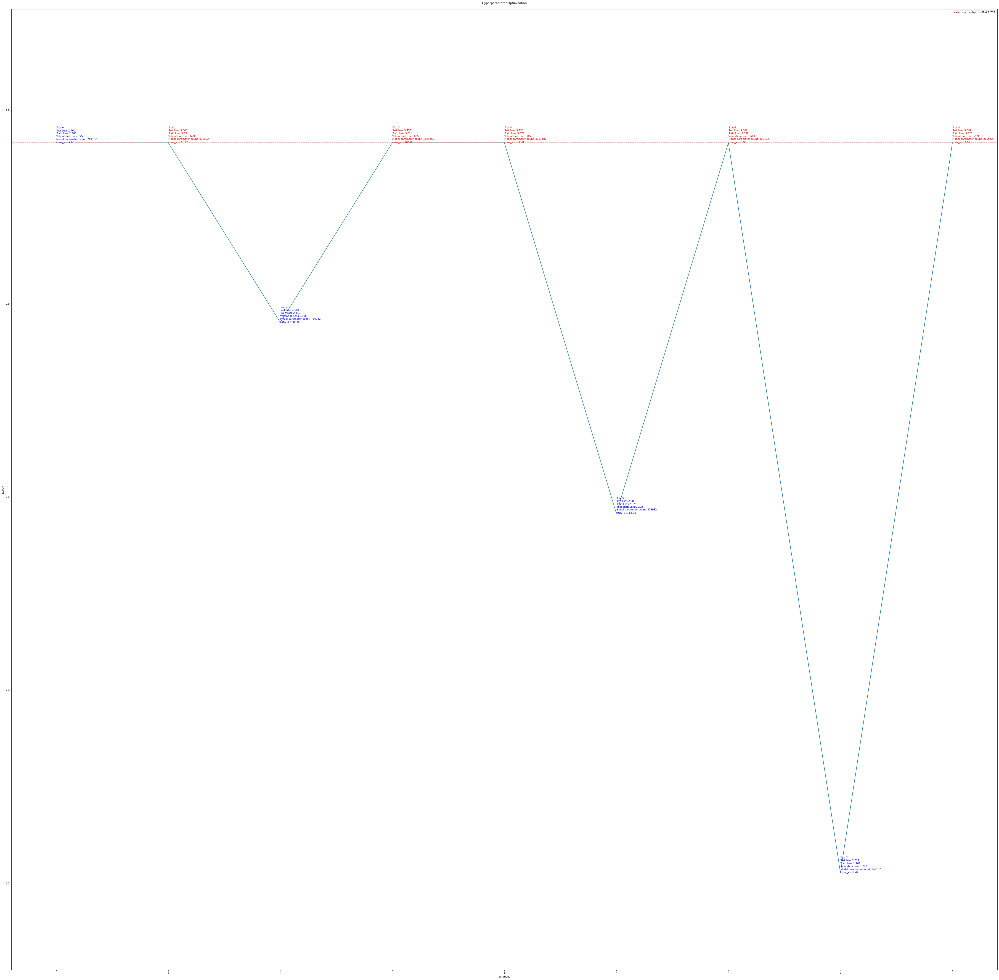

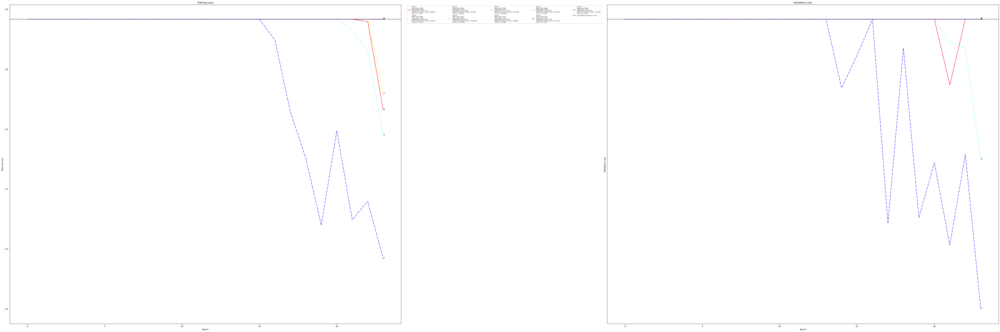

In [3]:
sys.argv = ['train', 
            '--tensors', DATA_DIRECTORY, 
            '--input_tensors', 'ecg_rest', 
            '--output_tensors', 'ecg_rhythm_poor',
            '--batch_size', '32', 
            '--epochs', '24',  
            '--test_steps', '96',
            '--max_models', '9',
            '--id', 'hyperoptimize_conv_x_ecg_rest_rhythm_w_poor']
args = parse_args()
optimize_conv_x(args)

2020-06-09 10:46:27,520 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/hyperoptimize_conv_x_ecg_rest_heart_rate/log_2020-06-09_10-46_0.log.
2020-06-09 10:46:27,522 - arguments:402 - INFO - Command Line was: 
./scripts/tf.sh train --tensors /mnt/disks/ecg-rest-38k-tensors/2020-03-14/ --input_tensors ecg_rest --output_tensors ventricular-rate --batch_size 32 --epochs 16 --test_steps 96 --max_models 7 --id hyperoptimize_conv_x_ecg_rest_heart_rate

2020-06-09 10:46:27,524 - arguments:403 - INFO - Total TensorMaps: 6538 Arguments are Namespace(activation='relu', aligned_dimension=16, alpha=0.5, anneal_max=2.0, anneal_rate=0.0, anneal_shift=0.0, app_csv=None, b_slice_force=None, balance_csvs=[], batch_size=32, bigquery_credentials_file='/mnt/ml4cvd/projects/jamesp/bigquery/bigquery-viewer-credentials.json', bigquery_dataset='broad-ml4cvd.ukbb7089_r10data', block_size=3, bottleneck_type=<BottleneckType.FlattenRestructure: 1>, cache_size=43

input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d_90 (Conv1D)              (None, 5000, 32)     1952        input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation_117 (Activation)     (None, 5000, 32)     0           conv1d_90[0][0]                  
__________________________________________________________________________________________________
max_pooling1d_36 (MaxPooling1D) (None, 2500, 32)     0           activation_117[0][0]             
__________________________________________________________________________________________________
conv1d_91 (Conv1D)              (None, 2500, 32)     5152        max_pooling1d_36[0][0]           
__________________________________________________________________________________________________
activation

__________________________________________________________________________________________________
  0%|          | 0/7 [00:00<?, ?it/s, best loss: ?]2020-06-09 10:46:39,110 - tensor_generators:653 - INFO - Found 26002 train, 7572 validation, and 3666 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 10:46:40,224 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 10:46:41,210 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps          
Epoch 1/16                                         
 1/72 [..............................]             
 - ETA: 7:02 - loss: 0.4286 - pearson: 0.1277      
                                                   
 2/72 [..............................]             
 - ETA: 3:32 - loss: 0.3724 - pearson: 0.1421      
                                                   
 3/72 [>.............................]           

 - ETA: 3s - loss: 0.3862 - pearson: 0.0543        
                                                   
52/72 [====================>.........]             
 - ETA: 3s - loss: 0.3834 - pearson: 0.0618        
                                                   
53/72 [=====================>........]             
 - ETA: 3s - loss: 0.3820 - pearson: 0.0620        
                                                   
54/72 [=====================>........]             
 - ETA: 3s - loss: 0.3797 - pearson: 0.0582        
                                                   
55/72 [=====================>........]             
 - ETA: 3s - loss: 0.3812 - pearson: 0.0573        
                                                   
56/72 [======================>.......]             
 - ETA: 2s - loss: 0.3837 - pearson: 0.0564        
                                                   
57/72 [======================>.......]             
 - ETA: 2s - loss: 0.3847 - pearson: 0.0498        
            

31/72 [===========>..................]             
 - ETA: 2s - loss: 0.3780 - pearson: 0.0336        
                                                   
32/72 [============>.................]             
 - ETA: 2s - loss: 0.3782 - pearson: 0.0392        
                                                   
33/72 [============>.................]             
 - ETA: 2s - loss: 0.3754 - pearson: 0.0381        
                                                   
34/72 [=============>................]             
 - ETA: 2s - loss: 0.3720 - pearson: 0.0382        
                                                   
35/72 [=============>................]             
 - ETA: 2s - loss: 0.3706 - pearson: 0.0471        
                                                   
36/72 [==============>...............]             
 - ETA: 2s - loss: 0.3699 - pearson: 0.0503        
                                                   
37/72 [==============>...............]             
 - ETA: 2s -

 - ETA: 4s - loss: 0.3221 - pearson: 0.0258        
                                                   
13/72 [====>.........................]             
 - ETA: 4s - loss: 0.3211 - pearson: 0.0334        
                                                   
14/72 [====>.........................]             
 - ETA: 4s - loss: 0.3230 - pearson: 0.0238        
                                                   
15/72 [=====>........................]             
 - ETA: 4s - loss: 0.3402 - pearson: 0.0260        
                                                   
16/72 [=====>........................]             
 - ETA: 4s - loss: 0.3429 - pearson: 0.0387        
                                                   
17/72 [======>.......................]             
 - ETA: 4s - loss: 0.3503 - pearson: 0.0397        
                                                   
18/72 [======>.......................]             
 - ETA: 3s - loss: 0.3546 - pearson: 0.0596        
            

                                                   
66/72 [==========================>...]             
 - ETA: 0s - loss: 0.3663 - pearson: 0.0683        
                                                   
67/72 [==========================>...]             
 - ETA: 0s - loss: 0.3655 - pearson: 0.0723        
                                                   
68/72 [===========================>..]             
 - ETA: 0s - loss: 0.3653 - pearson: 0.0724        
                                                   
69/72 [===========================>..]             
 - ETA: 0s - loss: 0.3646 - pearson: 0.0734        
                                                   
70/72 [============================>.]             
 - ETA: 0s - loss: 0.3645 - pearson: 0.0713        
                                                   
71/72 [============================>.]             
 - ETA: 0s - loss: 0.3635 - pearson: 0.0707        
                                                   
Epoch 00003:

 - ETA: 2s - loss: 0.3642 - pearson: 0.0936        
                                                   
45/72 [=================>............]             
 - ETA: 2s - loss: 0.3643 - pearson: 0.0975        
                                                   
46/72 [==================>...........]             
 - ETA: 2s - loss: 0.3634 - pearson: 0.0980        
                                                   
47/72 [==================>...........]             
 - ETA: 2s - loss: 0.3647 - pearson: 0.0936        
                                                   
48/72 [===================>..........]             
 - ETA: 2s - loss: 0.3655 - pearson: 0.0897        
                                                   
49/72 [===================>..........]             
 - ETA: 2s - loss: 0.3637 - pearson: 0.0943        
                                                   
50/72 [===================>..........]             
 - ETA: 2s - loss: 0.3612 - pearson: 0.0963        
            

                                                   
24/72 [=========>....................]             
 - ETA: 3s - loss: 0.3238 - pearson: 0.1032        
                                                   
25/72 [=========>....................]             
 - ETA: 3s - loss: 0.3277 - pearson: 0.0985        
                                                   
26/72 [=========>....................]             
 - ETA: 3s - loss: 0.3310 - pearson: 0.0923        
                                                   
27/72 [==========>...................]             
 - ETA: 3s - loss: 0.3343 - pearson: 0.1003        
                                                   
28/72 [==========>...................]             
 - ETA: 3s - loss: 0.3326 - pearson: 0.0919        
                                                   
29/72 [===========>..................]             
 - ETA: 3s - loss: 0.3433 - pearson: 0.0959        
                                                   
30/72 [=====

 4/72 [>.............................]             
 - ETA: 5s - loss: 0.3658 - pearson: 0.0100        
                                                   
 5/72 [=>............................]             
 - ETA: 5s - loss: 0.3503 - pearson: -0.0600       
                                                  
 6/72 [=>............................]             
 - ETA: 5s - loss: 0.3400 - pearson: -0.0419       
                                                  
 7/72 [=>............................]             
 - ETA: 4s - loss: 0.3337 - pearson: -0.0353       
                                                  
 8/72 [==>...........................]             
 - ETA: 4s - loss: 0.3344 - pearson: -0.0027       
                                                  
 9/72 [==>...........................]             
 - ETA: 4s - loss: 0.3548 - pearson: 0.0069        
                                                   
10/72 [===>..........................]             
 - ETA: 4s - los

 - ETA: 1s - loss: 0.3610 - pearson: 0.1591        
                                                   
57/72 [======================>.......]             
 - ETA: 1s - loss: 0.3617 - pearson: 0.1588        
                                                   
58/72 [=======================>......]             
 - ETA: 1s - loss: 0.3595 - pearson: 0.1618        
                                                   
59/72 [=======================>......]             
 - ETA: 1s - loss: 0.3583 - pearson: 0.1631        
                                                   
60/72 [========================>.....]             
 - ETA: 1s - loss: 0.3570 - pearson: 0.1590        
                                                   
61/72 [========================>.....]             
 - ETA: 1s - loss: 0.3563 - pearson: 0.1571        
                                                   
62/72 [========================>.....]             
 - ETA: 0s - loss: 0.3557 - pearson: 0.1533        
            

                                                   
37/72 [==============>...............]             
 - ETA: 3s - loss: 0.3505 - pearson: 0.1614        
                                                   
38/72 [==============>...............]             
 - ETA: 3s - loss: 0.3525 - pearson: 0.1605        
                                                   
39/72 [===============>..............]             
 - ETA: 2s - loss: 0.3519 - pearson: 0.1554        
                                                   
40/72 [===============>..............]             
 - ETA: 2s - loss: 0.3513 - pearson: 0.1593        
                                                   
41/72 [================>.............]             
 - ETA: 2s - loss: 0.3558 - pearson: 0.1551        
                                                   
42/72 [================>.............]             
 - ETA: 2s - loss: 0.3579 - pearson: 0.1575        
                                                   
43/72 [=====

16/72 [=====>........................]             
 - ETA: 4s - loss: 0.3397 - pearson: 0.2766        
                                                   
17/72 [======>.......................]             
 - ETA: 3s - loss: 0.3408 - pearson: 0.2730        
                                                   
18/72 [======>.......................]             
 - ETA: 4s - loss: 0.3418 - pearson: 0.2709        
                                                   
19/72 [======>.......................]             
 - ETA: 4s - loss: 0.3417 - pearson: 0.2538        
                                                   
20/72 [=======>......................]             
 - ETA: 4s - loss: 0.3382 - pearson: 0.2544        
                                                   
21/72 [=======>......................]             
 - ETA: 4s - loss: 0.3399 - pearson: 0.2581        
                                                   
22/72 [========>.....................]             
 - ETA: 4s -

 - ETA: 0s - loss: 0.3088 - pearson: 0.3189        
                                                   
69/72 [===========================>..]             
 - ETA: 0s - loss: 0.3105 - pearson: 0.3195        
                                                   
70/72 [============================>.]             
 - ETA: 0s - loss: 0.3117 - pearson: 0.3201        
                                                   
71/72 [============================>.]             
 - ETA: 0s - loss: 0.3099 - pearson: 0.3227        
                                                   
Epoch 00008: val_loss improved from 0.33666 to 0.28982, saving model to ./recipes_output/hyperoptimize_conv_x_ecg_rest_heart_rate/plots/architecture_1/architecture_1.h5
                                                   
72/72 [==============================]             
 - 9s 119ms/step - loss: 0.3110 - pearson: 0.3234 - val_loss: 0.2898 - val_pearson: 0.4415

Epoch 9/16                                         
 1/72 [....

47/72 [==================>...........]             
 - ETA: 1s - loss: 0.2751 - pearson: 0.5355        
                                                   
48/72 [===================>..........]             
 - ETA: 1s - loss: 0.2751 - pearson: 0.5336        
                                                   
49/72 [===================>..........]             
 - ETA: 1s - loss: 0.2761 - pearson: 0.5320        
                                                   
50/72 [===================>..........]             
 - ETA: 1s - loss: 0.2749 - pearson: 0.5339        
                                                   
51/72 [====================>.........]             
 - ETA: 1s - loss: 0.2746 - pearson: 0.5358        
                                                   
52/72 [====================>.........]             
 - ETA: 1s - loss: 0.2721 - pearson: 0.5387        
                                                   
53/72 [=====================>........]             
 - ETA: 1s -

                                                   
26/72 [=========>....................]             
 - ETA: 3s - loss: 0.2286 - pearson: 0.6492        
                                                   
27/72 [==========>...................]             
 - ETA: 3s - loss: 0.2311 - pearson: 0.6466        
                                                   
28/72 [==========>...................]             
 - ETA: 3s - loss: 0.2328 - pearson: 0.6442        
                                                   
29/72 [===========>..................]             
 - ETA: 3s - loss: 0.2323 - pearson: 0.6461        
                                                   
30/72 [===========>..................]             
 - ETA: 2s - loss: 0.2349 - pearson: 0.6453        
                                                   
31/72 [===========>..................]             
 - ETA: 2s - loss: 0.2391 - pearson: 0.6435        
                                                   
32/72 [=====

 5/72 [=>............................]             
 - ETA: 6s - loss: 0.1990 - pearson: 0.7221        
                                                   
 6/72 [=>............................]             
 - ETA: 5s - loss: 0.1972 - pearson: 0.7017        
                                                   
 7/72 [=>............................]             
 - ETA: 5s - loss: 0.2052 - pearson: 0.6583        
                                                   
 8/72 [==>...........................]             
 - ETA: 5s - loss: 0.2214 - pearson: 0.6480        
                                                   
 9/72 [==>...........................]             
 - ETA: 5s - loss: 0.2218 - pearson: 0.6624        
                                                   
10/72 [===>..........................]             
 - ETA: 5s - loss: 0.2118 - pearson: 0.6792        
                                                   
11/72 [===>..........................]             
 - ETA: 5s -

 - ETA: 1s - loss: 0.1988 - pearson: 0.7055        
                                                   
58/72 [=======================>......]             
 - ETA: 1s - loss: 0.1988 - pearson: 0.7047        
                                                   
59/72 [=======================>......]             
 - ETA: 0s - loss: 0.1968 - pearson: 0.7077        
                                                   
60/72 [========================>.....]             
 - ETA: 0s - loss: 0.1994 - pearson: 0.7062        
                                                   
61/72 [========================>.....]             
 - ETA: 0s - loss: 0.2004 - pearson: 0.7062        
                                                   
62/72 [========================>.....]             
 - ETA: 0s - loss: 0.2026 - pearson: 0.7062        
                                                   
63/72 [=========================>....]             
 - ETA: 0s - loss: 0.2028 - pearson: 0.7075        
            

 - ETA: 2s - loss: 0.1833 - pearson: 0.7490        
                                                   
34/72 [=============>................]             
 - ETA: 2s - loss: 0.1849 - pearson: 0.7452        
                                                   
35/72 [=============>................]             
 - ETA: 2s - loss: 0.1837 - pearson: 0.7465        
                                                   
36/72 [==============>...............]             
 - ETA: 2s - loss: 0.1841 - pearson: 0.7475        
                                                   
37/72 [==============>...............]             
 - ETA: 2s - loss: 0.1846 - pearson: 0.7461        
                                                   
38/72 [==============>...............]             
 - ETA: 2s - loss: 0.1853 - pearson: 0.7447        
  0%|          | 0/7 [01:30<?, ?it/s, best loss: ?]2020-06-09 10:48:08,004 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ train_worker completed true epoch 1 ~~~~~

17/72 [======>.......................]             
 - ETA: 2s - loss: 0.1732 - pearson: 0.7855        
                                                   
18/72 [======>.......................]             
 - ETA: 2s - loss: 0.1697 - pearson: 0.7885        
                                                   
20/72 [=======>......................]             
 - ETA: 2s - loss: 0.1655 - pearson: 0.7844        
                                                   
22/72 [========>.....................]             
 - ETA: 2s - loss: 0.1600 - pearson: 0.7862        
                                                   
23/72 [========>.....................]             
 - ETA: 2s - loss: 0.1589 - pearson: 0.7872        
                                                   
24/72 [=========>....................]             
 - ETA: 2s - loss: 0.1577 - pearson: 0.7866        
                                                   
25/72 [=========>....................]             
 - ETA: 2s -

 - ETA: 3s - loss: 0.1373 - pearson: 0.8545        
                                                   
 5/72 [=>............................]             
 - ETA: 3s - loss: 0.1642 - pearson: 0.8254        
                                                   
 6/72 [=>............................]             
 - ETA: 3s - loss: 0.1692 - pearson: 0.8059        
                                                   
 7/72 [=>............................]             
 - ETA: 3s - loss: 0.1643 - pearson: 0.8079        
                                                   
 9/72 [==>...........................]             
 - ETA: 3s - loss: 0.1547 - pearson: 0.8248        
                                                   
10/72 [===>..........................]             
 - ETA: 3s - loss: 0.1567 - pearson: 0.8275        
                                                   
12/72 [====>.........................]             
 - ETA: 3s - loss: 0.1498 - pearson: 0.8308        
            

                                                   
65/72 [==========================>...]             
 - ETA: 0s - loss: 0.1415 - pearson: 0.8275        
                                                   
66/72 [==========================>...]             
 - ETA: 0s - loss: 0.1428 - pearson: 0.8261        
                                                   
67/72 [==========================>...]             
 - ETA: 0s - loss: 0.1440 - pearson: 0.8254        
                                                   
68/72 [===========================>..]             
 - ETA: 0s - loss: 0.1439 - pearson: 0.8256        
                                                   
69/72 [===========================>..]             
 - ETA: 0s - loss: 0.1454 - pearson: 0.8248        
                                                   
70/72 [============================>.]             
 - ETA: 0s - loss: 0.1446 - pearson: 0.8252        
                                                   
71/72 [=====

48/72 [===================>..........]             
 - ETA: 1s - loss: 0.1466 - pearson: 0.8153        
                                                   
49/72 [===================>..........]             
 - ETA: 1s - loss: 0.1474 - pearson: 0.8150        
                                                   
50/72 [===================>..........]             
 - ETA: 1s - loss: 0.1473 - pearson: 0.8154        
                                                   
51/72 [====================>.........]             
 - ETA: 1s - loss: 0.1470 - pearson: 0.8163        
                                                   
52/72 [====================>.........]             
 - ETA: 1s - loss: 0.1455 - pearson: 0.8167        
                                                   
53/72 [=====================>........]             
 - ETA: 1s - loss: 0.1441 - pearson: 0.8187        
                                                   
54/72 [=====================>........]             
 - ETA: 0s -

                                                   
29/72 [===========>..................]             
 - ETA: 2s - loss: 0.1248 - pearson: 0.8469        
                                                   
30/72 [===========>..................]             
 - ETA: 2s - loss: 0.1260 - pearson: 0.8441        
                                                   
31/72 [===========>..................]             
 - ETA: 2s - loss: 0.1260 - pearson: 0.8447        
                                                   
32/72 [============>.................]             
 - ETA: 2s - loss: 0.1251 - pearson: 0.8461        
                                                   
33/72 [============>.................]             
 - ETA: 2s - loss: 0.1251 - pearson: 0.8462        
                                                   
34/72 [=============>................]             
 - ETA: 2s - loss: 0.1248 - pearson: 0.8467        
                                                   
35/72 [=====

                                                   
 416/3072 [===>..........................]         
 - ETA: 3s - loss: 0.1204 - pearson: 0.8458        
                                                   
 512/3072 [====>.........................]         
 - ETA: 2s - loss: 0.1335 - pearson: 0.8396        
                                                   
 608/3072 [====>.........................]         
 - ETA: 2s - loss: 0.1326 - pearson: 0.8283        
                                                   
 704/3072 [=====>........................]         
 - ETA: 2s - loss: 0.1306 - pearson: 0.8344        
                                                   
 800/3072 [======>.......................]         
 - ETA: 2s - loss: 0.1269 - pearson: 0.8379        
                                                   
 896/3072 [=======>......................]         
 - ETA: 1s - loss: 0.1229 - pearson: 0.8416        
                                                   
 992/3072 [=

Model: "model_10"                                                             
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d_100 (Conv1D)             (None, 5000, 32)     36896       input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation_130 (Activation)     (None, 5000, 32)     0           conv1d_100[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_40 (MaxPooling1D) (None, 2500, 32)     0           activation_130[0][0]             
______________________________

output_VentricularRate_continuo (None, 1)            65          activation_141[0][0]             
Total params: 1,359,497                                                       
Trainable params: 1,359,497                                                   
Non-trainable params: 0                                                       
__________________________________________________________________________________________________
 14%|█▍        | 1/7 [01:56<11:38, 116.36s/it, best loss: 0.11080913594923913]2020-06-09 10:48:35,633 - tensor_generators:653 - INFO - Found 25967 train, 7540 validation, and 3733 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 10:48:36,794 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 10:48:37,681 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps                                     
Epoch 1/16             

                                                                             
31/72 [===========>..................]                                        
 - ETA: 15s - loss: 0.4059 - pearson: 0.0361                                  
                                                                             
32/72 [============>.................]                                        
 - ETA: 14s - loss: 0.4018 - pearson: 0.0465                                  
                                                                             
33/72 [============>.................]                                        
 - ETA: 13s - loss: 0.4000 - pearson: 0.0446                                  
                                                                             
34/72 [=============>................]                                        
 - ETA: 13s - loss: 0.4055 - pearson: 0.0433                                  
                                                        

65/72 [==========================>...]                                        
 - ETA: 1s - loss: 0.3833 - pearson: 0.0817                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 1s - loss: 0.3823 - pearson: 0.0884                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 1s - loss: 0.3829 - pearson: 0.0906                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3824 - pearson: 0.0844                                   
                                                                              
69/72 [===========================>..]              

 - ETA: 6s - loss: 0.3497 - pearson: 0.0288                                   
                                                                              
27/72 [==========>...................]                                        
 - ETA: 6s - loss: 0.3531 - pearson: 0.0388                                   
                                                                              
28/72 [==========>...................]                                        
 - ETA: 6s - loss: 0.3542 - pearson: 0.0350                                   
                                                                              
29/72 [===========>..................]                                        
 - ETA: 6s - loss: 0.3527 - pearson: 0.0347                                   
                                                                              
30/72 [===========>..................]                                        
 - ETA: 6s - loss: 0.3561 - pearson: 0.0420         

                                                                              
61/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3629 - pearson: 0.0566                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3629 - pearson: 0.0611                                   
                                                                              
63/72 [=========================>....]                                        
 - ETA: 1s - loss: 0.3651 - pearson: 0.0559                                   
                                                                              
64/72 [=========================>....]                                        
 - ETA: 1s - loss: 0.3634 - pearson: 0.0576                                   
                                                    

22/72 [========>.....................]                                        
 - ETA: 7s - loss: 0.3873 - pearson: 0.0760                                   
                                                                              
23/72 [========>.....................]                                        
 - ETA: 7s - loss: 0.3879 - pearson: 0.0695                                   
                                                                              
24/72 [=========>....................]                                        
 - ETA: 7s - loss: 0.3867 - pearson: 0.0651                                   
                                                                              
25/72 [=========>....................]                                        
 - ETA: 6s - loss: 0.3838 - pearson: 0.0604                                   
                                                                              
26/72 [=========>....................]              

 - ETA: 2s - loss: 0.3488 - pearson: 0.2225                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 2s - loss: 0.3483 - pearson: 0.2279                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3489 - pearson: 0.2323                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3461 - pearson: 0.2417                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3423 - pearson: 0.2520         

                                                                              
18/72 [======>.......................]                                        
 - ETA: 7s - loss: 0.1421 - pearson: 0.8283                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 7s - loss: 0.1430 - pearson: 0.8255                                   
                                                                              
20/72 [=======>......................]                                        
 - ETA: 7s - loss: 0.1395 - pearson: 0.8290                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 7s - loss: 0.1357 - pearson: 0.8342                                   
                                                    

52/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.1164 - pearson: 0.8629                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.1151 - pearson: 0.8649                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.1145 - pearson: 0.8659                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.1132 - pearson: 0.8676                                   
                                                                              
56/72 [======================>.......]              

 - ETA: 8s - loss: 0.0632 - pearson: 0.9271                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 8s - loss: 0.0612 - pearson: 0.9306                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 8s - loss: 0.0595 - pearson: 0.9344                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 8s - loss: 0.0591 - pearson: 0.9352                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 8s - loss: 0.0575 - pearson: 0.9373         

                                                                              
48/72 [===================>..........]                                        
 - ETA: 3s - loss: 0.0632 - pearson: 0.9343                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 3s - loss: 0.0626 - pearson: 0.9351                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 3s - loss: 0.0622 - pearson: 0.9355                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.0615 - pearson: 0.9363                                   
                                                    

 9/72 [==>...........................]                                        
 - ETA: 8s - loss: 0.0721 - pearson: 0.9372                                   
                                                                              
10/72 [===>..........................]                                        
 - ETA: 8s - loss: 0.0682 - pearson: 0.9401                                   
                                                                              
11/72 [===>..........................]                                        
 - ETA: 8s - loss: 0.0646 - pearson: 0.9411                                   
                                                                              
12/72 [====>.........................]                                        
 - ETA: 8s - loss: 0.0719 - pearson: 0.9348                                   
                                                                              
13/72 [====>.........................]              

 - ETA: 4s - loss: 0.0492 - pearson: 0.9546                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 3s - loss: 0.0489 - pearson: 0.9547                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 3s - loss: 0.0488 - pearson: 0.9548                                   
                                                                              
46/72 [==================>...........]                                        
 - ETA: 3s - loss: 0.0484 - pearson: 0.9551                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 3s - loss: 0.0480 - pearson: 0.9558         

                                                                              
 5/72 [=>............................]                                        
 - ETA: 9s - loss: 0.0201 - pearson: 0.9827                                   
                                                                              
 6/72 [=>............................]                                        
 - ETA: 9s - loss: 0.0255 - pearson: 0.9702                                   
                                                                              
 7/72 [=>............................]                                        
 - ETA: 9s - loss: 0.0341 - pearson: 0.9652                                   
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 9s - loss: 0.0360 - pearson: 0.9608                                   
                                                    

39/72 [===============>..............]                                        
 - ETA: 4s - loss: 0.0414 - pearson: 0.9536                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 4s - loss: 0.0416 - pearson: 0.9536                                   
                                                                              
41/72 [================>.............]                                        
 - ETA: 4s - loss: 0.0414 - pearson: 0.9534                                   
                                                                              
42/72 [================>.............]                                        
 - ETA: 4s - loss: 0.0406 - pearson: 0.9542                                   
                                                                              
43/72 [================>.............]              

 - 11s 150ms/step - loss: 0.0406 - pearson: 0.9516 - val_loss: 0.0363 - val_pearson: 0.9681

Epoch 8/16                                                                    
 1/72 [..............................]                                        
 - ETA: 8s - loss: 0.0411 - pearson: 0.9888                                   
                                                                              
 2/72 [..............................]                                        
 - ETA: 9s - loss: 0.0260 - pearson: 0.9890                                   
                                                                              
 3/72 [>.............................]                                        
 - ETA: 9s - loss: 0.0195 - pearson: 0.9892                                   
                                                                              
 4/72 [>.............................]                                        
 - ETA: 9s - loss: 0.0302 - pearson: 0

                                                                              
35/72 [=============>................]                                        
 - ETA: 5s - loss: 0.0378 - pearson: 0.9654                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 5s - loss: 0.0371 - pearson: 0.9660                                   
                                                                              
37/72 [==============>...............]                                        
 - ETA: 4s - loss: 0.0366 - pearson: 0.9664                                   
                                                                              
38/72 [==============>...............]                                        
 - ETA: 4s - loss: 0.0362 - pearson: 0.9668                                   
                                                    

69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0349 - pearson: 0.9667                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0348 - pearson: 0.9668                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0347 - pearson: 0.9670                                   
                                                                              
Epoch 00008: val_loss did not improve from 0.03633
                                                                              
72/72 [==============================]                                        
 - 11s 148ms/step - loss: 0.0347 - pearson: 0.9671 - val_loss: 0.0582 - val_pear

                                                                              
31/72 [===========>..................]                                        
 - ETA: 5s - loss: 0.0556 - pearson: 0.9439                                   
                                                                              
32/72 [============>.................]                                        
 - ETA: 5s - loss: 0.0550 - pearson: 0.9442                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 5s - loss: 0.0554 - pearson: 0.9429                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 5s - loss: 0.0552 - pearson: 0.9431                                   
                                                    

65/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0476 - pearson: 0.9533                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0476 - pearson: 0.9533                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0471 - pearson: 0.9539                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0470 - pearson: 0.9540                                   
                                                                              
69/72 [===========================>..]              

 - ETA: 6s - loss: 0.0411 - pearson: 0.9586                                   
                                                                              
25/72 [=========>....................]                                        
 - ETA: 6s - loss: 0.0401 - pearson: 0.9599                                   
                                                                              
26/72 [=========>....................]                                        
 - ETA: 6s - loss: 0.0399 - pearson: 0.9600                                   
                                                                              
27/72 [==========>...................]                                        
 - ETA: 6s - loss: 0.0400 - pearson: 0.9595                                   
                                                                              
28/72 [==========>...................]                                        
 - ETA: 5s - loss: 0.0397 - pearson: 0.9604         

                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.0365 - pearson: 0.9625                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.0360 - pearson: 0.9630                                   
                                                                              
61/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.0357 - pearson: 0.9634                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.0357 - pearson: 0.9637                                   
                                                    

20/72 [=======>......................]                                        
 - ETA: 6s - loss: 0.0338 - pearson: 0.9676                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 6s - loss: 0.0349 - pearson: 0.9672                                   
                                                                              
22/72 [========>.....................]                                        
 - ETA: 6s - loss: 0.0377 - pearson: 0.9656                                   
                                                                              
23/72 [========>.....................]                                        
 - ETA: 6s - loss: 0.0381 - pearson: 0.9667                                   
                                                                              
24/72 [=========>....................]              

                                                                              
54/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.0424 - pearson: 0.9651                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.0421 - pearson: 0.9655                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 2s - loss: 0.0417 - pearson: 0.9656                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 2s - loss: 0.0412 - pearson: 0.9661                                   
                                                    

 - ETA: 7s - loss: 0.0166 - pearson: 0.9840                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 7s - loss: 0.0162 - pearson: 0.9845                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 7s - loss: 0.0160 - pearson: 0.9847                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 7s - loss: 0.0253 - pearson: 0.9722                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 6s - loss: 0.0243 - pearson: 0.9732         

                                                                              
50/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.0299 - pearson: 0.9720                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.0298 - pearson: 0.9720                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.0294 - pearson: 0.9724                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.0292 - pearson: 0.9728                                   
                                                    

 - ETA: 7s - loss: 0.0313 - pearson: 0.9745                                   
                                                                              
12/72 [====>.........................]                                        
 - ETA: 7s - loss: 0.0308 - pearson: 0.9762                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 7s - loss: 0.0333 - pearson: 0.9738                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 7s - loss: 0.0320 - pearson: 0.9750                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 7s - loss: 0.0324 - pearson: 0.9763         

                                                                              
46/72 [==================>...........]                                        
 - ETA: 3s - loss: 0.0308 - pearson: 0.9675                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 3s - loss: 0.0303 - pearson: 0.9681                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 3s - loss: 0.0299 - pearson: 0.9687                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 3s - loss: 0.0302 - pearson: 0.9682                                   
                                                    

 - ETA: 8s - loss: 0.0215 - pearson: 0.9819                                   
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 8s - loss: 0.0212 - pearson: 0.9818                                   
                                                                              
 9/72 [==>...........................]                                        
 - ETA: 8s - loss: 0.0205 - pearson: 0.9819                                   
                                                                              
10/72 [===>..........................]                                        
 - ETA: 8s - loss: 0.0205 - pearson: 0.9795                                   
                                                                              
11/72 [===>..........................]                                        
 - ETA: 7s - loss: 0.0190 - pearson: 0.9807         

                                                                              
42/72 [================>.............]                                        
 - ETA: 3s - loss: 0.0195 - pearson: 0.9785                                   
                                                                              
43/72 [================>.............]                                        
 - ETA: 3s - loss: 0.0194 - pearson: 0.9788                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 3s - loss: 0.0197 - pearson: 0.9787                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 3s - loss: 0.0195 - pearson: 0.9790                                   
                                                    

 - ETA: 9s - loss: 0.0186 - pearson: 0.9688                                   
                                                                              
 4/72 [>.............................]                                        
 - ETA: 9s - loss: 0.0227 - pearson: 0.9702                                   
                                                                              
 5/72 [=>............................]                                        
 - ETA: 8s - loss: 0.0252 - pearson: 0.9676                                   
                                                                              
 6/72 [=>............................]                                        
 - ETA: 8s - loss: 0.0255 - pearson: 0.9721                                   
                                                                              
 7/72 [=>............................]                                        
 - ETA: 8s - loss: 0.0247 - pearson: 0.9748         

                                                                              
38/72 [==============>...............]                                        
 - ETA: 4s - loss: 0.0271 - pearson: 0.9752                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 4s - loss: 0.0269 - pearson: 0.9756                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 4s - loss: 0.0269 - pearson: 0.9759                                   
                                                                              
41/72 [================>.............]                                        
 - ETA: 4s - loss: 0.0265 - pearson: 0.9763                                   
                                                    

                                                                              
72/72 [==============================]                                        
 - 10s 141ms/step - loss: 0.0244 - pearson: 0.9781 - val_loss: 0.0257 - val_pearson: 0.9643

Epoch 16/16                                                                   
 1/72 [..............................]                                        
 - ETA: 8s - loss: 0.0706 - pearson: 0.9524                                   
                                                                              
 2/72 [..............................]                                        
 - ETA: 8s - loss: 0.0382 - pearson: 0.9744                                   
                                                                              
 3/72 [>.............................]                                        
 - ETA: 8s - loss: 0.0308 - pearson: 0.9757                                   
                                      

34/72 [=============>................]                                        
 - ETA: 4s - loss: 0.0474 - pearson: 0.9714                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 4s - loss: 0.0465 - pearson: 0.9718                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 4s - loss: 0.0455 - pearson: 0.9720                                   
                                                                              
37/72 [==============>...............]                                        
 - ETA: 4s - loss: 0.0446 - pearson: 0.9725                                   
                                                                              
38/72 [==============>...............]              

 - ETA: 0s - loss: 0.0317 - pearson: 0.9777                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0322 - pearson: 0.9771                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0318 - pearson: 0.9774                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0319 - pearson: 0.9771                                   
                                                                              
Epoch 00016: val_loss improved from 0.02569 to 0.01681, saving model to ./recipes_output/hyperoptimize_conv_x_ecg_rest_heart_rate/p

 - ETA: 1s - loss: 0.0256 - pearson: 0.9718                                   
                                                                              
1696/3072 [===============>..............]                                    
 - ETA: 1s - loss: 0.0250 - pearson: 0.9725                                   
                                                                              
1760/3072 [================>.............]                                    
 - ETA: 1s - loss: 0.0246 - pearson: 0.9733                                   
                                                                              
1824/3072 [================>.............]                                    
 - ETA: 1s - loss: 0.0240 - pearson: 0.9739                                   
                                                                              
1888/3072 [=================>............]                                    
 - ETA: 1s - loss: 0.0235 - pearson: 0.9746         

Model: "model_11"                                                             
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d_110 (Conv1D)             (None, 5000, 32)     6944        input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation_143 (Activation)     (None, 5000, 32)     0           conv1d_110[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_44 (MaxPooling1D) (None, 2500, 32)     0           activation_143[0][0]             
______________________________

output_VentricularRate_continuo (None, 1)            65          activation_154[0][0]             
Total params: 386,057                                                         
Trainable params: 386,057                                                     
Non-trainable params: 0                                                       
__________________________________________________________________________________________________
 29%|██▊       | 2/7 [05:02<11:26, 137.28s/it, best loss: 0.02312957627873402]2020-06-09 10:51:41,700 - tensor_generators:653 - INFO - Found 26142 train, 7467 validation, and 3631 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 10:51:42,933 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 10:51:43,790 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps                                     
Epoch 1/16             

                                                                              
31/72 [===========>..................]                                        
 - ETA: 13s - loss: 0.3596 - pearson: -0.0235                                 
                                                                              
32/72 [============>.................]                                        
 - ETA: 12s - loss: 0.3578 - pearson: -0.0204                                 
                                                                              
33/72 [============>.................]                                        
 - ETA: 12s - loss: 0.3549 - pearson: -0.0166                                 
                                                                              
34/72 [=============>................]                                        
 - ETA: 11s - loss: 0.3524 - pearson: -0.0186                                 
                                                    

65/72 [==========================>...]                                        
 - ETA: 1s - loss: 0.3553 - pearson: 0.0390                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 1s - loss: 0.3551 - pearson: 0.0343                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 1s - loss: 0.3559 - pearson: 0.0306                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3570 - pearson: 0.0290                                   
                                                                              
69/72 [===========================>..]              

 - ETA: 4s - loss: 0.3673 - pearson: 0.0736                                   
                                                                              
27/72 [==========>...................]                                        
 - ETA: 4s - loss: 0.3639 - pearson: 0.0798                                   
                                                                              
28/72 [==========>...................]                                        
 - ETA: 4s - loss: 0.3595 - pearson: 0.0852                                   
                                                                              
29/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3550 - pearson: 0.0829                                   
                                                                              
30/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3539 - pearson: 0.0883         

                                                                              
61/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3473 - pearson: 0.1005                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3451 - pearson: 0.1006                                   
                                                                              
63/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3446 - pearson: 0.0926                                   
                                                                              
64/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3461 - pearson: 0.0903                                   
                                                    

22/72 [========>.....................]                                        
 - ETA: 4s - loss: 0.3814 - pearson: 0.1124                                   
                                                                              
23/72 [========>.....................]                                        
 - ETA: 4s - loss: 0.3800 - pearson: 0.0992                                   
                                                                              
24/72 [=========>....................]                                        
 - ETA: 4s - loss: 0.3759 - pearson: 0.1043                                   
                                                                              
25/72 [=========>....................]                                        
 - ETA: 4s - loss: 0.3768 - pearson: 0.1048                                   
                                                                              
26/72 [=========>....................]              

 - ETA: 1s - loss: 0.3562 - pearson: 0.0844                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3576 - pearson: 0.0870                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3563 - pearson: 0.0870                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3572 - pearson: 0.0847                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3588 - pearson: 0.0829         

18/72 [======>.......................]                                        
 - ETA: 5s - loss: 0.3583 - pearson: 0.1261                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 5s - loss: 0.3604 - pearson: 0.1390                                   
                                                                              
20/72 [=======>......................]                                        
 - ETA: 5s - loss: 0.3600 - pearson: 0.1569                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 5s - loss: 0.3632 - pearson: 0.1587                                   
                                                                              
22/72 [========>.....................]              

 - ETA: 2s - loss: 0.3431 - pearson: 0.1394                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3427 - pearson: 0.1421                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3408 - pearson: 0.1435                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3427 - pearson: 0.1457                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3448 - pearson: 0.1496         

14/72 [====>.........................]                                        
 - ETA: 5s - loss: 0.3145 - pearson: 0.2235                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 5s - loss: 0.3263 - pearson: 0.2270                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 5s - loss: 0.3256 - pearson: 0.2244                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 5s - loss: 0.3223 - pearson: 0.2183                                   
                                                                              
18/72 [======>.......................]              

 - ETA: 2s - loss: 0.3120 - pearson: 0.3332                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3131 - pearson: 0.3317                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3119 - pearson: 0.3384                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.3104 - pearson: 0.3428                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.3066 - pearson: 0.3506         

                                                                              
10/72 [===>..........................]                                        
 - ETA: 5s - loss: 0.2280 - pearson: 0.6591                                   
                                                                              
11/72 [===>..........................]                                        
 - ETA: 5s - loss: 0.2261 - pearson: 0.6626                                   
                                                                              
12/72 [====>.........................]                                        
 - ETA: 5s - loss: 0.2275 - pearson: 0.6505                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 5s - loss: 0.2197 - pearson: 0.6614                                   
                                                    

44/72 [=================>............]                                        
 - ETA: 2s - loss: 0.2248 - pearson: 0.6522                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 2s - loss: 0.2241 - pearson: 0.6539                                   
                                                                              
46/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.2209 - pearson: 0.6570                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.2182 - pearson: 0.6609                                   
                                                                              
48/72 [===================>..........]              

 - ETA: 5s - loss: 0.1892 - pearson: 0.7499                                   
                                                                              
 6/72 [=>............................]                                        
 - ETA: 5s - loss: 0.1701 - pearson: 0.7764                                   
                                                                              
 7/72 [=>............................]                                        
 - ETA: 5s - loss: 0.1694 - pearson: 0.7661                                   
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 5s - loss: 0.1639 - pearson: 0.7665                                   
                                                                              
 9/72 [==>...........................]                                        
 - ETA: 5s - loss: 0.1610 - pearson: 0.7648         

                                                                              
40/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.1730 - pearson: 0.7492                                   
                                                                              
41/72 [================>.............]                                        
 - ETA: 2s - loss: 0.1714 - pearson: 0.7522                                   
                                                                              
42/72 [================>.............]                                        
 - ETA: 2s - loss: 0.1687 - pearson: 0.7542                                   
                                                                              
43/72 [================>.............]                                        
 - ETA: 2s - loss: 0.1674 - pearson: 0.7561                                   
                                                    

 1/72 [..............................]                                        
 - ETA: 5s - loss: 0.1189 - pearson: 0.7897                                   
                                                                              
 2/72 [..............................]                                        
 - ETA: 8s - loss: 0.1956 - pearson: 0.7995                                   
                                                                              
 3/72 [>.............................]                                        
 - ETA: 8s - loss: 0.1930 - pearson: 0.8367                                   
                                                                              
 4/72 [>.............................]                                        
 - ETA: 8s - loss: 0.1812 - pearson: 0.8042                                   
                                                                              
 5/72 [=>............................]              

 - ETA: 3s - loss: 0.1281 - pearson: 0.8303                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.1267 - pearson: 0.8334                                   
                                                                              
37/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.1261 - pearson: 0.8346                                   
                                                                              
38/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.1247 - pearson: 0.8350                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 3s - loss: 0.1267 - pearson: 0.8325         

                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.1166 - pearson: 0.8426                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.1157 - pearson: 0.8431                                   
                                                                              
Epoch 00008: val_loss improved from 0.14215 to 0.13516, saving model to ./recipes_output/hyperoptimize_conv_x_ecg_rest_heart_rate/plots/architecture_3/architecture_3.h5
                                                                              
72/72 [==============================]                                        
 - 9s 120ms/step - loss: 0.1156 - pearson: 0.8436 - val_loss: 0.1352 - val_pearson: 0.8154

Epoch 9/16                  

31/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.0902 - pearson: 0.8832                                   
                                                                              
32/72 [============>.................]                                        
 - ETA: 3s - loss: 0.0888 - pearson: 0.8859                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 3s - loss: 0.0915 - pearson: 0.8815                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 3s - loss: 0.0897 - pearson: 0.8835                                   
                                                                              
35/72 [=============>................]              

 - ETA: 0s - loss: 0.0894 - pearson: 0.8836                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0884 - pearson: 0.8849                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0885 - pearson: 0.8844                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0889 - pearson: 0.8849                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0886 - pearson: 0.8855         

                                                                              
27/72 [==========>...................]                                        
 - ETA: 3s - loss: 0.1244 - pearson: 0.8514                                   
                                                                              
28/72 [==========>...................]                                        
 - ETA: 3s - loss: 0.1249 - pearson: 0.8527                                   
                                                                              
29/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.1242 - pearson: 0.8535                                   
                                                                              
30/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.1285 - pearson: 0.8482                                   
                                                    

61/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.1165 - pearson: 0.8553                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.1158 - pearson: 0.8567                                   
                                                                              
63/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.1150 - pearson: 0.8574                                   
                                                                              
64/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.1142 - pearson: 0.8584                                   
                                                                              
65/72 [==========================>...]              

 - ETA: 4s - loss: 0.0717 - pearson: 0.9148                                   
                                                                              
23/72 [========>.....................]                                        
 - ETA: 4s - loss: 0.0726 - pearson: 0.9125                                   
                                                                              
24/72 [=========>....................]                                        
 - ETA: 3s - loss: 0.0743 - pearson: 0.9083                                   
                                                                              
25/72 [=========>....................]                                        
 - ETA: 3s - loss: 0.0732 - pearson: 0.9094                                   
                                                                              
26/72 [=========>....................]                                        
 - ETA: 3s - loss: 0.0717 - pearson: 0.9118         

                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.0800 - pearson: 0.9091                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.0808 - pearson: 0.9091                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.0807 - pearson: 0.9090                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.0824 - pearson: 0.9072                                   
                                                    

 - ETA: 4s - loss: 0.0801 - pearson: 0.9117                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.0793 - pearson: 0.9131                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.0773 - pearson: 0.9146                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.0786 - pearson: 0.9161                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.0756 - pearson: 0.9178         

                                                                              
48/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.0674 - pearson: 0.9273                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.0672 - pearson: 0.9269                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.0666 - pearson: 0.9273                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.0681 - pearson: 0.9254                                   
                                                    

 9/72 [==>...........................]                                        
 - ETA: 4s - loss: 0.0487 - pearson: 0.9413                                   
                                                                              
10/72 [===>..........................]                                        
 - ETA: 4s - loss: 0.0526 - pearson: 0.9397                                   
                                                                              
11/72 [===>..........................]                                        
 - ETA: 4s - loss: 0.0498 - pearson: 0.9428                                   
                                                                              
12/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.0483 - pearson: 0.9430                                   
                                                                              
13/72 [====>.........................]              

 - ETA: 2s - loss: 0.0495 - pearson: 0.9433                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 2s - loss: 0.0490 - pearson: 0.9438                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 2s - loss: 0.0483 - pearson: 0.9445                                   
                                                                              
46/72 [==================>...........]                                        
 - ETA: 1s - loss: 0.0487 - pearson: 0.9430                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 1s - loss: 0.0491 - pearson: 0.9434         

                                                                              
 5/72 [=>............................]                                        
 - ETA: 5s - loss: 0.0417 - pearson: 0.9479                                   
                                                                              
 6/72 [=>............................]                                        
 - ETA: 4s - loss: 0.0430 - pearson: 0.9409                                   
                                                                              
 7/72 [=>............................]                                        
 - ETA: 4s - loss: 0.0408 - pearson: 0.9448                                   
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 4s - loss: 0.0381 - pearson: 0.9475                                   
                                                    

39/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.0450 - pearson: 0.9474                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.0444 - pearson: 0.9479                                   
                                                                              
41/72 [================>.............]                                        
 - ETA: 2s - loss: 0.0440 - pearson: 0.9482                                   
                                                                              
42/72 [================>.............]                                        
 - ETA: 2s - loss: 0.0435 - pearson: 0.9488                                   
                                                                              
43/72 [================>.............]              

 - 6s 84ms/step - loss: 0.0412 - pearson: 0.9511 - val_loss: 0.0469 - val_pearson: 0.9457

Epoch 15/16                                                                   
 1/72 [..............................]                                        
 - ETA: 5s - loss: 0.0403 - pearson: 0.9296                                   
                                                                              
 2/72 [..............................]                                        
 - ETA: 5s - loss: 0.0739 - pearson: 0.8965                                   
                                                                              
 3/72 [>.............................]                                        
 - ETA: 5s - loss: 0.0915 - pearson: 0.8649                                   
                                                                              
 4/72 [>.............................]                                        
 - ETA: 5s - loss: 0.0872 - pearson: 0.8

                                                                              
35/72 [=============>................]                                        
 - ETA: 2s - loss: 0.0513 - pearson: 0.9353                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.0510 - pearson: 0.9358                                   
                                                                              
37/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.0503 - pearson: 0.9365                                   
                                                                              
38/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.0500 - pearson: 0.9369                                   
                                                    

69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0530 - pearson: 0.9391                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0530 - pearson: 0.9389                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0525 - pearson: 0.9394                                   
                                                                              
Epoch 00015: val_loss did not improve from 0.04692
                                                                              
72/72 [==============================]                                        
 - 6s 81ms/step - loss: 0.0524 - pearson: 0.9394 - val_loss: 0.0582 - val_pearso

                                                                              
31/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.0476 - pearson: 0.9424                                   
                                                                              
32/72 [============>.................]                                        
 - ETA: 2s - loss: 0.0478 - pearson: 0.9421                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 2s - loss: 0.0472 - pearson: 0.9426                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 2s - loss: 0.0468 - pearson: 0.9435                                   
                                                    

65/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0430 - pearson: 0.9520                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0428 - pearson: 0.9521                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0424 - pearson: 0.9525                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0430 - pearson: 0.9521                                   
                                                                              
69/72 [===========================>..]              

                                                                              
1504/3072 [=============>................]                                    
 - ETA: 1s - loss: 0.0582 - pearson: 0.9274                                   
                                                                              
1568/3072 [==============>...............]                                    
 - ETA: 1s - loss: 0.0574 - pearson: 0.9286                                   
                                                                              
1632/3072 [==============>...............]                                    
 - ETA: 1s - loss: 0.0575 - pearson: 0.9294                                   
                                                                              
1696/3072 [===============>..............]                                    
 - ETA: 1s - loss: 0.0562 - pearson: 0.9311                                   
                                                    

Model: "model_12"                                                             
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d_120 (Conv1D)             (None, 5000, 32)     142880      input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation_156 (Activation)     (None, 5000, 32)     0           conv1d_120[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_48 (MaxPooling1D) (None, 2500, 32)     0           activation_156[0][0]             
______________________________

output_VentricularRate_continuo (None, 1)            65          activation_167[0][0]             
Total params: 4,803,977                                                       
Trainable params: 4,803,977                                                   
Non-trainable params: 0                                                       
__________________________________________________________________________________________________
 43%|████▎     | 3/7 [07:17<09:06, 136.60s/it, best loss: 0.02312957627873402]2020-06-09 10:53:56,661 - tensor_generators:653 - INFO - Found 26011 train, 7507 validation, and 3722 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 10:53:57,861 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 10:53:58,851 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps                                     
Epoch 1/16             

                                                                             
31/72 [===========>..................]                                        
 - ETA: 48s - loss: 0.3638 - pearson: 0.0498                                  
                                                                             
32/72 [============>.................]                                        
 - ETA: 46s - loss: 0.3661 - pearson: 0.0480                                  
                                                                             
33/72 [============>.................]                                        
 - ETA: 45s - loss: 0.3628 - pearson: 0.0453                                  
                                                                             
34/72 [=============>................]                                        
 - ETA: 43s - loss: 0.3624 - pearson: 0.0472                                  
                                                        

 - ETA: 7s - loss: 0.3662 - pearson: 0.0488                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 6s - loss: 0.3655 - pearson: 0.0477                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 5s - loss: 0.3643 - pearson: 0.0485                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 4s - loss: 0.3644 - pearson: 0.0486                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 3s - loss: 0.3647 - pearson: 0.0450         

                                                                             
27/72 [==========>...................]                                        
 - ETA: 39s - loss: 0.3716 - pearson: 0.1119                                  
                                                                             
28/72 [==========>...................]                                        
 - ETA: 38s - loss: 0.3715 - pearson: 0.1098                                  
                                                                             
29/72 [===========>..................]                                        
 - ETA: 37s - loss: 0.3722 - pearson: 0.1123                                  
                                                                             
30/72 [===========>..................]                                        
 - ETA: 37s - loss: 0.3746 - pearson: 0.1091                                  
                                                        

 - ETA: 9s - loss: 0.3563 - pearson: 0.0782                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 8s - loss: 0.3553 - pearson: 0.0779                                   
                                                                              
63/72 [=========================>....]                                        
 - ETA: 7s - loss: 0.3539 - pearson: 0.0750                                   
                                                                              
64/72 [=========================>....]                                        
 - ETA: 7s - loss: 0.3545 - pearson: 0.0745                                   
                                                                              
65/72 [==========================>...]                                        
 - ETA: 6s - loss: 0.3564 - pearson: 0.0749         

 - ETA: 43s - loss: 0.3360 - pearson: 0.0224                                  
                                                                             
24/72 [=========>....................]                                        
 - ETA: 42s - loss: 0.3405 - pearson: 0.0288                                  
                                                                             
25/72 [=========>....................]                                        
 - ETA: 41s - loss: 0.3466 - pearson: 0.0203                                  
                                                                             
26/72 [=========>....................]                                        
 - ETA: 40s - loss: 0.3411 - pearson: 0.0220                                  
                                                                             
27/72 [==========>...................]                                        
 - ETA: 39s - loss: 0.3384 - pearson: 0.0357            

58/72 [=======================>......]                                        
 - ETA: 12s - loss: 0.3580 - pearson: 0.0472                                  
                                                                             
59/72 [=======================>......]                                        
 - ETA: 11s - loss: 0.3582 - pearson: 0.0423                                  
                                                                             
60/72 [========================>.....]                                        
 - ETA: 10s - loss: 0.3582 - pearson: 0.0441                                  
                                                                             
61/72 [========================>.....]                                        
 - ETA: 9s - loss: 0.3564 - pearson: 0.0450                                   
                                                                              
62/72 [========================>.....]                 

20/72 [=======>......................]                                        
 - ETA: 45s - loss: 0.3774 - pearson: 0.0642                                  
                                                                             
21/72 [=======>......................]                                        
 - ETA: 44s - loss: 0.3742 - pearson: 0.0674                                  
                                                                             
22/72 [========>.....................]                                        
 - ETA: 44s - loss: 0.3678 - pearson: 0.0634                                  
                                                                             
23/72 [========>.....................]                                        
 - ETA: 43s - loss: 0.3638 - pearson: 0.0625                                  
                                                                             
24/72 [=========>....................]                  

                                                                             
55/72 [=====================>........]                                        
 - ETA: 14s - loss: 0.3464 - pearson: 0.0797                                  
                                                                             
56/72 [======================>.......]                                        
 - ETA: 14s - loss: 0.3473 - pearson: 0.0829                                  
                                                                             
57/72 [======================>.......]                                        
 - ETA: 13s - loss: 0.3462 - pearson: 0.0897                                  
                                                                             
58/72 [=======================>......]                                        
 - ETA: 12s - loss: 0.3444 - pearson: 0.0871                                  
                                                        

                                                                             
17/72 [======>.......................]                                        
 - ETA: 48s - loss: 0.3427 - pearson: 0.0426                                  
                                                                             
18/72 [======>.......................]                                        
 - ETA: 47s - loss: 0.3467 - pearson: 0.0510                                  
                                                                             
19/72 [======>.......................]                                        
 - ETA: 46s - loss: 0.3480 - pearson: 0.0424                                  
                                                                             
20/72 [=======>......................]                                        
 - ETA: 45s - loss: 0.3400 - pearson: 0.0543                                  
                                                        

 - ETA: 18s - loss: 0.3595 - pearson: 0.0555                                  
                                                                             
52/72 [====================>.........]                                        
 - ETA: 17s - loss: 0.3583 - pearson: 0.0524                                  
                                                                             
53/72 [=====================>........]                                        
 - ETA: 16s - loss: 0.3599 - pearson: 0.0523                                  
                                                                             
54/72 [=====================>........]                                        
 - ETA: 15s - loss: 0.3584 - pearson: 0.0474                                  
                                                                             
55/72 [=====================>........]                                        
 - ETA: 14s - loss: 0.3580 - pearson: 0.0471            

 - ETA: 51s - loss: 0.3547 - pearson: 0.0475                                  
                                                                             
14/72 [====>.........................]                                        
 - ETA: 50s - loss: 0.3501 - pearson: 0.0735                                  
                                                                             
15/72 [=====>........................]                                        
 - ETA: 49s - loss: 0.3481 - pearson: 0.0590                                  
                                                                             
16/72 [=====>........................]                                        
 - ETA: 49s - loss: 0.3507 - pearson: 0.0504                                  
                                                                             
17/72 [======>.......................]                                        
 - ETA: 48s - loss: 0.3450 - pearson: 0.0485            

48/72 [===================>..........]                                        
 - ETA: 21s - loss: 0.3329 - pearson: 0.0348                                  
                                                                             
49/72 [===================>..........]                                        
 - ETA: 20s - loss: 0.3407 - pearson: 0.0299                                  
                                                                             
50/72 [===================>..........]                                        
 - ETA: 19s - loss: 0.3421 - pearson: 0.0291                                  
                                                                             
51/72 [====================>.........]                                        
 - ETA: 18s - loss: 0.3437 - pearson: 0.0248                                  
                                                                             
52/72 [====================>.........]                  

10/72 [===>..........................]                                        
 - ETA: 54s - loss: 0.3564 - pearson: -0.0203                                 
                                                                              
11/72 [===>..........................]                                        
 - ETA: 53s - loss: 0.3531 - pearson: -0.0051                                 
                                                                              
12/72 [====>.........................]                                        
 - ETA: 52s - loss: 0.3462 - pearson: -0.0148                                 
                                                                              
13/72 [====>.........................]                                        
 - ETA: 51s - loss: 0.3545 - pearson: -0.0166                                 
                                                                              
14/72 [====>.........................]              

 - ETA: 24s - loss: 0.3571 - pearson: 0.0132                                  
                                                                             
45/72 [=================>............]                                        
 - ETA: 23s - loss: 0.3592 - pearson: 0.0141                                  
                                                                             
46/72 [==================>...........]                                        
 - ETA: 22s - loss: 0.3592 - pearson: 0.0173                                  
                                                                             
47/72 [==================>...........]                                        
 - ETA: 21s - loss: 0.3599 - pearson: 0.0130                                  
                                                                             
48/72 [===================>..........]                                        
 - ETA: 20s - loss: 0.3609 - pearson: 0.0124            

 - ETA: 57s - loss: 0.3264 - pearson: 0.0640                                  
                                                                             
 7/72 [=>............................]                                        
 - ETA: 56s - loss: 0.3316 - pearson: 0.0675                                  
                                                                             
 8/72 [==>...........................]                                        
 - ETA: 55s - loss: 0.3508 - pearson: 0.0461                                  
                                                                             
 9/72 [==>...........................]                                        
 - ETA: 54s - loss: 0.3519 - pearson: 0.0495                                  
                                                                             
10/72 [===>..........................]                                        
 - ETA: 54s - loss: 0.3496 - pearson: 0.0442            

41/72 [================>.............]                                        
 - ETA: 27s - loss: 0.3774 - pearson: 0.0572                                  
                                                                             
42/72 [================>.............]                                        
 - ETA: 26s - loss: 0.3782 - pearson: 0.0644                                  
                                                                             
43/72 [================>.............]                                        
 - ETA: 25s - loss: 0.3789 - pearson: 0.0610                                  
                                                                             
44/72 [=================>............]                                        
 - ETA: 24s - loss: 0.3809 - pearson: 0.0592                                  
                                                                             
45/72 [=================>............]                  

 - 69s 959ms/step - loss: 0.3752 - pearson: 0.0520 - val_loss: 0.3599 - val_pearson: 0.0158

Epoch 9/16                                                                    
 1/72 [..............................]                                        
 - ETA: 1:01 - loss: 0.3438 - pearson: 0.2077                                 
                                                                              
 2/72 [..............................]                                        
 - ETA: 1:00 - loss: 0.3385 - pearson: 0.0256                                 
                                                                              
 3/72 [>.............................]                                        
 - ETA: 1:00 - loss: 0.3097 - pearson: 0.0613                                 
                                                                              
 4/72 [>.............................]                                        
 - ETA: 59s - loss: 0.3158 - pearson: 

                                                                             
35/72 [=============>................]                                        
 - ETA: 32s - loss: 0.3717 - pearson: 0.0211                                  
                                                                             
36/72 [==============>...............]                                        
 - ETA: 31s - loss: 0.3743 - pearson: 0.0172                                  
                                                                             
37/72 [==============>...............]                                        
 - ETA: 30s - loss: 0.3759 - pearson: 0.0171                                  
                                                                             
38/72 [==============>...............]                                        
 - ETA: 29s - loss: 0.3724 - pearson: 0.0199                                  
                                                        

 - ETA: 2s - loss: 0.3706 - pearson: 0.0362                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 1s - loss: 0.3702 - pearson: 0.0349                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3700 - pearson: 0.0352                                   
                                                                              
Epoch 00009: val_loss did not improve from 0.34700
                                                                              
Epoch 00009: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-05.
                                                                              
72/72 [==============================]                                        


 - ETA: 36s - loss: 0.3870 - pearson: 0.0126                                  
                                                                             
31/72 [===========>..................]                                        
 - ETA: 35s - loss: 0.3857 - pearson: 0.0089                                  
                                                                             
32/72 [============>.................]                                        
 - ETA: 34s - loss: 0.3872 - pearson: 0.0022                                  
                                                                             
33/72 [============>.................]                                        
 - ETA: 34s - loss: 0.3876 - pearson: -0.0085                                 
                                                                              
34/72 [=============>................]                                        
 - ETA: 33s - loss: 0.3858 - pearson: -0.0085          

                                                                              
65/72 [==========================>...]                                        
 - ETA: 6s - loss: 0.3783 - pearson: 0.0187                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 5s - loss: 0.3811 - pearson: 0.0227                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 4s - loss: 0.3817 - pearson: 0.0224                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 3s - loss: 0.3825 - pearson: 0.0248                                   
                                                    

26/72 [=========>....................]                                        
 - ETA: 40s - loss: 0.3447 - pearson: 0.0557                                  
                                                                             
27/72 [==========>...................]                                        
 - ETA: 39s - loss: 0.3475 - pearson: 0.0511                                  
                                                                             
28/72 [==========>...................]                                        
 - ETA: 38s - loss: 0.3496 - pearson: 0.0533                                  
                                                                             
29/72 [===========>..................]                                        
 - ETA: 37s - loss: 0.3514 - pearson: 0.0527                                  
                                                                             
30/72 [===========>..................]                  

58/72 [=======================>......]                                        
 - ETA: 12s - loss: 0.3384 - pearson: 0.0664                                  
                                                                             
59/72 [=======================>......]                                        
 - ETA: 11s - loss: 0.3392 - pearson: 0.0653                                  
                                                                             
60/72 [========================>.....]                                        
 - ETA: 10s - loss: 0.3382 - pearson: 0.0673                                  
                                                                             
61/72 [========================>.....]                                        
 - ETA: 9s - loss: 0.3399 - pearson: 0.0699                                   
                                                                              
62/72 [========================>.....]                 

20/72 [=======>......................]                                        
 - ETA: 45s - loss: 0.3694 - pearson: 0.1230                                  
                                                                             
21/72 [=======>......................]                                        
 - ETA: 44s - loss: 0.3666 - pearson: 0.1301                                  
                                                                             
22/72 [========>.....................]                                        
 - ETA: 43s - loss: 0.3673 - pearson: 0.1367                                  
                                                                             
23/72 [========>.....................]                                        
 - ETA: 42s - loss: 0.3649 - pearson: 0.1390                                  
                                                                             
24/72 [=========>....................]                  

                                                                             
55/72 [=====================>........]                                        
 - ETA: 14s - loss: 0.3567 - pearson: 0.2038                                  
                                                                             
56/72 [======================>.......]                                        
 - ETA: 13s - loss: 0.3561 - pearson: 0.2071                                  
                                                                             
57/72 [======================>.......]                                        
 - ETA: 13s - loss: 0.3554 - pearson: 0.2118                                  
                                                                             
58/72 [=======================>......]                                        
 - ETA: 12s - loss: 0.3550 - pearson: 0.2161                                  
                                                        

16/72 [=====>........................]                                        
 - ETA: 48s - loss: 0.2844 - pearson: 0.5669                                  
                                                                             
17/72 [======>.......................]                                        
 - ETA: 48s - loss: 0.2759 - pearson: 0.5779                                  
                                                                             
18/72 [======>.......................]                                        
 - ETA: 47s - loss: 0.2791 - pearson: 0.5748                                  
                                                                             
19/72 [======>.......................]                                        
 - ETA: 46s - loss: 0.2790 - pearson: 0.5765                                  
                                                                             
20/72 [=======>......................]                  

                                                                             
51/72 [====================>.........]                                        
 - ETA: 18s - loss: 0.2469 - pearson: 0.6358                                  
                                                                             
52/72 [====================>.........]                                        
 - ETA: 17s - loss: 0.2448 - pearson: 0.6393                                  
                                                                             
53/72 [=====================>........]                                        
 - ETA: 16s - loss: 0.2421 - pearson: 0.6446                                  
                                                                             
54/72 [=====================>........]                                        
 - ETA: 15s - loss: 0.2402 - pearson: 0.6475                                  
                                                        

12/72 [====>.........................]                                        
 - ETA: 52s - loss: 0.1757 - pearson: 0.7527                                  
                                                                             
13/72 [====>.........................]                                        
 - ETA: 51s - loss: 0.1726 - pearson: 0.7588                                  
                                                                             
14/72 [====>.........................]                                        
 - ETA: 50s - loss: 0.1672 - pearson: 0.7618                                  
                                                                             
15/72 [=====>........................]                                        
 - ETA: 49s - loss: 0.1669 - pearson: 0.7551                                  
                                                                             
16/72 [=====>........................]                  

                                                                             
47/72 [==================>...........]                                        
 - ETA: 21s - loss: 0.1611 - pearson: 0.7979                                  
                                                                             
48/72 [===================>..........]                                        
 - ETA: 20s - loss: 0.1608 - pearson: 0.7975                                  
                                                                             
49/72 [===================>..........]                                        
 - ETA: 20s - loss: 0.1609 - pearson: 0.7968                                  
                                                                             
50/72 [===================>..........]                                        
 - ETA: 19s - loss: 0.1600 - pearson: 0.7972                                  
                                                        

 8/72 [==>...........................]                                        
 - ETA: 55s - loss: 0.0685 - pearson: 0.8966                                  
                                                                             
 9/72 [==>...........................]                                        
 - ETA: 54s - loss: 0.0890 - pearson: 0.8814                                  
                                                                             
10/72 [===>..........................]                                        
 - ETA: 54s - loss: 0.0869 - pearson: 0.8867                                  
                                                                             
11/72 [===>..........................]                                        
 - ETA: 53s - loss: 0.0880 - pearson: 0.8895                                  
                                                                             
12/72 [====>.........................]                  

                                                                             
43/72 [================>.............]                                        
 - ETA: 25s - loss: 0.0931 - pearson: 0.8922                                  
                                                                             
44/72 [=================>............]                                        
 - ETA: 24s - loss: 0.0927 - pearson: 0.8920                                  
                                                                             
45/72 [=================>............]                                        
 - ETA: 23s - loss: 0.0920 - pearson: 0.8930                                  
                                                                             
46/72 [==================>...........]                                        
 - ETA: 22s - loss: 0.0940 - pearson: 0.8901                                  
                                                        

 4/72 [>.............................]                                        
 - ETA: 59s - loss: 0.0358 - pearson: 0.9583                                  
                                                                             
 5/72 [=>............................]                                        
 - ETA: 58s - loss: 0.0602 - pearson: 0.9319                                  
                                                                             
 6/72 [=>............................]                                        
 - ETA: 57s - loss: 0.0653 - pearson: 0.9253                                  
                                                                             
 7/72 [=>............................]                                        
 - ETA: 56s - loss: 0.0618 - pearson: 0.9245                                  
                                                                             
 8/72 [==>...........................]                  

                                                                             
39/72 [===============>..............]                                        
 - ETA: 28s - loss: 0.0772 - pearson: 0.9052                                  
                                                                             
40/72 [===============>..............]                                        
 - ETA: 27s - loss: 0.0766 - pearson: 0.9060                                  
                                                                             
41/72 [================>.............]                                        
 - ETA: 27s - loss: 0.0761 - pearson: 0.9063                                  
                                                                             
42/72 [================>.............]                                        
 - ETA: 26s - loss: 0.0753 - pearson: 0.9071                                  
                                                        

72/72 [==============================]                                        
 - 69s 963ms/step - loss: 0.0824 - pearson: 0.9012 - val_loss: 0.0555 - val_pearson: 0.9329

 43%|████▎     | 3/7 [26:02<09:06, 136.60s/it, best loss: 0.02312957627873402]2020-06-09 11:12:39,585 - tensor_generators:238 - INFO - Stopped 8 workers. 
Continuous TensorMap: VentricularRate has 25998 total examples.
	Mean: 61.90, Standard Deviation: 10.59, Max: 146.00, Min: 31.00
2020-06-09 11:12:39,594 - tensor_generators:238 - INFO - Stopped 4 workers. 
Continuous TensorMap: VentricularRate has 7502 total examples.
	Mean: 61.80, Standard Deviation: 10.80, Max: 146.00, Min: 34.00
2020-06-09 11:12:39,595 - models:1092 - INFO - Model weights saved at: ./recipes_output/hyperoptimize_conv_x_ecg_rest_heart_rate/plots/architecture_4/architecture_4.h5
2020-06-09 11:12:40,524 - plots:213 - INFO - Saved learning curves at:./recipes_output/hyperoptimize_conv_x_ecg_rest_heart_rate/plots/metric_history_architecture_4.png
  3

 - ETA: 23s - loss: 0.0631 - pearson: 0.9266                                  
                                                                             
1024/3072 [=========>....................]                                    
 - ETA: 22s - loss: 0.0626 - pearson: 0.9270                                  
                                                                             
1056/3072 [=========>....................]                                    
 - ETA: 22s - loss: 0.0618 - pearson: 0.9279                                  
                                                                             
1088/3072 [=========>....................]                                    
 - ETA: 22s - loss: 0.0625 - pearson: 0.9272                                  
                                                                             
1120/3072 [=========>....................]                                    
 - ETA: 21s - loss: 0.0614 - pearson: 0.9285            

2112/3072 [===================>..........]                                    
 - ETA: 10s - loss: 0.0602 - pearson: 0.9304                                  
                                                                             
2144/3072 [===================>..........]                                    
 - ETA: 10s - loss: 0.0597 - pearson: 0.9308                                  
                                                                             
2176/3072 [====================>.........]                                    
 - ETA: 9s - loss: 0.0596 - pearson: 0.9309                                   
                                                                              
2208/3072 [====================>.........]                                    
 - ETA: 9s - loss: 0.0592 - pearson: 0.9313                                   
                                                                              
2240/3072 [====================>.........]            

conv_x                                                                        
118.63152081520424                                                            
372                                                                           
 57%|█████▋    | 4/7 [26:39<22:12, 444.13s/it, best loss: 0.02312957627873402]2020-06-09 11:13:16,222 - hyperparameters:329 - INFO - Set arguments to: Namespace(activation='relu', aligned_dimension=16, alpha=0.5, anneal_max=2.0, anneal_rate=0.0, anneal_shift=0.0, app_csv=None, b_slice_force=None, balance_csvs=[], batch_size=32, bigquery_credentials_file='/mnt/ml4cvd/projects/jamesp/bigquery/bigquery-viewer-credentials.json', bigquery_dataset='broad-ml4cvd.ukbb7089_r10data', block_size=3, bottleneck_type=<BottleneckType.FlattenRestructure: 1>, cache_size=437500000.0, categorical_field_ids=[], continuous_field_ids=[], continuous_file=None, continuous_file_column=None, continuous_file_discretization_bounds=[], continuous_file_normalize=False, conv_dilate=F

conv1d_136 (Conv1D)             (None, 1250, 24)     226584      concatenate_81[0][0]             
__________________________________________________________________________________________________
activation_175 (Activation)     (None, 1250, 24)     0           conv1d_136[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_54 (MaxPooling1D) (None, 625, 24)      0           activation_175[0][0]             
__________________________________________________________________________________________________
conv1d_137 (Conv1D)             (None, 625, 16)      45328       max_pooling1d_54[0][0]           
__________________________________________________________________________________________________
activation_176 (Activation)     (None, 625, 16)      0           conv1d_137[0][0]                 
__________________________________________________________________________________________________
concatenat

16/72 [=====>........................]                                        
 - ETA: 33s - loss: 0.3696 - pearson: 0.0291                                  
                                                                             
17/72 [======>.......................]                                        
 - ETA: 31s - loss: 0.3685 - pearson: 0.0433                                  
                                                                             
18/72 [======>.......................]                                        
 - ETA: 29s - loss: 0.3772 - pearson: 0.0544                                  
                                                                             
19/72 [======>.......................]                                        
 - ETA: 27s - loss: 0.3741 - pearson: 0.0461                                  
                                                                             
20/72 [=======>......................]                  

                                                                              
51/72 [====================>.........]                                        
 - ETA: 6s - loss: 0.3580 - pearson: 0.0640                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 5s - loss: 0.3571 - pearson: 0.0696                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 5s - loss: 0.3589 - pearson: 0.0734                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 5s - loss: 0.3594 - pearson: 0.0783                                   
                                                    

12/72 [====>.........................]                                        
 - ETA: 10s - loss: 0.3438 - pearson: 0.0665                                  
                                                                             
13/72 [====>.........................]                                        
 - ETA: 9s - loss: 0.3376 - pearson: 0.0891                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 9s - loss: 0.3376 - pearson: 0.0780                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 9s - loss: 0.3523 - pearson: 0.0627                                   
                                                                              
16/72 [=====>........................]               

 - ETA: 4s - loss: 0.3489 - pearson: 0.0810                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 3s - loss: 0.3494 - pearson: 0.0766                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 3s - loss: 0.3512 - pearson: 0.0704                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 3s - loss: 0.3520 - pearson: 0.0700                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 3s - loss: 0.3525 - pearson: 0.0704         

 8/72 [==>...........................]                                        
 - ETA: 10s - loss: 0.4000 - pearson: -0.0587                                 
                                                                              
 9/72 [==>...........................]                                        
 - ETA: 10s - loss: 0.3977 - pearson: -0.0473                                 
                                                                              
10/72 [===>..........................]                                        
 - ETA: 10s - loss: 0.3899 - pearson: -0.0529                                 
                                                                              
11/72 [===>..........................]                                        
 - ETA: 10s - loss: 0.4037 - pearson: -0.0716                                 
                                                                              
12/72 [====>.........................]              

 - ETA: 4s - loss: 0.3635 - pearson: 0.0995                                   
                                                                              
43/72 [================>.............]                                        
 - ETA: 4s - loss: 0.3628 - pearson: 0.1057                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 4s - loss: 0.3626 - pearson: 0.1101                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 4s - loss: 0.3615 - pearson: 0.1160                                   
                                                                              
46/72 [==================>...........]                                        
 - ETA: 4s - loss: 0.3647 - pearson: 0.1087         

 4/72 [>.............................]                                        
 - ETA: 10s - loss: 0.3401 - pearson: 0.2192                                  
                                                                             
 5/72 [=>............................]                                        
 - ETA: 10s - loss: 0.3335 - pearson: 0.2261                                  
                                                                             
 6/72 [=>............................]                                        
 - ETA: 10s - loss: 0.3444 - pearson: 0.1962                                  
                                                                             
 7/72 [=>............................]                                        
 - ETA: 10s - loss: 0.3289 - pearson: 0.1394                                  
                                                                             
 8/72 [==>...........................]                  

 - ETA: 5s - loss: 0.3448 - pearson: 0.1237                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 5s - loss: 0.3546 - pearson: 0.1306                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 5s - loss: 0.3557 - pearson: 0.1277                                   
                                                                              
41/72 [================>.............]                                        
 - ETA: 5s - loss: 0.3618 - pearson: 0.1219                                   
                                                                              
42/72 [================>.............]                                        
 - ETA: 4s - loss: 0.3625 - pearson: 0.1259         

                                                                              
72/72 [==============================]                                        
 - 12s 172ms/step - loss: 0.3256 - pearson: 0.3001 - val_loss: 0.1612 - val_pearson: 0.8194

Epoch 5/16                                                                    
 1/72 [..............................]                                        
 - ETA: 10s - loss: 0.2036 - pearson: 0.8639                                  
                                                                             
 2/72 [..............................]                                        
 - ETA: 10s - loss: 0.2235 - pearson: 0.8721                                  
                                                                             
 3/72 [>.............................]                                        
 - ETA: 10s - loss: 0.1739 - pearson: 0.8743                                  
                                        

34/72 [=============>................]                                        
 - ETA: 6s - loss: 0.1226 - pearson: 0.8640                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 5s - loss: 0.1239 - pearson: 0.8635                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 5s - loss: 0.1219 - pearson: 0.8653                                   
                                                                              
37/72 [==============>...............]                                        
 - ETA: 5s - loss: 0.1205 - pearson: 0.8675                                   
                                                                              
38/72 [==============>...............]              

 - ETA: 0s - loss: 0.1010 - pearson: 0.8859                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.1001 - pearson: 0.8871                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0997 - pearson: 0.8879                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0993 - pearson: 0.8886                                   
                                                                              
Epoch 00005: val_loss improved from 0.16122 to 0.10344, saving model to ./recipes_output/hyperoptimize_conv_x_ecg_rest_heart_rate/p

                                                                              
30/72 [===========>..................]                                        
 - ETA: 6s - loss: 0.0851 - pearson: 0.9223                                   
                                                                              
31/72 [===========>..................]                                        
 - ETA: 6s - loss: 0.0829 - pearson: 0.9241                                   
                                                                              
32/72 [============>.................]                                        
 - ETA: 6s - loss: 0.0831 - pearson: 0.9238                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 6s - loss: 0.0845 - pearson: 0.9226                                   
                                                    

64/72 [=========================>....]                                        
 - ETA: 1s - loss: 0.0744 - pearson: 0.9289                                   
                                                                              
65/72 [==========================>...]                                        
 - ETA: 1s - loss: 0.0739 - pearson: 0.9293                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0731 - pearson: 0.9300                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0730 - pearson: 0.9306                                   
                                                                              
68/72 [===========================>..]              

 - ETA: 7s - loss: 0.0433 - pearson: 0.9476                                   
                                                                              
26/72 [=========>....................]                                        
 - ETA: 7s - loss: 0.0421 - pearson: 0.9492                                   
                                                                              
27/72 [==========>...................]                                        
 - ETA: 7s - loss: 0.0409 - pearson: 0.9508                                   
                                                                              
28/72 [==========>...................]                                        
 - ETA: 7s - loss: 0.0400 - pearson: 0.9523                                   
                                                                              
29/72 [===========>..................]                                        
 - ETA: 6s - loss: 0.0388 - pearson: 0.9536         

                                                                              
60/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.0439 - pearson: 0.9523                                   
                                                                              
61/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.0433 - pearson: 0.9529                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.0427 - pearson: 0.9536                                   
                                                                              
63/72 [=========================>....]                                        
 - ETA: 1s - loss: 0.0423 - pearson: 0.9540                                   
                                                    

21/72 [=======>......................]                                        
 - ETA: 8s - loss: 0.0353 - pearson: 0.9673                                   
                                                                              
22/72 [========>.....................]                                        
 - ETA: 8s - loss: 0.0344 - pearson: 0.9681                                   
                                                                              
23/72 [========>.....................]                                        
 - ETA: 8s - loss: 0.0347 - pearson: 0.9670                                   
                                                                              
24/72 [=========>....................]                                        
 - ETA: 7s - loss: 0.0337 - pearson: 0.9680                                   
                                                                              
25/72 [=========>....................]              

 - ETA: 2s - loss: 0.0420 - pearson: 0.9591                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 2s - loss: 0.0418 - pearson: 0.9588                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 2s - loss: 0.0414 - pearson: 0.9594                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 2s - loss: 0.0409 - pearson: 0.9599                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 2s - loss: 0.0403 - pearson: 0.9605         

17/72 [======>.......................]                                        
 - ETA: 8s - loss: 0.0404 - pearson: 0.9478                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 8s - loss: 0.0387 - pearson: 0.9498                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 7s - loss: 0.0370 - pearson: 0.9521                                   
                                                                              
20/72 [=======>......................]                                        
 - ETA: 7s - loss: 0.0362 - pearson: 0.9525                                   
                                                                              
21/72 [=======>......................]              

 - ETA: 3s - loss: 0.0291 - pearson: 0.9660                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.0288 - pearson: 0.9664                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.0286 - pearson: 0.9666                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.0295 - pearson: 0.9658                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.0299 - pearson: 0.9653         

                                                                              
13/72 [====>.........................]                                        
 - ETA: 8s - loss: 0.0291 - pearson: 0.9727                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 8s - loss: 0.0297 - pearson: 0.9725                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 8s - loss: 0.0317 - pearson: 0.9702                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 8s - loss: 0.0332 - pearson: 0.9691                                   
                                                    

47/72 [==================>...........]                                        
 - ETA: 3s - loss: 0.0331 - pearson: 0.9676                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 3s - loss: 0.0327 - pearson: 0.9681                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 3s - loss: 0.0331 - pearson: 0.9682                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 3s - loss: 0.0333 - pearson: 0.9679                                   
                                                                              
51/72 [====================>.........]              

                                                                              
 9/72 [==>...........................]                                        
 - ETA: 9s - loss: 0.0297 - pearson: 0.9695                                   
                                                                              
10/72 [===>..........................]                                        
 - ETA: 9s - loss: 0.0325 - pearson: 0.9653                                   
                                                                              
11/72 [===>..........................]                                        
 - ETA: 9s - loss: 0.0329 - pearson: 0.9671                                   
                                                                              
12/72 [====>.........................]                                        
 - ETA: 8s - loss: 0.0401 - pearson: 0.9597                                   
                                                    

43/72 [================>.............]                                        
 - ETA: 4s - loss: 0.0427 - pearson: 0.9614                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 4s - loss: 0.0420 - pearson: 0.9616                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 4s - loss: 0.0419 - pearson: 0.9619                                   
                                                                              
46/72 [==================>...........]                                        
 - ETA: 3s - loss: 0.0415 - pearson: 0.9622                                   
                                                                              
47/72 [==================>...........]              

                                                                              
72/72 [==============================]                                        
 - 11s 157ms/step - loss: 0.0360 - pearson: 0.9657 - val_loss: 0.0444 - val_pearson: 0.9490

Epoch 12/16                                                                   
 1/72 [..............................]                                        
 - ETA: 10s - loss: 0.0216 - pearson: 0.9822                                  
                                                                             
 2/72 [..............................]                                        
 - ETA: 9s - loss: 0.0159 - pearson: 0.9864                                   
                                                                              
 3/72 [>.............................]                                        
 - ETA: 9s - loss: 0.0155 - pearson: 0.9838                                   
                                       

34/72 [=============>................]                                        
 - ETA: 5s - loss: 0.0194 - pearson: 0.9767                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 5s - loss: 0.0200 - pearson: 0.9758                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 5s - loss: 0.0206 - pearson: 0.9749                                   
                                                                              
37/72 [==============>...............]                                        
 - ETA: 5s - loss: 0.0209 - pearson: 0.9741                                   
                                                                              
38/72 [==============>...............]              

 - ETA: 0s - loss: 0.0227 - pearson: 0.9741                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0226 - pearson: 0.9743                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0225 - pearson: 0.9742                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0223 - pearson: 0.9744                                   
                                                                              
Epoch 00012: val_loss did not improve from 0.03391
                                                                              
7

30/72 [===========>..................]                                        
 - ETA: 6s - loss: 0.0305 - pearson: 0.9687                                   
                                                                              
31/72 [===========>..................]                                        
 - ETA: 6s - loss: 0.0299 - pearson: 0.9695                                   
                                                                              
32/72 [============>.................]                                        
 - ETA: 5s - loss: 0.0296 - pearson: 0.9703                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 5s - loss: 0.0294 - pearson: 0.9709                                   
                                                                              
34/72 [=============>................]              

 - ETA: 1s - loss: 0.0322 - pearson: 0.9642                                   
                                                                              
65/72 [==========================>...]                                        
 - ETA: 1s - loss: 0.0319 - pearson: 0.9647                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0315 - pearson: 0.9651                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0312 - pearson: 0.9654                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0312 - pearson: 0.9654         

                                                                              
26/72 [=========>....................]                                        
 - ETA: 6s - loss: 0.0273 - pearson: 0.9732                                   
                                                                              
27/72 [==========>...................]                                        
 - ETA: 6s - loss: 0.0266 - pearson: 0.9739                                   
                                                                              
28/72 [==========>...................]                                        
 - ETA: 6s - loss: 0.0258 - pearson: 0.9744                                   
                                                                              
29/72 [===========>..................]                                        
 - ETA: 6s - loss: 0.0255 - pearson: 0.9749                                   
                                                    

60/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.0245 - pearson: 0.9748                                   
                                                                              
61/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.0252 - pearson: 0.9745                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.0249 - pearson: 0.9748                                   
                                                                              
63/72 [=========================>....]                                        
 - ETA: 1s - loss: 0.0247 - pearson: 0.9750                                   
                                                                              
64/72 [=========================>....]              

 - ETA: 7s - loss: 0.0348 - pearson: 0.9608                                   
                                                                              
22/72 [========>.....................]                                        
 - ETA: 7s - loss: 0.0361 - pearson: 0.9582                                   
                                                                              
23/72 [========>.....................]                                        
 - ETA: 7s - loss: 0.0351 - pearson: 0.9595                                   
                                                                              
24/72 [=========>....................]                                        
 - ETA: 7s - loss: 0.0350 - pearson: 0.9606                                   
                                                                              
25/72 [=========>....................]                                        
 - ETA: 6s - loss: 0.0346 - pearson: 0.9616         

                                                                              
56/72 [======================>.......]                                        
 - ETA: 2s - loss: 0.0356 - pearson: 0.9605                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 2s - loss: 0.0352 - pearson: 0.9611                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 2s - loss: 0.0354 - pearson: 0.9615                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.0356 - pearson: 0.9613                                   
                                                    

 - ETA: 8s - loss: 0.0288 - pearson: 0.9663                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 7s - loss: 0.0283 - pearson: 0.9674                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 7s - loss: 0.0271 - pearson: 0.9688                                   
                                                                              
20/72 [=======>......................]                                        
 - ETA: 7s - loss: 0.0260 - pearson: 0.9701                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 7s - loss: 0.0282 - pearson: 0.9694         

                                                                              
52/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.0283 - pearson: 0.9714                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.0283 - pearson: 0.9715                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.0280 - pearson: 0.9719                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.0281 - pearson: 0.9721                                   
                                                    

 - ETA: 3s - loss: 0.0396 - pearson: 0.9511                                   
                                                                              
 672/3072 [=====>........................]                                    
 - ETA: 3s - loss: 0.0368 - pearson: 0.9549                                   
                                                                              
 736/3072 [======>.......................]                                    
 - ETA: 3s - loss: 0.0387 - pearson: 0.9522                                   
                                                                              
 800/3072 [======>.......................]                                    
 - ETA: 2s - loss: 0.0369 - pearson: 0.9541                                   
                                                                              
 864/3072 [=======>......................]                                    
 - ETA: 2s - loss: 0.0347 - pearson: 0.9568         

                                                                              
2848/3072 [==========================>...]                                    
 - ETA: 0s - loss: 0.0293 - pearson: 0.9638                                   
                                                                              
2912/3072 [===========================>..]                                    
 - ETA: 0s - loss: 0.0288 - pearson: 0.9644                                   
                                                                              
2976/3072 [============================>.]                                    
 - ETA: 0s - loss: 0.0299 - pearson: 0.9630                                   
                                                                              
3040/3072 [============================>.]                                    
 - ETA: 0s - loss: 0.0295 - pearson: 0.9635                                   
                                                    

__________________________________________________________________________________________________
conv1d_143 (Conv1D)             (None, 2500, 32)     162848      concatenate_85[0][0]             
__________________________________________________________________________________________________
activation_185 (Activation)     (None, 2500, 32)     0           conv1d_143[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_57 (MaxPooling1D) (None, 1250, 32)     0           activation_185[0][0]             
__________________________________________________________________________________________________
conv1d_144 (Conv1D)             (None, 1250, 24)     40728       max_pooling1d_57[0][0]           
__________________________________________________________________________________________________
activation_186 (Activation)     (None, 1250, 24)     0           conv1d_144[0][0]                 
__________

                                                                              
 7/72 [=>............................]                                        
 - ETA: 1:04 - loss: 0.3448 - pearson: 0.1211                                 
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 56s - loss: 0.3671 - pearson: 0.1334                                  
                                                                             
 9/72 [==>...........................]                                        
 - ETA: 49s - loss: 0.3632 - pearson: 0.1475                                  
                                                                             
10/72 [===>..........................]                                        
 - ETA: 44s - loss: 0.3591 - pearson: 0.1136                                  
                                                      

 - ETA: 7s - loss: 0.3653 - pearson: 0.0701                                   
                                                                              
42/72 [================>.............]                                        
 - ETA: 7s - loss: 0.3633 - pearson: 0.0726                                   
                                                                              
43/72 [================>.............]                                        
 - ETA: 7s - loss: 0.3656 - pearson: 0.0675                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 6s - loss: 0.3686 - pearson: 0.0703                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 6s - loss: 0.3679 - pearson: 0.0712         

                                                                             
 3/72 [>.............................]                                        
 - ETA: 6s - loss: 0.3728 - pearson: -0.0385                                  
                                                                             
 4/72 [>.............................]                                        
 - ETA: 6s - loss: 0.3800 - pearson: -0.1022                                  
                                                                             
 5/72 [=>............................]                                        
 - ETA: 6s - loss: 0.3683 - pearson: -0.0408                                  
                                                                             
 6/72 [=>............................]                                        
 - ETA: 7s - loss: 0.3576 - pearson: -0.0134                                  
                                                        

37/72 [==============>...............]                                        
 - ETA: 4s - loss: 0.3654 - pearson: 0.0762                                   
                                                                              
38/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.3612 - pearson: 0.0760                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 3s - loss: 0.3613 - pearson: 0.0744                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 3s - loss: 0.3594 - pearson: 0.0666                                   
                                                                              
41/72 [================>.............]              

 - ETA: 0s - loss: 0.3562 - pearson: 0.0669                                   
                                                                              
Epoch 00002: val_loss did not improve from 0.34858
                                                                              
72/72 [==============================]                                        
 - 9s 121ms/step - loss: 0.3558 - pearson: 0.0635 - val_loss: 0.3620 - val_pearson: 0.0502

Epoch 3/16                                                                    
 1/72 [..............................]                                        
 - ETA: 8s - loss: 0.3837 - pearson: -0.0126                                  
                                                                             
 2/72 [..............................]                                        
 - ETA: 7s - loss: 0.3658 - pearson: 0.0191                                   
                                                                    

33/72 [============>.................]                                        
 - ETA: 4s - loss: 0.3626 - pearson: 0.0612                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 4s - loss: 0.3672 - pearson: 0.0563                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 4s - loss: 0.3681 - pearson: 0.0575                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 4s - loss: 0.3720 - pearson: 0.0637                                   
                                                                              
37/72 [==============>...............]              

 - ETA: 0s - loss: 0.3660 - pearson: 0.0811                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3648 - pearson: 0.0782                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3638 - pearson: 0.0792                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3631 - pearson: 0.0811                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3632 - pearson: 0.0830         

29/72 [===========>..................]                                        
 - ETA: 5s - loss: 0.3407 - pearson: 0.1377                                   
                                                                              
30/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3411 - pearson: 0.1344                                   
                                                                              
31/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3403 - pearson: 0.1381                                   
                                                                              
32/72 [============>.................]                                        
 - ETA: 4s - loss: 0.3362 - pearson: 0.1422                                   
                                                                              
33/72 [============>.................]              

 - ETA: 1s - loss: 0.3518 - pearson: 0.1404                                   
                                                                              
64/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3524 - pearson: 0.1402                                   
                                                                              
65/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3558 - pearson: 0.1436                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3567 - pearson: 0.1435                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3583 - pearson: 0.1374         

                                                                              
25/72 [=========>....................]                                        
 - ETA: 5s - loss: 0.3441 - pearson: 0.1183                                   
                                                                              
26/72 [=========>....................]                                        
 - ETA: 5s - loss: 0.3433 - pearson: 0.1249                                   
                                                                              
27/72 [==========>...................]                                        
 - ETA: 5s - loss: 0.3447 - pearson: 0.1269                                   
                                                                              
28/72 [==========>...................]                                        
 - ETA: 4s - loss: 0.3427 - pearson: 0.1372                                   
                                                    

59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3476 - pearson: 0.1715                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3454 - pearson: 0.1743                                   
                                                                              
61/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3436 - pearson: 0.1811                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3419 - pearson: 0.1893                                   
                                                                              
63/72 [=========================>....]              

 - ETA: 5s - loss: 0.1793 - pearson: 0.7719                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 5s - loss: 0.1756 - pearson: 0.7766                                   
                                                                              
22/72 [========>.....................]                                        
 - ETA: 5s - loss: 0.1713 - pearson: 0.7801                                   
                                                                              
23/72 [========>.....................]                                        
 - ETA: 5s - loss: 0.1692 - pearson: 0.7804                                   
                                                                              
24/72 [=========>....................]                                        
 - ETA: 5s - loss: 0.1668 - pearson: 0.7829         

                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.1702 - pearson: 0.8061                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.1697 - pearson: 0.8059                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.1686 - pearson: 0.8080                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.1682 - pearson: 0.8090                                   
                                                    

16/72 [=====>........................]                                        
 - ETA: 6s - loss: 0.1266 - pearson: 0.8555                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 6s - loss: 0.1239 - pearson: 0.8556                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 6s - loss: 0.1230 - pearson: 0.8582                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 6s - loss: 0.1248 - pearson: 0.8589                                   
                                                                              
20/72 [=======>......................]              

 - ETA: 2s - loss: 0.0930 - pearson: 0.8987                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.0924 - pearson: 0.8989                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.0911 - pearson: 0.9003                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.0898 - pearson: 0.9016                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 2s - loss: 0.0905 - pearson: 0.9015         

                                                                              
12/72 [====>.........................]                                        
 - ETA: 6s - loss: 0.0532 - pearson: 0.9534                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 6s - loss: 0.0566 - pearson: 0.9532                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 6s - loss: 0.0575 - pearson: 0.9499                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 6s - loss: 0.0554 - pearson: 0.9516                                   
                                                    

46/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.0482 - pearson: 0.9557                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.0489 - pearson: 0.9553                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.0481 - pearson: 0.9560                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.0474 - pearson: 0.9565                                   
                                                                              
50/72 [===================>..........]              

 - ETA: 6s - loss: 0.0333 - pearson: 0.9703                                   
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 6s - loss: 0.0318 - pearson: 0.9718                                   
                                                                              
 9/72 [==>...........................]                                        
 - ETA: 6s - loss: 0.0298 - pearson: 0.9722                                   
                                                                              
10/72 [===>..........................]                                        
 - ETA: 5s - loss: 0.0295 - pearson: 0.9721                                   
                                                                              
11/72 [===>..........................]                                        
 - ETA: 5s - loss: 0.0290 - pearson: 0.9724         

                                                                              
42/72 [================>.............]                                        
 - ETA: 2s - loss: 0.0309 - pearson: 0.9604                                   
                                                                              
43/72 [================>.............]                                        
 - ETA: 2s - loss: 0.0309 - pearson: 0.9608                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 2s - loss: 0.0305 - pearson: 0.9613                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 2s - loss: 0.0312 - pearson: 0.9615                                   
                                                    

 - ETA: 6s - loss: 0.0919 - pearson: 0.9514                                   
                                                                              
 4/72 [>.............................]                                        
 - ETA: 6s - loss: 0.0747 - pearson: 0.9580                                   
                                                                              
 5/72 [=>............................]                                        
 - ETA: 6s - loss: 0.0715 - pearson: 0.9632                                   
                                                                              
 6/72 [=>............................]                                        
 - ETA: 6s - loss: 0.0723 - pearson: 0.9594                                   
                                                                              
 7/72 [=>............................]                                        
 - ETA: 6s - loss: 0.0771 - pearson: 0.9574         

                                                                              
38/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.0529 - pearson: 0.9576                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 3s - loss: 0.0524 - pearson: 0.9569                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 3s - loss: 0.0513 - pearson: 0.9578                                   
                                                                              
41/72 [================>.............]                                        
 - ETA: 2s - loss: 0.0553 - pearson: 0.9520                                   
                                                    

                                                                              
72/72 [==============================]                                        
 - 8s 107ms/step - loss: 0.0423 - pearson: 0.9622 - val_loss: 0.0240 - val_pearson: 0.9774

Epoch 11/16                                                                   
 1/72 [..............................]                                        
 - ETA: 5s - loss: 0.0258 - pearson: 0.9799                                   
                                                                              
 2/72 [..............................]                                        
 - ETA: 5s - loss: 0.0211 - pearson: 0.9836                                   
                                                                              
 3/72 [>.............................]                                        
 - ETA: 6s - loss: 0.0234 - pearson: 0.9681                                   
                                       

34/72 [=============>................]                                        
 - ETA: 3s - loss: 0.0226 - pearson: 0.9777                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 3s - loss: 0.0224 - pearson: 0.9779                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.0222 - pearson: 0.9783                                   
                                                                              
37/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.0220 - pearson: 0.9787                                   
                                                                              
38/72 [==============>...............]              

                                                                              
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0232 - pearson: 0.9743                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0230 - pearson: 0.9746                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0229 - pearson: 0.9744                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0228 - pearson: 0.9746                                   
                                                    

 - ETA: 4s - loss: 0.0230 - pearson: 0.9748                                   
                                                                              
25/72 [=========>....................]                                        
 - ETA: 4s - loss: 0.0224 - pearson: 0.9754                                   
                                                                              
26/72 [=========>....................]                                        
 - ETA: 4s - loss: 0.0227 - pearson: 0.9755                                   
                                                                              
27/72 [==========>...................]                                        
 - ETA: 4s - loss: 0.0224 - pearson: 0.9761                                   
                                                                              
28/72 [==========>...................]                                        
 - ETA: 4s - loss: 0.0227 - pearson: 0.9758         

                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.0221 - pearson: 0.9779                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.0218 - pearson: 0.9783                                   
                                                                              
61/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.0219 - pearson: 0.9778                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.0218 - pearson: 0.9781                                   
                                                    

 - ETA: 4s - loss: 0.0265 - pearson: 0.9762                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 4s - loss: 0.0259 - pearson: 0.9770                                   
                                                                              
22/72 [========>.....................]                                        
 - ETA: 4s - loss: 0.0252 - pearson: 0.9776                                   
                                                                              
23/72 [========>.....................]                                        
 - ETA: 4s - loss: 0.0245 - pearson: 0.9780                                   
                                                                              
24/72 [=========>....................]                                        
 - ETA: 4s - loss: 0.0248 - pearson: 0.9774         

                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.0247 - pearson: 0.9743                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.0244 - pearson: 0.9747                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.0242 - pearson: 0.9749                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.0242 - pearson: 0.9750                                   
                                                    

 - ETA: 5s - loss: 0.0207 - pearson: 0.9922                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 5s - loss: 0.0209 - pearson: 0.9924                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 5s - loss: 0.0202 - pearson: 0.9924                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.0195 - pearson: 0.9924                                   
                                                                              
20/72 [=======>......................]                                        
 - ETA: 4s - loss: 0.0189 - pearson: 0.9923         

                                                                              
51/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.0258 - pearson: 0.9806                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.0261 - pearson: 0.9805                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.0259 - pearson: 0.9806                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.0261 - pearson: 0.9800                                   
                                                    

12/72 [====>.........................]                                        
 - ETA: 5s - loss: 0.0185 - pearson: 0.9826                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 5s - loss: 0.0176 - pearson: 0.9834                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 5s - loss: 0.0168 - pearson: 0.9841                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 5s - loss: 0.0173 - pearson: 0.9847                                   
                                                                              
16/72 [=====>........................]              

 - ETA: 2s - loss: 0.0200 - pearson: 0.9793                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.0201 - pearson: 0.9789                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.0199 - pearson: 0.9792                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.0197 - pearson: 0.9794                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.0202 - pearson: 0.9782         

 8/72 [==>...........................]                                        
 - ETA: 6s - loss: 0.0147 - pearson: 0.9899                                   
                                                                              
 9/72 [==>...........................]                                        
 - ETA: 6s - loss: 0.0135 - pearson: 0.9903                                   
                                                                              
10/72 [===>..........................]                                        
 - ETA: 5s - loss: 0.0158 - pearson: 0.9881                                   
                                                                              
11/72 [===>..........................]                                        
 - ETA: 5s - loss: 0.0151 - pearson: 0.9889                                   
                                                                              
12/72 [====>.........................]              

 - ETA: 2s - loss: 0.0127 - pearson: 0.9860                                   
                                                                              
43/72 [================>.............]                                        
 - ETA: 2s - loss: 0.0141 - pearson: 0.9843                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 2s - loss: 0.0139 - pearson: 0.9846                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 2s - loss: 0.0148 - pearson: 0.9830                                   
                                                                              
46/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.0146 - pearson: 0.9833         

  32/3072 [..............................]                                    
 - ETA: 23s - loss: 0.0247 - pearson: 0.9540                                  
                                                                             
  96/3072 [..............................]                                    
 - ETA: 9s - loss: 0.0124 - pearson: 0.9797                                   
                                                                              
 160/3072 [>.............................]                                    
 - ETA: 6s - loss: 0.0107 - pearson: 0.9834                                   
                                                                              
 224/3072 [=>............................]                                    
 - ETA: 5s - loss: 0.0215 - pearson: 0.9688                                   
                                                                              
 288/3072 [=>............................]           

 - ETA: 0s - loss: 0.0180 - pearson: 0.9800                                   
                                                                              
2272/3072 [=====================>........]                                    
 - ETA: 0s - loss: 0.0183 - pearson: 0.9782                                   
                                                                              
2336/3072 [=====================>........]                                    
 - ETA: 0s - loss: 0.0180 - pearson: 0.9786                                   
                                                                              
2400/3072 [======================>.......]                                    
 - ETA: 0s - loss: 0.0186 - pearson: 0.9779                                   
                                                                              
2464/3072 [=======================>......]                                    
 - ETA: 0s - loss: 0.0185 - pearson: 0.9783         

input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d_150 (Conv1D)             (None, 5000, 32)     13088       input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation_195 (Activation)     (None, 5000, 32)     0           conv1d_150[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_60 (MaxPooling1D) (None, 2500, 32)     0           activation_195[0][0]             
__________________________________________________________________________________________________
conv1d_151 (Conv1D)             (None, 2500, 32)     34848       max_pooling1d_60[0][0]           
__________________________________________________________________________________________________
activation

Non-trainable params: 0                                                       
__________________________________________________________________________________________________
 86%|████████▌ | 6/7 [32:31<05:04, 304.64s/it, best loss: 0.01934169325977564]2020-06-09 11:19:10,169 - tensor_generators:653 - INFO - Found 26206 train, 7418 validation, and 3616 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 11:19:11,510 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 11:19:12,443 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps                                     
Epoch 1/16                                                                    
 1/72 [..............................]                                        
 - ETA: 7:46 - loss: 0.3056 - pearson: 0.1031                                 
                                           

32/72 [============>.................]                                        
 - ETA: 11s - loss: 0.3671 - pearson: 0.0086                                  
                                                                             
33/72 [============>.................]                                        
 - ETA: 11s - loss: 0.3653 - pearson: 0.0189                                  
                                                                             
34/72 [=============>................]                                        
 - ETA: 10s - loss: 0.3658 - pearson: 0.0227                                  
                                                                             
35/72 [=============>................]                                        
 - ETA: 10s - loss: 0.3658 - pearson: 0.0246                                  
                                                                             
36/72 [==============>...............]                  

 - ETA: 1s - loss: 0.3703 - pearson: 0.0370                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3706 - pearson: 0.0400                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3694 - pearson: 0.0386                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3687 - pearson: 0.0373                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3668 - pearson: 0.0413         

                                                                              
28/72 [==========>...................]                                        
 - ETA: 4s - loss: 0.3619 - pearson: 0.1036                                   
                                                                              
29/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3562 - pearson: 0.0967                                   
                                                                              
30/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3565 - pearson: 0.1028                                   
                                                                              
31/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3524 - pearson: 0.1134                                   
                                                    

62/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3536 - pearson: 0.1183                                   
                                                                              
63/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3521 - pearson: 0.1193                                   
                                                                              
64/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3521 - pearson: 0.1233                                   
                                                                              
65/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3537 - pearson: 0.1293                                   
                                                                              
66/72 [==========================>...]              

 - ETA: 5s - loss: 0.3212 - pearson: 0.3385                                   
                                                                              
24/72 [=========>....................]                                        
 - ETA: 5s - loss: 0.3193 - pearson: 0.3503                                   
                                                                              
25/72 [=========>....................]                                        
 - ETA: 5s - loss: 0.3214 - pearson: 0.3529                                   
                                                                              
26/72 [=========>....................]                                        
 - ETA: 5s - loss: 0.3250 - pearson: 0.3565                                   
                                                                              
27/72 [==========>...................]                                        
 - ETA: 5s - loss: 0.3282 - pearson: 0.3581         

                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3164 - pearson: 0.4529                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3163 - pearson: 0.4545                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3144 - pearson: 0.4570                                   
                                                                              
61/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3112 - pearson: 0.4605                                   
                                                    

19/72 [======>.......................]                                        
 - ETA: 5s - loss: 0.1620 - pearson: 0.7584                                   
                                                                              
20/72 [=======>......................]                                        
 - ETA: 5s - loss: 0.1647 - pearson: 0.7582                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 5s - loss: 0.1674 - pearson: 0.7563                                   
                                                                              
22/72 [========>.....................]                                        
 - ETA: 5s - loss: 0.1717 - pearson: 0.7564                                   
                                                                              
23/72 [========>.....................]              

 - ETA: 2s - loss: 0.1640 - pearson: 0.7793                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.1641 - pearson: 0.7801                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.1647 - pearson: 0.7800                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.1641 - pearson: 0.7799                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.1638 - pearson: 0.7800         

                                                                              
15/72 [=====>........................]                                        
 - ETA: 5s - loss: 0.1473 - pearson: 0.8130                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 5s - loss: 0.1450 - pearson: 0.8187                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 5s - loss: 0.1458 - pearson: 0.8209                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 5s - loss: 0.1436 - pearson: 0.8241                                   
                                                    

49/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.1140 - pearson: 0.8652                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.1143 - pearson: 0.8665                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.1130 - pearson: 0.8681                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.1121 - pearson: 0.8694                                   
                                                                              
53/72 [=====================>........]              

 - ETA: 6s - loss: 0.0650 - pearson: 0.9223                                   
                                                                              
11/72 [===>..........................]                                        
 - ETA: 6s - loss: 0.0742 - pearson: 0.9180                                   
                                                                              
12/72 [====>.........................]                                        
 - ETA: 6s - loss: 0.0740 - pearson: 0.9155                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 6s - loss: 0.0761 - pearson: 0.9112                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 6s - loss: 0.0784 - pearson: 0.9132         

                                                                              
45/72 [=================>............]                                        
 - ETA: 2s - loss: 0.0694 - pearson: 0.9196                                   
                                                                              
46/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.0695 - pearson: 0.9203                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.0703 - pearson: 0.9203                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.0715 - pearson: 0.9205                                   
                                                    

 6/72 [=>............................]                                        
 - ETA: 6s - loss: 0.0342 - pearson: 0.9612                                   
                                                                              
 7/72 [=>............................]                                        
 - ETA: 6s - loss: 0.0366 - pearson: 0.9516                                   
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 6s - loss: 0.0375 - pearson: 0.9521                                   
                                                                              
 9/72 [==>...........................]                                        
 - ETA: 6s - loss: 0.0426 - pearson: 0.9487                                   
                                                                              
10/72 [===>..........................]              

 - ETA: 3s - loss: 0.0441 - pearson: 0.9539                                   
                                                                              
41/72 [================>.............]                                        
 - ETA: 3s - loss: 0.0440 - pearson: 0.9539                                   
                                                                              
42/72 [================>.............]                                        
 - ETA: 3s - loss: 0.0476 - pearson: 0.9516                                   
                                                                              
43/72 [================>.............]                                        
 - ETA: 3s - loss: 0.0472 - pearson: 0.9513                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 3s - loss: 0.0486 - pearson: 0.9502         

 2/72 [..............................]                                        
 - ETA: 6s - loss: 0.0456 - pearson: 0.9296                                   
                                                                              
 3/72 [>.............................]                                        
 - ETA: 6s - loss: 0.0389 - pearson: 0.9480                                   
                                                                              
 4/72 [>.............................]                                        
 - ETA: 6s - loss: 0.0391 - pearson: 0.9531                                   
                                                                              
 5/72 [=>............................]                                        
 - ETA: 7s - loss: 0.0362 - pearson: 0.9570                                   
                                                                              
 6/72 [=>............................]              

 - ETA: 4s - loss: 0.0388 - pearson: 0.9548                                   
                                                                              
37/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.0393 - pearson: 0.9532                                   
                                                                              
38/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.0394 - pearson: 0.9531                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 3s - loss: 0.0390 - pearson: 0.9536                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 3s - loss: 0.0387 - pearson: 0.9541         

                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0453 - pearson: 0.9467                                   
                                                                              
Epoch 00008: val_loss improved from 0.05079 to 0.04281, saving model to ./recipes_output/hyperoptimize_conv_x_ecg_rest_heart_rate/plots/architecture_7/architecture_7.h5
                                                                              
72/72 [==============================]                                        
 - 9s 123ms/step - loss: 0.0451 - pearson: 0.9472 - val_loss: 0.0428 - val_pearson: 0.9570

Epoch 9/16                                                                    
 1/72 [..............................]                                        
 - ETA: 5s - loss: 0.0622 - pearson: 0.9371                                   
                            

32/72 [============>.................]                                        
 - ETA: 3s - loss: 0.0417 - pearson: 0.9482                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 3s - loss: 0.0417 - pearson: 0.9483                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 3s - loss: 0.0411 - pearson: 0.9495                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 3s - loss: 0.0408 - pearson: 0.9502                                   
                                                                              
36/72 [==============>...............]              

 - ETA: 0s - loss: 0.0376 - pearson: 0.9554                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0381 - pearson: 0.9543                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0378 - pearson: 0.9543                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0373 - pearson: 0.9549                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0370 - pearson: 0.9553         

                                                                              
28/72 [==========>...................]                                        
 - ETA: 4s - loss: 0.0420 - pearson: 0.9521                                   
                                                                              
29/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.0423 - pearson: 0.9512                                   
                                                                              
30/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.0417 - pearson: 0.9522                                   
                                                                              
31/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.0407 - pearson: 0.9528                                   
                                                    

62/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.0350 - pearson: 0.9624                                   
                                                                              
63/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.0353 - pearson: 0.9618                                   
                                                                              
64/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.0349 - pearson: 0.9621                                   
                                                                              
65/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.0347 - pearson: 0.9625                                   
                                                                              
66/72 [==========================>...]              

 - ETA: 4s - loss: 0.0180 - pearson: 0.9826                                   
                                                                              
22/72 [========>.....................]                                        
 - ETA: 4s - loss: 0.0191 - pearson: 0.9829                                   
                                                                              
23/72 [========>.....................]                                        
 - ETA: 4s - loss: 0.0204 - pearson: 0.9815                                   
                                                                              
24/72 [=========>....................]                                        
 - ETA: 4s - loss: 0.0206 - pearson: 0.9817                                   
                                                                              
25/72 [=========>....................]                                        
 - ETA: 4s - loss: 0.0211 - pearson: 0.9809         

                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.0360 - pearson: 0.9679                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.0356 - pearson: 0.9681                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.0357 - pearson: 0.9677                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.0365 - pearson: 0.9662                                   
                                                    

15/72 [=====>........................]                                        
 - ETA: 5s - loss: 0.0292 - pearson: 0.9756                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.0315 - pearson: 0.9748                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.0308 - pearson: 0.9754                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.0297 - pearson: 0.9760                                   
                                                                              
19/72 [======>.......................]              

 - ETA: 1s - loss: 0.0279 - pearson: 0.9738                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.0280 - pearson: 0.9740                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.0278 - pearson: 0.9743                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.0278 - pearson: 0.9744                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.0275 - pearson: 0.9747         

                                                                              
11/72 [===>..........................]                                        
 - ETA: 5s - loss: 0.0141 - pearson: 0.9866                                   
                                                                              
12/72 [====>.........................]                                        
 - ETA: 5s - loss: 0.0286 - pearson: 0.9541                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.0371 - pearson: 0.9424                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.0352 - pearson: 0.9460                                   
                                                    

45/72 [=================>............]                                        
 - ETA: 2s - loss: 0.0371 - pearson: 0.9637                                   
                                                                              
46/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.0367 - pearson: 0.9640                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.0363 - pearson: 0.9646                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.0362 - pearson: 0.9651                                   
                                                                              
49/72 [===================>..........]              

                                                                              
 7/72 [=>............................]                                        
 - ETA: 5s - loss: 0.0214 - pearson: 0.9787                                   
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 5s - loss: 0.0208 - pearson: 0.9804                                   
                                                                              
 9/72 [==>...........................]                                        
 - ETA: 5s - loss: 0.0224 - pearson: 0.9737                                   
                                                                              
10/72 [===>..........................]                                        
 - ETA: 5s - loss: 0.0235 - pearson: 0.9743                                   
                                                    

41/72 [================>.............]                                        
 - ETA: 2s - loss: 0.0259 - pearson: 0.9774                                   
                                                                              
42/72 [================>.............]                                        
 - ETA: 2s - loss: 0.0256 - pearson: 0.9777                                   
                                                                              
43/72 [================>.............]                                        
 - ETA: 2s - loss: 0.0255 - pearson: 0.9779                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 2s - loss: 0.0254 - pearson: 0.9781                                   
                                                                              
45/72 [=================>............]              

                                                                              
 3/72 [>.............................]                                        
 - ETA: 6s - loss: 0.0229 - pearson: 0.9804                                   
                                                                              
 4/72 [>.............................]                                        
 - ETA: 5s - loss: 0.0200 - pearson: 0.9833                                   
                                                                              
 5/72 [=>............................]                                        
 - ETA: 5s - loss: 0.0180 - pearson: 0.9855                                   
                                                                              
 6/72 [=>............................]                                        
 - ETA: 5s - loss: 0.0160 - pearson: 0.9868                                   
                                                    

37/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.0152 - pearson: 0.9863                                   
                                                                              
38/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.0151 - pearson: 0.9864                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.0149 - pearson: 0.9865                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.0147 - pearson: 0.9867                                   
                                                                              
41/72 [================>.............]              

 - ETA: 0s - loss: 0.0163 - pearson: 0.9848                                   
                                                                              
Epoch 00015: val_loss did not improve from 0.01927
                                                                              
72/72 [==============================]                                        
 - 7s 93ms/step - loss: 0.0162 - pearson: 0.9849 - val_loss: 0.0230 - val_pearson: 0.9740

Epoch 16/16                                                                   
 1/72 [..............................]                                        
 - ETA: 6s - loss: 0.0208 - pearson: 0.9513                                   
                                                                              
 2/72 [..............................]                                        
 - ETA: 5s - loss: 0.0180 - pearson: 0.9687                                   
                                                                    

33/72 [============>.................]                                        
 - ETA: 3s - loss: 0.0226 - pearson: 0.9745                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 3s - loss: 0.0222 - pearson: 0.9750                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 3s - loss: 0.0219 - pearson: 0.9753                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.0214 - pearson: 0.9758                                   
                                                                              
37/72 [==============>...............]              

 - ETA: 0s - loss: 0.0206 - pearson: 0.9774                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0208 - pearson: 0.9770                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.0215 - pearson: 0.9771                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0212 - pearson: 0.9774                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0217 - pearson: 0.9769         

 - ETA: 1s - loss: 0.0189 - pearson: 0.9777                                   
                                                                              
1632/3072 [==============>...............]                                    
 - ETA: 1s - loss: 0.0188 - pearson: 0.9780                                   
                                                                              
1696/3072 [===============>..............]                                    
 - ETA: 1s - loss: 0.0184 - pearson: 0.9785                                   
                                                                              
1760/3072 [================>.............]                                    
 - ETA: 1s - loss: 0.0184 - pearson: 0.9789                                   
                                                                              
1824/3072 [================>.............]                                    
 - ETA: 1s - loss: 0.0180 - pearson: 0.9794         

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

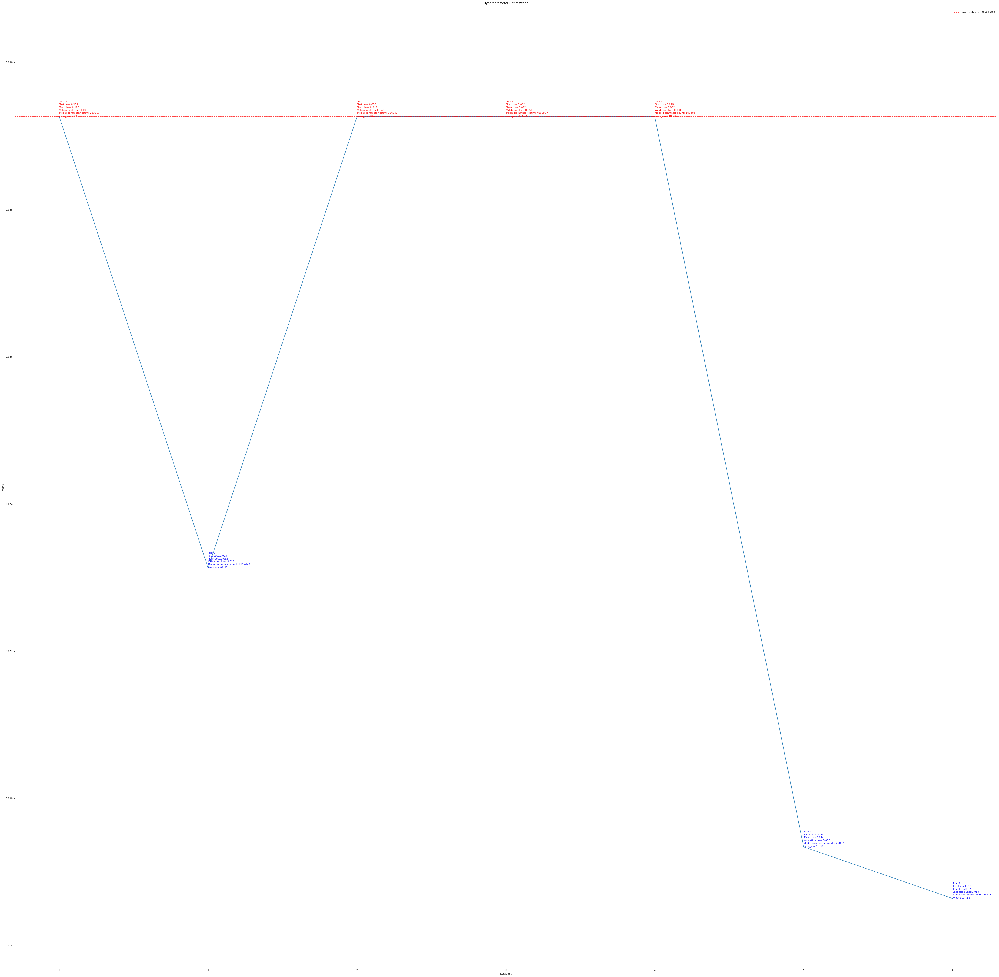

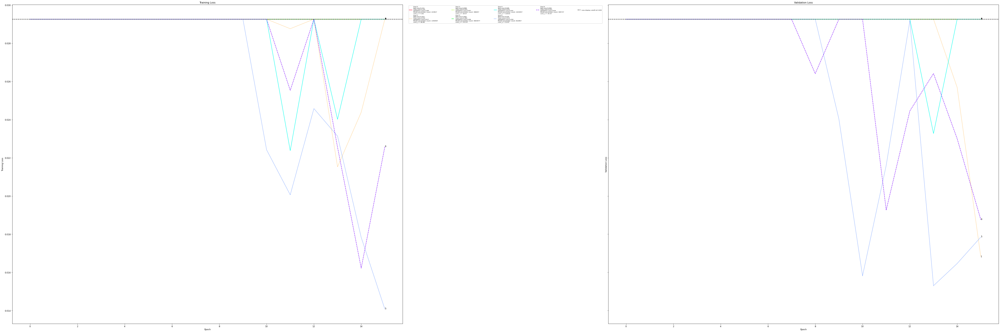

In [4]:
sys.argv = ['train', 
            '--tensors', DATA_DIRECTORY, 
            '--input_tensors', 'ecg_rest', 
            '--output_tensors', 'ventricular-rate',
            '--batch_size', '32', 
            '--epochs', '64',  
            '--test_steps', '96',
            '--max_models', '7',
            '--id', 'hyperoptimize_conv_x_ecg_rest_heart_rate']
args = parse_args()
optimize_conv_x(args)

2020-06-09 11:22:58,663 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/hyperoptimize_conv_x_ecg_rest_qrs_duration/log_2020-06-09_11-22_0.log.
2020-06-09 11:22:58,664 - arguments:402 - INFO - Command Line was: 
./scripts/tf.sh train --tensors /mnt/disks/ecg-rest-38k-tensors/2020-03-14/ --input_tensors ecg_rest --output_tensors qrs-duration --batch_size 32 --epochs 16 --test_steps 96 --max_models 7 --id hyperoptimize_conv_x_ecg_rest_qrs_duration

2020-06-09 11:22:58,665 - arguments:403 - INFO - Total TensorMaps: 6538 Arguments are Namespace(activation='relu', aligned_dimension=16, alpha=0.5, anneal_max=2.0, anneal_rate=0.0, anneal_shift=0.0, app_csv=None, b_slice_force=None, balance_csvs=[], batch_size=32, bigquery_credentials_file='/mnt/ml4cvd/projects/jamesp/bigquery/bigquery-viewer-credentials.json', bigquery_dataset='broad-ml4cvd.ukbb7089_r10data', block_size=3, bottleneck_type=<BottleneckType.FlattenRestructure: 1>, cache_size=43

input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d_160 (Conv1D)             (None, 5000, 32)     28448       input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation_208 (Activation)     (None, 5000, 32)     0           conv1d_160[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_64 (MaxPooling1D) (None, 2500, 32)     0           activation_208[0][0]             
__________________________________________________________________________________________________
conv1d_161 (Conv1D)             (None, 2500, 32)     75808       max_pooling1d_64[0][0]           
__________________________________________________________________________________________________
activation

__________________________________________________________________________________________________
  0%|          | 0/7 [00:00<?, ?it/s, best loss: ?]2020-06-09 11:23:10,122 - tensor_generators:653 - INFO - Found 26002 train, 7572 validation, and 3666 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 11:23:11,490 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 11:23:12,571 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps          
Epoch 1/16                                         
 1/72 [..............................]             
 - ETA: 6:49 - loss: 0.4402 - pearson: -0.2395     
                                                  
 2/72 [..............................]             
 - ETA: 3:26 - loss: 0.4100 - pearson: -0.1097     
                                                  
 3/72 [>.............................]             

 - ETA: 5s - loss: 0.3778 - pearson: 0.0053        
                                                   
50/72 [===================>..........]             
 - ETA: 5s - loss: 0.3767 - pearson: -6.2623e-04   
                                                  
51/72 [====================>.........]             
 - ETA: 4s - loss: 0.3790 - pearson: -0.0080       
                                                  
52/72 [====================>.........]             
 - ETA: 4s - loss: 0.3801 - pearson: -0.0092       
                                                  
53/72 [=====================>........]             
 - ETA: 4s - loss: 0.3802 - pearson: -0.0066       
                                                  
54/72 [=====================>........]             
 - ETA: 4s - loss: 0.3791 - pearson: -0.0041       
                                                  
55/72 [=====================>........]             
 - ETA: 3s - loss: 0.3821 - pearson: -0.0050       
                 

 - ETA: 6s - loss: 0.3541 - pearson: -0.0423       
                                                  
29/72 [===========>..................]             
 - ETA: 5s - loss: 0.3555 - pearson: -0.0432       
                                                  
30/72 [===========>..................]             
 - ETA: 5s - loss: 0.3513 - pearson: -0.0335       
                                                  
31/72 [===========>..................]             
 - ETA: 5s - loss: 0.3636 - pearson: -0.0277       
                                                  
32/72 [============>.................]             
 - ETA: 5s - loss: 0.3644 - pearson: -0.0249       
                                                  
33/72 [============>.................]             
 - ETA: 5s - loss: 0.3627 - pearson: -0.0145       
                                                  
34/72 [=============>................]             
 - ETA: 5s - loss: 0.3581 - pearson: -0.0142       
                  

 8/72 [==>...........................]             
 - ETA: 8s - loss: 0.3835 - pearson: 0.0117        
                                                   
 9/72 [==>...........................]             
 - ETA: 8s - loss: 0.3840 - pearson: 0.0376        
                                                   
10/72 [===>..........................]             
 - ETA: 8s - loss: 0.3683 - pearson: 0.0280        
                                                   
11/72 [===>..........................]             
 - ETA: 8s - loss: 0.3680 - pearson: 0.0586        
                                                   
12/72 [====>.........................]             
 - ETA: 8s - loss: 0.3667 - pearson: 0.0472        
                                                   
13/72 [====>.........................]             
 - ETA: 7s - loss: 0.3749 - pearson: 0.0644        
                                                   
14/72 [====>.........................]             
 - ETA: 7s -

 - ETA: 1s - loss: 0.3908 - pearson: 0.0569        
                                                   
61/72 [========================>.....]             
 - ETA: 1s - loss: 0.3947 - pearson: 0.0561        
                                                   
62/72 [========================>.....]             
 - ETA: 1s - loss: 0.3960 - pearson: 0.0550        
                                                   
63/72 [=========================>....]             
 - ETA: 1s - loss: 0.3954 - pearson: 0.0509        
                                                   
64/72 [=========================>....]             
 - ETA: 1s - loss: 0.3978 - pearson: 0.0541        
                                                   
65/72 [==========================>...]             
 - ETA: 0s - loss: 0.4003 - pearson: 0.0522        
                                                   
66/72 [==========================>...]             
 - ETA: 0s - loss: 0.3991 - pearson: 0.0505        
            

                                                   
40/72 [===============>..............]             
 - ETA: 4s - loss: 0.3749 - pearson: 0.0528        
                                                   
41/72 [================>.............]             
 - ETA: 4s - loss: 0.3784 - pearson: 0.0525        
                                                   
42/72 [================>.............]             
 - ETA: 4s - loss: 0.3820 - pearson: 0.0434        
                                                   
43/72 [================>.............]             
 - ETA: 3s - loss: 0.3776 - pearson: 0.0516        
                                                   
44/72 [=================>............]             
 - ETA: 3s - loss: 0.3769 - pearson: 0.0514        
                                                   
45/72 [=================>............]             
 - ETA: 3s - loss: 0.3760 - pearson: 0.0555        
                                                   
46/72 [=====

19/72 [======>.......................]             
 - ETA: 7s - loss: 0.3912 - pearson: 0.0423        
                                                   
20/72 [=======>......................]             
 - ETA: 7s - loss: 0.3951 - pearson: 0.0477        
                                                   
21/72 [=======>......................]             
 - ETA: 6s - loss: 0.3908 - pearson: 0.0376        
                                                   
22/72 [========>.....................]             
 - ETA: 6s - loss: 0.3890 - pearson: 0.0326        
                                                   
23/72 [========>.....................]             
 - ETA: 6s - loss: 0.3835 - pearson: 0.0273        
                                                   
24/72 [=========>....................]             
 - ETA: 6s - loss: 0.3815 - pearson: 0.0200        
                                                   
25/72 [=========>....................]             
 - ETA: 6s -

 - ETA: 0s - loss: 0.3824 - pearson: 0.0357        
                                                   
Epoch 00005: val_loss did not improve from 0.34986
                                                   
72/72 [==============================]             
 - 10s 136ms/step - loss: 0.3825 - pearson: 0.0365 - val_loss: 0.3632 - val_pearson: 0.1111

Epoch 6/16                                         
 1/72 [..............................]             
 - ETA: 7s - loss: 0.2976 - pearson: 0.2219        
                                                   
 2/72 [..............................]             
 - ETA: 7s - loss: 0.3580 - pearson: 0.1594        
                                                   
 3/72 [>.............................]             
 - ETA: 7s - loss: 0.3337 - pearson: 0.1780        
                                                   
 4/72 [>.............................]             
 - ETA: 7s - loss: 0.3601 - pearson: 0.1241        
                        

                                                   
51/72 [====================>.........]             
 - ETA: 2s - loss: 0.3684 - pearson: 0.1029        
                                                   
52/72 [====================>.........]             
 - ETA: 2s - loss: 0.3700 - pearson: 0.1013        
                                                   
53/72 [=====================>........]             
 - ETA: 2s - loss: 0.3668 - pearson: 0.1013        
                                                   
54/72 [=====================>........]             
 - ETA: 2s - loss: 0.3678 - pearson: 0.1053        
                                                   
55/72 [=====================>........]             
 - ETA: 2s - loss: 0.3702 - pearson: 0.1083        
                                                   
56/72 [======================>.......]             
 - ETA: 2s - loss: 0.3684 - pearson: 0.1057        
                                                   
57/72 [=====

 - ETA: 5s - loss: 0.4192 - pearson: 0.0995        
                                                   
30/72 [===========>..................]             
 - ETA: 5s - loss: 0.4147 - pearson: 0.1127        
                                                   
31/72 [===========>..................]             
 - ETA: 5s - loss: 0.4106 - pearson: 0.1122        
                                                   
32/72 [============>.................]             
 - ETA: 5s - loss: 0.4075 - pearson: 0.1110        
                                                   
33/72 [============>.................]             
 - ETA: 5s - loss: 0.4048 - pearson: 0.1250        
                                                   
34/72 [=============>................]             
 - ETA: 5s - loss: 0.4048 - pearson: 0.1280        
                                                   
35/72 [=============>................]             
 - ETA: 4s - loss: 0.4024 - pearson: 0.1282        
            

 8/72 [==>...........................]             
 - ETA: 8s - loss: 0.4282 - pearson: 0.1987        
                                                   
 9/72 [==>...........................]             
 - ETA: 8s - loss: 0.4422 - pearson: 0.1765        
                                                   
10/72 [===>..........................]             
 - ETA: 8s - loss: 0.4492 - pearson: 0.1744        
                                                   
11/72 [===>..........................]             
 - ETA: 8s - loss: 0.4381 - pearson: 0.1533        
                                                   
12/72 [====>.........................]             
 - ETA: 8s - loss: 0.4247 - pearson: 0.1737        
                                                   
13/72 [====>.........................]             
 - ETA: 8s - loss: 0.4101 - pearson: 0.1668        
                                                   
14/72 [====>.........................]             
 - ETA: 7s -

 - ETA: 1s - loss: 0.4102 - pearson: 0.1645        
                                                   
61/72 [========================>.....]             
 - ETA: 1s - loss: 0.4074 - pearson: 0.1637        
                                                   
62/72 [========================>.....]             
 - ETA: 1s - loss: 0.4042 - pearson: 0.1608        
                                                   
63/72 [=========================>....]             
 - ETA: 1s - loss: 0.4062 - pearson: 0.1592        
                                                   
64/72 [=========================>....]             
 - ETA: 1s - loss: 0.4050 - pearson: 0.1582        
                                                   
65/72 [==========================>...]             
 - ETA: 0s - loss: 0.4032 - pearson: 0.1585        
                                                   
66/72 [==========================>...]             
 - ETA: 0s - loss: 0.4018 - pearson: 0.1548        
            

                                                   
40/72 [===============>..............]             
 - ETA: 3s - loss: 0.3601 - pearson: 0.0739        
                                                   
41/72 [================>.............]             
 - ETA: 3s - loss: 0.3619 - pearson: 0.0669        
                                                   
42/72 [================>.............]             
 - ETA: 3s - loss: 0.3631 - pearson: 0.0662        
                                                   
43/72 [================>.............]             
 - ETA: 3s - loss: 0.3645 - pearson: 0.0608        
                                                   
44/72 [=================>............]             
 - ETA: 3s - loss: 0.3675 - pearson: 0.0588        
                                                   
45/72 [=================>............]             
 - ETA: 3s - loss: 0.3638 - pearson: 0.0586        
                                                   
46/72 [=====

19/72 [======>.......................]             
 - ETA: 6s - loss: 0.3724 - pearson: 0.1057        
                                                   
20/72 [=======>......................]             
 - ETA: 6s - loss: 0.3640 - pearson: 0.0904        
                                                   
21/72 [=======>......................]             
 - ETA: 5s - loss: 0.3648 - pearson: 0.0882        
                                                   
22/72 [========>.....................]             
 - ETA: 5s - loss: 0.3654 - pearson: 0.0832        
                                                   
23/72 [========>.....................]             
 - ETA: 5s - loss: 0.3641 - pearson: 0.0810        
                                                   
24/72 [=========>....................]             
 - ETA: 5s - loss: 0.3663 - pearson: 0.0865        
                                                   
25/72 [=========>....................]             
 - ETA: 5s -

 - ETA: 0s - loss: 0.3859 - pearson: 0.1185        
                                                   
Epoch 00010: val_loss did not improve from 0.34104
                                                   
72/72 [==============================]             
 - 9s 126ms/step - loss: 0.3858 - pearson: 0.1182 - val_loss: 0.3884 - val_pearson: 0.1169

Epoch 11/16                                        
 1/72 [..............................]             
 - ETA: 9s - loss: 0.6497 - pearson: 0.4147        
                                                   
 2/72 [..............................]             
 - ETA: 8s - loss: 0.5490 - pearson: 0.3554        
                                                   
 3/72 [>.............................]             
 - ETA: 8s - loss: 0.4494 - pearson: 0.2939        
                                                   
 4/72 [>.............................]             
 - ETA: 8s - loss: 0.3989 - pearson: 0.2364        
                         

                                                   
51/72 [====================>.........]             
 - ETA: 2s - loss: 0.3666 - pearson: 0.2282        
                                                   
52/72 [====================>.........]             
 - ETA: 2s - loss: 0.3647 - pearson: 0.2340        
                                                   
53/72 [=====================>........]             
 - ETA: 2s - loss: 0.3652 - pearson: 0.2389        
                                                   
54/72 [=====================>........]             
 - ETA: 2s - loss: 0.3637 - pearson: 0.2400        
                                                   
55/72 [=====================>........]             
 - ETA: 1s - loss: 0.3625 - pearson: 0.2386        
                                                   
56/72 [======================>.......]             
 - ETA: 1s - loss: 0.3619 - pearson: 0.2330        
                                                   
57/72 [=====

 - ETA: 5s - loss: 0.3439 - pearson: 0.3271        
                                                   
21/72 [=======>......................]             
 - ETA: 5s - loss: 0.3474 - pearson: 0.3234        
                                                   
22/72 [========>.....................]             
 - ETA: 5s - loss: 0.3470 - pearson: 0.3356        
                                                   
23/72 [========>.....................]             
 - ETA: 5s - loss: 0.3491 - pearson: 0.3217        
                                                   
24/72 [=========>....................]             
 - ETA: 5s - loss: 0.3498 - pearson: 0.3226        
                                                   
25/72 [=========>....................]             
 - ETA: 5s - loss: 0.3500 - pearson: 0.3217        
                                                   
26/72 [=========>....................]             
 - ETA: 5s - loss: 0.3447 - pearson: 0.3214        
            

                                                   
72/72 [==============================]             
 - 9s 125ms/step - loss: 0.3478 - pearson: 0.3347 - val_loss: 0.3112 - val_pearson: 0.3878

Epoch 13/16                                        
 1/72 [..............................]             
 - ETA: 7s - loss: 0.3834 - pearson: 0.3327        
                                                   
 2/72 [..............................]             
 - ETA: 7s - loss: 0.2823 - pearson: 0.3335        
                                                   
 3/72 [>.............................]             
 - ETA: 7s - loss: 0.3413 - pearson: 0.3939        
                                                   
 4/72 [>.............................]             
 - ETA: 7s - loss: 0.3249 - pearson: 0.4512        
                                                   
 5/72 [=>............................]             
 - ETA: 7s - loss: 0.3507 - pearson: 0.3610        
                        

                                                   
52/72 [====================>.........]             
 - ETA: 2s - loss: 0.3091 - pearson: 0.3673        
                                                   
53/72 [=====================>........]             
 - ETA: 2s - loss: 0.3137 - pearson: 0.3646        
                                                   
54/72 [=====================>........]             
 - ETA: 2s - loss: 0.3117 - pearson: 0.3646        
                                                   
55/72 [=====================>........]             
 - ETA: 1s - loss: 0.3144 - pearson: 0.3604        
                                                   
56/72 [======================>.......]             
 - ETA: 1s - loss: 0.3155 - pearson: 0.3578        
                                                   
57/72 [======================>.......]             
 - ETA: 1s - loss: 0.3150 - pearson: 0.3547        
                                                   
58/72 [=====

31/72 [===========>..................]             
 - ETA: 4s - loss: 0.3566 - pearson: 0.4617        
                                                   
32/72 [============>.................]             
 - ETA: 4s - loss: 0.3554 - pearson: 0.4538        
                                                   
33/72 [============>.................]             
 - ETA: 4s - loss: 0.3565 - pearson: 0.4503        
                                                   
34/72 [=============>................]             
 - ETA: 4s - loss: 0.3508 - pearson: 0.4488        
                                                   
35/72 [=============>................]             
 - ETA: 4s - loss: 0.3471 - pearson: 0.4590        
                                                   
36/72 [==============>...............]             
 - ETA: 4s - loss: 0.3436 - pearson: 0.4606        
                                                   
37/72 [==============>...............]             
 - ETA: 3s -

 - ETA: 6s - loss: 0.2605 - pearson: 0.5134        
                                                   
11/72 [===>..........................]             
 - ETA: 6s - loss: 0.2624 - pearson: 0.5320        
                                                   
12/72 [====>.........................]             
 - ETA: 6s - loss: 0.2621 - pearson: 0.5134        
                                                   
13/72 [====>.........................]             
 - ETA: 6s - loss: 0.2673 - pearson: 0.5001        
                                                   
14/72 [====>.........................]             
 - ETA: 6s - loss: 0.2692 - pearson: 0.5110        
                                                   
15/72 [=====>........................]             
 - ETA: 6s - loss: 0.2705 - pearson: 0.5087        
                                                   
16/72 [=====>........................]             
 - ETA: 6s - loss: 0.2702 - pearson: 0.5117        
            

                                                   
63/72 [=========================>....]             
 - ETA: 1s - loss: 0.2908 - pearson: 0.5364        
                                                   
64/72 [=========================>....]             
 - ETA: 0s - loss: 0.2902 - pearson: 0.5348        
                                                   
65/72 [==========================>...]             
 - ETA: 0s - loss: 0.2897 - pearson: 0.5396        
                                                   
66/72 [==========================>...]             
 - ETA: 0s - loss: 0.2903 - pearson: 0.5402        
                                                   
67/72 [==========================>...]             
 - ETA: 0s - loss: 0.2893 - pearson: 0.5398        
                                                   
68/72 [===========================>..]             
 - ETA: 0s - loss: 0.2878 - pearson: 0.5395        
                                                   
69/72 [=====

 - ETA: 3s - loss: 0.2754 - pearson: 0.6132        
                                                   
42/72 [================>.............]             
 - ETA: 3s - loss: 0.2761 - pearson: 0.6033        
                                                   
43/72 [================>.............]             
 - ETA: 3s - loss: 0.2728 - pearson: 0.6039        
                                                   
44/72 [=================>............]             
 - ETA: 3s - loss: 0.2722 - pearson: 0.6063        
                                                   
45/72 [=================>............]             
 - ETA: 3s - loss: 0.2716 - pearson: 0.6073        
                                                   
46/72 [==================>...........]             
 - ETA: 2s - loss: 0.2703 - pearson: 0.6070        
                                                   
47/72 [==================>...........]             
 - ETA: 2s - loss: 0.2735 - pearson: 0.6000        
            

 - ETA: 2s - loss: 0.2379 - pearson: 0.6888        
                                                   
 992/3072 [========>.....................]         
 - ETA: 2s - loss: 0.2355 - pearson: 0.6852        
                                                   
1056/3072 [=========>....................]         
 - ETA: 2s - loss: 0.2330 - pearson: 0.6832        
                                                   
1120/3072 [=========>....................]         
 - ETA: 2s - loss: 0.2358 - pearson: 0.6762        
                                                   
1184/3072 [==========>...................]         
 - ETA: 2s - loss: 0.2360 - pearson: 0.6692        
                                                   
1248/3072 [===========>..................]         
 - ETA: 1s - loss: 0.2355 - pearson: 0.6735        
                                                   
1312/3072 [===========>..................]         
 - ETA: 1s - loss: 0.2346 - pearson: 0.6738        
            

Model: "model_17"                                                            
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d_170 (Conv1D)             (None, 5000, 32)     23840       input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation_221 (Activation)     (None, 5000, 32)     0           conv1d_170[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_68 (MaxPooling1D) (None, 2500, 32)     0           activation_221[0][0]             
_______________________________

output_QRSDuration_continuous ( (None, 1)            65          activation_232[0][0]             
Total params: 935,177                                                        
Trainable params: 935,177                                                    
Non-trainable params: 0                                                      
__________________________________________________________________________________________________
 14%|█▍        | 1/7 [02:46<16:38, 166.37s/it, best loss: 0.2460027535756429]2020-06-09 11:25:56,473 - tensor_generators:653 - INFO - Found 25967 train, 7540 validation, and 3733 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 11:25:57,967 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 11:25:58,880 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps                                    
Epoch 1/16                  

31/72 [===========>..................]                                       
 - ETA: 13s - loss: 0.3673 - pearson: -0.0133                                
                                                                             
32/72 [============>.................]                                       
 - ETA: 13s - loss: 0.3669 - pearson: -0.0091                                
                                                                             
33/72 [============>.................]                                       
 - ETA: 12s - loss: 0.3732 - pearson: -0.0151                                
                                                                             
34/72 [=============>................]                                       
 - ETA: 12s - loss: 0.3774 - pearson: -0.0176                                
                                                                             
35/72 [=============>................]                          

66/72 [==========================>...]                                       
 - ETA: 1s - loss: 0.3752 - pearson: 0.0198                                  
                                                                             
67/72 [==========================>...]                                       
 - ETA: 1s - loss: 0.3776 - pearson: 0.0243                                  
                                                                             
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3747 - pearson: 0.0299                                  
                                                                             
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3743 - pearson: 0.0335                                  
                                                                             
70/72 [============================>.]                          

                                                                            
28/72 [==========>...................]                                       
 - ETA: 5s - loss: 0.3643 - pearson: -0.0271                                 
                                                                            
29/72 [===========>..................]                                       
 - ETA: 5s - loss: 0.3624 - pearson: -0.0346                                 
                                                                            
30/72 [===========>..................]                                       
 - ETA: 5s - loss: 0.3663 - pearson: -0.0255                                 
                                                                            
31/72 [===========>..................]                                       
 - ETA: 5s - loss: 0.3654 - pearson: -0.0184                                 
                                                                    

                                                                            
63/72 [=========================>....]                                       
 - ETA: 1s - loss: 0.3848 - pearson: -0.0118                                 
                                                                            
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3850 - pearson: -0.0092                                 
                                                                            
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3861 - pearson: -0.0125                                 
                                                                            
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3860 - pearson: -0.0094                                 
                                                                    

25/72 [=========>....................]                                       
 - ETA: 6s - loss: 0.4484 - pearson: 0.0463                                  
                                                                             
26/72 [=========>....................]                                       
 - ETA: 6s - loss: 0.4458 - pearson: 0.0514                                  
                                                                             
27/72 [==========>...................]                                       
 - ETA: 5s - loss: 0.4406 - pearson: 0.0471                                  
                                                                             
28/72 [==========>...................]                                       
 - ETA: 5s - loss: 0.4355 - pearson: 0.0461                                  
                                                                             
29/72 [===========>..................]                          

60/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.4009 - pearson: 0.0518                                  
                                                                             
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3998 - pearson: 0.0515                                  
                                                                             
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3999 - pearson: 0.0528                                  
                                                                             
63/72 [=========================>....]                                       
 - ETA: 1s - loss: 0.4015 - pearson: 0.0532                                  
                                                                             
64/72 [=========================>....]                          

 - ETA: 6s - loss: 0.3799 - pearson: 0.0758                                  
                                                                             
23/72 [========>.....................]                                       
 - ETA: 6s - loss: 0.3778 - pearson: 0.0816                                  
                                                                             
24/72 [=========>....................]                                       
 - ETA: 6s - loss: 0.3753 - pearson: 0.0708                                  
                                                                             
25/72 [=========>....................]                                       
 - ETA: 5s - loss: 0.3738 - pearson: 0.0751                                  
                                                                             
26/72 [=========>....................]                                       
 - ETA: 5s - loss: 0.3818 - pearson: 0.0700                     

 - ETA: 1s - loss: 0.3910 - pearson: 0.0923                                  
                                                                             
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3883 - pearson: 0.0931                                  
                                                                             
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3913 - pearson: 0.0915                                  
                                                                             
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3924 - pearson: 0.0945                                  
                                                                             
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3929 - pearson: 0.0915                     

19/72 [======>.......................]                                       
 - ETA: 6s - loss: 0.3855 - pearson: 0.0025                                  
                                                                             
20/72 [=======>......................]                                       
 - ETA: 6s - loss: 0.3828 - pearson: 0.0033                                  
                                                                             
21/72 [=======>......................]                                       
 - ETA: 6s - loss: 0.3864 - pearson: 0.0105                                  
                                                                             
22/72 [========>.....................]                                       
 - ETA: 6s - loss: 0.3917 - pearson: 0.0226                                  
                                                                             
23/72 [========>.....................]                          

54/72 [=====================>........]                                       
 - ETA: 2s - loss: 0.4008 - pearson: 0.0819                                  
                                                                             
55/72 [=====================>........]                                       
 - ETA: 2s - loss: 0.4036 - pearson: 0.0806                                  
                                                                             
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.4008 - pearson: 0.0795                                  
                                                                             
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.4005 - pearson: 0.0804                                  
                                                                             
58/72 [=======================>......]                          

 - ETA: 7s - loss: 0.3712 - pearson: 0.0084                                  
                                                                             
17/72 [======>.......................]                                       
 - ETA: 7s - loss: 0.3641 - pearson: 0.0229                                  
                                                                             
18/72 [======>.......................]                                       
 - ETA: 7s - loss: 0.3657 - pearson: 0.0332                                  
                                                                             
19/72 [======>.......................]                                       
 - ETA: 7s - loss: 0.3642 - pearson: 0.0253                                  
                                                                             
20/72 [=======>......................]                                       
 - ETA: 6s - loss: 0.3660 - pearson: 0.0222                     

 - ETA: 2s - loss: 0.3592 - pearson: 0.0607                                  
                                                                             
52/72 [====================>.........]                                       
 - ETA: 2s - loss: 0.3590 - pearson: 0.0523                                  
                                                                             
53/72 [=====================>........]                                       
 - ETA: 2s - loss: 0.3575 - pearson: 0.0551                                  
                                                                             
54/72 [=====================>........]                                       
 - ETA: 2s - loss: 0.3579 - pearson: 0.0561                                  
                                                                             
55/72 [=====================>........]                                       
 - ETA: 2s - loss: 0.3600 - pearson: 0.0505                     

                                                                             
14/72 [====>.........................]                                       
 - ETA: 7s - loss: 0.3185 - pearson: 0.0609                                  
                                                                             
15/72 [=====>........................]                                       
 - ETA: 7s - loss: 0.3230 - pearson: 0.0749                                  
                                                                             
16/72 [=====>........................]                                       
 - ETA: 6s - loss: 0.3199 - pearson: 0.0791                                  
                                                                             
17/72 [======>.......................]                                       
 - ETA: 6s - loss: 0.3278 - pearson: 0.0704                                  
                                                                

                                                                             
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3624 - pearson: 0.0998                                  
                                                                             
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3616 - pearson: 0.0980                                  
                                                                             
51/72 [====================>.........]                                       
 - ETA: 2s - loss: 0.3608 - pearson: 0.0945                                  
                                                                             
52/72 [====================>.........]                                       
 - ETA: 2s - loss: 0.3608 - pearson: 0.0953                                  
                                                                

11/72 [===>..........................]                                       
 - ETA: 7s - loss: 0.4188 - pearson: 0.0903                                  
                                                                             
12/72 [====>.........................]                                       
 - ETA: 7s - loss: 0.4072 - pearson: 0.0953                                  
                                                                             
13/72 [====>.........................]                                       
 - ETA: 7s - loss: 0.3941 - pearson: 0.1066                                  
                                                                             
14/72 [====>.........................]                                       
 - ETA: 7s - loss: 0.3957 - pearson: 0.1135                                  
                                                                             
15/72 [=====>........................]                          

46/72 [==================>...........]                                       
 - ETA: 3s - loss: 0.3648 - pearson: 0.0895                                  
                                                                             
47/72 [==================>...........]                                       
 - ETA: 3s - loss: 0.3655 - pearson: 0.0861                                  
                                                                             
48/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3717 - pearson: 0.0823                                  
                                                                             
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3723 - pearson: 0.0778                                  
                                                                             
50/72 [===================>..........]                          

 - ETA: 7s - loss: 0.3002 - pearson: -0.0038                                 
                                                                            
 9/72 [==>...........................]                                       
 - ETA: 7s - loss: 0.3010 - pearson: 0.0151                                  
                                                                             
10/72 [===>..........................]                                       
 - ETA: 7s - loss: 0.3032 - pearson: 0.0125                                  
                                                                             
11/72 [===>..........................]                                       
 - ETA: 7s - loss: 0.3083 - pearson: 0.0211                                  
                                                                             
12/72 [====>.........................]                                       
 - ETA: 7s - loss: 0.3178 - pearson: 0.0242                      

 - ETA: 3s - loss: 0.3630 - pearson: 0.0502                                  
                                                                             
44/72 [=================>............]                                       
 - ETA: 3s - loss: 0.3619 - pearson: 0.0532                                  
                                                                             
45/72 [=================>............]                                       
 - ETA: 3s - loss: 0.3585 - pearson: 0.0559                                  
                                                                             
46/72 [==================>...........]                                       
 - ETA: 2s - loss: 0.3551 - pearson: 0.0581                                  
                                                                             
47/72 [==================>...........]                                       
 - ETA: 2s - loss: 0.3565 - pearson: 0.0631                     

 - ETA: 7s - loss: 0.4337 - pearson: 0.0452                                  
                                                                             
 3/72 [>.............................]                                       
 - ETA: 7s - loss: 0.3911 - pearson: 0.0976                                  
                                                                             
 4/72 [>.............................]                                       
 - ETA: 7s - loss: 0.4492 - pearson: 0.0895                                  
                                                                             
 5/72 [=>............................]                                       
 - ETA: 7s - loss: 0.4555 - pearson: 0.0848                                  
                                                                             
 6/72 [=>............................]                                       
 - ETA: 7s - loss: 0.4195 - pearson: 0.0713                     

 - ETA: 3s - loss: 0.4007 - pearson: 0.0415                                  
                                                                             
38/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.3988 - pearson: 0.0335                                  
                                                                             
39/72 [===============>..............]                                       
 - ETA: 3s - loss: 0.3994 - pearson: 0.0380                                  
                                                                             
40/72 [===============>..............]                                       
 - ETA: 3s - loss: 0.3959 - pearson: 0.0390                                  
                                                                             
41/72 [================>.............]                                       
 - ETA: 3s - loss: 0.3919 - pearson: 0.0383                     

                                                                             
72/72 [==============================]                                       
 - 9s 121ms/step - loss: 0.3873 - pearson: 0.0565 - val_loss: 0.3601 - val_pearson: 0.0689

Epoch 11/16                                                                  
 1/72 [..............................]                                       
 - ETA: 6s - loss: 0.4343 - pearson: -0.0053                                 
                                                                            
 2/72 [..............................]                                       
 - ETA: 7s - loss: 0.3791 - pearson: 0.0632                                  
                                                                             
 3/72 [>.............................]                                       
 - ETA: 7s - loss: 0.3555 - pearson: 0.0954                                  
                                                   

 - ETA: 4s - loss: 0.3569 - pearson: 0.1041                                  
                                                                             
35/72 [=============>................]                                       
 - ETA: 4s - loss: 0.3611 - pearson: 0.1038                                  
                                                                             
36/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.3652 - pearson: 0.0987                                  
                                                                             
37/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.3682 - pearson: 0.0963                                  
                                                                             
38/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.3699 - pearson: 0.0905                     

66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3600 - pearson: 0.1064                                  
                                                                             
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3605 - pearson: 0.1025                                  
                                                                             
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3623 - pearson: 0.1062                                  
                                                                             
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3605 - pearson: 0.1070                                  
                                                                             
70/72 [============================>.]                          

 - ETA: 4s - loss: 0.4008 - pearson: 0.2191                                  
                                                                             
29/72 [===========>..................]                                       
 - ETA: 4s - loss: 0.3967 - pearson: 0.2194                                  
                                                                             
30/72 [===========>..................]                                       
 - ETA: 4s - loss: 0.3945 - pearson: 0.2149                                  
                                                                             
31/72 [===========>..................]                                       
 - ETA: 4s - loss: 0.3929 - pearson: 0.2218                                  
                                                                             
32/72 [============>.................]                                       
 - ETA: 4s - loss: 0.3961 - pearson: 0.2289                     

 - ETA: 0s - loss: 0.3657 - pearson: 0.2864                                  
                                                                             
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3689 - pearson: 0.2884                                  
                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3708 - pearson: 0.2889                                  
                                                                             
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3686 - pearson: 0.2941                                  
                                                                             
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3691 - pearson: 0.2969                     

                                                                             
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3305 - pearson: 0.3442                                  
                                                                             
27/72 [==========>...................]                                       
 - ETA: 4s - loss: 0.3291 - pearson: 0.3506                                  
                                                                             
28/72 [==========>...................]                                       
 - ETA: 4s - loss: 0.3271 - pearson: 0.3499                                  
                                                                             
29/72 [===========>..................]                                       
 - ETA: 4s - loss: 0.3335 - pearson: 0.3545                                  
                                                                

                                                                             
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3353 - pearson: 0.3754                                  
                                                                             
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3352 - pearson: 0.3753                                  
                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3339 - pearson: 0.3692                                  
                                                                             
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3341 - pearson: 0.3628                                  
                                                                

 - ETA: 5s - loss: 0.3319 - pearson: 0.4831                                  
                                                                             
23/72 [========>.....................]                                       
 - ETA: 5s - loss: 0.3276 - pearson: 0.4761                                  
                                                                             
24/72 [=========>....................]                                       
 - ETA: 5s - loss: 0.3265 - pearson: 0.4719                                  
                                                                             
25/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3243 - pearson: 0.4707                                  
                                                                             
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3243 - pearson: 0.4717                     

 - ETA: 1s - loss: 0.3255 - pearson: 0.4912                                  
                                                                             
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3255 - pearson: 0.4934                                  
                                                                             
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3258 - pearson: 0.4918                                  
                                                                             
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3264 - pearson: 0.4942                                  
                                                                             
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3291 - pearson: 0.4979                     

                                                                             
20/72 [=======>......................]                                       
 - ETA: 5s - loss: 0.2812 - pearson: 0.5263                                  
                                                                             
21/72 [=======>......................]                                       
 - ETA: 5s - loss: 0.2788 - pearson: 0.5307                                  
                                                                             
22/72 [========>.....................]                                       
 - ETA: 5s - loss: 0.2768 - pearson: 0.5196                                  
                                                                             
23/72 [========>.....................]                                       
 - ETA: 5s - loss: 0.2791 - pearson: 0.5281                                  
                                                                

                                                                             
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.2690 - pearson: 0.5539                                  
                                                                             
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.2681 - pearson: 0.5498                                  
                                                                             
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.2677 - pearson: 0.5467                                  
                                                                             
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.2659 - pearson: 0.5494                                  
                                                                

 - ETA: 5s - loss: 0.2593 - pearson: 0.6364                                  
                                                                             
17/72 [======>.......................]                                       
 - ETA: 5s - loss: 0.2578 - pearson: 0.6359                                  
                                                                             
18/72 [======>.......................]                                       
 - ETA: 5s - loss: 0.2713 - pearson: 0.6406                                  
                                                                             
19/72 [======>.......................]                                       
 - ETA: 5s - loss: 0.2700 - pearson: 0.6212                                  
                                                                             
20/72 [=======>......................]                                       
 - ETA: 5s - loss: 0.2696 - pearson: 0.6317                     

 - ETA: 2s - loss: 0.2858 - pearson: 0.5863                                  
                                                                             
52/72 [====================>.........]                                       
 - ETA: 2s - loss: 0.2859 - pearson: 0.5862                                  
                                                                             
53/72 [=====================>........]                                       
 - ETA: 2s - loss: 0.2861 - pearson: 0.5858                                  
                                                                             
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.2850 - pearson: 0.5892                                  
                                                                             
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.2831 - pearson: 0.5869                     

 - ETA: 3s - loss: 0.2860 - pearson: 0.5941                                  
                                                                             
 672/3072 [=====>........................]                                   
 - ETA: 2s - loss: 0.2768 - pearson: 0.5804                                  
                                                                             
 736/3072 [======>.......................]                                   
 - ETA: 2s - loss: 0.2871 - pearson: 0.5775                                  
                                                                             
 800/3072 [======>.......................]                                   
 - ETA: 2s - loss: 0.2861 - pearson: 0.5987                                  
                                                                             
 864/3072 [=======>......................]                                   
 - ETA: 2s - loss: 0.2797 - pearson: 0.6012                     

 - ETA: 0s - loss: 0.2678 - pearson: 0.5805                                  
                                                                             
2912/3072 [===========================>..]                                   
 - ETA: 0s - loss: 0.2705 - pearson: 0.5827                                  
                                                                             
2976/3072 [============================>.]                                   
 - ETA: 0s - loss: 0.2702 - pearson: 0.5818                                  
                                                                             
3040/3072 [============================>.]                                   
 - ETA: 0s - loss: 0.2709 - pearson: 0.5817                                  
                                                                             
3072/3072 [==============================]                                   
 - 3s 971us/sample - loss: 0.2713 - pearson: 0.5809             

__________________________________________________________________________________________________
activation_237 (Activation)     (None, 2500, 32)     0           conv1d_183[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_73 (MaxPooling1D) (None, 1250, 32)     0           activation_237[0][0]             
__________________________________________________________________________________________________
conv1d_184 (Conv1D)             (None, 1250, 24)     10776       max_pooling1d_73[0][0]           
__________________________________________________________________________________________________
activation_238 (Activation)     (None, 1250, 24)     0           conv1d_184[0][0]                 
__________________________________________________________________________________________________
concatenate_110 (Concatenate)   (None, 1250, 56)     0           max_pooling1d_73[0][0]           
          

                                                                            
 8/72 [==>...........................]                                       
 - ETA: 57s - loss: 0.4497 - pearson: -0.1313                                
                                                                             
 9/72 [==>...........................]                                       
 - ETA: 50s - loss: 0.4379 - pearson: -0.1387                                
                                                                             
10/72 [===>..........................]                                       
 - ETA: 45s - loss: 0.4343 - pearson: -0.1266                                
                                                                             
11/72 [===>..........................]                                       
 - ETA: 40s - loss: 0.4364 - pearson: -0.1180                                
                                                                 

                                                                             
43/72 [================>.............]                                       
 - ETA: 6s - loss: 0.3750 - pearson: 0.0254                                  
                                                                             
44/72 [=================>............]                                       
 - ETA: 6s - loss: 0.3801 - pearson: 0.0166                                  
                                                                             
45/72 [=================>............]                                       
 - ETA: 6s - loss: 0.3773 - pearson: 0.0200                                  
                                                                             
46/72 [==================>...........]                                       
 - ETA: 5s - loss: 0.3789 - pearson: 0.0162                                  
                                                                

 - ETA: 4s - loss: 0.4660 - pearson: -0.0168                                 
                                                                            
 5/72 [=>............................]                                       
 - ETA: 4s - loss: 0.4134 - pearson: -0.0227                                 
                                                                            
 6/72 [=>............................]                                       
 - ETA: 4s - loss: 0.4298 - pearson: -0.0527                                 
                                                                            
 7/72 [=>............................]                                       
 - ETA: 4s - loss: 0.4867 - pearson: -0.0782                                 
                                                                            
 8/72 [==>...........................]                                       
 - ETA: 5s - loss: 0.4614 - pearson: -0.0413                        

 - ETA: 3s - loss: 0.4105 - pearson: -0.0427                                 
                                                                            
40/72 [===============>..............]                                       
 - ETA: 3s - loss: 0.4135 - pearson: -0.0347                                 
                                                                            
41/72 [================>.............]                                       
 - ETA: 3s - loss: 0.4094 - pearson: -0.0337                                 
                                                                            
42/72 [================>.............]                                       
 - ETA: 2s - loss: 0.4089 - pearson: -0.0266                                 
                                                                            
43/72 [================>.............]                                       
 - ETA: 2s - loss: 0.4072 - pearson: -0.0244                        

 1/72 [..............................]                                       
 - ETA: 4s - loss: 0.3530 - pearson: -0.0414                                 
                                                                            
 2/72 [..............................]                                       
 - ETA: 5s - loss: 0.3827 - pearson: 0.0039                                  
                                                                             
 3/72 [>.............................]                                       
 - ETA: 5s - loss: 0.3560 - pearson: 0.0198                                  
                                                                             
 4/72 [>.............................]                                       
 - ETA: 5s - loss: 0.3493 - pearson: -0.0344                                 
                                                                            
 5/72 [=>............................]                            

36/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.3950 - pearson: 0.0310                                  
                                                                             
37/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.3924 - pearson: 0.0327                                  
                                                                             
38/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.3904 - pearson: 0.0268                                  
                                                                             
39/72 [===============>..............]                                       
 - ETA: 3s - loss: 0.3885 - pearson: 0.0254                                  
                                                                             
40/72 [===============>..............]                          

71/72 [============================>.]                                       
 - ETA: 0s - loss: 0.3940 - pearson: 0.0351                                  
                                                                             
Epoch 00003: val_loss did not improve from 0.37766
                                                                             
72/72 [==============================]                                       
 - 8s 109ms/step - loss: 0.3981 - pearson: 0.0365 - val_loss: 0.4003 - val_pearson: 0.0625

Epoch 4/16                                                                   
 1/72 [..............................]                                       
 - ETA: 4s - loss: 0.2734 - pearson: 0.0954                                  
                                                                             
 2/72 [..............................]                                       
 - ETA: 5s - loss: 0.4130 - pearson: 0.0541                                  

 - ETA: 3s - loss: 0.3961 - pearson: 0.0085                                  
                                                                             
34/72 [=============>................]                                       
 - ETA: 3s - loss: 0.3942 - pearson: 0.0128                                  
                                                                             
35/72 [=============>................]                                       
 - ETA: 3s - loss: 0.3979 - pearson: 0.0070                                  
                                                                             
36/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.3984 - pearson: 0.0078                                  
                                                                             
37/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.4004 - pearson: 0.0045                     

 - ETA: 0s - loss: 0.3729 - pearson: -0.0128                                 
                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3713 - pearson: -0.0096                                 
                                                                            
70/72 [============================>.]                                       
 - ETA: 0s - loss: 0.3702 - pearson: -0.0059                                 
                                                                            
71/72 [============================>.]                                       
 - ETA: 0s - loss: 0.3695 - pearson: -0.0071                                 
                                                                             
Epoch 00004: val_loss improved from 0.37766 to 0.34330, saving model to ./recipes_output/hyperoptimize_conv_x_ecg_rest_qrs_duration/plots/archite

30/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.3992 - pearson: 0.0273                                  
                                                                             
31/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.3957 - pearson: 0.0320                                  
                                                                             
32/72 [============>.................]                                       
 - ETA: 3s - loss: 0.4012 - pearson: 0.0207                                  
                                                                             
33/72 [============>.................]                                       
 - ETA: 3s - loss: 0.3999 - pearson: 0.0215                                  
                                                                             
34/72 [=============>................]                          

65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3829 - pearson: 0.0361                                  
                                                                             
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3813 - pearson: 0.0386                                  
                                                                             
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3795 - pearson: 0.0360                                  
                                                                             
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3817 - pearson: 0.0332                                  
                                                                             
69/72 [===========================>..]                          

 - ETA: 4s - loss: 0.3512 - pearson: 0.0892                                  
                                                                             
28/72 [==========>...................]                                       
 - ETA: 4s - loss: 0.3472 - pearson: 0.0931                                  
                                                                             
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.3532 - pearson: 0.0973                                  
                                                                             
30/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.3644 - pearson: 0.0907                                  
                                                                             
31/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.3627 - pearson: 0.0981                     

 - ETA: 0s - loss: 0.3827 - pearson: 0.1114                                  
                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3814 - pearson: 0.1112                                  
                                                                             
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3836 - pearson: 0.1111                                  
                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3844 - pearson: 0.1010                                  
                                                                             
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3837 - pearson: 0.0986                     

                                                                             
25/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3474 - pearson: 0.1084                                  
                                                                             
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3493 - pearson: 0.1147                                  
                                                                             
27/72 [==========>...................]                                       
 - ETA: 4s - loss: 0.3517 - pearson: 0.1035                                  
                                                                             
28/72 [==========>...................]                                       
 - ETA: 4s - loss: 0.3480 - pearson: 0.1046                                  
                                                                

                                                                             
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3837 - pearson: 0.0851                                  
                                                                             
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3844 - pearson: 0.0841                                  
                                                                             
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3860 - pearson: 0.0875                                  
                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3847 - pearson: 0.0885                                  
                                                                

 - ETA: 4s - loss: 0.4340 - pearson: 0.1473                                  
                                                                             
22/72 [========>.....................]                                       
 - ETA: 4s - loss: 0.4264 - pearson: 0.1490                                  
                                                                             
23/72 [========>.....................]                                       
 - ETA: 4s - loss: 0.4359 - pearson: 0.1312                                  
                                                                             
24/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.4359 - pearson: 0.1264                                  
                                                                             
25/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.4357 - pearson: 0.1249                     

 - ETA: 1s - loss: 0.3965 - pearson: 0.1003                                  
                                                                             
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.3955 - pearson: 0.1000                                  
                                                                             
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3931 - pearson: 0.1030                                  
                                                                             
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3918 - pearson: 0.0997                                  
                                                                             
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3910 - pearson: 0.1044                     

                                                                             
19/72 [======>.......................]                                       
 - ETA: 4s - loss: 0.3364 - pearson: 0.1002                                  
                                                                             
20/72 [=======>......................]                                       
 - ETA: 4s - loss: 0.3406 - pearson: 0.0833                                  
                                                                             
21/72 [=======>......................]                                       
 - ETA: 4s - loss: 0.3408 - pearson: 0.0741                                  
                                                                             
22/72 [========>.....................]                                       
 - ETA: 4s - loss: 0.3381 - pearson: 0.0635                                  
                                                                

                                                                             
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3670 - pearson: 0.0688                                  
                                                                             
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3684 - pearson: 0.0662                                  
                                                                             
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.3701 - pearson: 0.0647                                  
                                                                             
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.3715 - pearson: 0.0656                                  
                                                                

16/72 [=====>........................]                                       
 - ETA: 4s - loss: 0.3478 - pearson: 0.1029                                  
                                                                             
17/72 [======>.......................]                                       
 - ETA: 4s - loss: 0.3539 - pearson: 0.0952                                  
                                                                             
18/72 [======>.......................]                                       
 - ETA: 4s - loss: 0.3587 - pearson: 0.0898                                  
                                                                             
19/72 [======>.......................]                                       
 - ETA: 4s - loss: 0.3573 - pearson: 0.0920                                  
                                                                             
20/72 [=======>......................]                          

51/72 [====================>.........]                                       
 - ETA: 1s - loss: 0.3653 - pearson: 0.0732                                  
                                                                             
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 0.3661 - pearson: 0.0744                                  
                                                                             
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3704 - pearson: 0.0716                                  
                                                                             
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3765 - pearson: 0.0742                                  
                                                                             
55/72 [=====================>........]                          

 - ETA: 5s - loss: 0.3639 - pearson: 0.1343                                  
                                                                             
14/72 [====>.........................]                                       
 - ETA: 5s - loss: 0.3710 - pearson: 0.1304                                  
                                                                             
15/72 [=====>........................]                                       
 - ETA: 5s - loss: 0.3648 - pearson: 0.1164                                  
                                                                             
16/72 [=====>........................]                                       
 - ETA: 4s - loss: 0.3724 - pearson: 0.1353                                  
                                                                             
17/72 [======>.......................]                                       
 - ETA: 4s - loss: 0.3701 - pearson: 0.1475                     

 - ETA: 2s - loss: 0.3724 - pearson: 0.1362                                  
                                                                             
49/72 [===================>..........]                                       
 - ETA: 1s - loss: 0.3756 - pearson: 0.1330                                  
                                                                             
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 0.3754 - pearson: 0.1324                                  
                                                                             
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 0.3724 - pearson: 0.1298                                  
                                                                             
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 0.3743 - pearson: 0.1280                     

                                                                             
11/72 [===>..........................]                                       
 - ETA: 4s - loss: 0.3770 - pearson: 0.1247                                  
                                                                             
12/72 [====>.........................]                                       
 - ETA: 4s - loss: 0.3894 - pearson: 0.1430                                  
                                                                             
13/72 [====>.........................]                                       
 - ETA: 4s - loss: 0.3884 - pearson: 0.1665                                  
                                                                             
14/72 [====>.........................]                                       
 - ETA: 4s - loss: 0.3823 - pearson: 0.1593                                  
                                                                

 - ETA: 2s - loss: 0.3796 - pearson: 0.1753                                  
                                                                             
43/72 [================>.............]                                       
 - ETA: 2s - loss: 0.3793 - pearson: 0.1734                                  
                                                                             
44/72 [=================>............]                                       
 - ETA: 1s - loss: 0.3794 - pearson: 0.1687                                  
                                                                             
45/72 [=================>............]                                       
 - ETA: 1s - loss: 0.3782 - pearson: 0.1692                                  
                                                                             
46/72 [==================>...........]                                       
 - ETA: 1s - loss: 0.3753 - pearson: 0.1648                     

 - ETA: 4s - loss: 0.4184 - pearson: 0.2402                                  
                                                                             
 2/72 [..............................]                                       
 - ETA: 4s - loss: 0.3804 - pearson: 0.1919                                  
                                                                             
 3/72 [>.............................]                                       
 - ETA: 4s - loss: 0.3409 - pearson: 0.2027                                  
                                                                             
 4/72 [>.............................]                                       
 - ETA: 4s - loss: 0.3411 - pearson: 0.1823                                  
                                                                             
 5/72 [=>............................]                                       
 - ETA: 4s - loss: 0.3434 - pearson: 0.1449                     

 - ETA: 2s - loss: 0.3829 - pearson: 0.1588                                  
                                                                             
37/72 [==============>...............]                                       
 - ETA: 2s - loss: 0.3833 - pearson: 0.1715                                  
                                                                             
38/72 [==============>...............]                                       
 - ETA: 2s - loss: 0.3777 - pearson: 0.1767                                  
                                                                             
39/72 [===============>..............]                                       
 - ETA: 2s - loss: 0.3800 - pearson: 0.1699                                  
                                                                             
40/72 [===============>..............]                                       
 - ETA: 2s - loss: 0.3814 - pearson: 0.1694                     

 - ETA: 0s - loss: 0.3906 - pearson: 0.1521                                  
                                                                             
Epoch 00013: val_loss did not improve from 0.32194
                                                                             
72/72 [==============================]                                       
 - 5s 75ms/step - loss: 0.3931 - pearson: 0.1548 - val_loss: 0.3554 - val_pearson: 0.1541

Epoch 14/16                                                                  
 1/72 [..............................]                                       
 - ETA: 4s - loss: 0.4449 - pearson: 0.2648                                  
                                                                             
 2/72 [..............................]                                       
 - ETA: 4s - loss: 0.4493 - pearson: 0.1745                                  
                                                                             


                                                                             
34/72 [=============>................]                                       
 - ETA: 2s - loss: 0.3893 - pearson: 0.1255                                  
                                                                             
35/72 [=============>................]                                       
 - ETA: 2s - loss: 0.3927 - pearson: 0.1176                                  
                                                                             
36/72 [==============>...............]                                       
 - ETA: 2s - loss: 0.3933 - pearson: 0.1118                                  
                                                                             
37/72 [==============>...............]                                       
 - ETA: 2s - loss: 0.3956 - pearson: 0.1099                                  
                                                                

                                                                             
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3997 - pearson: 0.1396                                  
                                                                             
70/72 [============================>.]                                       
 - ETA: 0s - loss: 0.3961 - pearson: 0.1438                                  
                                                                             
71/72 [============================>.]                                       
 - ETA: 0s - loss: 0.3969 - pearson: 0.1442                                  
                                                                             
Epoch 00014: val_loss did not improve from 0.32194
                                                                             
72/72 [==============================]                                       
 - 5s 75ms/st

31/72 [===========>..................]                                       
 - ETA: 2s - loss: 0.3941 - pearson: 0.1802                                  
                                                                             
32/72 [============>.................]                                       
 - ETA: 2s - loss: 0.3924 - pearson: 0.1827                                  
                                                                             
33/72 [============>.................]                                       
 - ETA: 2s - loss: 0.3881 - pearson: 0.1792                                  
                                                                             
34/72 [=============>................]                                       
 - ETA: 2s - loss: 0.3985 - pearson: 0.1752                                  
                                                                             
35/72 [=============>................]                          

66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3813 - pearson: 0.1966                                  
                                                                             
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3817 - pearson: 0.1930                                  
                                                                             
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3804 - pearson: 0.1971                                  
                                                                             
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3819 - pearson: 0.1980                                  
                                                                             
70/72 [============================>.]                          

                                                                             
28/72 [==========>...................]                                       
 - ETA: 2s - loss: 0.3687 - pearson: 0.3302                                  
                                                                             
29/72 [===========>..................]                                       
 - ETA: 2s - loss: 0.3683 - pearson: 0.3275                                  
                                                                             
30/72 [===========>..................]                                       
 - ETA: 2s - loss: 0.3679 - pearson: 0.3321                                  
                                                                             
31/72 [===========>..................]                                       
 - ETA: 2s - loss: 0.3648 - pearson: 0.3355                                  
                                                                

                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3521 - pearson: 0.3173                                  
                                                                             
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3541 - pearson: 0.3172                                  
                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3504 - pearson: 0.3196                                  
                                                                             
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3500 - pearson: 0.3225                                  
                                                                

                                                                             
1376/3072 [============>.................]                                   
 - ETA: 1s - loss: 0.3609 - pearson: 0.2933                                  
                                                                             
1440/3072 [=============>................]                                   
 - ETA: 1s - loss: 0.3540 - pearson: 0.2983                                  
                                                                             
1504/3072 [=============>................]                                   
 - ETA: 1s - loss: 0.3532 - pearson: 0.3028                                  
                                                                             
1568/3072 [==============>...............]                                   
 - ETA: 1s - loss: 0.3556 - pearson: 0.3029                                  
                                                                

Model: "model_19"                                                            
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d_190 (Conv1D)             (None, 5000, 32)     1952        input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation_247 (Activation)     (None, 5000, 32)     0           conv1d_190[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_76 (MaxPooling1D) (None, 2500, 32)     0           activation_247[0][0]             
_______________________________

output_QRSDuration_continuous ( (None, 1)            65          activation_258[0][0]             
Total params: 223,817                                                        
Trainable params: 223,817                                                    
Non-trainable params: 0                                                      
__________________________________________________________________________________________________
 43%|████▎     | 3/7 [07:32<10:12, 153.14s/it, best loss: 0.2460027535756429]2020-06-09 11:30:42,454 - tensor_generators:653 - INFO - Found 26011 train, 7507 validation, and 3722 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 11:30:43,939 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 11:30:45,122 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps                                    
Epoch 1/16                  

32/72 [============>.................]                                       
 - ETA: 10s - loss: 0.4170 - pearson: 0.0151                                 
                                                                            
33/72 [============>.................]                                       
 - ETA: 9s - loss: 0.4163 - pearson: 0.0214                                  
                                                                             
34/72 [=============>................]                                       
 - ETA: 9s - loss: 0.4230 - pearson: 0.0183                                  
                                                                             
35/72 [=============>................]                                       
 - ETA: 8s - loss: 0.4203 - pearson: 0.0130                                  
                                                                             
36/72 [==============>...............]                           

69/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.4005 - pearson: 0.0097                                  
                                                                             
70/72 [============================>.]                                       
 - ETA: 0s - loss: 0.4026 - pearson: 0.0149                                  
                                                                             
71/72 [============================>.]                                       
 - ETA: 0s - loss: 0.4022 - pearson: 0.0135                                  
                                                                             
Epoch 00001: val_loss improved from inf to 0.33518, saving model to ./recipes_output/hyperoptimize_conv_x_ecg_rest_qrs_duration/plots/architecture_4/architecture_4.h5
                                                                             
72/72 [==============================]               

                                                                             
32/72 [============>.................]                                       
 - ETA: 2s - loss: 0.3619 - pearson: 0.0228                                  
                                                                             
33/72 [============>.................]                                       
 - ETA: 2s - loss: 0.3636 - pearson: 0.0300                                  
                                                                             
34/72 [=============>................]                                       
 - ETA: 2s - loss: 0.3615 - pearson: 0.0335                                  
                                                                             
35/72 [=============>................]                                       
 - ETA: 2s - loss: 0.3634 - pearson: 0.0421                                  
                                                                

                                                                             
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3701 - pearson: 0.0151                                  
                                                                             
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3704 - pearson: 0.0134                                  
                                                                             
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3682 - pearson: 0.0125                                  
                                                                             
70/72 [============================>.]                                       
 - ETA: 0s - loss: 0.3666 - pearson: 0.0089                                  
                                                                

29/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.3786 - pearson: 0.0228                                  
                                                                             
30/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.3778 - pearson: 0.0248                                  
                                                                             
31/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.3759 - pearson: 0.0238                                  
                                                                             
32/72 [============>.................]                                       
 - ETA: 3s - loss: 0.3717 - pearson: 0.0284                                  
                                                                             
33/72 [============>.................]                          

64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3743 - pearson: 0.0640                                  
                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3776 - pearson: 0.0611                                  
                                                                             
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3784 - pearson: 0.0626                                  
                                                                             
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3785 - pearson: 0.0614                                  
                                                                             
68/72 [===========================>..]                          

 - ETA: 3s - loss: 0.3798 - pearson: 0.0858                                  
                                                                             
27/72 [==========>...................]                                       
 - ETA: 3s - loss: 0.3744 - pearson: 0.0858                                  
                                                                             
28/72 [==========>...................]                                       
 - ETA: 3s - loss: 0.3760 - pearson: 0.0953                                  
                                                                             
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.3751 - pearson: 0.0905                                  
                                                                             
30/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.3787 - pearson: 0.0938                     

 - ETA: 1s - loss: 0.4016 - pearson: 0.0885                                  
                                                                             
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 0.3995 - pearson: 0.0876                                  
                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.4018 - pearson: 0.0833                                  
                                                                             
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3987 - pearson: 0.0832                                  
                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.4020 - pearson: 0.0831                     

                                                                             
24/72 [=========>....................]                                       
 - ETA: 3s - loss: 0.3914 - pearson: 0.0701                                  
                                                                             
25/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3993 - pearson: 0.0675                                  
                                                                             
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3965 - pearson: 0.0722                                  
                                                                             
27/72 [==========>...................]                                       
 - ETA: 3s - loss: 0.3939 - pearson: 0.0736                                  
                                                                

                                                                             
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3959 - pearson: 0.0886                                  
                                                                             
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3975 - pearson: 0.0858                                  
                                                                             
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3950 - pearson: 0.0880                                  
                                                                             
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3927 - pearson: 0.0896                                  
                                                                

 - ETA: 3s - loss: 0.3592 - pearson: 0.0991                                  
                                                                             
21/72 [=======>......................]                                       
 - ETA: 3s - loss: 0.3597 - pearson: 0.0879                                  
                                                                             
22/72 [========>.....................]                                       
 - ETA: 3s - loss: 0.3554 - pearson: 0.0926                                  
                                                                             
23/72 [========>.....................]                                       
 - ETA: 3s - loss: 0.3653 - pearson: 0.0890                                  
                                                                             
24/72 [=========>....................]                                       
 - ETA: 3s - loss: 0.3794 - pearson: 0.0914                     

 - ETA: 1s - loss: 0.3849 - pearson: 0.0992                                  
                                                                             
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.3839 - pearson: 0.0971                                  
                                                                             
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.3852 - pearson: 0.0946                                  
                                                                             
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3852 - pearson: 0.0965                                  
                                                                             
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3816 - pearson: 0.0916                     

                                                                             
18/72 [======>.......................]                                       
 - ETA: 4s - loss: 0.4021 - pearson: 0.0282                                  
                                                                             
19/72 [======>.......................]                                       
 - ETA: 4s - loss: 0.4165 - pearson: 0.0311                                  
                                                                             
20/72 [=======>......................]                                       
 - ETA: 4s - loss: 0.4098 - pearson: 0.0403                                  
                                                                             
21/72 [=======>......................]                                       
 - ETA: 4s - loss: 0.4135 - pearson: 0.0417                                  
                                                                

                                                                             
53/72 [=====================>........]                                       
 - ETA: 2s - loss: 0.3954 - pearson: 0.0694                                  
                                                                             
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3960 - pearson: 0.0680                                  
                                                                             
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3999 - pearson: 0.0718                                  
                                                                             
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.4014 - pearson: 0.0675                                  
                                                                

15/72 [=====>........................]                                       
 - ETA: 4s - loss: 0.3747 - pearson: 0.1095                                  
                                                                             
16/72 [=====>........................]                                       
 - ETA: 4s - loss: 0.3898 - pearson: 0.1161                                  
                                                                             
17/72 [======>.......................]                                       
 - ETA: 4s - loss: 0.3860 - pearson: 0.1145                                  
                                                                             
18/72 [======>.......................]                                       
 - ETA: 3s - loss: 0.3858 - pearson: 0.1160                                  
                                                                             
19/72 [======>.......................]                          

50/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3750 - pearson: 0.0958                                  
                                                                             
51/72 [====================>.........]                                       
 - ETA: 2s - loss: 0.3741 - pearson: 0.1009                                  
                                                                             
52/72 [====================>.........]                                       
 - ETA: 2s - loss: 0.3729 - pearson: 0.1016                                  
                                                                             
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3710 - pearson: 0.1040                                  
                                                                             
54/72 [=====================>........]                          

 - ETA: 4s - loss: 0.3956 - pearson: 0.1891                                  
                                                                             
13/72 [====>.........................]                                       
 - ETA: 4s - loss: 0.3850 - pearson: 0.1968                                  
                                                                             
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 0.3870 - pearson: 0.1876                                  
                                                                             
15/72 [=====>........................]                                       
 - ETA: 4s - loss: 0.3923 - pearson: 0.2006                                  
                                                                             
16/72 [=====>........................]                                       
 - ETA: 4s - loss: 0.3971 - pearson: 0.2115                     

 - ETA: 2s - loss: 0.3754 - pearson: 0.1868                                  
                                                                             
48/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3712 - pearson: 0.1931                                  
                                                                             
49/72 [===================>..........]                                       
 - ETA: 1s - loss: 0.3692 - pearson: 0.1937                                  
                                                                             
50/72 [===================>..........]                                       
 - ETA: 1s - loss: 0.3687 - pearson: 0.1951                                  
                                                                             
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 0.3733 - pearson: 0.1994                     

                                                                             
10/72 [===>..........................]                                       
 - ETA: 4s - loss: 0.4120 - pearson: 0.2075                                  
                                                                             
11/72 [===>..........................]                                       
 - ETA: 4s - loss: 0.3932 - pearson: 0.2035                                  
                                                                             
12/72 [====>.........................]                                       
 - ETA: 4s - loss: 0.4076 - pearson: 0.2132                                  
                                                                             
13/72 [====>.........................]                                       
 - ETA: 4s - loss: 0.4078 - pearson: 0.2152                                  
                                                                

                                                                             
45/72 [=================>............]                                       
 - ETA: 2s - loss: 0.3982 - pearson: 0.2252                                  
                                                                             
46/72 [==================>...........]                                       
 - ETA: 1s - loss: 0.4022 - pearson: 0.2294                                  
                                                                             
47/72 [==================>...........]                                       
 - ETA: 1s - loss: 0.3997 - pearson: 0.2302                                  
                                                                             
48/72 [===================>..........]                                       
 - ETA: 1s - loss: 0.3958 - pearson: 0.2377                                  
                                                                

 - ETA: 5s - loss: 0.4284 - pearson: 0.1782                                  
                                                                             
 4/72 [>.............................]                                       
 - ETA: 4s - loss: 0.3854 - pearson: 0.2750                                  
                                                                             
 5/72 [=>............................]                                       
 - ETA: 4s - loss: 0.3938 - pearson: 0.2364                                  
                                                                             
 6/72 [=>............................]                                       
 - ETA: 4s - loss: 0.3716 - pearson: 0.2941                                  
                                                                             
 7/72 [=>............................]                                       
 - ETA: 4s - loss: 0.3815 - pearson: 0.3078                     

 - ETA: 2s - loss: 0.3450 - pearson: 0.2835                                  
                                                                             
39/72 [===============>..............]                                       
 - ETA: 2s - loss: 0.3500 - pearson: 0.2855                                  
                                                                             
40/72 [===============>..............]                                       
 - ETA: 2s - loss: 0.3512 - pearson: 0.2796                                  
                                                                             
41/72 [================>.............]                                       
 - ETA: 2s - loss: 0.3564 - pearson: 0.2792                                  
                                                                             
42/72 [================>.............]                                       
 - ETA: 2s - loss: 0.3535 - pearson: 0.2783                     

Epoch 12/16                                                                  
 1/72 [..............................]                                       
 - ETA: 5s - loss: 0.1764 - pearson: 0.3301                                  
                                                                             
 2/72 [..............................]                                       
 - ETA: 6s - loss: 0.2369 - pearson: 0.4292                                  
                                                                             
 3/72 [>.............................]                                       
 - ETA: 5s - loss: 0.2838 - pearson: 0.2754                                  
                                                                             
 4/72 [>.............................]                                       
 - ETA: 5s - loss: 0.2703 - pearson: 0.3372                                  
                                                                

 - ETA: 2s - loss: 0.3490 - pearson: 0.3426                                  
                                                                             
33/72 [============>.................]                                       
 - ETA: 2s - loss: 0.3485 - pearson: 0.3424                                  
                                                                             
34/72 [=============>................]                                       
 - ETA: 2s - loss: 0.3445 - pearson: 0.3353                                  
                                                                             
35/72 [=============>................]                                       
 - ETA: 2s - loss: 0.3469 - pearson: 0.3353                                  
                                                                             
36/72 [==============>...............]                                       
 - ETA: 2s - loss: 0.3520 - pearson: 0.3315                     

 - ETA: 0s - loss: 0.3603 - pearson: 0.3384                                  
                                                                             
71/72 [============================>.]                                       
 - ETA: 0s - loss: 0.3623 - pearson: 0.3394                                  
                                                                             
Epoch 00012: val_loss did not improve from 0.32307
                                                                             
72/72 [==============================]                                       
 - 5s 72ms/step - loss: 0.3612 - pearson: 0.3405 - val_loss: 0.3236 - val_pearson: 0.4414

Epoch 13/16                                                                  
 1/72 [..............................]                                       
 - ETA: 3s - loss: 0.2800 - pearson: 0.2537                                  
                                                                             


                                                                             
39/72 [===============>..............]                                       
 - ETA: 1s - loss: 0.3294 - pearson: 0.3299                                  
                                                                             
40/72 [===============>..............]                                       
 - ETA: 1s - loss: 0.3305 - pearson: 0.3375                                  
                                                                             
41/72 [================>.............]                                       
 - ETA: 1s - loss: 0.3279 - pearson: 0.3386                                  
                                                                             
42/72 [================>.............]                                       
 - ETA: 1s - loss: 0.3262 - pearson: 0.3410                                  
                                                                

 4/72 [>.............................]                                       
 - ETA: 4s - loss: 0.3656 - pearson: 0.3432                                  
                                                                             
 5/72 [=>............................]                                       
 - ETA: 3s - loss: 0.3988 - pearson: 0.3619                                  
                                                                             
 6/72 [=>............................]                                       
 - ETA: 3s - loss: 0.3913 - pearson: 0.3940                                  
                                                                             
 7/72 [=>............................]                                       
 - ETA: 3s - loss: 0.3873 - pearson: 0.4342                                  
                                                                             
 9/72 [==>...........................]                          

47/72 [==================>...........]                                       
 - ETA: 1s - loss: 0.3438 - pearson: 0.3553                                  
                                                                             
49/72 [===================>..........]                                       
 - ETA: 1s - loss: 0.3381 - pearson: 0.3583                                  
                                                                             
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 0.3449 - pearson: 0.3625                                  
                                                                             
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 0.3449 - pearson: 0.3687                                  
                                                                             
53/72 [=====================>........]                          

                                                                             
19/72 [======>.......................]                                       
 - ETA: 2s - loss: 0.2947 - pearson: 0.4714                                  
                                                                             
20/72 [=======>......................]                                       
 - ETA: 2s - loss: 0.2912 - pearson: 0.4801                                  
                                                                             
21/72 [=======>......................]                                       
 - ETA: 2s - loss: 0.2852 - pearson: 0.4819                                  
                                                                             
22/72 [========>.....................]                                       
 - ETA: 2s - loss: 0.2866 - pearson: 0.4757                                  
                                                                

                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.2985 - pearson: 0.4698                                  
                                                                             
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.2992 - pearson: 0.4699                                  
                                                                             
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.2982 - pearson: 0.4685                                  
                                                                             
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.2981 - pearson: 0.4655                                  
                                                                

 - ETA: 1s - loss: 0.3064 - pearson: 0.4905                                  
                                                                             
34/72 [=============>................]                                       
 - ETA: 1s - loss: 0.3090 - pearson: 0.4910                                  
                                                                             
35/72 [=============>................]                                       
 - ETA: 1s - loss: 0.3064 - pearson: 0.4889                                  
                                                                             
36/72 [==============>...............]                                       
 - ETA: 1s - loss: 0.3105 - pearson: 0.4914                                  
                                                                             
37/72 [==============>...............]                                       
 - ETA: 1s - loss: 0.3079 - pearson: 0.4826                     

72/72 [==============================]                                       
 - 4s 59ms/step - loss: 0.3319 - pearson: 0.4569 - val_loss: 0.2432 - val_pearson: 0.5429

 43%|████▎     | 3/7 [09:26<10:12, 153.14s/it, best loss: 0.2460027535756429]2020-06-09 11:32:34,346 - tensor_generators:238 - INFO - Stopped 8 workers. 
Continuous TensorMap: QRSDuration has 25977 total examples.
	Mean: 88.73, Standard Deviation: 13.81, Max: 174.00, Min: 46.00
2020-06-09 11:32:34,347 - tensor_generators:238 - INFO - Stopped 4 workers. 
Continuous TensorMap: QRSDuration has 7500 total examples.
	Mean: 88.43, Standard Deviation: 13.23, Max: 172.00, Min: 46.00
2020-06-09 11:32:34,349 - models:1092 - INFO - Model weights saved at: ./recipes_output/hyperoptimize_conv_x_ecg_rest_qrs_duration/plots/architecture_4/architecture_4.h5
2020-06-09 11:32:35,292 - plots:213 - INFO - Saved learning curves at:./recipes_output/hyperoptimize_conv_x_ecg_rest_qrs_duration/plots/metric_history_architecture_4.png
  32/3072 [

                                                                             
3008/3072 [============================>.]                                   
 - ETA: 0s - loss: 0.2994 - pearson: 0.5166                                  
                                                                             
3072/3072 [==============================]                                   
 - 2s 644us/sample - loss: 0.3000 - pearson: 0.5140                          

 43%|████▎     | 3/7 [09:30<10:12, 153.14s/it, best loss: 0.2460027535756429]2020-06-09 11:32:38,465 - hyperparameters:103 - INFO - Current architecture:
conv_x = 5.66091836417914
Current model size: 223817.
2020-06-09 11:32:38,466 - hyperparameters:104 - INFO - Iteration 4 out of maximum 7
Test Loss: 0.300
2020-06-09 11:32:38,466 - tensor_generators:238 - INFO - Stopped 0 workers. 
Continuous TensorMap: QRSDuration has 25977 total examples.
	Mean: 88.73, Standard Deviation: 13.81, Max: 174.00, Min: 46.00
2020-06-09 11:32:38,

conv1d_204 (Conv1D)             (None, 1250, 24)     60696       max_pooling1d_81[0][0]           
__________________________________________________________________________________________________
activation_264 (Activation)     (None, 1250, 24)     0           conv1d_204[0][0]                 
__________________________________________________________________________________________________
concatenate_122 (Concatenate)   (None, 1250, 56)     0           max_pooling1d_81[0][0]           
                                                                 activation_264[0][0]             
__________________________________________________________________________________________________
conv1d_205 (Conv1D)             (None, 1250, 24)     106200      concatenate_122[0][0]            
__________________________________________________________________________________________________
activation_265 (Activation)     (None, 1250, 24)     0           conv1d_205[0][0]                 
__________

                                                                            
10/72 [===>..........................]                                       
 - ETA: 43s - loss: 0.3943 - pearson: 0.0419                                 
                                                                            
11/72 [===>..........................]                                       
 - ETA: 39s - loss: 0.3871 - pearson: 0.0538                                 
                                                                            
12/72 [====>.........................]                                       
 - ETA: 36s - loss: 0.3791 - pearson: 0.0735                                 
                                                                            
13/72 [====>.........................]                                       
 - ETA: 33s - loss: 0.3933 - pearson: 0.0439                                 
                                                                    

                                                                             
45/72 [=================>............]                                       
 - ETA: 6s - loss: 0.4009 - pearson: 0.0210                                  
                                                                             
46/72 [==================>...........]                                       
 - ETA: 6s - loss: 0.3988 - pearson: 0.0262                                  
                                                                             
47/72 [==================>...........]                                       
 - ETA: 6s - loss: 0.3994 - pearson: 0.0287                                  
                                                                             
48/72 [===================>..........]                                       
 - ETA: 5s - loss: 0.3961 - pearson: 0.0239                                  
                                                                

 - ETA: 8s - loss: 0.3150 - pearson: -0.0337                                 
                                                                            
 7/72 [=>............................]                                       
 - ETA: 8s - loss: 0.3221 - pearson: -0.0126                                 
                                                                            
 8/72 [==>...........................]                                       
 - ETA: 8s - loss: 0.3348 - pearson: -0.0187                                 
                                                                            
 9/72 [==>...........................]                                       
 - ETA: 8s - loss: 0.3511 - pearson: 0.0035                                  
                                                                             
10/72 [===>..........................]                                       
 - ETA: 8s - loss: 0.3486 - pearson: -5.9805e-04                   

 - ETA: 4s - loss: 0.3911 - pearson: 0.0407                                  
                                                                             
42/72 [================>.............]                                       
 - ETA: 3s - loss: 0.3916 - pearson: 0.0438                                  
                                                                             
43/72 [================>.............]                                       
 - ETA: 3s - loss: 0.3931 - pearson: 0.0451                                  
                                                                             
44/72 [=================>............]                                       
 - ETA: 3s - loss: 0.3939 - pearson: 0.0371                                  
                                                                             
45/72 [=================>............]                                       
 - ETA: 3s - loss: 0.3923 - pearson: 0.0357                     

 3/72 [>.............................]                                       
 - ETA: 8s - loss: 0.2905 - pearson: 0.0906                                  
                                                                             
 4/72 [>.............................]                                       
 - ETA: 8s - loss: 0.2879 - pearson: 0.0076                                  
                                                                             
 5/72 [=>............................]                                       
 - ETA: 8s - loss: 0.2775 - pearson: 0.0033                                  
                                                                             
 6/72 [=>............................]                                       
 - ETA: 8s - loss: 0.2971 - pearson: 0.0234                                  
                                                                             
 7/72 [=>............................]                          

38/72 [==============>...............]                                       
 - ETA: 4s - loss: 0.3439 - pearson: -0.0058                                 
                                                                            
39/72 [===============>..............]                                       
 - ETA: 4s - loss: 0.3446 - pearson: -0.0042                                 
                                                                            
40/72 [===============>..............]                                       
 - ETA: 4s - loss: 0.3445 - pearson: -0.0034                                 
                                                                            
41/72 [================>.............]                                       
 - ETA: 4s - loss: 0.3445 - pearson: -0.0112                                 
                                                                            
42/72 [================>.............]                              

 - 9s 132ms/step - loss: 0.3742 - pearson: 0.0189 - val_loss: 0.3983 - val_pearson: 0.0543

Epoch 4/16                                                                   
 1/72 [..............................]                                       
 - ETA: 7s - loss: 0.5390 - pearson: 0.1200                                  
                                                                             
 2/72 [..............................]                                       
 - ETA: 7s - loss: 0.4385 - pearson: 0.1335                                  
                                                                             
 3/72 [>.............................]                                       
 - ETA: 7s - loss: 0.3784 - pearson: 0.0644                                  
                                                                             
 4/72 [>.............................]                                       
 - ETA: 7s - loss: 0.3624 - pearson: 0.0092       

35/72 [=============>................]                                       
 - ETA: 4s - loss: 0.3551 - pearson: 0.0455                                  
                                                                             
36/72 [==============>...............]                                       
 - ETA: 4s - loss: 0.3579 - pearson: 0.0457                                  
                                                                             
37/72 [==============>...............]                                       
 - ETA: 4s - loss: 0.3570 - pearson: 0.0407                                  
                                                                             
38/72 [==============>...............]                                       
 - ETA: 4s - loss: 0.3603 - pearson: 0.0506                                  
                                                                             
39/72 [===============>..............]                          

70/72 [============================>.]                                       
 - ETA: 0s - loss: 0.3803 - pearson: 0.0466                                  
                                                                             
71/72 [============================>.]                                       
 - ETA: 0s - loss: 0.3820 - pearson: 0.0498                                  
                                                                             
Epoch 00004: val_loss did not improve from 0.37264
                                                                             
72/72 [==============================]                                       
 - 9s 130ms/step - loss: 0.3811 - pearson: 0.0509 - val_loss: 0.3812 - val_pearson: 0.1285

Epoch 5/16                                                                   
 1/72 [..............................]                                       
 - ETA: 9s - loss: 0.2877 - pearson: 0.3163                                  

 - ETA: 5s - loss: 0.4152 - pearson: 0.0745                                  
                                                                             
33/72 [============>.................]                                       
 - ETA: 5s - loss: 0.4103 - pearson: 0.0688                                  
                                                                             
34/72 [=============>................]                                       
 - ETA: 5s - loss: 0.4044 - pearson: 0.0728                                  
                                                                             
35/72 [=============>................]                                       
 - ETA: 5s - loss: 0.4007 - pearson: 0.0745                                  
                                                                             
36/72 [==============>...............]                                       
 - ETA: 4s - loss: 0.3996 - pearson: 0.0668                     

 - ETA: 0s - loss: 0.3966 - pearson: 0.0672                                  
                                                                             
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3983 - pearson: 0.0645                                  
                                                                             
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3973 - pearson: 0.0668                                  
                                                                             
70/72 [============================>.]                                       
 - ETA: 0s - loss: 0.3966 - pearson: 0.0700                                  
                                                                             
71/72 [============================>.]                                       
 - ETA: 0s - loss: 0.3973 - pearson: 0.0724                     

                                                                             
30/72 [===========>..................]                                       
 - ETA: 5s - loss: 0.3609 - pearson: 0.0964                                  
                                                                             
31/72 [===========>..................]                                       
 - ETA: 5s - loss: 0.3596 - pearson: 0.0922                                  
                                                                             
32/72 [============>.................]                                       
 - ETA: 5s - loss: 0.3577 - pearson: 0.0925                                  
                                                                             
33/72 [============>.................]                                       
 - ETA: 5s - loss: 0.3651 - pearson: 0.0926                                  
                                                                

                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3745 - pearson: 0.0784                                  
                                                                             
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3725 - pearson: 0.0785                                  
                                                                             
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3698 - pearson: 0.0795                                  
                                                                             
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3721 - pearson: 0.0757                                  
                                                                

 - ETA: 6s - loss: 0.4039 - pearson: 0.0821                                  
                                                                             
27/72 [==========>...................]                                       
 - ETA: 6s - loss: 0.4077 - pearson: 0.0696                                  
                                                                             
28/72 [==========>...................]                                       
 - ETA: 5s - loss: 0.4032 - pearson: 0.0617                                  
                                                                             
29/72 [===========>..................]                                       
 - ETA: 5s - loss: 0.3975 - pearson: 0.0620                                  
                                                                             
30/72 [===========>..................]                                       
 - ETA: 5s - loss: 0.4112 - pearson: 0.0478                     

 - ETA: 1s - loss: 0.3885 - pearson: 0.0729                                  
                                                                             
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3880 - pearson: 0.0716                                  
                                                                             
63/72 [=========================>....]                                       
 - ETA: 1s - loss: 0.3868 - pearson: 0.0696                                  
                                                                             
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3851 - pearson: 0.0738                                  
                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3823 - pearson: 0.0759                     

                                                                             
24/72 [=========>....................]                                       
 - ETA: 6s - loss: 0.4196 - pearson: 0.0428                                  
                                                                             
25/72 [=========>....................]                                       
 - ETA: 6s - loss: 0.4201 - pearson: 0.0452                                  
                                                                             
26/72 [=========>....................]                                       
 - ETA: 6s - loss: 0.4200 - pearson: 0.0435                                  
                                                                             
27/72 [==========>...................]                                       
 - ETA: 6s - loss: 0.4152 - pearson: 0.0446                                  
                                                                

                                                                             
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.4016 - pearson: 0.0726                                  
                                                                             
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.4002 - pearson: 0.0753                                  
                                                                             
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.4026 - pearson: 0.0763                                  
                                                                             
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.4010 - pearson: 0.0727                                  
                                                                

 - ETA: 5s - loss: 0.3899 - pearson: 0.1152                                  
                                                                             
21/72 [=======>......................]                                       
 - ETA: 5s - loss: 0.3917 - pearson: 0.1189                                  
                                                                             
22/72 [========>.....................]                                       
 - ETA: 5s - loss: 0.3859 - pearson: 0.1176                                  
                                                                             
23/72 [========>.....................]                                       
 - ETA: 5s - loss: 0.3839 - pearson: 0.1229                                  
                                                                             
24/72 [=========>....................]                                       
 - ETA: 5s - loss: 0.3859 - pearson: 0.1193                     

 - ETA: 1s - loss: 0.3593 - pearson: 0.0932                                  
                                                                             
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.3591 - pearson: 0.0882                                  
                                                                             
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.3622 - pearson: 0.0910                                  
                                                                             
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3598 - pearson: 0.0945                                  
                                                                             
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3580 - pearson: 0.0911                     

                                                                             
18/72 [======>.......................]                                       
 - ETA: 6s - loss: 0.3549 - pearson: 0.1206                                  
                                                                             
19/72 [======>.......................]                                       
 - ETA: 6s - loss: 0.3494 - pearson: 0.1051                                  
                                                                             
20/72 [=======>......................]                                       
 - ETA: 6s - loss: 0.3491 - pearson: 0.1028                                  
                                                                             
21/72 [=======>......................]                                       
 - ETA: 5s - loss: 0.3521 - pearson: 0.0948                                  
                                                                

                                                                             
53/72 [=====================>........]                                       
 - ETA: 2s - loss: 0.3791 - pearson: 0.0909                                  
                                                                             
54/72 [=====================>........]                                       
 - ETA: 2s - loss: 0.3769 - pearson: 0.0885                                  
                                                                             
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3766 - pearson: 0.0885                                  
                                                                             
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.3808 - pearson: 0.0844                                  
                                                                

                                                                             
12/72 [====>.........................]                                       
 - ETA: 7s - loss: 0.3750 - pearson: 0.1588                                  
                                                                             
13/72 [====>.........................]                                       
 - ETA: 6s - loss: 0.3728 - pearson: 0.1503                                  
                                                                             
14/72 [====>.........................]                                       
 - ETA: 6s - loss: 0.3766 - pearson: 0.1643                                  
                                                                             
15/72 [=====>........................]                                       
 - ETA: 6s - loss: 0.3838 - pearson: 0.1633                                  
                                                                

                                                                             
47/72 [==================>...........]                                       
 - ETA: 2s - loss: 0.3853 - pearson: 0.1079                                  
                                                                             
48/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3855 - pearson: 0.1095                                  
                                                                             
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3827 - pearson: 0.1106                                  
                                                                             
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3836 - pearson: 0.1127                                  
                                                                

                                                                             
 6/72 [=>............................]                                       
 - ETA: 7s - loss: 0.4393 - pearson: 0.0065                                  
                                                                             
 7/72 [=>............................]                                       
 - ETA: 7s - loss: 0.4503 - pearson: 0.0067                                  
                                                                             
 8/72 [==>...........................]                                       
 - ETA: 7s - loss: 0.4294 - pearson: -0.0104                                 
                                                                            
 9/72 [==>...........................]                                       
 - ETA: 7s - loss: 0.4192 - pearson: -0.0174                                 
                                                                 

                                                                             
41/72 [================>.............]                                       
 - ETA: 3s - loss: 0.3834 - pearson: 0.0690                                  
                                                                             
42/72 [================>.............]                                       
 - ETA: 3s - loss: 0.3854 - pearson: 0.0730                                  
                                                                             
43/72 [================>.............]                                       
 - ETA: 3s - loss: 0.3845 - pearson: 0.0676                                  
                                                                             
44/72 [=================>............]                                       
 - ETA: 3s - loss: 0.3829 - pearson: 0.0628                                  
                                                                

 3/72 [>.............................]                                       
 - ETA: 8s - loss: 0.2418 - pearson: 0.0071                                  
                                                                             
 4/72 [>.............................]                                       
 - ETA: 7s - loss: 0.2576 - pearson: -0.0047                                 
                                                                            
 5/72 [=>............................]                                       
 - ETA: 7s - loss: 0.3364 - pearson: 0.0054                                  
                                                                             
 6/72 [=>............................]                                       
 - ETA: 7s - loss: 0.3541 - pearson: -0.0144                                 
                                                                            
 7/72 [=>............................]                            

38/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.3485 - pearson: 0.0676                                  
                                                                             
39/72 [===============>..............]                                       
 - ETA: 3s - loss: 0.3498 - pearson: 0.0674                                  
                                                                             
40/72 [===============>..............]                                       
 - ETA: 3s - loss: 0.3475 - pearson: 0.0689                                  
                                                                             
41/72 [================>.............]                                       
 - ETA: 3s - loss: 0.3499 - pearson: 0.0740                                  
                                                                             
42/72 [================>.............]                          

 - 9s 121ms/step - loss: 0.3586 - pearson: 0.1147 - val_loss: 0.3763 - val_pearson: 0.1224

Epoch 14/16                                                                  
 1/72 [..............................]                                       
 - ETA: 7s - loss: 0.2734 - pearson: 0.2674                                  
                                                                             
 2/72 [..............................]                                       
 - ETA: 8s - loss: 0.2717 - pearson: 0.2568                                  
                                                                             
 3/72 [>.............................]                                       
 - ETA: 8s - loss: 0.3115 - pearson: 0.1965                                  
                                                                             
 4/72 [>.............................]                                       
 - ETA: 7s - loss: 0.3422 - pearson: 0.1733       

35/72 [=============>................]                                       
 - ETA: 4s - loss: 0.3990 - pearson: 0.1705                                  
                                                                             
36/72 [==============>...............]                                       
 - ETA: 4s - loss: 0.3972 - pearson: 0.1724                                  
                                                                             
37/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.3992 - pearson: 0.1761                                  
                                                                             
38/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.4072 - pearson: 0.1753                                  
                                                                             
39/72 [===============>..............]                          

70/72 [============================>.]                                       
 - ETA: 0s - loss: 0.4052 - pearson: 0.1720                                  
                                                                             
71/72 [============================>.]                                       
 - ETA: 0s - loss: 0.4093 - pearson: 0.1764                                  
                                                                             
Epoch 00014: val_loss did not improve from 0.34998
                                                                             
72/72 [==============================]                                       
 - 9s 120ms/step - loss: 0.4102 - pearson: 0.1767 - val_loss: 0.3639 - val_pearson: 0.1377

Epoch 15/16                                                                  
 1/72 [..............................]                                       
 - ETA: 7s - loss: 0.5498 - pearson: 0.5394                                  

 - ETA: 4s - loss: 0.3867 - pearson: 0.1743                                  
                                                                             
33/72 [============>.................]                                       
 - ETA: 4s - loss: 0.3917 - pearson: 0.1741                                  
                                                                             
34/72 [=============>................]                                       
 - ETA: 4s - loss: 0.3923 - pearson: 0.1854                                  
                                                                             
35/72 [=============>................]                                       
 - ETA: 4s - loss: 0.3907 - pearson: 0.1841                                  
                                                                             
36/72 [==============>...............]                                       
 - ETA: 4s - loss: 0.3888 - pearson: 0.1976                     

 - ETA: 0s - loss: 0.3858 - pearson: 0.2103                                  
                                                                             
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3861 - pearson: 0.2116                                  
                                                                             
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3849 - pearson: 0.2103                                  
                                                                             
70/72 [============================>.]                                       
 - ETA: 0s - loss: 0.3843 - pearson: 0.2096                                  
                                                                             
71/72 [============================>.]                                       
 - ETA: 0s - loss: 0.3828 - pearson: 0.2140                     

                                                                             
30/72 [===========>..................]                                       
 - ETA: 4s - loss: 0.3374 - pearson: 0.2952                                  
                                                                             
31/72 [===========>..................]                                       
 - ETA: 4s - loss: 0.3451 - pearson: 0.2859                                  
                                                                             
32/72 [============>.................]                                       
 - ETA: 4s - loss: 0.3454 - pearson: 0.2926                                  
                                                                             
33/72 [============>.................]                                       
 - ETA: 4s - loss: 0.3428 - pearson: 0.2781                                  
                                                                

                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3600 - pearson: 0.3251                                  
                                                                             
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3609 - pearson: 0.3238                                  
                                                                             
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3613 - pearson: 0.3205                                  
                                                                             
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3595 - pearson: 0.3176                                  
                                                                

 - ETA: 1s - loss: 0.3399 - pearson: 0.2997                                  
                                                                             
1504/3072 [=============>................]                                   
 - ETA: 1s - loss: 0.3397 - pearson: 0.3095                                  
                                                                             
1568/3072 [==============>...............]                                   
 - ETA: 1s - loss: 0.3434 - pearson: 0.2999                                  
                                                                             
1632/3072 [==============>...............]                                   
 - ETA: 1s - loss: 0.3445 - pearson: 0.2936                                  
                                                                             
1696/3072 [===============>..............]                                   
 - ETA: 1s - loss: 0.3468 - pearson: 0.2854                     

Model: "model_21"                                                            
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d_210 (Conv1D)             (None, 5000, 32)     10784       input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation_273 (Activation)     (None, 5000, 32)     0           conv1d_210[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_84 (MaxPooling1D) (None, 2500, 32)     0           activation_273[0][0]             
_______________________________

output_QRSDuration_continuous ( (None, 1)            65          activation_284[0][0]             
Total params: 510,857                                                        
Trainable params: 510,857                                                    
Non-trainable params: 0                                                      
__________________________________________________________________________________________________
 71%|███████▏  | 5/7 [12:16<04:59, 149.52s/it, best loss: 0.2460027535756429]2020-06-09 11:35:26,415 - tensor_generators:653 - INFO - Found 26072 train, 7484 validation, and 3684 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 11:35:28,086 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 11:35:29,288 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps                                    
Epoch 1/16                  

31/72 [===========>..................]                                       
 - ETA: 11s - loss: 0.3628 - pearson: -0.0412                                
                                                                             
32/72 [============>.................]                                       
 - ETA: 11s - loss: 0.3610 - pearson: -0.0357                                
                                                                             
33/72 [============>.................]                                       
 - ETA: 10s - loss: 0.3594 - pearson: -0.0282                                
                                                                             
34/72 [=============>................]                                       
 - ETA: 10s - loss: 0.3575 - pearson: -0.0249                                
                                                                             
35/72 [=============>................]                          

66/72 [==========================>...]                                       
 - ETA: 1s - loss: 0.3778 - pearson: -0.0185                                 
                                                                            
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3779 - pearson: -0.0205                                 
                                                                            
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3781 - pearson: -0.0204                                 
                                                                            
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.3828 - pearson: -0.0194                                 
                                                                            
70/72 [============================>.]                              

                                                                             
28/72 [==========>...................]                                       
 - ETA: 4s - loss: 0.3914 - pearson: 0.0296                                  
                                                                             
29/72 [===========>..................]                                       
 - ETA: 4s - loss: 0.3929 - pearson: 0.0304                                  
                                                                             
30/72 [===========>..................]                                       
 - ETA: 4s - loss: 0.3938 - pearson: 0.0306                                  
                                                                             
31/72 [===========>..................]                                       
 - ETA: 4s - loss: 0.3976 - pearson: 0.0276                                  
                                                                

                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3947 - pearson: 0.0222                                  
                                                                             
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3944 - pearson: 0.0247                                  
                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3922 - pearson: 0.0189                                  
                                                                             
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3967 - pearson: 0.0168                                  
                                                                

25/72 [=========>....................]                                       
 - ETA: 5s - loss: 0.3615 - pearson: 0.1017                                  
                                                                             
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3617 - pearson: 0.0878                                  
                                                                             
27/72 [==========>...................]                                       
 - ETA: 4s - loss: 0.3566 - pearson: 0.0858                                  
                                                                             
28/72 [==========>...................]                                       
 - ETA: 4s - loss: 0.3623 - pearson: 0.0848                                  
                                                                             
29/72 [===========>..................]                          

60/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3779 - pearson: 0.0774                                  
                                                                             
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3861 - pearson: 0.0768                                  
                                                                             
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3865 - pearson: 0.0801                                  
                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3890 - pearson: 0.0770                                  
                                                                             
64/72 [=========================>....]                          

 - ETA: 5s - loss: 0.3455 - pearson: 0.0221                                  
                                                                             
23/72 [========>.....................]                                       
 - ETA: 4s - loss: 0.3515 - pearson: 0.0153                                  
                                                                             
24/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3565 - pearson: 0.0207                                  
                                                                             
25/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3542 - pearson: 0.0103                                  
                                                                             
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3562 - pearson: 0.0108                     

 - ETA: 1s - loss: 0.3622 - pearson: 0.0765                                  
                                                                             
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3660 - pearson: 0.0768                                  
                                                                             
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3687 - pearson: 0.0800                                  
                                                                             
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3658 - pearson: 0.0818                                  
                                                                             
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3639 - pearson: 0.0867                     

                                                                             
20/72 [=======>......................]                                       
 - ETA: 5s - loss: 0.3821 - pearson: 0.2733                                  
                                                                             
21/72 [=======>......................]                                       
 - ETA: 5s - loss: 0.3895 - pearson: 0.2797                                  
                                                                             
22/72 [========>.....................]                                       
 - ETA: 5s - loss: 0.3925 - pearson: 0.2669                                  
                                                                             
23/72 [========>.....................]                                       
 - ETA: 5s - loss: 0.4006 - pearson: 0.2653                                  
                                                                

                                                                             
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3590 - pearson: 0.2784                                  
                                                                             
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.3591 - pearson: 0.2780                                  
                                                                             
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.3585 - pearson: 0.2727                                  
                                                                             
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3573 - pearson: 0.2785                                  
                                                                

 - ETA: 5s - loss: 0.3686 - pearson: 0.3645                                  
                                                                             
17/72 [======>.......................]                                       
 - ETA: 5s - loss: 0.3734 - pearson: 0.3492                                  
                                                                             
18/72 [======>.......................]                                       
 - ETA: 5s - loss: 0.3737 - pearson: 0.3591                                  
                                                                             
19/72 [======>.......................]                                       
 - ETA: 5s - loss: 0.3715 - pearson: 0.3707                                  
                                                                             
20/72 [=======>......................]                                       
 - ETA: 5s - loss: 0.3770 - pearson: 0.3550                     

 - ETA: 2s - loss: 0.3694 - pearson: 0.3559                                  
                                                                             
52/72 [====================>.........]                                       
 - ETA: 2s - loss: 0.3727 - pearson: 0.3516                                  
                                                                             
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3724 - pearson: 0.3512                                  
                                                                             
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3702 - pearson: 0.3502                                  
                                                                             
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3675 - pearson: 0.3420                     

                                                                             
14/72 [====>.........................]                                       
 - ETA: 6s - loss: 0.3457 - pearson: 0.3223                                  
                                                                             
15/72 [=====>........................]                                       
 - ETA: 6s - loss: 0.3530 - pearson: 0.3041                                  
                                                                             
16/72 [=====>........................]                                       
 - ETA: 6s - loss: 0.3517 - pearson: 0.2898                                  
                                                                             
17/72 [======>.......................]                                       
 - ETA: 5s - loss: 0.3535 - pearson: 0.2933                                  
                                                                

                                                                             
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3388 - pearson: 0.3545                                  
                                                                             
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3361 - pearson: 0.3550                                  
                                                                             
51/72 [====================>.........]                                       
 - ETA: 2s - loss: 0.3393 - pearson: 0.3557                                  
                                                                             
52/72 [====================>.........]                                       
 - ETA: 2s - loss: 0.3386 - pearson: 0.3538                                  
                                                                

 - ETA: 6s - loss: 0.3284 - pearson: 0.4265                                  
                                                                             
11/72 [===>..........................]                                       
 - ETA: 6s - loss: 0.3298 - pearson: 0.4243                                  
                                                                             
12/72 [====>.........................]                                       
 - ETA: 5s - loss: 0.3322 - pearson: 0.4153                                  
                                                                             
13/72 [====>.........................]                                       
 - ETA: 5s - loss: 0.3269 - pearson: 0.3748                                  
                                                                             
14/72 [====>.........................]                                       
 - ETA: 5s - loss: 0.3256 - pearson: 0.3967                     

 - ETA: 2s - loss: 0.3117 - pearson: 0.4482                                  
                                                                             
46/72 [==================>...........]                                       
 - ETA: 2s - loss: 0.3110 - pearson: 0.4527                                  
                                                                             
47/72 [==================>...........]                                       
 - ETA: 2s - loss: 0.3104 - pearson: 0.4530                                  
                                                                             
48/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3136 - pearson: 0.4534                                  
                                                                             
49/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3147 - pearson: 0.4518                     

                                                                             
 8/72 [==>...........................]                                       
 - ETA: 5s - loss: 0.3098 - pearson: 0.3840                                  
                                                                             
 9/72 [==>...........................]                                       
 - ETA: 5s - loss: 0.3201 - pearson: 0.3940                                  
                                                                             
10/72 [===>..........................]                                       
 - ETA: 5s - loss: 0.3243 - pearson: 0.3807                                  
                                                                             
11/72 [===>..........................]                                       
 - ETA: 5s - loss: 0.3368 - pearson: 0.3605                                  
                                                                

                                                                             
43/72 [================>.............]                                       
 - ETA: 2s - loss: 0.2995 - pearson: 0.4732                                  
                                                                             
44/72 [=================>............]                                       
 - ETA: 2s - loss: 0.2978 - pearson: 0.4773                                  
                                                                             
45/72 [=================>............]                                       
 - ETA: 2s - loss: 0.2969 - pearson: 0.4820                                  
                                                                             
46/72 [==================>...........]                                       
 - ETA: 2s - loss: 0.2948 - pearson: 0.4893                                  
                                                                

 - ETA: 5s - loss: 0.2955 - pearson: 0.6570                                  
                                                                             
 5/72 [=>............................]                                       
 - ETA: 5s - loss: 0.3153 - pearson: 0.6375                                  
                                                                             
 6/72 [=>............................]                                       
 - ETA: 5s - loss: 0.3198 - pearson: 0.6482                                  
                                                                             
 7/72 [=>............................]                                       
 - ETA: 5s - loss: 0.3098 - pearson: 0.6498                                  
                                                                             
 8/72 [==>...........................]                                       
 - ETA: 5s - loss: 0.3024 - pearson: 0.6384                     

 - ETA: 2s - loss: 0.2890 - pearson: 0.5716                                  
                                                                             
40/72 [===============>..............]                                       
 - ETA: 2s - loss: 0.2886 - pearson: 0.5684                                  
                                                                             
41/72 [================>.............]                                       
 - ETA: 2s - loss: 0.2887 - pearson: 0.5734                                  
                                                                             
42/72 [================>.............]                                       
 - ETA: 2s - loss: 0.2847 - pearson: 0.5787                                  
                                                                             
43/72 [================>.............]                                       
 - ETA: 2s - loss: 0.2870 - pearson: 0.5726                     

                                                                             
Epoch 00010: val_loss improved from 0.28732 to 0.23738, saving model to ./recipes_output/hyperoptimize_conv_x_ecg_rest_qrs_duration/plots/architecture_6/architecture_6.h5
                                                                             
72/72 [==============================]                                       
 - 7s 99ms/step - loss: 0.2798 - pearson: 0.5820 - val_loss: 0.2374 - val_pearson: 0.5968

Epoch 11/16                                                                  
 1/72 [..............................]                                       
 - ETA: 5s - loss: 0.2505 - pearson: 0.5438                                  
                                                                             
 2/72 [..............................]                                       
 - ETA: 5s - loss: 0.2300 - pearson: 0.4421                                  
                                    

 - ETA: 3s - loss: 0.2335 - pearson: 0.6020                                  
                                                                             
34/72 [=============>................]                                       
 - ETA: 3s - loss: 0.2384 - pearson: 0.6047                                  
                                                                             
35/72 [=============>................]                                       
 - ETA: 3s - loss: 0.2403 - pearson: 0.6083                                  
                                                                             
36/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.2415 - pearson: 0.6114                                  
                                                                             
37/72 [==============>...............]                                       
 - ETA: 3s - loss: 0.2421 - pearson: 0.6125                     

 - ETA: 0s - loss: 0.2499 - pearson: 0.5978                                  
                                                                             
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.2498 - pearson: 0.5971                                  
                                                                             
70/72 [============================>.]                                       
 - ETA: 0s - loss: 0.2506 - pearson: 0.5968                                  
                                                                             
71/72 [============================>.]                                       
 - ETA: 0s - loss: 0.2496 - pearson: 0.5938                                  
                                                                             
Epoch 00011: val_loss did not improve from 0.23738
                                                                             
72/72 [======

 - ETA: 3s - loss: 0.2322 - pearson: 0.6172                                  
                                                                             
28/72 [==========>...................]                                       
 - ETA: 3s - loss: 0.2382 - pearson: 0.6181                                  
                                                                             
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.2388 - pearson: 0.6150                                  
                                                                             
30/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.2385 - pearson: 0.6203                                  
                                                                             
31/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.2375 - pearson: 0.6298                     

 - ETA: 0s - loss: 0.2361 - pearson: 0.6628                                  
                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.2344 - pearson: 0.6663                                  
                                                                             
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.2334 - pearson: 0.6671                                  
                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.2340 - pearson: 0.6682                                  
                                                                             
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.2359 - pearson: 0.6697                     

                                                                             
25/72 [=========>....................]                                       
 - ETA: 3s - loss: 0.2232 - pearson: 0.7071                                  
                                                                             
26/72 [=========>....................]                                       
 - ETA: 3s - loss: 0.2211 - pearson: 0.7025                                  
                                                                             
27/72 [==========>...................]                                       
 - ETA: 3s - loss: 0.2167 - pearson: 0.7072                                  
                                                                             
28/72 [==========>...................]                                       
 - ETA: 3s - loss: 0.2192 - pearson: 0.7026                                  
                                                                

                                                                             
60/72 [========================>.....]                                       
 - ETA: 0s - loss: 0.2151 - pearson: 0.7017                                  
                                                                             
61/72 [========================>.....]                                       
 - ETA: 0s - loss: 0.2163 - pearson: 0.7031                                  
                                                                             
62/72 [========================>.....]                                       
 - ETA: 0s - loss: 0.2168 - pearson: 0.7012                                  
                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.2165 - pearson: 0.7019                                  
                                                                

 - ETA: 4s - loss: 0.2155 - pearson: 0.6962                                  
                                                                             
22/72 [========>.....................]                                       
 - ETA: 3s - loss: 0.2133 - pearson: 0.6986                                  
                                                                             
23/72 [========>.....................]                                       
 - ETA: 3s - loss: 0.2087 - pearson: 0.6974                                  
                                                                             
24/72 [=========>....................]                                       
 - ETA: 3s - loss: 0.2083 - pearson: 0.7041                                  
                                                                             
25/72 [=========>....................]                                       
 - ETA: 3s - loss: 0.2074 - pearson: 0.7098                     

 - ETA: 1s - loss: 0.2189 - pearson: 0.7018                                  
                                                                             
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.2183 - pearson: 0.7030                                  
                                                                             
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.2182 - pearson: 0.6998                                  
                                                                             
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.2192 - pearson: 0.6995                                  
                                                                             
60/72 [========================>.....]                                       
 - ETA: 0s - loss: 0.2182 - pearson: 0.7011                     

18/72 [======>.......................]                                       
 - ETA: 4s - loss: 0.2018 - pearson: 0.7500                                  
                                                                             
19/72 [======>.......................]                                       
 - ETA: 4s - loss: 0.2003 - pearson: 0.7530                                  
                                                                             
20/72 [=======>......................]                                       
 - ETA: 4s - loss: 0.1959 - pearson: 0.7570                                  
                                                                             
21/72 [=======>......................]                                       
 - ETA: 4s - loss: 0.1982 - pearson: 0.7440                                  
                                                                             
22/72 [========>.....................]                          

53/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.1990 - pearson: 0.7504                                  
                                                                             
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.1987 - pearson: 0.7465                                  
                                                                             
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.1975 - pearson: 0.7455                                  
                                                                             
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.1966 - pearson: 0.7461                                  
                                                                             
57/72 [======================>.......]                          

 - ETA: 4s - loss: 0.2019 - pearson: 0.7193                                  
                                                                             
16/72 [=====>........................]                                       
 - ETA: 4s - loss: 0.2047 - pearson: 0.7197                                  
                                                                             
17/72 [======>.......................]                                       
 - ETA: 4s - loss: 0.2103 - pearson: 0.7229                                  
                                                                             
18/72 [======>.......................]                                       
 - ETA: 4s - loss: 0.2145 - pearson: 0.7273                                  
                                                                             
19/72 [======>.......................]                                       
 - ETA: 4s - loss: 0.2138 - pearson: 0.7330                     

 - ETA: 1s - loss: 0.2126 - pearson: 0.7603                                  
                                                                             
51/72 [====================>.........]                                       
 - ETA: 1s - loss: 0.2105 - pearson: 0.7611                                  
                                                                             
52/72 [====================>.........]                                       
 - ETA: 1s - loss: 0.2109 - pearson: 0.7551                                  
                                                                             
53/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.2093 - pearson: 0.7557                                  
                                                                             
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.2079 - pearson: 0.7569                     

 - ETA: 3s - loss: 0.1954 - pearson: 0.7394                                  
                                                                             
 608/3072 [====>.........................]                                   
 - ETA: 2s - loss: 0.2025 - pearson: 0.7374                                  
                                                                             
 672/3072 [=====>........................]                                   
 - ETA: 2s - loss: 0.1967 - pearson: 0.7263                                  
                                                                             
 736/3072 [======>.......................]                                   
 - ETA: 2s - loss: 0.2032 - pearson: 0.7246                                  
                                                                             
 800/3072 [======>.......................]                                   
 - ETA: 2s - loss: 0.2000 - pearson: 0.7405                     

 - ETA: 0s - loss: 0.1919 - pearson: 0.7352                                  
                                                                             
2848/3072 [==========================>...]                                   
 - ETA: 0s - loss: 0.1913 - pearson: 0.7365                                  
                                                                             
2912/3072 [===========================>..]                                   
 - ETA: 0s - loss: 0.1912 - pearson: 0.7396                                  
                                                                             
2976/3072 [============================>.]                                   
 - ETA: 0s - loss: 0.1919 - pearson: 0.7365                                  
                                                                             
3040/3072 [============================>.]                                   
 - ETA: 0s - loss: 0.1926 - pearson: 0.7361                     

                                                                 activation_288[0][0]             
__________________________________________________________________________________________________
conv1d_223 (Conv1D)             (None, 2500, 32)     73760       concatenate_133[0][0]            
__________________________________________________________________________________________________
activation_289 (Activation)     (None, 2500, 32)     0           conv1d_223[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_89 (MaxPooling1D) (None, 1250, 32)     0           activation_289[0][0]             
__________________________________________________________________________________________________
conv1d_224 (Conv1D)             (None, 1250, 24)     18456       max_pooling1d_89[0][0]           
__________________________________________________________________________________________________
activation

 - ETA: 1:05 - loss: 0.3880 - pearson: -0.0186                                
                                                                             
 7/72 [=>............................]                                        
 - ETA: 55s - loss: 0.3865 - pearson: 0.0096                                  
                                                                             
 8/72 [==>...........................]                                        
 - ETA: 48s - loss: 0.3697 - pearson: 0.0057                                  
                                                                             
 9/72 [==>...........................]                                        
 - ETA: 43s - loss: 0.4039 - pearson: -0.0573                                 
                                                                              
10/72 [===>..........................]                                        
 - ETA: 39s - loss: 0.4016 - pearson: -0.0359          

                                                                              
41/72 [================>.............]                                        
 - ETA: 6s - loss: 0.3832 - pearson: 0.0253                                   
                                                                              
42/72 [================>.............]                                        
 - ETA: 6s - loss: 0.3870 - pearson: 0.0272                                   
                                                                              
43/72 [================>.............]                                        
 - ETA: 6s - loss: 0.3882 - pearson: 0.0284                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 5s - loss: 0.3864 - pearson: 0.0294                                   
                                                    

 2/72 [..............................]                                        
 - ETA: 5s - loss: 0.4539 - pearson: 0.1450                                   
                                                                              
 3/72 [>.............................]                                        
 - ETA: 5s - loss: 0.4782 - pearson: 0.0739                                   
                                                                              
 4/72 [>.............................]                                        
 - ETA: 6s - loss: 0.4262 - pearson: 0.0810                                   
                                                                              
 5/72 [=>............................]                                        
 - ETA: 6s - loss: 0.4071 - pearson: 0.0506                                   
                                                                              
 6/72 [=>............................]              

 - ETA: 3s - loss: 0.4074 - pearson: 0.0311                                   
                                                                              
37/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.4020 - pearson: 0.0301                                   
                                                                              
38/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.4006 - pearson: 0.0269                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 3s - loss: 0.3979 - pearson: 0.0230                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 3s - loss: 0.3949 - pearson: 0.0188         

                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3774 - pearson: 0.0149                                   
                                                                              
Epoch 00002: val_loss improved from 0.38341 to 0.32699, saving model to ./recipes_output/hyperoptimize_conv_x_ecg_rest_qrs_duration/plots/architecture_7/architecture_7.h5
                                                                              
72/72 [==============================]                                        
 - 8s 116ms/step - loss: 0.3760 - pearson: 0.0160 - val_loss: 0.3270 - val_pearson: 0.0845

Epoch 3/16                                                                    
 1/72 [..............................]                                        
 - ETA: 5s - loss: 0.1661 - pearson: 0.2807                                   
                          

32/72 [============>.................]                                        
 - ETA: 3s - loss: 0.3931 - pearson: 0.0788                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 3s - loss: 0.3914 - pearson: 0.0844                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 3s - loss: 0.3878 - pearson: 0.0835                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 3s - loss: 0.3902 - pearson: 0.0850                                   
                                                                              
36/72 [==============>...............]              

 - ETA: 0s - loss: 0.3735 - pearson: 0.1079                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3732 - pearson: 0.1099                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3756 - pearson: 0.1097                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3738 - pearson: 0.1100                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3741 - pearson: 0.1049         

28/72 [==========>...................]                                        
 - ETA: 4s - loss: 0.3620 - pearson: 0.0584                                   
                                                                              
29/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3680 - pearson: 0.0575                                   
                                                                              
30/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3729 - pearson: 0.0637                                   
                                                                              
31/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3708 - pearson: 0.0660                                   
                                                                              
32/72 [============>.................]              

 - ETA: 1s - loss: 0.3718 - pearson: 0.0625                                   
                                                                              
63/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3750 - pearson: 0.0670                                   
                                                                              
64/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3741 - pearson: 0.0676                                   
                                                                              
65/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3738 - pearson: 0.0667                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3730 - pearson: 0.0653         

24/72 [=========>....................]                                        
 - ETA: 5s - loss: 0.3724 - pearson: 0.0625                                   
                                                                              
25/72 [=========>....................]                                        
 - ETA: 4s - loss: 0.3698 - pearson: 0.0597                                   
                                                                              
26/72 [=========>....................]                                        
 - ETA: 4s - loss: 0.3713 - pearson: 0.0498                                   
                                                                              
27/72 [==========>...................]                                        
 - ETA: 4s - loss: 0.3743 - pearson: 0.0513                                   
                                                                              
28/72 [==========>...................]              

 - ETA: 1s - loss: 0.3812 - pearson: 0.0651                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3824 - pearson: 0.0621                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3862 - pearson: 0.0674                                   
                                                                              
61/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3867 - pearson: 0.0688                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3858 - pearson: 0.0713         

20/72 [=======>......................]                                        
 - ETA: 5s - loss: 0.4035 - pearson: 0.1003                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 5s - loss: 0.4133 - pearson: 0.0991                                   
                                                                              
22/72 [========>.....................]                                        
 - ETA: 5s - loss: 0.4143 - pearson: 0.1028                                   
                                                                              
23/72 [========>.....................]                                        
 - ETA: 5s - loss: 0.4171 - pearson: 0.1010                                   
                                                                              
24/72 [=========>....................]              

 - ETA: 1s - loss: 0.3699 - pearson: 0.1442                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3695 - pearson: 0.1424                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3673 - pearson: 0.1409                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3678 - pearson: 0.1431                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3686 - pearson: 0.1432         

16/72 [=====>........................]                                        
 - ETA: 5s - loss: 0.3860 - pearson: 0.1702                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 5s - loss: 0.3776 - pearson: 0.1728                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 5s - loss: 0.3820 - pearson: 0.1677                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 5s - loss: 0.3802 - pearson: 0.1731                                   
                                                                              
20/72 [=======>......................]              

 - ETA: 2s - loss: 0.3773 - pearson: 0.1945                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.3766 - pearson: 0.1920                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.3790 - pearson: 0.1901                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3807 - pearson: 0.1908                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3822 - pearson: 0.1941         

12/72 [====>.........................]                                        
 - ETA: 6s - loss: 0.3936 - pearson: 0.3479                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 6s - loss: 0.3853 - pearson: 0.3557                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 5s - loss: 0.3738 - pearson: 0.3525                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 5s - loss: 0.3701 - pearson: 0.3355                                   
                                                                              
16/72 [=====>........................]              

 - ETA: 2s - loss: 0.3532 - pearson: 0.2940                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.3505 - pearson: 0.2939                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3517 - pearson: 0.2934                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3563 - pearson: 0.2898                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3550 - pearson: 0.2910         

 8/72 [==>...........................]                                        
 - ETA: 6s - loss: 0.3998 - pearson: 0.3736                                   
                                                                              
 9/72 [==>...........................]                                        
 - ETA: 6s - loss: 0.3937 - pearson: 0.3526                                   
                                                                              
10/72 [===>..........................]                                        
 - ETA: 6s - loss: 0.3831 - pearson: 0.3711                                   
                                                                              
11/72 [===>..........................]                                        
 - ETA: 6s - loss: 0.3833 - pearson: 0.3829                                   
                                                                              
12/72 [====>.........................]              

 - ETA: 2s - loss: 0.3685 - pearson: 0.4065                                   
                                                                              
43/72 [================>.............]                                        
 - ETA: 2s - loss: 0.3655 - pearson: 0.4068                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 2s - loss: 0.3674 - pearson: 0.3973                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 2s - loss: 0.3656 - pearson: 0.3956                                   
                                                                              
46/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.3644 - pearson: 0.4010         

                                                                              
 4/72 [>.............................]                                        
 - ETA: 5s - loss: 0.2718 - pearson: 0.3544                                   
                                                                              
 5/72 [=>............................]                                        
 - ETA: 5s - loss: 0.2807 - pearson: 0.3824                                   
                                                                              
 6/72 [=>............................]                                        
 - ETA: 5s - loss: 0.2626 - pearson: 0.3998                                   
                                                                              
 7/72 [=>............................]                                        
 - ETA: 5s - loss: 0.2687 - pearson: 0.4236                                   
                                                    

38/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.2990 - pearson: 0.4688                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.3021 - pearson: 0.4686                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.3000 - pearson: 0.4683                                   
                                                                              
41/72 [================>.............]                                        
 - ETA: 2s - loss: 0.2991 - pearson: 0.4675                                   
                                                                              
42/72 [================>.............]              

                                                                              
72/72 [==============================]                                        
 - 7s 98ms/step - loss: 0.2999 - pearson: 0.5113 - val_loss: 0.2548 - val_pearson: 0.6214

Epoch 11/16                                                                   
 1/72 [..............................]                                        
 - ETA: 5s - loss: 0.2411 - pearson: 0.5212                                   
                                                                              
 2/72 [..............................]                                        
 - ETA: 5s - loss: 0.2211 - pearson: 0.5328                                   
                                                                              
 3/72 [>.............................]                                        
 - ETA: 5s - loss: 0.2406 - pearson: 0.5982                                   
                                        

34/72 [=============>................]                                        
 - ETA: 3s - loss: 0.2677 - pearson: 0.5755                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 3s - loss: 0.2656 - pearson: 0.5813                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.2643 - pearson: 0.5690                                   
                                                                              
37/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.2626 - pearson: 0.5674                                   
                                                                              
38/72 [==============>...............]              

 - ETA: 0s - loss: 0.2824 - pearson: 0.5815                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.2812 - pearson: 0.5824                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.2818 - pearson: 0.5845                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.2804 - pearson: 0.5850                                   
 86%|████████▌ | 6/7 [16:10<02:26, 146.26s/it, best loss: 0.19191934478779635]2020-06-09 11:39:19,032 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ validation_worker completed true epoch 1 ~~~~~~~~~~~~<!!

24/72 [=========>....................]                                        
 - ETA: 3s - loss: 0.2641 - pearson: 0.6041                                   
                                                                              
25/72 [=========>....................]                                        
 - ETA: 3s - loss: 0.2673 - pearson: 0.6049                                   
                                                                              
26/72 [=========>....................]                                        
 - ETA: 3s - loss: 0.2645 - pearson: 0.6067                                   
                                                                              
27/72 [==========>...................]                                        
 - ETA: 3s - loss: 0.2615 - pearson: 0.6087                                   
                                                                              
28/72 [==========>...................]              

 - ETA: 1s - loss: 0.2533 - pearson: 0.6322                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.2521 - pearson: 0.6319                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.2518 - pearson: 0.6354                                   
                                                                              
61/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.2526 - pearson: 0.6321                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.2518 - pearson: 0.6334         

20/72 [=======>......................]                                        
 - ETA: 4s - loss: 0.2266 - pearson: 0.6434                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 4s - loss: 0.2252 - pearson: 0.6402                                   
                                                                              
22/72 [========>.....................]                                        
 - ETA: 3s - loss: 0.2239 - pearson: 0.6492                                   
                                                                              
23/72 [========>.....................]                                        
 - ETA: 3s - loss: 0.2269 - pearson: 0.6363                                   
                                                                              
24/72 [=========>....................]              

 - ETA: 1s - loss: 0.2379 - pearson: 0.6653                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.2373 - pearson: 0.6654                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.2371 - pearson: 0.6692                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.2395 - pearson: 0.6662                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.2398 - pearson: 0.6669         

                                                                              
16/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.2663 - pearson: 0.7062                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.2644 - pearson: 0.6994                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.2585 - pearson: 0.7046                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.2581 - pearson: 0.6944                                   
                                                    

50/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.2409 - pearson: 0.7071                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.2383 - pearson: 0.7077                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.2393 - pearson: 0.7055                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.2369 - pearson: 0.7065                                   
                                                                              
54/72 [=====================>........]              

 - ETA: 4s - loss: 0.1901 - pearson: 0.7477                                   
                                                                              
12/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.1957 - pearson: 0.7455                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.1919 - pearson: 0.7520                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.1904 - pearson: 0.7509                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.1928 - pearson: 0.7423         

                                                                              
46/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.2075 - pearson: 0.7337                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 1s - loss: 0.2106 - pearson: 0.7310                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.2083 - pearson: 0.7298                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.2073 - pearson: 0.7314                                   
                                                    

 - ETA: 5s - loss: 0.2050 - pearson: 0.7455                                   
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 5s - loss: 0.2054 - pearson: 0.7477                                   
                                                                              
 9/72 [==>...........................]                                        
 - ETA: 5s - loss: 0.1960 - pearson: 0.7498                                   
                                                                              
10/72 [===>..........................]                                        
 - ETA: 5s - loss: 0.2057 - pearson: 0.7650                                   
                                                                              
11/72 [===>..........................]                                        
 - ETA: 5s - loss: 0.2022 - pearson: 0.7438         

                                                                              
42/72 [================>.............]                                        
 - ETA: 2s - loss: 0.2172 - pearson: 0.7462                                   
                                                                              
43/72 [================>.............]                                        
 - ETA: 2s - loss: 0.2152 - pearson: 0.7483                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 2s - loss: 0.2140 - pearson: 0.7501                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 2s - loss: 0.2136 - pearson: 0.7515                                   
                                                    

  32/3072 [..............................]                                    
 - ETA: 22s - loss: 0.1654 - pearson: 0.8923                                  
                                                                             
  96/3072 [..............................]                                    
 - ETA: 8s - loss: 0.2630 - pearson: 0.7472                                   
                                                                              
 160/3072 [>.............................]                                    
 - ETA: 6s - loss: 0.2135 - pearson: 0.7549                                   
                                                                              
 224/3072 [=>............................]                                    
 - ETA: 5s - loss: 0.1979 - pearson: 0.7245                                   
                                                                              
 288/3072 [=>............................]           

 - ETA: 0s - loss: 0.2109 - pearson: 0.7228                                   
                                                                              
2272/3072 [=====================>........]                                    
 - ETA: 0s - loss: 0.2103 - pearson: 0.7251                                   
                                                                              
2336/3072 [=====================>........]                                    
 - ETA: 0s - loss: 0.2094 - pearson: 0.7250                                   
                                                                              
2400/3072 [======================>.......]                                    
 - ETA: 0s - loss: 0.2098 - pearson: 0.7248                                   
                                                                              
2464/3072 [=======================>......]                                    
 - ETA: 0s - loss: 0.2087 - pearson: 0.7246         

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

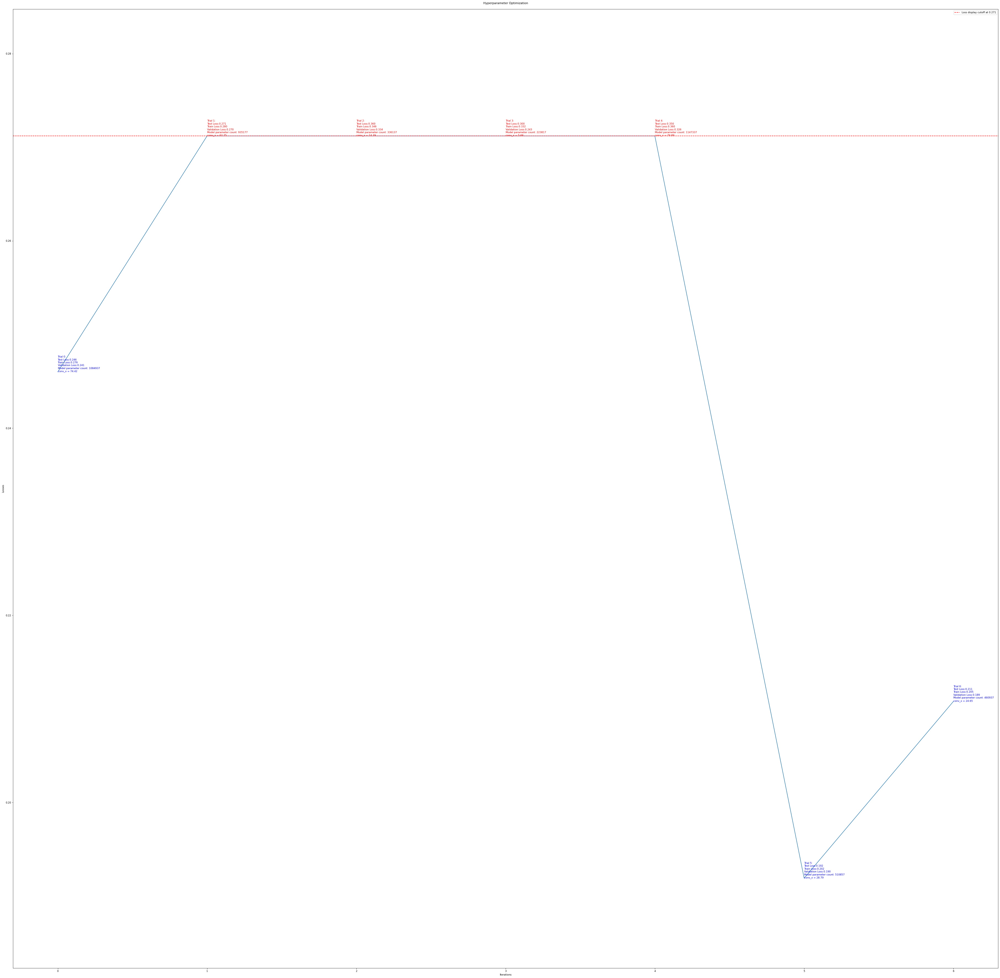

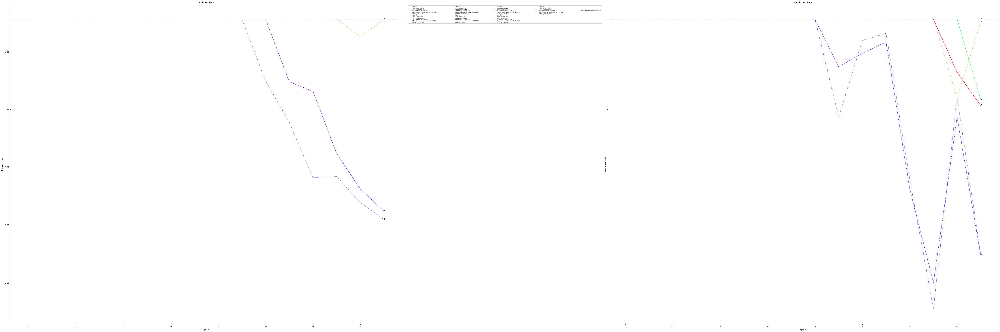

In [5]:
sys.argv = ['train', 
            '--tensors', DATA_DIRECTORY, 
            '--input_tensors', 'ecg_rest', 
            '--output_tensors', 'qrs-duration',
            '--batch_size', '32', 
            '--epochs', '16',  
            '--test_steps', '96',
            '--max_models', '7',
            '--id', 'hyperoptimize_conv_x_ecg_rest_qrs_duration']
args = parse_args()
optimize_conv_x(args)

2020-06-09 11:40:04,394 - logger:25 - INFO - Logging configuration was loaded. Log messages can be found at ./recipes_output/hyperoptimize_optimizer_ecg_rest_heart_rate/log_2020-06-09_11-40_0.log.
2020-06-09 11:40:04,395 - arguments:402 - INFO - Command Line was: 
./scripts/tf.sh train --tensors /mnt/disks/ecg-rest-38k-tensors/2020-03-14/ --input_tensors ecg_rest --output_tensors ventricular-rate --batch_size 32 --epochs 16 --test_steps 96 --max_models 7 --id hyperoptimize_optimizer_ecg_rest_heart_rate

2020-06-09 11:40:04,396 - arguments:403 - INFO - Total TensorMaps: 6538 Arguments are Namespace(activation='relu', aligned_dimension=16, alpha=0.5, anneal_max=2.0, anneal_rate=0.0, anneal_shift=0.0, app_csv=None, b_slice_force=None, balance_csvs=[], batch_size=32, bigquery_credentials_file='/mnt/ml4cvd/projects/jamesp/bigquery/bigquery-viewer-credentials.json', bigquery_dataset='broad-ml4cvd.ukbb7089_r10data', block_size=3, bottleneck_type=<BottleneckType.FlattenRestructure: 1>, cache_s

Layer (type)                    Output Shape         Param #     Connected to                     
input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d_230 (Conv1D)             (None, 5000, 32)     1184        input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation_299 (Activation)     (None, 5000, 32)     0           conv1d_230[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_92 (MaxPooling1D) (None, 2500, 32)     0           activation_299[0][0]             
__________________________________________________________________________________________________
conv1d_231 (Conv1D)             (None, 2500, 32)     3104        max_pooling1d_92[0][0]           
__________

Total params: 198,857                              
Trainable params: 198,857                          
Non-trainable params: 0                            
__________________________________________________________________________________________________
  0%|          | 0/7 [00:00<?, ?it/s, best loss: ?]2020-06-09 11:40:16,087 - tensor_generators:653 - INFO - Found 26002 train, 7572 validation, and 3666 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 11:40:17,734 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 11:40:18,968 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps          
Epoch 1/16                                         
 1/72 [..............................]             
 - ETA: 2:23 - loss: 0.4233 - pearson: 0.3096      
                                                   
 2/72 [..............................]           

 - ETA: 2s - loss: 1052.4260 - pearson: 0.0150     
                                                  
55/72 [=====================>........]             
 - ETA: 1s - loss: 1014.1690 - pearson: 0.0144     
                                                  
56/72 [======================>.......]             
 - ETA: 1s - loss: 996.0666 - pearson: 0.0142      
                                                   
58/72 [=======================>......]             
 - ETA: 1s - loss: 961.7284 - pearson: 0.0137      
                                                   
59/72 [=======================>......]             
 - ETA: 1s - loss: 945.4334 - pearson: 0.0135      
                                                   
61/72 [========================>.....]             
 - ETA: 1s - loss: 914.4470 - pearson: 0.0130      
                                                   
63/72 [=========================>....]             
 - ETA: 0s - loss: 885.4247 - pearson: 0.0126      
              

43/72 [================>.............]             
 - ETA: 2s - loss: 0.3741 - pearson: 0.0000e+00    
                                                   
44/72 [=================>............]             
 - ETA: 1s - loss: 0.3719 - pearson: 0.0000e+00    
                                                   
45/72 [=================>............]             
 - ETA: 1s - loss: 0.3730 - pearson: 0.0000e+00    
                                                   
46/72 [==================>...........]             
 - ETA: 1s - loss: 0.3754 - pearson: 0.0000e+00    
                                                   
47/72 [==================>...........]             
 - ETA: 1s - loss: 0.3730 - pearson: 0.0000e+00    
                                                   
48/72 [===================>..........]             
 - ETA: 1s - loss: 0.3718 - pearson: 0.0000e+00    
                                                   
49/72 [===================>..........]             
 - ETA: 1s -

 - ETA: 3s - loss: 0.3603 - pearson: 0.0000e+00    
                                                   
27/72 [==========>...................]             
 - ETA: 3s - loss: 0.3646 - pearson: 0.0000e+00    
                                                   
28/72 [==========>...................]             
 - ETA: 3s - loss: 0.3667 - pearson: 0.0000e+00    
                                                   
29/72 [===========>..................]             
 - ETA: 3s - loss: 0.3633 - pearson: 0.0000e+00    
                                                   
30/72 [===========>..................]             
 - ETA: 3s - loss: 0.3619 - pearson: 0.0000e+00    
                                                   
31/72 [===========>..................]             
 - ETA: 3s - loss: 0.3609 - pearson: 0.0000e+00    
                                                   
32/72 [============>.................]             
 - ETA: 3s - loss: 0.3622 - pearson: 0.0000e+00    
            

11/72 [===>..........................]             
 - ETA: 3s - loss: 0.3840 - pearson: 0.0000e+00    
                                                   
12/72 [====>.........................]             
 - ETA: 3s - loss: 0.3791 - pearson: 0.0000e+00    
                                                   
13/72 [====>.........................]             
 - ETA: 3s - loss: 0.3713 - pearson: 0.0000e+00    
                                                   
15/72 [=====>........................]             
 - ETA: 3s - loss: 0.3691 - pearson: 0.0000e+00    
                                                   
16/72 [=====>........................]             
 - ETA: 3s - loss: 0.3806 - pearson: 0.0000e+00    
                                                   
17/72 [======>.......................]             
 - ETA: 3s - loss: 0.3754 - pearson: 0.0000e+00    
                                                   
19/72 [======>.......................]             
 - ETA: 2s -

 - ETA: 0s - loss: 0.3596 - pearson: 0.0000e+00    
                                                   
71/72 [============================>.]             
 - ETA: 0s - loss: 0.3573 - pearson: 0.0000e+00    
                                                   
Epoch 00004: val_loss did not improve from 0.32522
                                                   
72/72 [==============================]             
 - 8s 105ms/step - loss: 0.3570 - pearson: 0.0000e+00 - val_loss: 0.3369 - val_pearson: 0.0000e+00

Epoch 5/16                                         
 1/72 [..............................]             
 - ETA: 3s - loss: 0.4672 - pearson: 0.0000e+00    
                                                   
 2/72 [..............................]             
 - ETA: 3s - loss: 0.4472 - pearson: 0.0000e+00    
                                                   
 3/72 [>.............................]             
 - ETA: 4s - loss: 0.3692 - pearson: 0.0000e+00    
                 

                                                   
51/72 [====================>.........]             
 - ETA: 2s - loss: 0.3561 - pearson: 0.0000e+00    
                                                   
52/72 [====================>.........]             
 - ETA: 1s - loss: 0.3556 - pearson: 0.0000e+00    
                                                   
53/72 [=====================>........]             
 - ETA: 1s - loss: 0.3553 - pearson: 0.0000e+00    
                                                   
54/72 [=====================>........]             
 - ETA: 1s - loss: 0.3579 - pearson: 0.0000e+00    
                                                   
55/72 [=====================>........]             
 - ETA: 1s - loss: 0.3564 - pearson: 0.0000e+00    
                                                   
56/72 [======================>.......]             
 - ETA: 1s - loss: 0.3613 - pearson: 0.0000e+00    
                                                   
57/72 [=====

37/72 [==============>...............]             
 - ETA: 3s - loss: 0.3611 - pearson: 0.0000e+00    
                                                   
38/72 [==============>...............]             
 - ETA: 3s - loss: 0.3606 - pearson: 0.0000e+00    
                                                   
40/72 [===============>..............]             
 - ETA: 2s - loss: 0.3609 - pearson: 0.0000e+00    
                                                   
41/72 [================>.............]             
 - ETA: 2s - loss: 0.3613 - pearson: 0.0000e+00    
                                                   
42/72 [================>.............]             
 - ETA: 2s - loss: 0.3600 - pearson: 0.0000e+00    
                                                   
43/72 [================>.............]             
 - ETA: 2s - loss: 0.3609 - pearson: 0.0000e+00    
                                                   
44/72 [=================>............]             
 - ETA: 2s -

 - ETA: 3s - loss: 0.3788 - pearson: 0.0000e+00    
                                                   
22/72 [========>.....................]             
 - ETA: 3s - loss: 0.3763 - pearson: 0.0000e+00    
                                                   
23/72 [========>.....................]             
 - ETA: 3s - loss: 0.3738 - pearson: 0.0000e+00    
                                                   
24/72 [=========>....................]             
 - ETA: 3s - loss: 0.3705 - pearson: 0.0000e+00    
                                                   
25/72 [=========>....................]             
 - ETA: 3s - loss: 0.3671 - pearson: 0.0000e+00    
                                                   
26/72 [=========>....................]             
 - ETA: 3s - loss: 0.3661 - pearson: 0.0000e+00    
                                                   
27/72 [==========>...................]             
 - ETA: 3s - loss: 0.3630 - pearson: 0.0000e+00    
            

Epoch 8/16                                         
 1/72 [..............................]             
 - ETA: 2s - loss: 0.4210 - pearson: 0.0000e+00    
                                                   
 3/72 [>.............................]             
 - ETA: 2s - loss: 0.3468 - pearson: 0.0000e+00    
                                                   
 4/72 [>.............................]             
 - ETA: 3s - loss: 0.3556 - pearson: 0.0000e+00    
                                                   
 5/72 [=>............................]             
 - ETA: 3s - loss: 0.3647 - pearson: 0.0000e+00    
                                                   
 6/72 [=>............................]             
 - ETA: 3s - loss: 0.3583 - pearson: 0.0000e+00    
                                                   
 8/72 [==>...........................]             
 - ETA: 3s - loss: 0.3583 - pearson: 0.0000e+00    
                                                   
 9/72 [==>..

56/72 [======================>.......]             
 - ETA: 1s - loss: 0.3465 - pearson: 0.0000e+00    
                                                   
57/72 [======================>.......]             
 - ETA: 1s - loss: 0.3453 - pearson: 0.0000e+00    
                                                   
58/72 [=======================>......]             
 - ETA: 1s - loss: 0.3471 - pearson: 0.0000e+00    
                                                   
60/72 [========================>.....]             
 - ETA: 1s - loss: 0.3473 - pearson: 0.0000e+00    
                                                   
61/72 [========================>.....]             
 - ETA: 1s - loss: 0.3465 - pearson: 0.0000e+00    
                                                   
62/72 [========================>.....]             
 - ETA: 0s - loss: 0.3448 - pearson: 0.0000e+00    
                                                   
63/72 [=========================>....]             
 - ETA: 0s -

 - ETA: 2s - loss: 0.3576 - pearson: 0.0000e+00    
                                                   
39/72 [===============>..............]             
 - ETA: 2s - loss: 0.3559 - pearson: 0.0000e+00    
                                                   
40/72 [===============>..............]             
 - ETA: 2s - loss: 0.3561 - pearson: 0.0000e+00    
                                                   
41/72 [================>.............]             
 - ETA: 2s - loss: 0.3531 - pearson: 0.0000e+00    
                                                   
42/72 [================>.............]             
 - ETA: 2s - loss: 0.3520 - pearson: 0.0000e+00    
                                                   
43/72 [================>.............]             
 - ETA: 2s - loss: 0.3490 - pearson: 0.0000e+00    
                                                   
44/72 [=================>............]             
 - ETA: 2s - loss: 0.3500 - pearson: 0.0000e+00    
            

                                                   
21/72 [=======>......................]             
 - ETA: 3s - loss: 0.3847 - pearson: 0.0000e+00    
                                                   
22/72 [========>.....................]             
 - ETA: 3s - loss: 0.3908 - pearson: 0.0000e+00    
                                                   
24/72 [=========>....................]             
 - ETA: 2s - loss: 0.3899 - pearson: 0.0000e+00    
                                                   
25/72 [=========>....................]             
 - ETA: 2s - loss: 0.3891 - pearson: 0.0000e+00    
                                                   
26/72 [=========>....................]             
 - ETA: 2s - loss: 0.3844 - pearson: 0.0000e+00    
                                                   
28/72 [==========>...................]             
 - ETA: 2s - loss: 0.3852 - pearson: 0.0000e+00    
                                                   
29/72 [=====

Epoch 11/16                                        
 1/72 [..............................]             
 - ETA: 2s - loss: 0.4181 - pearson: 0.0000e+00    
                                                   
 2/72 [..............................]             
 - ETA: 3s - loss: 0.3409 - pearson: 0.0000e+00    
                                                   
 3/72 [>.............................]             
 - ETA: 4s - loss: 0.3182 - pearson: 0.0000e+00    
                                                   
 4/72 [>.............................]             
 - ETA: 4s - loss: 0.3144 - pearson: 0.0000e+00    
                                                   
 5/72 [=>............................]             
 - ETA: 4s - loss: 0.3085 - pearson: 0.0000e+00    
                                                   
 6/72 [=>............................]             
 - ETA: 4s - loss: 0.2907 - pearson: 0.0000e+00    
                                                   
 7/72 [=>...

60/72 [========================>.....]             
 - ETA: 0s - loss: 0.3481 - pearson: 0.0000e+00    
                                                   
61/72 [========================>.....]             
 - ETA: 0s - loss: 0.3518 - pearson: 0.0000e+00    
                                                   
62/72 [========================>.....]             
 - ETA: 0s - loss: 0.3524 - pearson: 0.0000e+00    
                                                   
63/72 [=========================>....]             
 - ETA: 0s - loss: 0.3523 - pearson: 0.0000e+00    
                                                   
64/72 [=========================>....]             
 - ETA: 0s - loss: 0.3523 - pearson: 0.0000e+00    
                                                   
65/72 [==========================>...]             
 - ETA: 0s - loss: 0.3533 - pearson: 0.0000e+00    
                                                   
66/72 [==========================>...]             
 - ETA: 0s -

                                                   
49/72 [===================>..........]             
 - ETA: 1s - loss: 0.3742 - pearson: 0.0000e+00    
                                                   
51/72 [====================>.........]             
 - ETA: 1s - loss: 0.3776 - pearson: 0.0000e+00    
                                                   
52/72 [====================>.........]             
 - ETA: 1s - loss: 0.3751 - pearson: 0.0000e+00    
                                                   
53/72 [=====================>........]             
 - ETA: 1s - loss: 0.3741 - pearson: 0.0000e+00    
                                                   
54/72 [=====================>........]             
 - ETA: 0s - loss: 0.3740 - pearson: 0.0000e+00    
                                                   
55/72 [=====================>........]             
 - ETA: 0s - loss: 0.3729 - pearson: 0.0000e+00    
                                                   
56/72 [=====

37/72 [==============>...............]             
 - ETA: 1s - loss: 0.3633 - pearson: 0.0000e+00    
                                                   
39/72 [===============>..............]             
 - ETA: 1s - loss: 0.3649 - pearson: 0.0000e+00    
                                                   
40/72 [===============>..............]             
 - ETA: 1s - loss: 0.3610 - pearson: 0.0000e+00    
                                                   
41/72 [================>.............]             
 - ETA: 1s - loss: 0.3582 - pearson: 0.0000e+00    
                                                   
43/72 [================>.............]             
 - ETA: 1s - loss: 0.3569 - pearson: 0.0000e+00    
                                                   
45/72 [=================>............]             
 - ETA: 1s - loss: 0.3638 - pearson: 0.0000e+00    
                                                   
47/72 [==================>...........]             
 - ETA: 1s -

 - ETA: 1s - loss: 0.3446 - pearson: 0.0000e+00    
                                                   
43/72 [================>.............]             
 - ETA: 1s - loss: 0.3474 - pearson: 0.0000e+00    
                                                   
44/72 [=================>............]             
 - ETA: 1s - loss: 0.3473 - pearson: 0.0000e+00    
                                                   
45/72 [=================>............]             
 - ETA: 1s - loss: 0.3490 - pearson: 0.0000e+00    
                                                   
47/72 [==================>...........]             
 - ETA: 1s - loss: 0.3518 - pearson: 0.0000e+00    
                                                   
49/72 [===================>..........]             
 - ETA: 1s - loss: 0.3564 - pearson: 0.0000e+00    
                                                   
50/72 [===================>..........]             
 - ETA: 1s - loss: 0.3543 - pearson: 0.0000e+00    
            

                                                   
48/72 [===================>..........]             
 - ETA: 1s - loss: 0.3839 - pearson: 0.0000e+00    
                                                   
50/72 [===================>..........]             
 - ETA: 1s - loss: 0.3853 - pearson: 0.0000e+00    
                                                   
51/72 [====================>.........]             
 - ETA: 1s - loss: 0.3900 - pearson: 0.0000e+00    
                                                   
52/72 [====================>.........]             
 - ETA: 1s - loss: 0.3902 - pearson: 0.0000e+00    
                                                   
54/72 [=====================>........]             
 - ETA: 0s - loss: 0.3882 - pearson: 0.0000e+00    
                                                   
55/72 [=====================>........]             
 - ETA: 0s - loss: 0.3851 - pearson: 0.0000e+00    
                                                   
57/72 [=====

48/72 [===================>..........]             
 - ETA: 1s - loss: 0.3557 - pearson: 0.0000e+00    
                                                   
50/72 [===================>..........]             
 - ETA: 1s - loss: 0.3551 - pearson: 0.0000e+00    
                                                   
52/72 [====================>.........]             
 - ETA: 0s - loss: 0.3547 - pearson: 0.0000e+00    
                                                   
53/72 [=====================>........]             
 - ETA: 0s - loss: 0.3520 - pearson: 0.0000e+00    
                                                   
55/72 [=====================>........]             
 - ETA: 0s - loss: 0.3523 - pearson: 0.0000e+00    
                                                   
57/72 [======================>.......]             
 - ETA: 0s - loss: 0.3527 - pearson: 0.0000e+00    
                                                   
58/72 [=======================>......]             
 - ETA: 0s -

                                                   
3008/3072 [============================>.]         
 - ETA: 0s - loss: 0.3555 - pearson: 0.0000e+00    
                                                   
3072/3072 [==============================]         
 - 2s 643us/sample - loss: 0.3562 - pearson: 0.0000e+00

  0%|          | 0/7 [01:51<?, ?it/s, best loss: ?]2020-06-09 11:42:05,499 - hyperparameters:103 - INFO - Current architecture:
learning_rate = 0.049639517204316745
optimizer = adam
Current model size: 198857.
2020-06-09 11:42:05,500 - hyperparameters:104 - INFO - Iteration 1 out of maximum 7
Test Loss: 0.356
2020-06-09 11:42:05,501 - tensor_generators:238 - INFO - Stopped 0 workers. 
Continuous TensorMap: VentricularRate has 25990 total examples.
	Mean: 61.84, Standard Deviation: 10.66, Max: 146.00, Min: 31.00
2020-06-09 11:42:05,501 - tensor_generators:238 - INFO - Stopped 0 workers. 
Continuous TensorMap: VentricularRate has 7564 total examples.
	Mean: 62.11, Standard Dev

__________________________________________________________________________________________________
conv1d_244 (Conv1D)             (None, 1250, 24)     2328        max_pooling1d_97[0][0]           
__________________________________________________________________________________________________
activation_316 (Activation)     (None, 1250, 24)     0           conv1d_244[0][0]                 
__________________________________________________________________________________________________
concatenate_146 (Concatenate)   (None, 1250, 56)     0           max_pooling1d_97[0][0]           
                                                                 activation_316[0][0]             
__________________________________________________________________________________________________
conv1d_245 (Conv1D)             (None, 1250, 24)     4056        concatenate_146[0][0]            
__________________________________________________________________________________________________
activation

 - ETA: 21s - loss: 0.4470 - pearson: 0.1048                                  
                                                                             
10/72 [===>..........................]                                        
 - ETA: 19s - loss: 0.4592 - pearson: 0.1112                                  
                                                                             
11/72 [===>..........................]                                        
 - ETA: 17s - loss: 0.4449 - pearson: 0.1108                                  
                                                                             
12/72 [====>.........................]                                        
 - ETA: 16s - loss: 0.4419 - pearson: 0.1015                                  
                                                                             
13/72 [====>.........................]                                        
 - ETA: 15s - loss: 0.4434 - pearson: 0.1008            

                                                                              
47/72 [==================>...........]                                        
 - ETA: 3s - loss: 0.3868 - pearson: 0.0287                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 3s - loss: 0.3830 - pearson: 0.0306                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3845 - pearson: 0.0366                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3862 - pearson: 0.0351                                   
                                                    

10/72 [===>..........................]                                        
 - ETA: 4s - loss: 0.3481 - pearson: 0.0337                                   
                                                                              
11/72 [===>..........................]                                        
 - ETA: 4s - loss: 0.3475 - pearson: 0.0214                                   
                                                                              
12/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.3358 - pearson: 0.0073                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.3314 - pearson: 0.0032                                   
                                                                              
14/72 [====>.........................]              

 - ETA: 1s - loss: 0.3430 - pearson: 0.0112                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3480 - pearson: 0.0142                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3492 - pearson: 0.0169                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3500 - pearson: 0.0133                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3543 - pearson: 0.0166         

                                                                             
10/72 [===>..........................]                                        
 - ETA: 3s - loss: 0.3924 - pearson: -0.0079                                  
                                                                             
11/72 [===>..........................]                                        
 - ETA: 3s - loss: 0.3889 - pearson: 3.5513e-04                               
                                                                              
12/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3882 - pearson: 0.0117                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3790 - pearson: 3.1240e-04                               
                                                      

47/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.3719 - pearson: 0.0373                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3724 - pearson: 0.0336                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3698 - pearson: 0.0293                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3714 - pearson: 0.0271                                   
                                                                              
52/72 [====================>.........]              

                                                                              
12/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3408 - pearson: 0.0837                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3518 - pearson: 0.0798                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3483 - pearson: 0.0766                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3529 - pearson: 0.0577                                   
                                                    

49/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3459 - pearson: 0.0196                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3456 - pearson: 0.0218                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.3469 - pearson: 0.0242                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.3446 - pearson: 0.0198                                   
                                                                              
53/72 [=====================>........]              

                                                                              
13/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.3413 - pearson: -0.0036                                  
                                                                             
14/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.3495 - pearson: -0.0114                                  
                                                                             
15/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.3546 - pearson: 0.0039                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.3565 - pearson: 0.0157                                   
                                                      

50/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3745 - pearson: 0.0733                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.3722 - pearson: 0.0751                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3729 - pearson: 0.0722                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3713 - pearson: 0.0729                                   
                                                                              
54/72 [=====================>........]              

                                                                              
15/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.4002 - pearson: 0.0407                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3945 - pearson: 0.0598                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3854 - pearson: 0.0657                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3779 - pearson: 0.0638                                   
                                                    

52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3437 - pearson: -0.0021                                  
                                                                             
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3456 - pearson: -0.0034                                  
                                                                             
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3459 - pearson: -0.0041                                  
                                                                             
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3439 - pearson: -8.6078e-04                              
                                                                             
56/72 [======================>.......]                  

                                                                              
17/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3551 - pearson: 0.0643                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3565 - pearson: 0.0605                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.3630 - pearson: 0.0633                                   
                                                                              
20/72 [=======>......................]                                        
 - ETA: 4s - loss: 0.3638 - pearson: 0.0647                                   
                                                    

51/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.3452 - pearson: 0.0210                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.3493 - pearson: 0.0208                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3476 - pearson: 0.0139                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3476 - pearson: 0.0107                                   
                                                                              
55/72 [=====================>........]              

                                                                              
16/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3293 - pearson: 0.0280                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3275 - pearson: 0.0166                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3289 - pearson: 0.0087                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3319 - pearson: 0.0174                                   
                                                    

50/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3532 - pearson: 0.0042                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3524 - pearson: 0.0043                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3529 - pearson: 0.0031                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3525 - pearson: 0.0082                                   
                                                                              
54/72 [=====================>........]              

14/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.4386 - pearson: -0.0162                                  
                                                                             
16/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.4483 - pearson: -0.0246                                  
                                                                             
17/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.4367 - pearson: -0.0080                                  
                                                                             
18/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.4299 - pearson: -0.0104                                  
                                                                             
19/72 [======>.......................]                  

 - ETA: 1s - loss: 0.4020 - pearson: 0.0269                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.4012 - pearson: 0.0298                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.4003 - pearson: 0.0278                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.4018 - pearson: 0.0237                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.4003 - pearson: 0.0308         

13/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.3663 - pearson: 0.1012                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.3581 - pearson: 0.1001                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.3509 - pearson: 0.1047                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.3544 - pearson: 0.1103                                   
                                                                              
17/72 [======>.......................]              

 - ETA: 1s - loss: 0.3676 - pearson: 0.0562                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3672 - pearson: 0.0525                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3678 - pearson: 0.0471                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3683 - pearson: 0.0451                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3674 - pearson: 0.0476         

 - ETA: 3s - loss: 0.3357 - pearson: 0.0864                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3507 - pearson: 0.0759                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3567 - pearson: 0.0845                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3469 - pearson: 0.0874                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3394 - pearson: 0.0962         

                                                                              
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3538 - pearson: 0.0831                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3549 - pearson: 0.0826                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3532 - pearson: 0.0836                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3537 - pearson: 0.0871                                   
                                                    

16/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3408 - pearson: 0.0800                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3418 - pearson: 0.0688                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3371 - pearson: 0.0631                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3392 - pearson: 0.0519                                   
                                                                              
20/72 [=======>......................]              

                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3491 - pearson: 0.0782                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3480 - pearson: 0.0814                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 0s - loss: 0.3521 - pearson: 0.0811                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 0s - loss: 0.3532 - pearson: 0.0809                                   
                                                    

 - ETA: 1s - loss: 0.3439 - pearson: 0.0624                                   
                                                                              
32/72 [============>.................]                                        
 - ETA: 1s - loss: 0.3431 - pearson: 0.0570                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 1s - loss: 0.3444 - pearson: 0.0477                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 1s - loss: 0.3473 - pearson: 0.0457                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 1s - loss: 0.3512 - pearson: 0.0461         

 6/72 [=>............................]                                        
 - ETA: 3s - loss: 0.3338 - pearson: 0.0421                                   
                                                                              
 7/72 [=>............................]                                        
 - ETA: 3s - loss: 0.3328 - pearson: 0.0394                                   
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 3s - loss: 0.3363 - pearson: 0.0124                                   
                                                                              
10/72 [===>..........................]                                        
 - ETA: 3s - loss: 0.3591 - pearson: 0.0356                                   
                                                                              
11/72 [===>..........................]              

 - ETA: 0s - loss: 0.3534 - pearson: 0.0500                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.3565 - pearson: 0.0474                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.3553 - pearson: 0.0449                                   
                                                                              
64/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3597 - pearson: 0.0483                                   
                                                                              
65/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3599 - pearson: 0.0469         

 - ETA: 1s - loss: 0.3567 - pearson: -3.5222e-04                              
                                                                             
39/72 [===============>..............]                                        
 - ETA: 1s - loss: 0.3545 - pearson: 0.0038                                   
                                                                              
41/72 [================>.............]                                        
 - ETA: 1s - loss: 0.3551 - pearson: 0.0040                                   
                                                                              
42/72 [================>.............]                                        
 - ETA: 1s - loss: 0.3563 - pearson: 0.0059                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 1s - loss: 0.3553 - pearson: 0.0123          

18/72 [======>.......................]                                        
 - ETA: 2s - loss: 0.3287 - pearson: 0.0234                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 2s - loss: 0.3323 - pearson: 0.0343                                   
                                                                              
20/72 [=======>......................]                                        
 - ETA: 2s - loss: 0.3369 - pearson: 0.0301                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 2s - loss: 0.3453 - pearson: 0.0447                                   
                                                                              
23/72 [========>.....................]              

 - ETA: 0s - loss: 0.3671 - pearson: 0.0480                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3667 - pearson: 0.0484                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3682 - pearson: 0.0447                                   
                                                                              
Epoch 00016: val_loss did not improve from 0.31467
                                                                              
72/72 [==============================]                                        
 - 4s 56ms/step - loss: 0.3676 - pearson: 0.0425 - val_loss: 0.3604 - val_pearson: 0.0417

 14%|█▍        | 1/7 [03:41<11:13, 112.18s/it, best loss: 0.35618149

2624/3072 [========================>.....]                                    
 - ETA: 0s - loss: 0.3602 - pearson: 0.0525                                   
                                                                              
2720/3072 [=========================>....]                                    
 - ETA: 0s - loss: 0.3597 - pearson: 0.0500                                   
                                                                              
2816/3072 [==========================>...]                                    
 - ETA: 0s - loss: 0.3566 - pearson: 0.0486                                   
                                                                              
2912/3072 [===========================>..]                                    
 - ETA: 0s - loss: 0.3548 - pearson: 0.0517                                   
                                                                              
3008/3072 [============================>.]          

__________________________________________________________________________________________________
concatenate_151 (Concatenate)   (None, 2500, 96)     0           max_pooling1d_100[0][0]          
                                                                 activation_326[0][0]             
                                                                 activation_327[0][0]             
__________________________________________________________________________________________________
conv1d_253 (Conv1D)             (None, 2500, 32)     9248        concatenate_151[0][0]            
__________________________________________________________________________________________________
activation_328 (Activation)     (None, 2500, 32)     0           conv1d_253[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_101 (MaxPooling1D (None, 1250, 32)     0           activation_328[0][0]             
__________

 5/72 [=>............................]                                       
 - ETA: 30s - loss: 0.3899 - pearson: -0.0172                                
                                                                             
 6/72 [=>............................]                                       
 - ETA: 26s - loss: 0.3789 - pearson: 0.0078                                 
                                                                            
 7/72 [=>............................]                                       
 - ETA: 23s - loss: 0.3739 - pearson: -0.0018                                
                                                                             
 9/72 [==>...........................]                                       
 - ETA: 18s - loss: 0.3721 - pearson: 0.0144                                 
                                                                            
10/72 [===>..........................]                            

45/72 [=================>............]                                       
 - ETA: 3s - loss: 0.3526 - pearson: 0.0379                                  
                                                                             
46/72 [==================>...........]                                       
 - ETA: 3s - loss: 0.3558 - pearson: 0.0355                                  
                                                                             
48/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3536 - pearson: 0.0404                                  
                                                                             
50/72 [===================>..........]                                       
 - ETA: 2s - loss: 0.3564 - pearson: 0.0394                                  
                                                                             
51/72 [====================>.........]                          

                                                                             
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 0.3708 - pearson: 0.0158                                  
                                                                             
15/72 [=====>........................]                                       
 - ETA: 3s - loss: 0.3740 - pearson: 0.0166                                  
                                                                             
16/72 [=====>........................]                                       
 - ETA: 3s - loss: 0.3724 - pearson: 0.0343                                  
                                                                             
18/72 [======>.......................]                                       
 - ETA: 3s - loss: 0.3735 - pearson: 0.0660                                  
                                                                

                                                                             
54/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3427 - pearson: 0.0978                                  
                                                                             
55/72 [=====================>........]                                       
 - ETA: 1s - loss: 0.3409 - pearson: 0.1035                                  
                                                                             
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.3398 - pearson: 0.1030                                  
                                                                             
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3445 - pearson: 0.1054                                  
                                                                

 - ETA: 3s - loss: 0.4035 - pearson: 0.1154                                  
                                                                             
21/72 [=======>......................]                                       
 - ETA: 3s - loss: 0.4024 - pearson: 0.1065                                  
                                                                             
22/72 [========>.....................]                                       
 - ETA: 3s - loss: 0.3973 - pearson: 0.1095                                  
                                                                             
23/72 [========>.....................]                                       
 - ETA: 3s - loss: 0.3915 - pearson: 0.1147                                  
                                                                             
24/72 [=========>....................]                                       
 - ETA: 3s - loss: 0.3928 - pearson: 0.1269                     

 - ETA: 1s - loss: 0.3616 - pearson: 0.0664                                  
                                                                             
56/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.3619 - pearson: 0.0687                                  
                                                                             
57/72 [======================>.......]                                       
 - ETA: 1s - loss: 0.3592 - pearson: 0.0652                                  
                                                                             
58/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3599 - pearson: 0.0631                                  
                                                                             
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3603 - pearson: 0.0641                     

                                                                             
22/72 [========>.....................]                                       
 - ETA: 4s - loss: 0.3522 - pearson: 0.1192                                  
                                                                             
23/72 [========>.....................]                                       
 - ETA: 4s - loss: 0.3531 - pearson: 0.1121                                  
                                                                             
24/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3520 - pearson: 0.1127                                  
                                                                             
25/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3533 - pearson: 0.1077                                  
                                                                

                                                                             
59/72 [=======================>......]                                       
 - ETA: 1s - loss: 0.3461 - pearson: 0.1050                                  
                                                                             
60/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3442 - pearson: 0.1063                                  
                                                                             
61/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3444 - pearson: 0.1069                                  
                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3452 - pearson: 0.1060                                  
                                                                

23/72 [========>.....................]                                       
 - ETA: 4s - loss: 0.3224 - pearson: 0.1317                                  
                                                                             
24/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3225 - pearson: 0.1230                                  
                                                                             
25/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3308 - pearson: 0.1358                                  
                                                                             
26/72 [=========>....................]                                       
 - ETA: 4s - loss: 0.3282 - pearson: 0.1323                                  
                                                                             
28/72 [==========>...................]                          

61/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3410 - pearson: 0.1724                                  
                                                                             
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3403 - pearson: 0.1767                                  
                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3384 - pearson: 0.1822                                  
                                                                             
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3369 - pearson: 0.1826                                  
                                                                             
65/72 [==========================>...]                          

 - ETA: 4s - loss: 0.3186 - pearson: 0.3031                                  
                                                                             
27/72 [==========>...................]                                       
 - ETA: 3s - loss: 0.3228 - pearson: 0.3070                                  
                                                                             
28/72 [==========>...................]                                       
 - ETA: 3s - loss: 0.3204 - pearson: 0.3042                                  
                                                                             
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.3174 - pearson: 0.3085                                  
                                                                             
30/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.3159 - pearson: 0.3176                     

 - ETA: 1s - loss: 0.3148 - pearson: 0.3906                                  
                                                                             
62/72 [========================>.....]                                       
 - ETA: 1s - loss: 0.3155 - pearson: 0.3949                                  
                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3147 - pearson: 0.3955                                  
                                                                             
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.3128 - pearson: 0.3956                                  
                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.3104 - pearson: 0.3985                     

27/72 [==========>...................]                                       
 - ETA: 2s - loss: 0.2280 - pearson: 0.6275                                  
                                                                             
28/72 [==========>...................]                                       
 - ETA: 2s - loss: 0.2276 - pearson: 0.6264                                  
                                                                             
29/72 [===========>..................]                                       
 - ETA: 2s - loss: 0.2274 - pearson: 0.6281                                  
                                                                             
30/72 [===========>..................]                                       
 - ETA: 2s - loss: 0.2308 - pearson: 0.6281                                  
                                                                             
31/72 [===========>..................]                          

64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.2470 - pearson: 0.6280                                  
                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.2478 - pearson: 0.6273                                  
                                                                             
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.2467 - pearson: 0.6293                                  
                                                                             
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.2469 - pearson: 0.6292                                  
                                                                             
68/72 [===========================>..]                          

                                                                             
27/72 [==========>...................]                                       
 - ETA: 3s - loss: 0.1964 - pearson: 0.7079                                  
                                                                             
28/72 [==========>...................]                                       
 - ETA: 3s - loss: 0.1956 - pearson: 0.7087                                  
                                                                             
29/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.1922 - pearson: 0.7114                                  
                                                                             
30/72 [===========>..................]                                       
 - ETA: 3s - loss: 0.1945 - pearson: 0.7099                                  
                                                                

                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.1772 - pearson: 0.7369                                  
                                                                             
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.1767 - pearson: 0.7380                                  
                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.1764 - pearson: 0.7383                                  
                                                                             
66/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.1759 - pearson: 0.7397                                  
                                                                

 - ETA: 2s - loss: 0.1473 - pearson: 0.7996                                  
                                                                             
31/72 [===========>..................]                                       
 - ETA: 2s - loss: 0.1489 - pearson: 0.7988                                  
                                                                             
32/72 [============>.................]                                       
 - ETA: 2s - loss: 0.1472 - pearson: 0.8017                                  
                                                                             
33/72 [============>.................]                                       
 - ETA: 2s - loss: 0.1481 - pearson: 0.7985                                  
                                                                             
34/72 [=============>................]                                       
 - ETA: 2s - loss: 0.1517 - pearson: 0.7945                     

 - ETA: 0s - loss: 0.1562 - pearson: 0.8010                                  
                                                                             
68/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.1555 - pearson: 0.8016                                  
                                                                             
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.1551 - pearson: 0.8005                                  
                                                                             
70/72 [============================>.]                                       
 - ETA: 0s - loss: 0.1558 - pearson: 0.7993                                  
                                                                             
71/72 [============================>.]                                       
 - ETA: 0s - loss: 0.1550 - pearson: 0.7991                     

34/72 [=============>................]                                       
 - ETA: 2s - loss: 0.1456 - pearson: 0.8007                                  
                                                                             
35/72 [=============>................]                                       
 - ETA: 2s - loss: 0.1454 - pearson: 0.8014                                  
                                                                             
36/72 [==============>...............]                                       
 - ETA: 2s - loss: 0.1455 - pearson: 0.8031                                  
                                                                             
37/72 [==============>...............]                                       
 - ETA: 2s - loss: 0.1462 - pearson: 0.8043                                  
                                                                             
38/72 [==============>...............]                          

                                                                             
Epoch 00010: val_loss improved from 0.14512 to 0.12350, saving model to ./recipes_output/hyperoptimize_optimizer_ecg_rest_heart_rate/plots/architecture_3/architecture_3.h5
                                                                             
72/72 [==============================]                                       
 - 6s 85ms/step - loss: 0.1357 - pearson: 0.8094 - val_loss: 0.1235 - val_pearson: 0.8356

Epoch 11/16                                                                  
 1/72 [..............................]                                       
 - ETA: 3s - loss: 0.0870 - pearson: 0.8730                                  
                                                                             
 3/72 [>.............................]                                       
 - ETA: 4s - loss: 0.0700 - pearson: 0.9075                                  
                                   

 - ETA: 2s - loss: 0.1151 - pearson: 0.8546                                  
                                                                             
38/72 [==============>...............]                                       
 - ETA: 2s - loss: 0.1149 - pearson: 0.8555                                  
                                                                             
39/72 [===============>..............]                                       
 - ETA: 2s - loss: 0.1169 - pearson: 0.8564                                  
                                                                             
40/72 [===============>..............]                                       
 - ETA: 1s - loss: 0.1157 - pearson: 0.8581                                  
                                                                             
41/72 [================>.............]                                       
 - ETA: 1s - loss: 0.1163 - pearson: 0.8562                     

 1/72 [..............................]                                       
 - ETA: 5s - loss: 0.1117 - pearson: 0.8739                                  
                                                                             
 3/72 [>.............................]                                       
 - ETA: 3s - loss: 0.1048 - pearson: 0.8731                                  
                                                                             
 5/72 [=>............................]                                       
 - ETA: 3s - loss: 0.0793 - pearson: 0.8977                                  
                                                                             
 6/72 [=>............................]                                       
 - ETA: 3s - loss: 0.0754 - pearson: 0.9051                                  
                                                                             
 7/72 [=>............................]                          

45/72 [=================>............]                                       
 - ETA: 1s - loss: 0.0864 - pearson: 0.9005                                  
                                                                             
46/72 [==================>...........]                                       
 - ETA: 1s - loss: 0.0899 - pearson: 0.8966                                  
                                                                             
47/72 [==================>...........]                                       
 - ETA: 1s - loss: 0.0911 - pearson: 0.8954                                  
                                                                             
48/72 [===================>..........]                                       
 - ETA: 1s - loss: 0.0905 - pearson: 0.8963                                  
                                                                             
49/72 [===================>..........]                          

13/72 [====>.........................]                                       
 - ETA: 2s - loss: 0.0846 - pearson: 0.9034                                  
                                                                             
14/72 [====>.........................]                                       
 - ETA: 2s - loss: 0.0869 - pearson: 0.9034                                  
                                                                             
16/72 [=====>........................]                                       
 - ETA: 2s - loss: 0.0829 - pearson: 0.9083                                  
                                                                             
17/72 [======>.......................]                                       
 - ETA: 2s - loss: 0.0829 - pearson: 0.9099                                  
                                                                             
18/72 [======>.......................]                          

67/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.0835 - pearson: 0.9060                                  
                                                                             
69/72 [===========================>..]                                       
 - ETA: 0s - loss: 0.0840 - pearson: 0.9039                                  
                                                                             
71/72 [============================>.]                                       
 - ETA: 0s - loss: 0.0831 - pearson: 0.9042                                  
                                                                             
Epoch 00013: val_loss did not improve from 0.08943
                                                                             
72/72 [==============================]                                       
 - 4s 55ms/step - loss: 0.0827 - pearson: 0.9050 - val_loss: 0.0996 - val_pearson: 0.8725



 - ETA: 1s - loss: 0.0708 - pearson: 0.9071                                  
                                                                             
49/72 [===================>..........]                                       
 - ETA: 1s - loss: 0.0717 - pearson: 0.9050                                  
                                                                             
51/72 [====================>.........]                                       
 - ETA: 0s - loss: 0.0708 - pearson: 0.9058                                  
                                                                             
52/72 [====================>.........]                                       
 - ETA: 0s - loss: 0.0708 - pearson: 0.9057                                  
                                                                             
53/72 [=====================>........]                                       
 - ETA: 0s - loss: 0.0707 - pearson: 0.9060                     

32/72 [============>.................]                                       
 - ETA: 1s - loss: 0.0650 - pearson: 0.9153                                  
                                                                             
33/72 [============>.................]                                       
 - ETA: 1s - loss: 0.0667 - pearson: 0.9145                                  
                                                                             
34/72 [=============>................]                                       
 - ETA: 1s - loss: 0.0692 - pearson: 0.9128                                  
                                                                             
36/72 [==============>...............]                                       
 - ETA: 1s - loss: 0.0687 - pearson: 0.9146                                  
                                                                             
37/72 [==============>...............]                          

 - ETA: 3s - loss: 0.0546 - pearson: 0.9298                                  
                                                                             
11/72 [===>..........................]                                       
 - ETA: 3s - loss: 0.0585 - pearson: 0.9281                                  
                                                                             
13/72 [====>.........................]                                       
 - ETA: 3s - loss: 0.0635 - pearson: 0.9156                                  
                                                                             
14/72 [====>.........................]                                       
 - ETA: 3s - loss: 0.0637 - pearson: 0.9176                                  
                                                                             
15/72 [=====>........................]                                       
 - ETA: 3s - loss: 0.0632 - pearson: 0.9202                     

 - ETA: 0s - loss: 0.0595 - pearson: 0.9276                                  
                                                                             
63/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.0591 - pearson: 0.9281                                  
                                                                             
64/72 [=========================>....]                                       
 - ETA: 0s - loss: 0.0591 - pearson: 0.9282                                  
                                                                             
65/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.0588 - pearson: 0.9289                                  
                                                                             
67/72 [==========================>...]                                       
 - ETA: 0s - loss: 0.0578 - pearson: 0.9298                     

 - ETA: 0s - loss: 0.0758 - pearson: 0.9076                                  
                                                                             
2240/3072 [====================>.........]                                   
 - ETA: 0s - loss: 0.0740 - pearson: 0.9090                                  
                                                                             
2336/3072 [=====================>........]                                   
 - ETA: 0s - loss: 0.0728 - pearson: 0.9110                                  
                                                                             
2432/3072 [======================>.......]                                   
 - ETA: 0s - loss: 0.0738 - pearson: 0.9077                                  
                                                                             
2528/3072 [=======================>......]                                   
 - ETA: 0s - loss: 0.0760 - pearson: 0.9050                     

__________________________________________________________________________________________________
conv1d_261 (Conv1D)             (None, 2500, 32)     3104        max_pooling1d_104[0][0]          
__________________________________________________________________________________________________
activation_339 (Activation)     (None, 2500, 32)     0           conv1d_261[0][0]                 
__________________________________________________________________________________________________
concatenate_156 (Concatenate)   (None, 2500, 64)     0           max_pooling1d_104[0][0]          
                                                                 activation_339[0][0]             
__________________________________________________________________________________________________
conv1d_262 (Conv1D)             (None, 2500, 32)     6176        concatenate_156[0][0]            
__________________________________________________________________________________________________
activation

Train for 72 steps, validate for 18 steps                                     
Epoch 1/16                                                                    
 1/72 [..............................]                                        
 - ETA: 2:54 - loss: 0.5686 - pearson: -0.2868                                
                                                                             
 2/72 [..............................]                                        
 - ETA: 1:30 - loss: 0.6536 - pearson: -0.0954                                
                                                                             
 3/72 [>.............................]                                        
 - ETA: 1:01 - loss: 1.3528 - pearson: 0.0194                                 
                                                                              
 4/72 [>.............................]                                        
 - ETA: 46s - loss: 1.1469 - pearson: -0.0675         

                                                                              
37/72 [==============>...............]                                        
 - ETA: 4s - loss: 0.4346 - pearson: 0.0341                                   
                                                                              
38/72 [==============>...............]                                        
 - ETA: 4s - loss: 0.4309 - pearson: 0.0350                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 4s - loss: 0.4288 - pearson: 0.0388                                   
                                                                              
41/72 [================>.............]                                        
 - ETA: 4s - loss: 0.4288 - pearson: 0.0432                                   
                                                    

 1/72 [..............................]                                        
 - ETA: 6s - loss: 0.2002 - pearson: 0.2052                                   
                                                                              
 2/72 [..............................]                                        
 - ETA: 5s - loss: 0.3521 - pearson: 0.1087                                   
                                                                              
 3/72 [>.............................]                                        
 - ETA: 4s - loss: 0.3550 - pearson: 0.0607                                   
                                                                              
 4/72 [>.............................]                                        
 - ETA: 6s - loss: 0.3762 - pearson: 0.1002                                   
                                                                              
 5/72 [=>............................]              

 - ETA: 1s - loss: 0.3627 - pearson: 0.0569                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 1s - loss: 0.3611 - pearson: 0.0564                                   
                                                                              
46/72 [==================>...........]                                        
 - ETA: 1s - loss: 0.3574 - pearson: 0.0516                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 1s - loss: 0.3583 - pearson: 0.0510                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3538 - pearson: 0.0505         

11/72 [===>..........................]                                        
 - ETA: 3s - loss: 0.3268 - pearson: 0.0537                                   
                                                                              
12/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3169 - pearson: 0.0390                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3253 - pearson: 0.0144                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3204 - pearson: 0.0279                                   
                                                                              
15/72 [=====>........................]              

 - ETA: 2s - loss: 0.3536 - pearson: 0.0509                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3584 - pearson: 0.0435                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3585 - pearson: 0.0440                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3610 - pearson: 0.0496                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.3620 - pearson: 0.0434         

12/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3621 - pearson: 0.1175                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3629 - pearson: 0.1156                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3591 - pearson: 0.0862                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3724 - pearson: 0.0606                                   
                                                                              
17/72 [======>.......................]              

 - ETA: 2s - loss: 0.3348 - pearson: 0.0466                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3354 - pearson: 0.0469                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3353 - pearson: 0.0493                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3335 - pearson: 0.0454                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3339 - pearson: 0.0500         

 - ETA: 3s - loss: 0.3470 - pearson: -0.0267                                  
                                                                             
15/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3483 - pearson: -0.0265                                  
                                                                             
16/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3476 - pearson: -0.0374                                  
                                                                             
18/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3634 - pearson: -0.0138                                  
                                                                             
19/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3600 - pearson: -0.0115            

51/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3510 - pearson: -0.0044                                  
                                                                             
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3533 - pearson: -0.0037                                  
                                                                             
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3570 - pearson: -0.0065                                  
                                                                             
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3560 - pearson: -0.0041                                  
                                                                             
55/72 [=====================>........]                  

19/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3452 - pearson: 0.1018                                   
                                                                              
20/72 [=======>......................]                                        
 - ETA: 3s - loss: 0.3405 - pearson: 0.1037                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 3s - loss: 0.3394 - pearson: 0.1063                                   
                                                                              
23/72 [========>.....................]                                        
 - ETA: 3s - loss: 0.3389 - pearson: 0.0930                                   
                                                                              
24/72 [=========>....................]              

 - ETA: 1s - loss: 0.3369 - pearson: 0.0622                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3385 - pearson: 0.0613                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3403 - pearson: 0.0541                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3416 - pearson: 0.0582                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3433 - pearson: 0.0622         

 - ETA: 4s - loss: 0.3601 - pearson: -0.0206                                  
                                                                             
19/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.3616 - pearson: -0.0334                                  
                                                                             
20/72 [=======>......................]                                        
 - ETA: 4s - loss: 0.3644 - pearson: -0.0350                                  
                                                                             
21/72 [=======>......................]                                        
 - ETA: 3s - loss: 0.3704 - pearson: -0.0333                                  
                                                                             
22/72 [========>.....................]                                        
 - ETA: 3s - loss: 0.3718 - pearson: -0.0337            

54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3699 - pearson: 0.0141                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3677 - pearson: 0.0175                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3675 - pearson: 0.0200                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3687 - pearson: 0.0222                                   
                                                                              
58/72 [=======================>......]              

 - ETA: 3s - loss: 0.3830 - pearson: 0.1728                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3737 - pearson: 0.1768                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3763 - pearson: 0.1838                                   
                                                                              
20/72 [=======>......................]                                        
 - ETA: 3s - loss: 0.3717 - pearson: 0.1862                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 3s - loss: 0.3655 - pearson: 0.1834         

                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3750 - pearson: 0.1929                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3743 - pearson: 0.1894                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3750 - pearson: 0.1927                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3753 - pearson: 0.1905                                   
                                                    

 - ETA: 4s - loss: 0.3406 - pearson: 0.2032                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.3442 - pearson: 0.2055                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3502 - pearson: 0.2065                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3437 - pearson: 0.2045                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3502 - pearson: 0.2125         

                                                                              
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3465 - pearson: 0.2861                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3446 - pearson: 0.2930                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3422 - pearson: 0.2982                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3399 - pearson: 0.2975                                   
                                                    

 - ETA: 3s - loss: 0.3226 - pearson: 0.5094                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3381 - pearson: 0.4903                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3304 - pearson: 0.4985                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3320 - pearson: 0.4977                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3288 - pearson: 0.4983         

                                                                              
59/72 [=======================>......]                                        
 - ETA: 0s - loss: 0.2791 - pearson: 0.5696                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.2776 - pearson: 0.5727                                   
                                                                              
61/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.2806 - pearson: 0.5705                                   
                                                                              
63/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.2783 - pearson: 0.5741                                   
                                                    

26/72 [=========>....................]                                        
 - ETA: 2s - loss: 0.1799 - pearson: 0.7391                                   
                                                                              
27/72 [==========>...................]                                        
 - ETA: 2s - loss: 0.1779 - pearson: 0.7391                                   
                                                                              
28/72 [==========>...................]                                        
 - ETA: 2s - loss: 0.1766 - pearson: 0.7424                                   
                                                                              
29/72 [===========>..................]                                        
 - ETA: 2s - loss: 0.1780 - pearson: 0.7405                                   
                                                                              
30/72 [===========>..................]              

 - ETA: 0s - loss: 0.1707 - pearson: 0.7635                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.1709 - pearson: 0.7607                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.1705 - pearson: 0.7609                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.1705 - pearson: 0.7617                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.1701 - pearson: 0.7640         

30/72 [===========>..................]                                        
 - ETA: 2s - loss: 0.1423 - pearson: 0.8106                                   
                                                                              
31/72 [===========>..................]                                        
 - ETA: 2s - loss: 0.1458 - pearson: 0.8053                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 2s - loss: 0.1436 - pearson: 0.8121                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 2s - loss: 0.1437 - pearson: 0.8141                                   
                                                                              
36/72 [==============>...............]              

 - ETA: 3s - loss: 0.1072 - pearson: 0.8675                                   
                                                                              
 7/72 [=>............................]                                        
 - ETA: 3s - loss: 0.1211 - pearson: 0.8614                                   
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 3s - loss: 0.1151 - pearson: 0.8694                                   
                                                                              
 9/72 [==>...........................]                                        
 - ETA: 3s - loss: 0.1165 - pearson: 0.8650                                   
                                                                              
11/72 [===>..........................]                                        
 - ETA: 3s - loss: 0.1200 - pearson: 0.8639         

                                                                              
57/72 [======================>.......]                                        
 - ETA: 0s - loss: 0.1343 - pearson: 0.8390                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 0s - loss: 0.1333 - pearson: 0.8405                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.1328 - pearson: 0.8415                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.1317 - pearson: 0.8428                                   
                                                    

34/72 [=============>................]                                        
 - ETA: 1s - loss: 0.1139 - pearson: 0.8690                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 1s - loss: 0.1122 - pearson: 0.8703                                   
                                                                              
37/72 [==============>...............]                                        
 - ETA: 1s - loss: 0.1109 - pearson: 0.8700                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 1s - loss: 0.1094 - pearson: 0.8730                                   
                                                                              
40/72 [===============>..............]              

 - ETA: 2s - loss: 0.1161 - pearson: 0.8672                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 2s - loss: 0.1175 - pearson: 0.8638                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 2s - loss: 0.1134 - pearson: 0.8720                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 2s - loss: 0.1130 - pearson: 0.8725                                   
                                                                              
20/72 [=======>......................]                                        
 - ETA: 2s - loss: 0.1098 - pearson: 0.8751         

                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.0936 - pearson: 0.8891                                   
                                                                              
Epoch 00015: val_loss did not improve from 0.08714
                                                                              
72/72 [==============================]                                        
 - 4s 53ms/step - loss: 0.0932 - pearson: 0.8893 - val_loss: 0.0985 - val_pearson: 0.8841

Epoch 16/16                                                                   
 1/72 [..............................]                                        
 - ETA: 3s - loss: 0.0955 - pearson: 0.9268                                   
                                                                              
 3/72 [>.............................]                              

 - ETA: 1s - loss: 0.0902 - pearson: 0.8836                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 0s - loss: 0.0889 - pearson: 0.8856                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 0s - loss: 0.0899 - pearson: 0.8844                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 0s - loss: 0.0900 - pearson: 0.8851                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 0s - loss: 0.0914 - pearson: 0.8845         

 - ETA: 1s - loss: 0.0879 - pearson: 0.8993                                   
                                                                              
1600/3072 [==============>...............]                                    
 - ETA: 0s - loss: 0.0864 - pearson: 0.9004                                   
                                                                              
1696/3072 [===============>..............]                                    
 - ETA: 0s - loss: 0.0870 - pearson: 0.8996                                   
                                                                              
1792/3072 [================>.............]                                    
 - ETA: 0s - loss: 0.0858 - pearson: 0.9009                                   
                                                                              
1888/3072 [=================>............]                                    
 - ETA: 0s - loss: 0.0844 - pearson: 0.9027         

Model: "model_27"                                                             
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d_270 (Conv1D)             (None, 5000, 32)     1184        input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation_351 (Activation)     (None, 5000, 32)     0           conv1d_270[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_108 (MaxPooling1D (None, 2500, 32)     0           activation_351[0][0]             
______________________________

output_VentricularRate_continuo (None, 1)            65          activation_362[0][0]             
Total params: 198,857                                                         
Trainable params: 198,857                                                     
Non-trainable params: 0                                                       
__________________________________________________________________________________________________
 57%|█████▋    | 4/7 [07:36<05:40, 113.62s/it, best loss: 0.07400937486090697]2020-06-09 11:47:52,006 - tensor_generators:653 - INFO - Found 26012 train, 7478 validation, and 3750 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 11:47:53,850 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 11:47:55,527 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps                                     
Epoch 1/16             

                                                                              
31/72 [===========>..................]                                        
 - ETA: 8s - loss: 0.3632 - pearson: 0.0439                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 8s - loss: 0.3640 - pearson: 0.0351                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 7s - loss: 0.3634 - pearson: 0.0328                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 7s - loss: 0.3628 - pearson: 0.0246                                   
                                                    

70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3617 - pearson: 0.0456                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3607 - pearson: 0.0484                                   
                                                                              
Epoch 00001: val_loss improved from inf to 0.34060, saving model to ./recipes_output/hyperoptimize_optimizer_ecg_rest_heart_rate/plots/architecture_5/architecture_5.h5
                                                                              
72/72 [==============================]                                        
 - 11s 151ms/step - loss: 0.3600 - pearson: 0.0479 - val_loss: 0.3406 - val_pearson: 0.0102

Epoch 2/16                                                                    
 1/72 [.....................

 - ETA: 2s - loss: 0.3510 - pearson: -0.0488                                  
                                                                             
35/72 [=============>................]                                        
 - ETA: 2s - loss: 0.3498 - pearson: -0.0533                                  
                                                                             
36/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.3512 - pearson: -0.0518                                  
                                                                             
37/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.3541 - pearson: -0.0504                                  
                                                                             
38/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.3571 - pearson: -0.0490            

70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3574 - pearson: -0.0199                                  
                                                                             
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3588 - pearson: -0.0196                                  
                                                                              
Epoch 00002: val_loss did not improve from 0.34060
                                                                             
72/72 [==============================]                                        
 - 6s 85ms/step - loss: 0.3582 - pearson: -0.0193 - val_loss: 0.3788 - val_pearson: -0.0084

Epoch 3/16                                                                    
 1/72 [..............................]                                        
 - ETA: 6s - loss: 0.2767 - pearson: 0.0000e+00                     

                                                                              
32/72 [============>.................]                                        
 - ETA: 3s - loss: 0.3507 - pearson: 0.0029                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 3s - loss: 0.3489 - pearson: 0.0028                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 3s - loss: 0.3490 - pearson: 0.0028                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 3s - loss: 0.3544 - pearson: 0.0027                                   
                                                    

 - ETA: 0s - loss: 0.3632 - pearson: -0.0021                                  
                                                                             
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3644 - pearson: -0.0021                                  
                                                                             
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3639 - pearson: -0.0021                                  
                                                                             
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3638 - pearson: -0.0020                                  
                                                                             
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3632 - pearson: -0.0020            

29/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3358 - pearson: 0.0140                                   
                                                                              
31/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.3399 - pearson: 0.0131                                   
                                                                              
32/72 [============>.................]                                        
 - ETA: 4s - loss: 0.3435 - pearson: 0.0127                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 3s - loss: 0.3421 - pearson: 0.0123                                   
                                                                              
34/72 [=============>................]              

 - ETA: 0s - loss: 0.3532 - pearson: -0.0074                                  
                                                                             
65/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3532 - pearson: -0.0073                                  
                                                                             
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3535 - pearson: -0.0072                                  
                                                                             
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3543 - pearson: -0.0070                                  
                                                                             
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3543 - pearson: -0.0069            

28/72 [==========>...................]                                        
 - ETA: 3s - loss: 0.3590 - pearson: 0.0076                                   
                                                                              
29/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.3555 - pearson: 0.0074                                   
                                                                              
30/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.3516 - pearson: 0.0071                                   
                                                                              
31/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.3486 - pearson: 0.0069                                   
                                                                              
32/72 [============>.................]              

 - ETA: 1s - loss: 0.3542 - pearson: 0.0120                                   
                                                                              
63/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3520 - pearson: 0.0086                                   
                                                                              
64/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3522 - pearson: 0.0083                                   
                                                                              
65/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3516 - pearson: 0.0099                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3555 - pearson: 0.0098         

24/72 [=========>....................]                                        
 - ETA: 3s - loss: 0.4211 - pearson: -0.0018                                  
                                                                             
25/72 [=========>....................]                                        
 - ETA: 3s - loss: 0.4173 - pearson: -0.0017                                  
                                                                             
26/72 [=========>....................]                                        
 - ETA: 3s - loss: 0.4152 - pearson: -0.0017                                  
                                                                             
27/72 [==========>...................]                                        
 - ETA: 3s - loss: 0.4184 - pearson: -0.0016                                  
                                                                             
28/72 [==========>...................]                  

 - ETA: 1s - loss: 0.9296 - pearson: 0.0059                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.9218 - pearson: 0.0058                                   
                                                                              
61/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.9128 - pearson: 0.0057                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.9021 - pearson: 0.0056                                   
                                                                              
63/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.8913 - pearson: -7.5935e-04    

21/72 [=======>......................]                                        
 - ETA: 3s - loss: 0.3301 - pearson: 0.0000e+00                               
                                                                              
22/72 [========>.....................]                                        
 - ETA: 3s - loss: 0.3342 - pearson: 0.0000e+00                               
                                                                              
23/72 [========>.....................]                                        
 - ETA: 3s - loss: 0.3348 - pearson: 0.0000e+00                               
                                                                              
24/72 [=========>....................]                                        
 - ETA: 3s - loss: 0.3330 - pearson: 0.0000e+00                               
                                                                              
25/72 [=========>....................]              

 - ETA: 1s - loss: 0.3535 - pearson: 0.0000e+00                               
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3519 - pearson: 0.0000e+00                               
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3503 - pearson: 0.0000e+00                               
                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3535 - pearson: 0.0000e+00                               
                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3549 - pearson: 0.0000e+00     

19/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3561 - pearson: 0.0000e+00                               
                                                                              
20/72 [=======>......................]                                        
 - ETA: 3s - loss: 0.3536 - pearson: 0.0000e+00                               
                                                                              
21/72 [=======>......................]                                        
 - ETA: 3s - loss: 0.3494 - pearson: 0.0000e+00                               
                                                                              
22/72 [========>.....................]                                        
 - ETA: 3s - loss: 0.3473 - pearson: 0.0000e+00                               
                                                                              
23/72 [========>.....................]              

 - ETA: 1s - loss: 0.3644 - pearson: 0.0000e+00                               
                                                                              
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3663 - pearson: 0.0000e+00                               
                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3672 - pearson: 0.0000e+00                               
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3674 - pearson: 0.0000e+00                               
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3651 - pearson: 0.0000e+00     

15/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.3589 - pearson: 0.0000e+00                               
                                                                              
16/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.3503 - pearson: 0.0000e+00                               
                                                                              
17/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.3562 - pearson: 0.0000e+00                               
                                                                              
18/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.3587 - pearson: 0.0000e+00                               
                                                                              
19/72 [======>.......................]              

 - ETA: 1s - loss: 0.3539 - pearson: 0.0000e+00                               
                                                                              
50/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3545 - pearson: 0.0000e+00                               
                                                                              
51/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3563 - pearson: 0.0000e+00                               
                                                                              
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3559 - pearson: 0.0000e+00                               
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3566 - pearson: 0.0000e+00     

 - ETA: 5s - loss: 0.3601 - pearson: 0.0000e+00                               
                                                                              
11/72 [===>..........................]                                        
 - ETA: 4s - loss: 0.3620 - pearson: 0.0000e+00                               
                                                                              
12/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.3634 - pearson: 0.0000e+00                               
                                                                              
13/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.3701 - pearson: 0.0000e+00                               
                                                                              
14/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.3725 - pearson: 0.0000e+00     

                                                                              
45/72 [=================>............]                                        
 - ETA: 2s - loss: 0.3562 - pearson: 0.0000e+00                               
                                                                              
46/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.3560 - pearson: 0.0000e+00                               
                                                                              
47/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.3555 - pearson: 0.0000e+00                               
                                                                              
48/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3559 - pearson: 0.0000e+00                               
                                                    

 4/72 [>.............................]                                        
 - ETA: 4s - loss: 0.3238 - pearson: 0.0000e+00                               
                                                                              
 5/72 [=>............................]                                        
 - ETA: 6s - loss: 0.3328 - pearson: 0.0000e+00                               
                                                                              
 6/72 [=>............................]                                        
 - ETA: 5s - loss: 0.3380 - pearson: 0.0000e+00                               
                                                                              
 7/72 [=>............................]                                        
 - ETA: 5s - loss: 0.3484 - pearson: 0.0000e+00                               
                                                                              
 8/72 [==>...........................]              

 - ETA: 2s - loss: 0.3553 - pearson: 0.0000e+00                               
                                                                              
39/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.3591 - pearson: 0.0000e+00                               
                                                                              
40/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.3593 - pearson: 0.0000e+00                               
                                                                              
41/72 [================>.............]                                        
 - ETA: 2s - loss: 0.3567 - pearson: 0.0000e+00                               
                                                                              
42/72 [================>.............]                                        
 - ETA: 2s - loss: 0.3549 - pearson: 0.0000e+00     

 - 7s 94ms/step - loss: 0.3540 - pearson: 0.0000e+00 - val_loss: 0.3811 - val_pearson: 0.0000e+00

Epoch 12/16                                                                   
 1/72 [..............................]                                        
 - ETA: 5s - loss: 0.3248 - pearson: 0.0000e+00                               
                                                                              
 2/72 [..............................]                                        
 - ETA: 5s - loss: 0.3672 - pearson: 0.0000e+00                               
                                                                              
 3/72 [>.............................]                                        
 - ETA: 5s - loss: 0.3545 - pearson: 0.0000e+00                               
                                                                              
 4/72 [>.............................]                                        
 - ETA: 4s - loss: 0.3810 - pear

                                                                              
35/72 [=============>................]                                        
 - ETA: 2s - loss: 0.3436 - pearson: 0.0000e+00                               
                                                                              
36/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.3463 - pearson: 0.0000e+00                               
                                                                              
37/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.3438 - pearson: 0.0000e+00                               
                                                                              
38/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.3429 - pearson: 0.0000e+00                               
                                                    

 - ETA: 0s - loss: 0.3415 - pearson: 0.0000e+00                               
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3394 - pearson: 0.0000e+00                               
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3395 - pearson: 0.0000e+00                               
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3396 - pearson: 0.0000e+00                               
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3386 - pearson: 0.0000e+00     

30/72 [===========>..................]                                        
 - ETA: 2s - loss: 0.3503 - pearson: 0.0000e+00                               
                                                                              
31/72 [===========>..................]                                        
 - ETA: 2s - loss: 0.3500 - pearson: 0.0000e+00                               
                                                                              
32/72 [============>.................]                                        
 - ETA: 2s - loss: 0.3484 - pearson: 0.0000e+00                               
                                                                              
33/72 [============>.................]                                        
 - ETA: 2s - loss: 0.3491 - pearson: 0.0000e+00                               
                                                                              
34/72 [=============>................]              

 - ETA: 0s - loss: 0.3513 - pearson: 0.0000e+00                               
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3524 - pearson: 0.0000e+00                               
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3519 - pearson: 0.0000e+00                               
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3510 - pearson: 0.0000e+00                               
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3522 - pearson: 0.0000e+00     

35/72 [=============>................]                                        
 - ETA: 1s - loss: 0.3690 - pearson: 0.0000e+00                               
                                                                              
36/72 [==============>...............]                                        
 - ETA: 1s - loss: 0.3690 - pearson: 0.0000e+00                               
                                                                              
37/72 [==============>...............]                                        
 - ETA: 1s - loss: 0.3677 - pearson: 0.0000e+00                               
                                                                              
39/72 [===============>..............]                                        
 - ETA: 1s - loss: 0.3657 - pearson: 0.0000e+00                               
                                                                              
41/72 [================>.............]              

 - ETA: 3s - loss: 0.3475 - pearson: 0.0000e+00                               
                                                                              
 6/72 [=>............................]                                        
 - ETA: 3s - loss: 0.3445 - pearson: 0.0000e+00                               
                                                                              
 7/72 [=>............................]                                        
 - ETA: 3s - loss: 0.3521 - pearson: 0.0000e+00                               
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 3s - loss: 0.3547 - pearson: 0.0000e+00                               
                                                                              
10/72 [===>..........................]                                        
 - ETA: 3s - loss: 0.3357 - pearson: 0.0000e+00     

                                                                              
52/72 [====================>.........]                                        
 - ETA: 0s - loss: 0.3512 - pearson: 0.0000e+00                               
                                                                              
53/72 [=====================>........]                                        
 - ETA: 0s - loss: 0.3498 - pearson: 0.0000e+00                               
                                                                              
54/72 [=====================>........]                                        
 - ETA: 0s - loss: 0.3476 - pearson: 0.0000e+00                               
                                                                              
55/72 [=====================>........]                                        
 - ETA: 0s - loss: 0.3502 - pearson: 0.0000e+00                               
                                                    

 - ETA: 2s - loss: 0.3610 - pearson: 0.0000e+00                               
                                                                              
24/72 [=========>....................]                                        
 - ETA: 2s - loss: 0.3584 - pearson: 0.0000e+00                               
                                                                              
25/72 [=========>....................]                                        
 - ETA: 2s - loss: 0.3555 - pearson: 0.0000e+00                               
                                                                              
26/72 [=========>....................]                                        
 - ETA: 2s - loss: 0.3537 - pearson: 0.0000e+00                               
                                                                              
27/72 [==========>...................]                                        
 - ETA: 2s - loss: 0.3492 - pearson: 0.0000e+00     

                                                                              
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3460 - pearson: 0.0000e+00                               
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3456 - pearson: 0.0000e+00                               
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3473 - pearson: 0.0000e+00                               
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3493 - pearson: 0.0000e+00                               
                                                    

 - ETA: 0s - loss: 0.3570 - pearson: 0.0000e+00                               
                                                                              
2432/3072 [======================>.......]                                    
 - ETA: 0s - loss: 0.3546 - pearson: 0.0000e+00                               
                                                                              
2528/3072 [=======================>......]                                    
 - ETA: 0s - loss: 0.3594 - pearson: 0.0000e+00                               
                                                                              
2624/3072 [========================>.....]                                    
 - ETA: 0s - loss: 0.3611 - pearson: 0.0000e+00                               
                                                                              
2720/3072 [=========================>....]                                    
 - ETA: 0s - loss: 0.3604 - pearson: 0.0000e+00     

__________________________________________________________________________________________________
concatenate_168 (Concatenate)   (None, 2500, 64)     0           max_pooling1d_112[0][0]          
                                                                 activation_365[0][0]             
__________________________________________________________________________________________________
conv1d_282 (Conv1D)             (None, 2500, 32)     6176        concatenate_168[0][0]            
__________________________________________________________________________________________________
activation_366 (Activation)     (None, 2500, 32)     0           conv1d_282[0][0]                 
__________________________________________________________________________________________________
concatenate_169 (Concatenate)   (None, 2500, 96)     0           max_pooling1d_112[0][0]          
                                                                 activation_365[0][0]             
          

 2/72 [..............................]                                        
 - ETA: 2:57 - loss: 0.2845 - pearson: 0.2240                                 
                                                                              
 3/72 [>.............................]                                        
 - ETA: 1:58 - loss: 0.2805 - pearson: 0.1418                                 
                                                                              
 4/72 [>.............................]                                        
 - ETA: 1:28 - loss: 0.2814 - pearson: 0.1508                                 
                                                                              
 5/72 [=>............................]                                        
 - ETA: 1:11 - loss: 0.3344 - pearson: 0.0821                                 
                                                                              
 6/72 [=>............................]              

                                                                              
37/72 [==============>...............]                                        
 - ETA: 7s - loss: 0.3859 - pearson: 0.0158                                   
                                                                              
38/72 [==============>...............]                                        
 - ETA: 6s - loss: 0.3816 - pearson: 0.0193                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 6s - loss: 0.3806 - pearson: 0.0182                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 6s - loss: 0.3793 - pearson: 0.0161                                   
                                                    

                                                                              
72/72 [==============================]                                        
 - 11s 155ms/step - loss: 0.3724 - pearson: 0.0070 - val_loss: 0.3576 - val_pearson: -0.0724

Epoch 2/16                                                                    
 1/72 [..............................]                                        
 - ETA: 3s - loss: 0.4142 - pearson: -0.3260                                  
                                                                             
 3/72 [>.............................]                                        
 - ETA: 4s - loss: 0.3501 - pearson: -0.0955                                  
                                                                             
 4/72 [>.............................]                                        
 - ETA: 4s - loss: 0.3404 - pearson: -0.0922                                  
                                       

36/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.3643 - pearson: -0.0263                                  
                                                                             
37/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.3650 - pearson: -0.0197                                  
                                                                             
38/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.3676 - pearson: -0.0230                                  
                                                                             
39/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.3663 - pearson: -0.0199                                  
                                                                             
40/72 [===============>..............]                  

                                                                              
Epoch 00002: val_loss did not improve from 0.35759
                                                                              
72/72 [==============================]                                        
 - 7s 93ms/step - loss: 0.3608 - pearson: 0.0022 - val_loss: 0.3615 - val_pearson: 0.0989

Epoch 3/16                                                                    
 1/72 [..............................]                                        
 - ETA: 5s - loss: 0.4370 - pearson: -0.2432                                  
                                                                             
 2/72 [..............................]                                        
 - ETA: 4s - loss: 0.4159 - pearson: -0.0106                                  
                                                                             
 3/72 [>.............................]                                

 - ETA: 3s - loss: 0.3658 - pearson: 0.0202                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 3s - loss: 0.3612 - pearson: 0.0193                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 3s - loss: 0.3591 - pearson: 0.0195                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.3542 - pearson: 0.0278                                   
                                                                              
37/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.3590 - pearson: 0.0227         

                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3599 - pearson: 0.0270                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3593 - pearson: 0.0318                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3596 - pearson: 0.0304                                   
                                                                              
Epoch 00003: val_loss improved from 0.35759 to 0.35441, saving model to ./recipes_output/hyperoptimize_optimizer_ecg_rest_heart_rate/plots/architecture_6/architecture_6.h5
                                      

33/72 [============>.................]                                        
 - ETA: 3s - loss: 0.3490 - pearson: 0.0472                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 3s - loss: 0.3487 - pearson: 0.0485                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 3s - loss: 0.3486 - pearson: 0.0501                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 3s - loss: 0.3489 - pearson: 0.0401                                   
                                                                              
37/72 [==============>...............]              

 - ETA: 0s - loss: 0.3582 - pearson: 0.0434                                   
                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3602 - pearson: 0.0427                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3605 - pearson: 0.0404                                   
                                                                              
Epoch 00004: val_loss improved from 0.35441 to 0.33009, saving model to ./recipes_output/hyperoptimize_optimizer_ecg_rest_heart_rate/plots/architecture_6/architecture_6.h5
                                                                              
72/72 [==============================]                                        
 - 8s 112ms/step - loss: 0.3587 - pear

                                                                              
31/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.3670 - pearson: 0.0204                                   
                                                                              
32/72 [============>.................]                                        
 - ETA: 3s - loss: 0.3696 - pearson: 0.0169                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 3s - loss: 0.3661 - pearson: 0.0260                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 3s - loss: 0.3636 - pearson: 0.0254                                   
                                                    

66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3540 - pearson: 0.0274                                   
                                                                              
67/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3558 - pearson: 0.0266                                   
                                                                              
68/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3546 - pearson: 0.0287                                   
                                                                              
69/72 [===========================>..]                                        
 - ETA: 0s - loss: 0.3550 - pearson: 0.0246                                   
                                                                              
70/72 [============================>.]              

28/72 [==========>...................]                                        
 - ETA: 4s - loss: 0.3565 - pearson: 0.0473                                   
                                                                              
29/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3557 - pearson: 0.0416                                   
                                                                              
30/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3539 - pearson: 0.0439                                   
                                                                              
31/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.3585 - pearson: 0.0355                                   
                                                                              
32/72 [============>.................]              

 - ETA: 1s - loss: 0.3738 - pearson: 0.0277                                   
                                                                              
63/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3725 - pearson: 0.0302                                   
                                                                              
64/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3726 - pearson: 0.0282                                   
                                                                              
65/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3760 - pearson: 0.0273                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3742 - pearson: 0.0272         

24/72 [=========>....................]                                        
 - ETA: 4s - loss: 0.4079 - pearson: -0.0099                                  
                                                                             
25/72 [=========>....................]                                        
 - ETA: 4s - loss: 0.4030 - pearson: -0.0180                                  
                                                                             
26/72 [=========>....................]                                        
 - ETA: 4s - loss: 0.3969 - pearson: -0.0232                                  
                                                                             
27/72 [==========>...................]                                        
 - ETA: 4s - loss: 0.3956 - pearson: -0.0147                                  
                                                                             
28/72 [==========>...................]                  

 - ETA: 1s - loss: 0.3752 - pearson: 0.0276                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3740 - pearson: 0.0342                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3718 - pearson: 0.0361                                   
                                                                              
61/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3734 - pearson: 0.0386                                   
                                                                              
62/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3719 - pearson: 0.0395         

20/72 [=======>......................]                                        
 - ETA: 3s - loss: 0.3426 - pearson: 0.0770                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 3s - loss: 0.3432 - pearson: 0.0593                                   
                                                                              
22/72 [========>.....................]                                        
 - ETA: 3s - loss: 0.3431 - pearson: 0.0486                                   
                                                                              
23/72 [========>.....................]                                        
 - ETA: 3s - loss: 0.3440 - pearson: 0.0419                                   
                                                                              
24/72 [=========>....................]              

 - ETA: 2s - loss: 0.3411 - pearson: 0.0311                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3405 - pearson: 0.0322                                   
                                                                              
56/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3429 - pearson: 0.0383                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3431 - pearson: 0.0332                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3421 - pearson: 0.0358         

16/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.3595 - pearson: 0.1006                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.3530 - pearson: 0.1094                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.3555 - pearson: 0.1150                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 4s - loss: 0.3578 - pearson: 0.1058                                   
                                                                              
20/72 [=======>......................]              

 - ETA: 2s - loss: 0.3452 - pearson: 0.0886                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.3467 - pearson: 0.0924                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3464 - pearson: 0.0954                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3466 - pearson: 0.0957                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3454 - pearson: 0.0977         

                                                                             
13/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3719 - pearson: 4.1631e-04                               
                                                                              
14/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3829 - pearson: 0.0127                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3805 - pearson: 0.0176                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3786 - pearson: 0.0166                                   
                                                     

47/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.3706 - pearson: 0.0655                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3722 - pearson: 0.0609                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3709 - pearson: 0.0659                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3703 - pearson: 0.0641                                   
                                                                              
51/72 [====================>.........]              

 - ETA: 5s - loss: 0.3067 - pearson: 0.0884                                   
                                                                              
 7/72 [=>............................]                                        
 - ETA: 4s - loss: 0.3210 - pearson: 0.0532                                   
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 4s - loss: 0.3245 - pearson: 0.0404                                   
                                                                              
 9/72 [==>...........................]                                        
 - ETA: 4s - loss: 0.3224 - pearson: 0.0708                                   
                                                                              
10/72 [===>..........................]                                        
 - ETA: 4s - loss: 0.3347 - pearson: 0.0700         

                                                                              
42/72 [================>.............]                                        
 - ETA: 2s - loss: 0.3488 - pearson: 0.0747                                   
                                                                              
43/72 [================>.............]                                        
 - ETA: 2s - loss: 0.3491 - pearson: 0.0787                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 2s - loss: 0.3504 - pearson: 0.0785                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 2s - loss: 0.3538 - pearson: 0.0767                                   
                                                    

 - ETA: 5s - loss: 0.3356 - pearson: 0.2362                                   
                                                                              
 4/72 [>.............................]                                        
 - ETA: 6s - loss: 0.3490 - pearson: 0.2274                                   
                                                                              
 5/72 [=>............................]                                        
 - ETA: 5s - loss: 0.3728 - pearson: 0.2290                                   
                                                                              
 6/72 [=>............................]                                        
 - ETA: 5s - loss: 0.3793 - pearson: 0.2025                                   
                                                                              
 7/72 [=>............................]                                        
 - ETA: 5s - loss: 0.3803 - pearson: 0.2094         

                                                                              
38/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.3554 - pearson: 0.0967                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.3549 - pearson: 0.0912                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.3571 - pearson: 0.0900                                   
                                                                              
41/72 [================>.............]                                        
 - ETA: 2s - loss: 0.3561 - pearson: 0.0878                                   
                                                    

 - ETA: 0s - loss: 0.3658 - pearson: 0.0697                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3670 - pearson: 0.0674                                   
                                                                              
Epoch 00012: val_loss did not improve from 0.29305
                                                                              
72/72 [==============================]                                        
 - 6s 80ms/step - loss: 0.3667 - pearson: 0.0690 - val_loss: 0.3489 - val_pearson: 0.1353

Epoch 13/16                                                                   
 1/72 [..............................]                                        
 - ETA: 4s - loss: 0.3307 - pearson: 0.1409                                   
                                                                    

37/72 [==============>...............]                                        
 - ETA: 1s - loss: 0.3744 - pearson: 0.0965                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 1s - loss: 0.3808 - pearson: 0.1057                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 1s - loss: 0.3769 - pearson: 0.1087                                   
                                                                              
41/72 [================>.............]                                        
 - ETA: 1s - loss: 0.3799 - pearson: 0.1073                                   
                                                                              
42/72 [================>.............]              

                                                                             
 4/72 [>.............................]                                        
 - ETA: 3s - loss: 0.4012 - pearson: -0.0073                                  
                                                                             
 5/72 [=>............................]                                        
 - ETA: 3s - loss: 0.3890 - pearson: 0.0235                                   
                                                                              
 6/72 [=>............................]                                        
 - ETA: 3s - loss: 0.3733 - pearson: 0.0227                                   
                                                                              
 7/72 [=>............................]                                        
 - ETA: 4s - loss: 0.3614 - pearson: 0.0495                                   
                                                      

45/72 [=================>............]                                        
 - ETA: 1s - loss: 0.3528 - pearson: 0.1652                                   
                                                                              
46/72 [==================>...........]                                        
 - ETA: 1s - loss: 0.3543 - pearson: 0.1622                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 1s - loss: 0.3523 - pearson: 0.1571                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3501 - pearson: 0.1592                                   
                                                                              
49/72 [===================>..........]              

                                                                              
11/72 [===>..........................]                                        
 - ETA: 3s - loss: 0.3301 - pearson: 0.0931                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3449 - pearson: 0.1043                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3534 - pearson: 0.1144                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3505 - pearson: 0.0986                                   
                                                    

47/72 [==================>...........]                                        
 - ETA: 1s - loss: 0.3536 - pearson: 0.1238                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3547 - pearson: 0.1247                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3532 - pearson: 0.1143                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3521 - pearson: 0.1169                                   
                                                                              
51/72 [====================>.........]              

                                                                              
15/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3659 - pearson: 0.1400                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 2s - loss: 0.3666 - pearson: 0.1221                                   
                                                                              
17/72 [======>.......................]                                        
 - ETA: 2s - loss: 0.3689 - pearson: 0.1248                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 2s - loss: 0.3640 - pearson: 0.1327                                   
                                                    

56/72 [======================>.......]                                        
 - ETA: 0s - loss: 0.3541 - pearson: 0.1677                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 0s - loss: 0.3558 - pearson: 0.1681                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 0s - loss: 0.3558 - pearson: 0.1667                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 0s - loss: 0.3568 - pearson: 0.1695                                   
                                                                              
60/72 [========================>.....]              

                                                                              
1664/3072 [===============>..............]                                    
 - ETA: 0s - loss: 0.3594 - pearson: 0.0399                                   
                                                                              
1760/3072 [================>.............]                                    
 - ETA: 0s - loss: 0.3604 - pearson: 0.0496                                   
                                                                              
1856/3072 [=================>............]                                    
 - ETA: 0s - loss: 0.3583 - pearson: 0.0590                                   
                                                                              
1952/3072 [==================>...........]                                    
 - ETA: 0s - loss: 0.3561 - pearson: 0.0625                                   
                                                    

Model: "model_29"                                                             
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_strip_continuous (InputLa [(None, 5000, 12)]   0                                            
__________________________________________________________________________________________________
conv1d_290 (Conv1D)             (None, 5000, 32)     1184        input_strip_continuous[0][0]     
__________________________________________________________________________________________________
activation_377 (Activation)     (None, 5000, 32)     0           conv1d_290[0][0]                 
__________________________________________________________________________________________________
max_pooling1d_116 (MaxPooling1D (None, 2500, 32)     0           activation_377[0][0]             
______________________________

output_VentricularRate_continuo (None, 1)            65          activation_388[0][0]             
Total params: 198,857                                                         
Trainable params: 198,857                                                     
Non-trainable params: 0                                                       
__________________________________________________________________________________________________
 86%|████████▌ | 6/7 [11:43<01:58, 118.80s/it, best loss: 0.07400937486090697]2020-06-09 11:51:58,632 - tensor_generators:653 - INFO - Found 26206 train, 7418 validation, and 3616 testing tensors at: /mnt/disks/ecg-rest-38k-tensors/2020-03-14/
2020-06-09 11:52:00,640 - tensor_generators:151 - INFO - Started 8 train workers with cache size 0.438 GB.
2020-06-09 11:52:01,825 - tensor_generators:151 - INFO - Started 4 validation workers with cache size 0.438 GB.
Train for 72 steps, validate for 18 steps                                     
Epoch 1/16             

                                                                              
32/72 [============>.................]                                        
 - ETA: 5s - loss: 0.3615 - pearson: 0.0446                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 5s - loss: 0.3619 - pearson: 0.0518                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 4s - loss: 0.3626 - pearson: 0.0506                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 4s - loss: 0.3624 - pearson: 0.0516                                   
                                                    

72/72 [==============================]                                        
 - 8s 118ms/step - loss: 0.3639 - pearson: 0.0466 - val_loss: 0.3950 - val_pearson: -0.0094

Epoch 2/16                                                                    
 1/72 [..............................]                                        
 - ETA: 7s - loss: 0.3549 - pearson: 0.0912                                   
                                                                              
 2/72 [..............................]                                        
 - ETA: 6s - loss: 0.3981 - pearson: 0.0917                                   
                                                                              
 3/72 [>.............................]                                        
 - ETA: 5s - loss: 0.3877 - pearson: 0.1055                                   
                                                                              
 5/72 [=>............................]

 - ETA: 2s - loss: 0.3609 - pearson: 0.0510                                   
                                                                              
43/72 [================>.............]                                        
 - ETA: 2s - loss: 0.3601 - pearson: 0.0529                                   
                                                                              
44/72 [=================>............]                                        
 - ETA: 2s - loss: 0.3604 - pearson: 0.0479                                   
                                                                              
45/72 [=================>............]                                        
 - ETA: 2s - loss: 0.3608 - pearson: 0.0475                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 1s - loss: 0.3617 - pearson: 0.0374         

                                                                              
 6/72 [=>............................]                                        
 - ETA: 5s - loss: 0.3826 - pearson: 0.0198                                   
                                                                              
 7/72 [=>............................]                                        
 - ETA: 5s - loss: 0.3864 - pearson: 0.0334                                   
                                                                              
 8/72 [==>...........................]                                        
 - ETA: 5s - loss: 0.3962 - pearson: 0.0191                                   
                                                                              
 9/72 [==>...........................]                                        
 - ETA: 4s - loss: 0.3849 - pearson: 0.0045                                   
                                                    

46/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.3694 - pearson: 0.0350                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 2s - loss: 0.3706 - pearson: 0.0385                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3708 - pearson: 0.0342                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3680 - pearson: 0.0409                                   
                                                                              
50/72 [===================>..........]              

 - ETA: 4s - loss: 0.3411 - pearson: 2.0477e-04                               
                                                                              
13/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.3428 - pearson: 0.0085                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 4s - loss: 0.3338 - pearson: 0.0332                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.3419 - pearson: 0.0323                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 4s - loss: 0.3373 - pearson: 0.0343         

                                                                              
49/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3594 - pearson: 0.0546                                   
                                                                              
50/72 [===================>..........]                                        
 - ETA: 2s - loss: 0.3579 - pearson: 0.0584                                   
                                                                              
51/72 [====================>.........]                                        
 - ETA: 2s - loss: 0.3571 - pearson: 0.0641                                   
                                                                              
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3572 - pearson: 0.0662                                   
                                                    

 - ETA: 3s - loss: 0.3619 - pearson: 0.0870                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3628 - pearson: 0.0930                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3570 - pearson: 0.0925                                   
                                                                              
20/72 [=======>......................]                                        
 - ETA: 3s - loss: 0.3603 - pearson: 0.1054                                   
                                                                              
21/72 [=======>......................]                                        
 - ETA: 3s - loss: 0.3615 - pearson: 0.1133         

                                                                              
52/72 [====================>.........]                                        
 - ETA: 1s - loss: 0.3641 - pearson: 0.0988                                   
                                                                              
53/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3660 - pearson: 0.0994                                   
                                                                              
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3646 - pearson: 0.1040                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3647 - pearson: 0.1081                                   
                                                    

 - ETA: 3s - loss: 0.3619 - pearson: 0.0261                                   
                                                                              
18/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3633 - pearson: 0.0351                                   
                                                                              
19/72 [======>.......................]                                        
 - ETA: 3s - loss: 0.3604 - pearson: 0.0281                                   
                                                                              
20/72 [=======>......................]                                        
 - ETA: 3s - loss: 0.3587 - pearson: 0.0322                                   
                                                                              
22/72 [========>.....................]                                        
 - ETA: 3s - loss: 0.3542 - pearson: 0.0311         

                                                                              
54/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3426 - pearson: 0.0611                                   
                                                                              
55/72 [=====================>........]                                        
 - ETA: 1s - loss: 0.3423 - pearson: 0.0569                                   
                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3420 - pearson: 0.0571                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3410 - pearson: 0.0575                                   
                                                    

 - ETA: 4s - loss: 0.3554 - pearson: 0.1365                                   
                                                                              
22/72 [========>.....................]                                        
 - ETA: 4s - loss: 0.3497 - pearson: 0.1384                                   
                                                                              
24/72 [=========>....................]                                        
 - ETA: 3s - loss: 0.3532 - pearson: 0.1383                                   
                                                                              
25/72 [=========>....................]                                        
 - ETA: 3s - loss: 0.3489 - pearson: 0.1310                                   
                                                                              
26/72 [=========>....................]                                        
 - ETA: 3s - loss: 0.3543 - pearson: 0.1231         

                                                                              
57/72 [======================>.......]                                        
 - ETA: 1s - loss: 0.3674 - pearson: 0.0907                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3709 - pearson: 0.0924                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 1s - loss: 0.3701 - pearson: 0.0905                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 1s - loss: 0.3699 - pearson: 0.0886                                   
                                                    

 - ETA: 3s - loss: 0.3469 - pearson: 0.0566                                   
                                                                              
27/72 [==========>...................]                                        
 - ETA: 3s - loss: 0.3449 - pearson: 0.0463                                   
                                                                              
28/72 [==========>...................]                                        
 - ETA: 3s - loss: 0.3469 - pearson: 0.0492                                   
                                                                              
29/72 [===========>..................]                                        
 - ETA: 4s - loss: 0.3466 - pearson: 0.0457                                   
                                                                              
30/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.3480 - pearson: 0.0407         

                                                                              
63/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3588 - pearson: 0.0664                                   
                                                                              
64/72 [=========================>....]                                        
 - ETA: 0s - loss: 0.3592 - pearson: 0.0663                                   
                                                                              
65/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3570 - pearson: 0.0653                                   
                                                                              
66/72 [==========================>...]                                        
 - ETA: 0s - loss: 0.3564 - pearson: 0.0637                                   
                                                    

 - ETA: 3s - loss: 0.3393 - pearson: 0.1018                                   
                                                                              
29/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.3413 - pearson: 0.0961                                   
                                                                              
30/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.3433 - pearson: 0.0971                                   
                                                                              
31/72 [===========>..................]                                        
 - ETA: 3s - loss: 0.3419 - pearson: 0.0967                                   
                                                                              
32/72 [============>.................]                                        
 - ETA: 2s - loss: 0.3429 - pearson: 0.0957         

                                                                              
70/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3573 - pearson: 0.0886                                   
                                                                              
71/72 [============================>.]                                        
 - ETA: 0s - loss: 0.3562 - pearson: 0.0877                                   
                                                                              
Epoch 00009: val_loss did not improve from 0.32165
                                                                              
72/72 [==============================]                                        
 - 7s 93ms/step - loss: 0.3575 - pearson: 0.0831 - val_loss: 0.3323 - val_pearson: 0.0358

Epoch 10/16                                                                   
 1/72 [..............................]                              

 - ETA: 2s - loss: 0.3713 - pearson: 0.0711                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 2s - loss: 0.3761 - pearson: 0.0644                                   
                                                                              
35/72 [=============>................]                                        
 - ETA: 2s - loss: 0.3751 - pearson: 0.0636                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.3760 - pearson: 0.0617                                   
                                                                              
37/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.3730 - pearson: 0.0647         

 86%|████████▌ | 6/7 [13:04<01:58, 118.80s/it, best loss: 0.07400937486090697]2020-06-09 11:53:18,157 - tensor_generators:232 - INFO - 
!!!!>~~~~~~~~~~~~ validation_worker completed true epoch 1 ~~~~~~~~~~~~<!!!!
Aggregated information string:
	Generator looped & shuffled over 7418 paths. Epoch: 1
	7418 tensors were presented.
	0 paths were skipped because they previously failed.
	The following errors were raised:
		[ValueError: TensorMap VentricularRate failed range check.] - 4
	
Continuous TensorMap: VentricularRate has 7414 total examples.
	Mean: 61.98, Standard Deviation: 10.61, Max: 128.00, Min: 32.00
                                                                              
Epoch 00010: val_loss did not improve from 0.32165
                                                                              
72/72 [==============================]                                        
 - 7s 94ms/step - loss: 0.3637 - pearson: 0.0737 - val_loss: 0.3824 - val_pearson: 0.0151

Epoch 1

38/72 [==============>...............]                                        
 - ETA: 2s - loss: 0.3602 - pearson: 0.1100                                   
                                                                              
39/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.3620 - pearson: 0.1086                                   
                                                                              
40/72 [===============>..............]                                        
 - ETA: 2s - loss: 0.3645 - pearson: 0.1089                                   
                                                                              
41/72 [================>.............]                                        
 - ETA: 2s - loss: 0.3655 - pearson: 0.1135                                   
                                                                              
43/72 [================>.............]              

 3/72 [>.............................]                                        
 - ETA: 4s - loss: 0.3370 - pearson: 0.0258                                   
                                                                              
 4/72 [>.............................]                                        
 - ETA: 4s - loss: 0.3362 - pearson: 0.0456                                   
                                                                              
 5/72 [=>............................]                                        
 - ETA: 4s - loss: 0.3435 - pearson: 0.0863                                   
                                                                              
 6/72 [=>............................]                                        
 - ETA: 4s - loss: 0.3427 - pearson: 0.0620                                   
                                                                              
 7/72 [=>............................]              

 - ETA: 1s - loss: 0.3541 - pearson: 0.0732                                   
                                                                              
46/72 [==================>...........]                                        
 - ETA: 1s - loss: 0.3523 - pearson: 0.0693                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 1s - loss: 0.3532 - pearson: 0.0721                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3534 - pearson: 0.0710                                   
                                                                              
49/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3519 - pearson: 0.0775         

11/72 [===>..........................]                                        
 - ETA: 3s - loss: 0.3526 - pearson: 0.1583                                   
                                                                              
13/72 [====>.........................]                                        
 - ETA: 2s - loss: 0.3748 - pearson: 0.1600                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 2s - loss: 0.3725 - pearson: 0.1573                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 2s - loss: 0.3712 - pearson: 0.1297                                   
                                                                              
16/72 [=====>........................]              

                                                                              
56/72 [======================>.......]                                        
 - ETA: 0s - loss: 0.3592 - pearson: 0.1228                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 0s - loss: 0.3567 - pearson: 0.1166                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.3558 - pearson: 0.1123                                   
                                                                              
61/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.3567 - pearson: 0.1102                                   
                                                    

 - ETA: 2s - loss: 0.3628 - pearson: 0.0994                                   
                                                                              
31/72 [===========>..................]                                        
 - ETA: 2s - loss: 0.3647 - pearson: 0.0958                                   
                                                                              
33/72 [============>.................]                                        
 - ETA: 2s - loss: 0.3629 - pearson: 0.1098                                   
                                                                              
34/72 [=============>................]                                        
 - ETA: 1s - loss: 0.3632 - pearson: 0.1128                                   
                                                                              
36/72 [==============>...............]                                        
 - ETA: 1s - loss: 0.3589 - pearson: 0.1146         

 - 4s 61ms/step - loss: 0.3530 - pearson: 0.0861 - val_loss: 0.3667 - val_pearson: -0.0159

Epoch 15/16                                                                   
 1/72 [..............................]                                        
 - ETA: 3s - loss: 0.3603 - pearson: -0.1334                                  
                                                                             
 3/72 [>.............................]                                        
 - ETA: 3s - loss: 0.3797 - pearson: 0.0463                                   
                                                                              
 4/72 [>.............................]                                        
 - ETA: 3s - loss: 0.3827 - pearson: 0.1067                                   
                                                                              
 5/72 [=>............................]                                        
 - ETA: 3s - loss: 0.3795 - pearson: 0.1

                                                                              
45/72 [=================>............]                                        
 - ETA: 1s - loss: 0.3796 - pearson: 0.1089                                   
                                                                              
46/72 [==================>...........]                                        
 - ETA: 1s - loss: 0.3792 - pearson: 0.1043                                   
                                                                              
47/72 [==================>...........]                                        
 - ETA: 1s - loss: 0.3815 - pearson: 0.0984                                   
                                                                              
48/72 [===================>..........]                                        
 - ETA: 1s - loss: 0.3811 - pearson: 0.0942                                   
                                                    

 - ETA: 3s - loss: 0.3648 - pearson: 0.0214                                   
                                                                              
12/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3583 - pearson: 0.0125                                   
                                                                              
14/72 [====>.........................]                                        
 - ETA: 3s - loss: 0.3625 - pearson: 0.0343                                   
                                                                              
15/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3553 - pearson: 0.0285                                   
                                                                              
16/72 [=====>........................]                                        
 - ETA: 3s - loss: 0.3665 - pearson: 0.0274         

                                                                              
57/72 [======================>.......]                                        
 - ETA: 0s - loss: 0.3558 - pearson: 0.0433                                   
                                                                              
58/72 [=======================>......]                                        
 - ETA: 0s - loss: 0.3552 - pearson: 0.0401                                   
                                                                              
59/72 [=======================>......]                                        
 - ETA: 0s - loss: 0.3551 - pearson: 0.0406                                   
                                                                              
60/72 [========================>.....]                                        
 - ETA: 0s - loss: 0.3554 - pearson: 0.0379                                   
                                                    

 - ETA: 1s - loss: 0.3597 - pearson: 0.0434                                   
                                                                              
1760/3072 [================>.............]                                    
 - ETA: 0s - loss: 0.3615 - pearson: 0.0425                                   
                                                                              
1856/3072 [=================>............]                                    
 - ETA: 0s - loss: 0.3594 - pearson: 0.0581                                   
                                                                              
1952/3072 [==================>...........]                                    
 - ETA: 0s - loss: 0.3571 - pearson: 0.0594                                   
                                                                              
2048/3072 [===================>..........]                                    
 - ETA: 0s - loss: 0.3577 - pearson: 0.0565         

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

<Figure size 1152x1152 with 0 Axes>

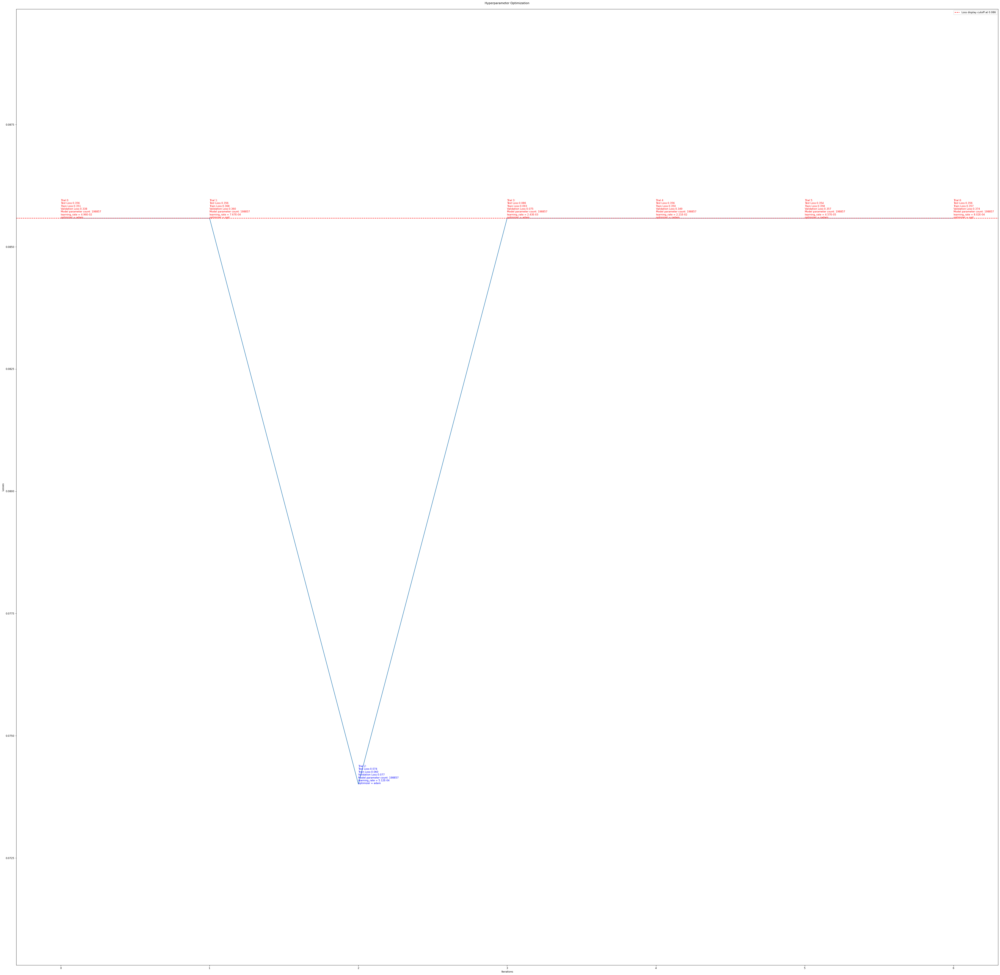

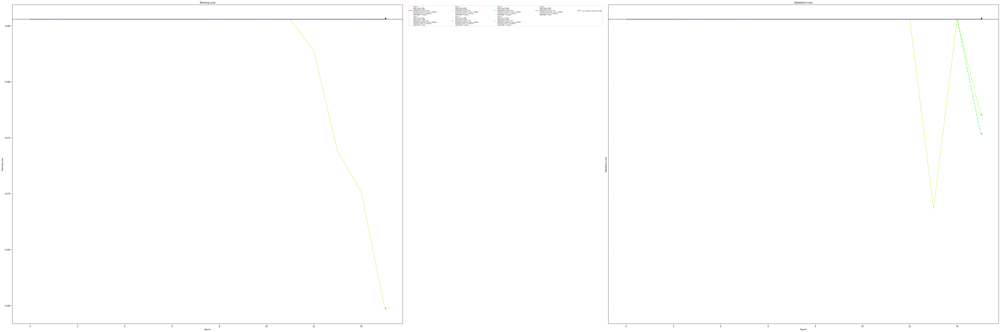

In [6]:
sys.argv = ['train', 
            '--tensors', DATA_DIRECTORY, 
            '--input_tensors', 'ecg_rest', 
            '--output_tensors', 'ventricular-rate',
            '--batch_size', '32', 
            '--epochs', '16',  
            '--test_steps', '96',
            '--max_models', '7',
            '--id', 'hyperoptimize_optimizer_ecg_rest_heart_rate']
args = parse_args()
optimize_optimizer(args)